<a href="https://colab.research.google.com/github/vgarcialopezm/ABC-SMC/blob/main/cancer_inference_ABCSMC_CN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:

import numpy as np
from scipy.stats import norm, uniform, multivariate_normal
from scipy.optimize import minimize
from scipy.special import logsumexp
import sys,ast
from math import exp
from math import log
from random import choices,seed,random
from tqdm import tqdm
#import p_tqdm
from functools import partial
import os
import matplotlib.pyplot as plt
from numpy import exp

epsilons=[400.0,350.0,300.0,250.0,200.0,150.0,125.0,115.0,105.0] #,100.0,94.0,90.0,87.0]
#epsilons=[50000.0,40000.0,30000.0,25000.0,20000]
#epsilons=[16.0,12.0,11.8,11.3,10.6,7.1,5.2]

parametros=[1,1]#1,1]
print(type(parametros))

params_tumor = [ # list of parameters used in the lotka volterra model 
    {'name' : 'Dn', 'lower_limit':0.01,'upper_limit':10.0},# growing rate of prey in absence of repressor
    {'name' : 'Dc','lower_limit':10.0,'upper_limit':150.0},#susceptibility of prey 
    {'name' : 'am','lower_limit':20000.0,'upper_limit':29000.0},# extinction rate of predator
    {'name' : 'k1','lower_limit':0.0001,'upper_limit':10.0000},
    {'name' : 'betaf','lower_limit':1.0,'upper_limit':50.0}
   # {'name' : 'nu','lower_limit':0.00001,'upper_limit':0.001}
]

<class 'list'>


In [8]:
handler=open('doblaredia3.txt')

FileNotFoundError: ignored

In [14]:
datos = np.loadtxt('doblaredia3.txt', delimiter=',')


OSError: ignored

In [4]:
print(datos)

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

In [13]:
datosdia6=np.loadtxt('datosdia6.txt', delimiter=',')


OSError: ignored

# Nueva sección

In [76]:

taup=4800   #*deltat  #*deltat
beta1=2.5
a3H0=0.0085
d1=0.2
a0=0.45185
a1=0.51
a2=1
d2=0.1
e2f=1
#am=22446.951
beta=0.4980
#value of p6/p3 set to 1
p6p3=1
#c critico
# Calculate the value of c_cr using the parameters above and the expression given in the document
#ccr=1-1/beta1*np.log(1/a3H0*(a1+(a2*d2/d1*e2f)*(1-1/(1-a0))))
ccr=1.0-((1.0/beta1)*np.log((1/a3H0)*(a1+((a2*d2)/(d1*e2f))*(1-1/(1-a0/((p6p3)*(p6p3)))))));
#Calculate a(G1/S) using the parameter values above
# aG1S=am*(c/ccr-1)**(-beta)
#aG1S=2e+04
nu=0.00001097

#Let's apply Newton Raphson method in order to obtain the values of lambda given in the document (it will be named lam)
x0=0.001
max_iter=20
tolerance=0.000001

# #Expression of the function to obtain the value of lambda
# f=lambda lam:taup/2-(exp(-(lam+nu)*aG1S)/(lam+nu+1/taup))
  
# #Fist derivative of th previos function 
# Df=lambda lam:(exp(-(lam+nu)*aG1S)*(-aG1S*(lam+nu+1/taup)-1))/(lam+nu+1/taup)**2



In [61]:
def newton_raps(c,am,nu):
    #print('c',c)
    if c>ccr:
      aG1S=am*(c/ccr-1)**(-beta)
    else:
      aG1S=10000000
    #print(aG1S)
    #print('ag1s',aG1S)
    #Expression of the function to obtain the value of lambda
    f=lambda lam:log(taup)-log(2)+lam*aG1S+nu*aG1S+log(lam+nu+1/taup)
  
    #Fist derivative of th previos function 
    Df=lambda lam: aG1S+1/(lam+nu+1/taup)
    #tabla = []
    section = abs(2*tolerance)
    xi = x0
    while (section>=tolerance):
        xnew = xi - f(xi)/Df(xi)
        section  = abs(xnew-xi)
        #tabla.append([xi,xnew,section])
        xi = xnew
    return xi
#xi=newton_raps(c)


In [62]:
def newton_rapsi(c,am,nu):
    #print('c',c)
        if c>ccr and c<0.78:
            aG1S=am*((c/ccr)-1)**(-beta)
        #else: 
        #  aG1S=10000000
            f=lambda lam:log(taup)-log(2)+lam*aG1S+nu*aG1S+log(lam+nu+1/taup)
  
    #Fist derivative of th previos function 
            Df=lambda lam: aG1S+1/(lam+nu+1/taup)
    #tabla = []
        
            
            section = abs(2*tolerance)
            xi = x0
            while (section>=tolerance):
                xnew = xi - f(xi)/Df(xi)
            #print('xi',xi)
                section  = abs(xnew-xi)
            #print('section',section)
        #tabla.append([xi,xnew,section])
                xi = xnew
        elif c>0.78:
           xi=ccr*c
        else:
            xi=-0.65
        return xi
#xi=newton_raps(c)


In [63]:
#spatial grid
L=191
dx=0.4819 #0.4819 #J/(L)
J=dx*L
#x_grid = np.array([l*dx for l in range(J)])
x_grid=np.linspace(0,J,L)
#L=np.size(x_grid)
#time grid
T=3 #3 #final time (3 days)
N=1000 #300  #501  #NUMBER OF TIME STEPS
dt=T/(N) #time step (it is almost every 130 secs. 2 minutes approximately)

#t_grid = np.array([t*dt for t in range(N)])
t_grid=np.linspace(0,T,N)
#n=np.array(100 for k in range(L))
#System parameters
delta=dx**2/dt
#2.446347282384288
#111.86992687185797
#18511.269877994026
#D_n=4.07944 #2.446347282384288  #2.#*delta
#D_c=109.02  #109.13154630#60 #*delta
#sigma_u=D_n*dt/(dx**2)
#sigma_v=D_c*dt/(dx**2)
#k1=1.45773318
k2=0.0942
#c=0.1
#beta_f=49.33  #THIS PARAMETER IS GIVEN, IT IS NOT NECESSARY TO ESTIMATE IT

In [27]:

x_grid

array([ 0.        ,  0.48443632,  0.96887263,  1.45330895,  1.93774526,
        2.42218158,  2.90661789,  3.39105421,  3.87549053,  4.35992684,
        4.84436316,  5.32879947,  5.81323579,  6.29767211,  6.78210842,
        7.26654474,  7.75098105,  8.23541737,  8.71985368,  9.20429   ,
        9.68872632, 10.17316263, 10.65759895, 11.14203526, 11.62647158,
       12.11090789, 12.59534421, 13.07978053, 13.56421684, 14.04865316,
       14.53308947, 15.01752579, 15.50196211, 15.98639842, 16.47083474,
       16.95527105, 17.43970737, 17.92414368, 18.40858   , 18.89301632,
       19.37745263, 19.86188895, 20.34632526, 20.83076158, 21.31519789,
       21.79963421, 22.28407053, 22.76850684, 23.25294316, 23.73737947,
       24.22181579, 24.70625211, 25.19068842, 25.67512474, 26.15956105,
       26.64399737, 27.12843368, 27.61287   , 28.09730632, 28.58174263,
       29.06617895, 29.55061526, 30.03505158, 30.51948789, 31.00392421,
       31.48836053, 31.97279684, 32.45723316, 32.94166947, 33.42

[24.163 27.358 31.633 34.039 38.274 39.835 39.934 39.934 39.934 39.93
 38.204 35.829 35.525 38.566 41.504 45.336 48.705 48.323 47.075 46.095
 45.96  45.572 45.572 44.509 42.632 41.07  42.676 47.939 51.679 56.57
 59.239 56.762 53.897 48.094 48.937 50.442 52.776 51.723 52.528 51.906
 53.35  56.461 58.991 62.004 62.772 61.928 59.891 55.457 51.743 51.684
 53.494 57.034 58.348 53.571 53.199 55.779 53.923 51.947 52.075 53.672
 55.238 55.238 55.635 55.609 53.82  51.8   51.759 53.189 54.875 57.224
 59.054 58.528 54.97  52.806 51.211 51.211 51.575 53.309 51.622 50.17
 49.054 48.3   48.794 48.794 48.37  47.989 48.489 49.332 49.6   50.827
 51.862 52.705 52.822 52.822 51.216 51.211 51.356 52.822 52.97  53.441
 53.046 54.152 55.538 56.044 56.795 57.654 57.654 57.654 57.127 56.284
 56.044 56.044 54.686 53.    52.822 49.653 47.989 48.114 49.92  52.702
 55.766 57.654 57.403 57.138 56.673 55.238 55.641 56.484 56.37  55.527
 54.684 53.84  56.567 61.616 64.604 64.16  61.754 60.05  58.785 57.833
 59.266 5

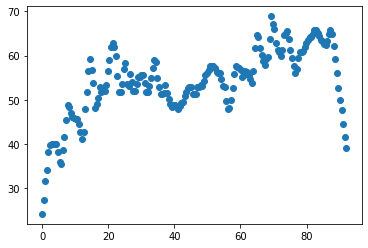

In [64]:
#Initial value for population
#U = np.array([100 for i in range(0,L)])
U = datos #np.array([100 for i in range (0,L)])
#U = np.array([4259.0 for i in range(0,L)]) #lo que ha puedto pilar
print(U)

#c_est=np.array(D_c*beta_f/(J*(k1*U+k2)))
#c_est=D_c*beta_f/(L*(k1*np.mean(U)+k2))

#Initial value for oxygen concentration
#V = np.array([c_est for i in range (0,L)])
#V = np.array([4.82 for i in range(0,L)])
#V=c_est
#V = np.array([10 for i in range(0,L)])  #lo que ha puesto pilar
#print(V)

#graphic of the initial population and oxygen concentration
#fig,axs = plt.subplots(1)
#axs[0].plot(x_grid,U)
#axs[1].plot(x_grid,V,'o')
#axs[2].plot(x_grid,U,x_grid,V)
plt.plot(x_grid, U,'o')
plt.show()
# plt.ylabel('population')
# 
# plt.plot(x_grid, V)
# plt.show()

#pyplot.plot(x_grid, U)
#pyplot.plot(x_grid, V)
#pyplot.show()


In [11]:
fu=lambda lamda_vect, Ui: lamda_vect*Ui

#aux=np.zeros(L)
#aux[-1]= 4*dx*beta_f*sigma_v
#aux[0]= 4*dx*betaf*sigma_v
g=lambda Ui,Vi,k1: -k1*(Ui*Vi)-k2*Vi   #+aux

In [12]:
def euler_expl(fu,g,betaf,Dn,Dc,a_m,U,L,k1):
    
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    #Initial value for oxygen concentration
    V = np.array([c_est for i in range (0,L)])
    sigma_u=Dn*dt/(dx**2)
    #print(sigma_u)
    sigma_v=Dc*dt/dx**2 #Dc*dt/(dx**2)
    #print(sigma_v)
    aux=np.zeros(L)
    aux[-1]= 2*dx*betaf*sigma_v
    #pob=np.zeros([N,L])
    #oxi=np.zeros([N,L])
    lamda_vect=np.zeros(L)
    #pob[0,:]=U
    #print(pob[0,:])
    #oxi[0,:]=V
    

    aux[-1]= 2.*dx*betaf*sigma_v
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2.*sigma_u], -1) +\
      np.diagflat([1.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    #print(A_n)

    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2.*sigma_v], -1) +\
      np.diagflat([1.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    #print(A_c)
    
    
    
    for ti in range(N):
        lamda_vect=np.zeros(L)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m)
            lamda_vect[i]=xi #np.longfloat(xi)
        #print(lamda_vect)
        #print('step',ti)
        rhsU=U+dt*fu(lamda_vect,U)
        U_new = np.linalg.solve(A_n, rhsU)
        #print('U',U_new)
        rhsV=V+dt*g(U,V,k1)  +aux
        V_new = np.linalg.solve(A_c,rhsV)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        #V_new = np.linalg.inv(A_c)@rhsV
        #print('V',V_new)
        V = V_new
        U = U_new
    
    return U,V 





In [82]:
def crank_nic(fu,g,Dn,Dc,a_m,U,L,k1,betaf):
    sigma_u=Dn*dt/(dx**2)
    sigma_v=Dc*dt/(dx**2)
    c_est=Dc*betaf/(L*(k1*np.mean(U)+k2))
    aux=np.zeros(L)
    aux[-1]= 4*dx*betaf*sigma_v
    
    V = np.array([c_est for i in range (0,L)])
    aux=np.zeros(L)
    aux[-1]= 4*dx*betaf*sigma_v
    #Matrices for Crank Nicholson in equation of population of cells
    A_n = np.diagflat([-sigma_u for i in range(L-2)]+[-2*sigma_u], -1) +\
      np.diagflat([2.+2.*sigma_u for i in range(L)]) +\
      np.diagflat([-2.*sigma_u]+[-sigma_u for i in range(L-2)], 1)
    
    B_n = np.diagflat([sigma_u for i in range(L-2)]+[2.*sigma_u], -1) +\
      np.diagflat([2.-2.*sigma_u for i in range(L)]) +\
      np.diagflat([2.*sigma_u]+[sigma_u for i in range(L-2)], 1)
    #Matrices for Crank Nicholson in equation of oxygen
    A_c = np.diagflat([-sigma_v for i in range(L-2)]+[-2*sigma_v], -1) +\
      np.diagflat([2.+2.*sigma_v for i in range(L)]) +\
      np.diagflat([-2.*sigma_v]+[-sigma_v for i in range(L-2)], 1)
    
    B_c = np.diagflat([sigma_v for i in range(L-2)]+[2.*sigma_v], -1) +\
      np.diagflat([2.-2.*sigma_v for i in range(L)]) +\
      np.diagflat([2.*sigma_v]+[sigma_v for i in range(L-2)], 1)
    
    lamda_vect=np.zeros(L)
    for i in range(L):
        xi=newton_rapsi(V[i],a_m,nu)
        lamda_vect[i]=xi #np.longfloat(xi)
    
    for ti in range(1,N):
        #print('step',ti)
        U_new = np.linalg.solve(A_n, (B_n @ U + dt*fu(lamda_vect,U)))
        V_new = np.linalg.solve(A_c, (B_c@V +dt*g(U,V,k1)+aux))
        lamda_vect=np.zeros(L)
        V = V_new
        #print(V_new)
        for i in range(L):
            xi=newton_rapsi(V[i],a_m,nu)
            lamda_vect[i]=np.longfloat(xi)
        #print(lamda_vect)
        U = U_new
        #print(U_new)
    #print(V_new)
    return U,V 




In [19]:
print(datosdia6)

[  9.363   9.363  10.17   10.179  10.179  10.179  10.179  10.179  10.179
  10.179  10.179  10.847  11.81   11.81   11.81   11.81   11.81   11.81
  11.81   11.81   11.811  11.81   11.81   11.81   11.81   11.811  11.81
  11.81   11.81   11.811  11.81   12.091  12.625  12.625  12.625  12.625
  13.097  13.441  13.989  14.256  14.881  15.072  15.072  15.811  15.887
  15.887  15.072  15.148  15.887  15.887  16.078  16.703  16.437  16.192
  16.703  17.084  17.519  17.976  18.334  18.334  18.334  18.334  18.334
  18.334  18.334  19.858  19.965  19.92   18.334  18.334  18.334  18.685
  19.965  19.965  19.965  20.293  21.147  21.596  21.596  21.596  21.596
  21.596  22.191  23.678  24.043  24.752  24.859  24.859  24.859  24.859
  24.943  25.674  25.835  26.688  27.305  27.855  28.937  28.586  28.121
  28.548  29.867  31.575  32.199  31.619  31.383  32.039  32.199  32.199
  30.658  31.376  32.292  34.645  34.645  34.645  35.013  36.277  35.757
  34.645  34.982  35.835  37.101  38.358  38.235  37.

En estas gráficas de abajo parece que la población crece más en el lateral dónde hay más oxígeno, pero muy poco, además hacrecido la población del lado izquierdo respecto de la inicial, cuando debería haber bajado....

In [ ]:
def add_noise(mu,sigma,data):
    noise=np.random.normal(mu,sigma)
    data_noise=data+noise
    return data_noise


In [14]:
def euc_dist(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        z=np.array((data1 - data2)**2)
        distance = np.sum(z)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    elif np.isnan(distance):
        distance=100000
        return distance
    else:
        return distance


In [15]:
def euc_disti(data1, data2):
    if np.shape(data1) != np.shape(data2):
        print ("\n the dimensions of the datasets are different (%s v.s. %s)\n" % (len(data1), len(data2)))
        sys.exit()
    else:
        distance = np.linalg.norm(data1 - data2)
        #print('dist',data1 - data2)

    if distance < 0:
        return [None]
    else:
        return distance


In [16]:
def prior():
### Generate a random parameter inside the limits stablished. The shape of the distribution can be changed if required
    prior = []
    for ipar,par in enumerate(params_tumor):
        prior.append(uniform.rvs(loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])) #par['upper_limit']))
        
       
    return prior


In [17]:
#function that given the values of the parameters, calculates the 

def evaluate_prev_pru(params):
    print('parameters',params)
    l=len(params)
    prior = 1
    for ipar,par in enumerate(params_tumor):
    #for i in range(l):
        prior *= uniform.pdf(params[ipar],loc = par['lower_limit'],
                                 scale = par['upper_limit']-par['lower_limit'])
        if prior==0:
            break   
      #  print('params i', params[i])
       # print('prior',prior)
    return prior


In [18]:
#function that, given a list of parameters sampled, perturbs it by applying a multivariate normal kernel
def perturb(listaprev,s):
    #print(listaprev)
    lista=np.asarray(listaprev) #.tolist()
    #mean_vec=np.mean(lista)
    cov_matrix=2.0*np.cov(lista.T)  #the covariance matrix for the multivariate normal perturbation kernel is given by this expression
    kernel=multivariate_normal(cov=cov_matrix)
    pert=s+kernel.rvs() # here we obtain the list of perturbed parameters
    pertur=pert.tolist()
    return pertur


In [19]:



#function that gives the denominator used to calculate the weights of every particle.
def weighting(i,j,N,sam,wei,sampre):
     denom=0
     #ker=1
     samprev=np.asarray(sampre)
     cov_matrix=2.0*np.cov(samprev.T)
     kernel=multivariate_normal(cov=cov_matrix)
     for k in range(N):
            #print('sample i j',type(sam[k]),sam[k])
           # print('sample i-1,j',type(sampre[k]),sampre[k])
            sampre[k]=np.array(sampre[k])
            #print('sampre',sampre[k])
            #cov_matrix=2.0*np.cov((sampre[k]).T)  #the covariance matrix for the multivariate normal perturbation kernel is given by this expression
            #print('cov',cov_matrix)
            #kernel=multivariate_normal(cov=cov_matrix)
            # print('wei',wei[i-1,k])
            #print('sam[j]',sam[j])
            #print('sampre[k]',sampre[k])
            ker=kernel.pdf(sam[j]-sampre[k])
            #print('ker',ker)
            #kerne=np.prod(ker)  #here we are obtaining the joint probability of the parameter vector obtained when applying the kernel
            denom+=wei[k]*ker #kerne
            #print('kernel',kernel.cdf(sam[k]-sampre[k]))
     #print('den',denom)      
     return denom


    


In [20]:
#function used to normalize the weights
def normalize(wei):
    #normalized=wei/np.linalg.norm(wei)
    normalized=wei/np.sum(wei)
    return normalized  



In [94]:
def principal(epsilons,listaparametros,N,data1):
   # accepted_distances = np.loadtxt('smc/distances_{}_{}_{}_{}.out'.format(model,sto,gamma,prior_label))
    T=len(epsilons)
    weight=np.zeros((T,N),float)
    dist=np.zeros((T,N),float)
    sample=np.zeros((T,N),list)
    #X0=[Ui,Vi]
    #t=np.linspace(0.,10,10)
    for i in range(T):
        count=0
        counti=0
        label=i
        print("SMC step with target distance: {}".format(epsilons[i]))
        if i==0:
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    sample[i,j]=prior()
                    #sample[i,j]=np.array(prior())
                    sample[i,j]=np.asarray(sample[i,j])
                    print(sample[i,j][0])
                    print(sample[i,j][1])
                    print(sample[i,j][2])
                    print(sample[i,j][3])
                    print(sample[i,j][4])
                    #print(sample[i,j][5])
                    data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T#,sample[i,j][5])).T
                    print('oxigeno',data2[:,1])
                    data2=np.array(data2[:,0])
                    print('data2',data2)
                    print('data1',data1)
                    #print('data2',data2)
                    #data2=np.array(data2, dtype=np.float64)
                    dist[i,j]=euc_disti(data1,data2)
                    print('distcondata2',dist[i,j])
                    plt.plot(x_grid,datosdia6,'o')
                    plt.plot(x_grid,data2)
                    plt.show()
                count+=1
                print(count)
       
        else:
        
            for j in range (N):
                dist[i,j]=epsilons[i]+1
                while dist[i,j]>epsilons[i]:
                    seed()
                    np.random.seed()
                    choose = choices(sample[i-1,:], weights = weight[i-1,:],k=1)[0] # select a point from the previous sample
                    sample[i,j]=choose
                    #print("before perturb",type(sample[i,j]))
                    #print("before perturb",list(sample[i-1,:]))
                    sample[i,j] = perturb(list(sample[i-1,:]),sample[i,j]) # and perturb it
                    print("after perturb", sample[i,j])
                    #print("after perturb", type(sample[i,j]))
                    evaluation=evaluate_prev_pru(sample[i,j]) 
                    if evaluation>0:
                        data2= np.array(crank_nic(fu,g,sample[i,j][0],sample[i,j][1],sample[i,j][2],U,L,sample[i,j][3],sample[i,j][4])).T #,sample[i,j][5])).T
                        print('oxigeno',data2[:,1])
                        data2=np.array(data2[:,0])
                        print('data2',data2)
                        print('data1',data1)
                        dist[i,j]=euc_disti(data1,data2)
                        print('distendata2',dist[i,j])
                        plt.plot(x_grid,datosdia6,'o')
                        plt.plot(x_grid,data2)
                        plt.show()
                counti+=1
                print(counti)
        for j in range(N):
            if i==0:
                weight[i,j]=1
               # print(weight[i,j])
            else:
                denom=weighting(i,j,N,sample[i,:],weight[i-1,:],list(sample[i-1,:]))
                weight[i,j]=evaluate_prev_pru(sample[i,j])/denom
        #print('weight[i,:]',weight[i,:])
        if i!=0:
           weight[i,:]=normalize(weight[i,:])
           #print('weight[i,:] normalized',weight[i,:])
        #pars = np.loadtxt('smc_van/pars_{}.out'.format(i))
        #weights = np.loadtxt('smc_van/weights_{}.out'.format(i))
        #np.savetxt('smc_van/pars_{}.out'.format(i), sample[T-1,:])
        #np.savetxt('smc_van/weights_{}.out'.format(i), weight[T-1,:])
      #  np.savetxt('smc/distances_{}.out'.format(label), accepted_distances)
    #print('sample',sample[T-1,N-1])
    #print('weight',weight[T-1])
    #print('dist',dist[T-1])
    return sample, weight, dist,data2


SMC step with target distance: 400.0
9.34402357092645
85.76547556322362
20641.895310340326
8.228336825420635
43.84633270443777
oxigeno [1.53407790e-40 1.68965053e-40 2.18792328e-40 3.13004030e-40
 4.70753444e-40 7.24182312e-40 1.12507403e-39 1.75562213e-39
 2.74561195e-39 4.29970465e-39 6.74072094e-39 1.05783435e-38
 1.66182918e-38 2.61360595e-38 4.11538153e-38 6.48824217e-38
 1.02428149e-37 1.61924383e-37 2.56346740e-37 4.06428808e-37
 6.45353003e-37 1.02630853e-36 1.63468657e-36 2.60778576e-36
 4.16669684e-36 6.66796206e-36 1.06873804e-35 1.71561272e-35
 2.75821007e-35 4.44102557e-35 7.16098020e-35 1.15632035e-34
 1.86974155e-34 3.02734602e-34 4.90791795e-34 7.96642414e-34
 1.29459896e-33 2.10613593e-33 3.42996303e-33 5.59134277e-33
 9.12299561e-33 1.48978635e-32 2.43470203e-32 3.98173952e-32
 6.51590734e-32 1.06689547e-31 1.74776827e-31 2.86438416e-31
 4.69607467e-31 7.70134337e-31 1.26327491e-30 2.07253578e-30
 3.40057806e-30 5.57987795e-30 9.15574318e-30 1.50222934e-29
 2.46450973

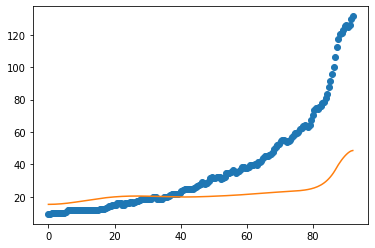

1
8.805085073685614
98.88768524720835
23193.48798762116
0.2623204574654219
19.790330995361387
oxigeno [1.13417006e-06 1.13405729e-06 1.13372649e-06 1.13320021e-06
 1.13251606e-06 1.13172679e-06 1.13090039e-06 1.13012022e-06
 1.12948518e-06 1.12911002e-06 1.12912559e-06 1.12967934e-06
 1.13093577e-06 1.13307713e-06 1.13630421e-06 1.14083727e-06
 1.14691718e-06 1.15480681e-06 1.16479254e-06 1.17718615e-06
 1.19232688e-06 1.21058385e-06 1.23235882e-06 1.25808925e-06
 1.28825187e-06 1.32336651e-06 1.36400058e-06 1.41077388e-06
 1.46436409e-06 1.52551279e-06 1.59503209e-06 1.67381201e-06
 1.76282862e-06 1.86315289e-06 1.97596060e-06 2.10254302e-06
 2.24431878e-06 2.40284676e-06 2.57984034e-06 2.77718282e-06
 2.99694442e-06 3.24140082e-06 3.51305338e-06 3.81465124e-06
 4.14921546e-06 4.52006537e-06 4.93084722e-06 5.38556561e-06
 5.88861752e-06 6.44482962e-06 7.05949881e-06 7.73843641e-06
 8.48801633e-06 9.31522751e-06 1.02277310e-05 1.12339223e-05
 1.23429987e-05 1.35650335e-05 1.49110558e-0

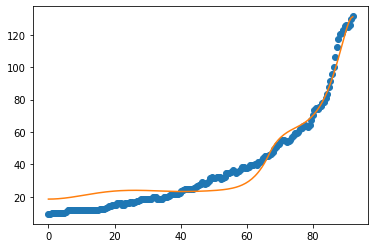

2
8.65105776339475
116.98533279932091
23399.46550766483
8.642300937433372
34.533340194538255
oxigeno [1.69288413e-35 1.82078759e-35 2.22385360e-35 2.96313466e-35
 4.15081243e-35 5.96758261e-35 8.69077800e-35 1.27377589e-34
 1.87316023e-34 2.75998059e-34 4.07222277e-34 6.01527502e-34
 8.89516429e-34 1.31684478e-33 1.95172077e-33 2.89619406e-33
 4.30317417e-33 6.40212333e-33 9.53790198e-33 1.42295831e-32
 2.12596248e-32 3.18092547e-32 4.76642849e-32 7.15283953e-32
 1.07500587e-31 1.61803688e-31 2.43897173e-31 3.68178846e-31
 5.56589618e-31 8.42604465e-31 1.27735266e-30 1.93901107e-30
 2.94723202e-30 4.48531937e-30 6.83433579e-30 1.04255899e-29
 1.59214489e-29 2.43398169e-29 3.72459459e-29 5.70480908e-29
 8.74533434e-29 1.34170558e-28 2.05994450e-28 3.16477684e-28
 4.86509909e-28 7.48295547e-28 1.15148841e-27 1.77265141e-27
 2.72984099e-27 4.20508779e-27 6.47903938e-27 9.98432955e-27
 1.53877695e-26 2.37168806e-26 3.65546158e-26 5.63388920e-26
 8.68231483e-26 1.33784176e-25 2.06109464e-25

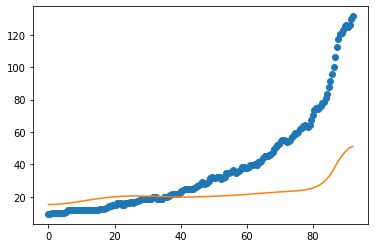

3
0.32714558224070794
66.81078111115869
27027.79674037052
0.8851455953978976
46.88731095360549
oxigeno [2.26321923e-16 2.28794124e-16 2.36352209e-16 2.49418702e-16
 2.68693213e-16 2.95151091e-16 3.30050307e-16 3.74951888e-16
 4.31759129e-16 5.02782316e-16 5.90839378e-16 6.99406374e-16
 8.32830349e-16 9.96606801e-16 1.19770719e-15 1.44492882e-15
 1.74924233e-15 2.12413467e-15 2.58598063e-15 3.15450355e-15
 3.85339461e-15 4.71115601e-15 5.76224764e-15 7.04867776e-15
 8.62227291e-15 1.05479127e-14 1.29079124e-14 1.58074402e-14
 1.93804758e-14 2.37956260e-14 2.92613701e-14 3.60311103e-14
 4.44095264e-14 5.47625999e-14 6.75336522e-14 8.32667137e-14
 1.02637315e-13 1.26490677e-13 1.55888779e-13 1.92169676e-13
 2.37022716e-13 2.92580601e-13 3.61524569e-13 4.47195328e-13
 5.53703507e-13 6.86042115e-13 8.50219476e-13 1.05344911e-12
 1.30444200e-12 1.61383471e-12 1.99475222e-12 2.46346796e-12
 3.04011773e-12 3.74946695e-12 4.62179899e-12 5.69404322e-12
 7.01127253e-12 8.62868762e-12 1.06141780e-

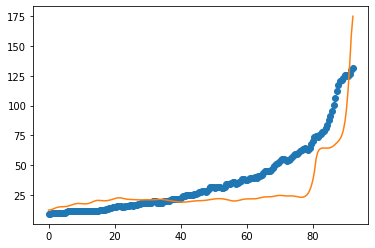

4
9.649184011320923
133.5989645882745
27712.33229552173
0.2458868419984257
43.399273722317325
oxigeno [5.05015575e-06 5.05509505e-06 5.06995404e-06 5.09485621e-06
 5.13000803e-06 5.17569992e-06 5.23230772e-06 5.30029446e-06
 5.38021268e-06 5.47270716e-06 5.57851819e-06 5.69848529e-06
 5.83355161e-06 5.98476882e-06 6.15330265e-06 6.34043919e-06
 6.54759182e-06 6.77630896e-06 7.02828269e-06 7.30535811e-06
 7.60954386e-06 7.94302342e-06 8.30816762e-06 8.70754826e-06
 9.14395288e-06 9.62040087e-06 1.01401609e-05 1.07067698e-05
 1.13240530e-05 1.19961465e-05 1.27275207e-05 1.35230060e-05
 1.43878201e-05 1.53275977e-05 1.63484221e-05 1.74568592e-05
 1.86599942e-05 1.99654701e-05 2.13815297e-05 2.29170604e-05
 2.45816416e-05 2.63855959e-05 2.83400434e-05 3.04569602e-05
 3.27492400e-05 3.52307609e-05 3.79164557e-05 4.08223878e-05
 4.39658312e-05 4.73653571e-05 5.10409249e-05 5.50139805e-05
 5.93075603e-05 6.39464026e-05 6.89570664e-05 7.43680581e-05
 8.02099668e-05 8.65156084e-05 9.33201802e-0

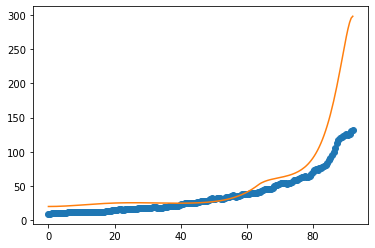

1.7417955412004877
35.15582175612988
21272.576961342194
2.0363520290347603
24.33803303787387
oxigeno [4.15134971e-34 4.45868741e-34 5.42981055e-34 7.22014683e-34
 1.01171303e-33 1.45879156e-33 2.13573769e-33 3.15299394e-33
 4.67764981e-33 6.96191839e-33 1.03864121e-32 1.55258722e-32
 2.32490266e-32 3.48703814e-32 5.23811082e-32 7.88004957e-32
 1.18711330e-31 1.79076150e-31 2.70482921e-31 4.09048083e-31
 6.19327371e-31 9.38773859e-31 1.42457470e-30 2.16414960e-30
 3.29129216e-30 5.01101470e-30 7.63782645e-30 1.16547565e-29
 1.78044280e-29 2.72296743e-29 4.16907736e-29 6.39012455e-29
 9.80472312e-29 1.50591331e-28 2.31517464e-28 3.56259787e-28
 5.48692895e-28 8.45768365e-28 1.30470413e-27 2.01412918e-27
 3.11134995e-27 4.80907834e-27 7.43676184e-27 1.15044133e-26
 1.78010559e-26 2.75463460e-26 4.26237878e-26 6.59390031e-26
 1.01969508e-25 1.57607579e-25 2.43451437e-25 3.75782003e-25
 5.79587690e-25 8.93191061e-25 1.37532333e-24 2.11593870e-24
 3.25274112e-24 4.99643401e-24 7.66928546e-24

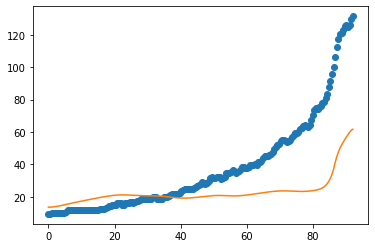

5
0.12714446728808143
77.72945651086407
28664.393814577343
7.417002882270017
46.164556581019376
oxigeno [1.54638362e-40 1.66893303e-40 2.06117518e-40 2.80286576e-40
 4.04763727e-40 6.05657687e-40 9.25036946e-40 1.42892993e-39
 2.21969995e-39 3.45469924e-39 5.37375768e-39 8.34201452e-39
 1.29258633e-38 2.00350841e-38 3.11740158e-38 4.88513673e-38
 7.72148317e-38 1.22995938e-37 1.96917970e-37 3.15910558e-37
 5.06715439e-37 8.11669276e-37 1.29765264e-36 2.06966886e-36
 3.29200098e-36 5.22447227e-36 8.29055663e-36 1.32056382e-35
 2.12025924e-35 3.44012276e-35 5.63813014e-35 9.30195225e-35
 1.53696294e-34 2.53194067e-34 4.15061054e-34 6.77772394e-34
 1.10515335e-33 1.80295514e-33 2.94549438e-33 4.82109632e-33
 7.91268850e-33 1.30425564e-32 2.16260650e-32 3.60991257e-32
 6.06106579e-32 1.02098738e-31 1.71918152e-31 2.88315220e-31
 4.80448834e-31 7.95585844e-31 1.31223897e-30 2.16261061e-30
 3.56779829e-30 5.89079859e-30 9.72098878e-30 1.60185225e-29
 2.63514431e-29 4.32710246e-29 7.09401752e

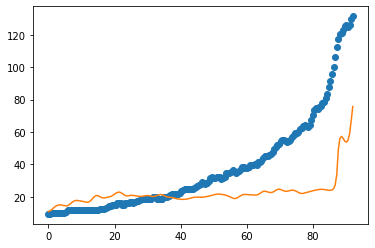

6
8.296951775163853
147.84970917664577
28515.09791807667
3.5227317317978066
13.799504552702205
oxigeno [1.08013002e-20 1.10813818e-20 1.19362240e-20 1.34104193e-20
 1.55810055e-20 1.85617089e-20 2.25092302e-20 2.76319449e-20
 3.42015355e-20 4.25682465e-20 5.31806773e-20 6.66113042e-20
 8.35892743e-20 1.05042468e-19 1.32151400e-19 1.66418279e-19
 2.09755479e-19 2.64598935e-19 3.34053519e-19 4.22079524e-19
 5.33731963e-19 6.75467830e-19 8.55540777e-19 1.08450831e-18
 1.37588385e-18 1.74697541e-18 2.21996449e-18 2.82329473e-18
 3.59345937e-18 4.57730285e-18 5.83498486e-18 7.44379806e-18
 9.50308592e-18 1.21405781e-17 1.55205519e-17 1.98543472e-17
 2.54139105e-17 3.25492424e-17 4.17108690e-17 5.34787796e-17
 6.85996864e-17 8.80349895e-17 1.13022508e-16 1.45155911e-16
 1.86486894e-16 2.39656576e-16 3.08064431e-16 3.96085387e-16
 5.09348762e-16 6.55096497e-16 8.42643090e-16 1.08396588e-15
 1.39446232e-15 1.79392117e-15 2.30776753e-15 2.96865824e-15
 3.81852561e-15 4.91119441e-15 6.31573151e-

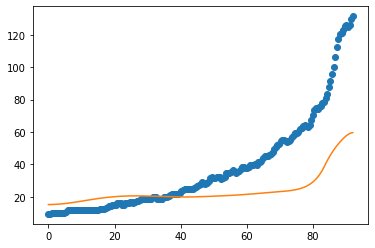

7
7.344017588259475
102.87941489921022
25417.506162985785
6.171931091214883
2.9071187139227224
oxigeno [7.68439633e-33 8.17260595e-33 9.69936664e-33 1.24591729e-32
 1.68042770e-32 2.32908293e-32 3.27520543e-32 4.64084893e-32
 6.60304809e-32 9.41754946e-32 1.34533411e-31 1.92428437e-31
 2.75548863e-31 3.95008980e-31 5.66896128e-31 8.14527329e-31
 1.17174527e-30 1.68773870e-30 2.43410139e-30 3.51518247e-30
 5.08328177e-30 7.36098466e-30 1.06740294e-29 1.54997278e-29
 2.25383750e-29 3.28186710e-29 4.78535027e-29 6.98703537e-29
 1.02152381e-28 1.49543710e-28 2.19198563e-28 3.21692620e-28
 4.72672748e-28 6.95307226e-28 1.02392659e-27 1.50943585e-27
 2.22736264e-27 3.28982844e-27 4.86335900e-27 7.19538619e-27
 1.06536866e-26 1.57850740e-26 2.34027439e-26 3.47162487e-26
 5.15248881e-26 7.65054063e-26 1.13639898e-25 1.68852096e-25
 2.50953241e-25 3.73047718e-25 5.54621197e-25 8.24641468e-25
 1.22616123e-24 1.82314733e-24 2.71060882e-24 4.02961004e-24
 5.98951396e-24 8.90092074e-24 1.32244187e-

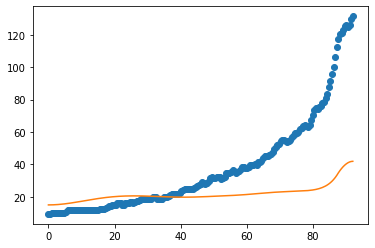

4.4886519848695094
110.55376515399664
25085.17220651139
0.46509560314498133
37.50499600803847
oxigeno [2.36960436e-09 2.38221800e-09 2.42022192e-09 2.48410755e-09
 2.57470189e-09 2.69317960e-09 2.84108011e-09 3.02033002e-09
 3.23327107e-09 3.48269404e-09 3.77187913e-09 4.10464325e-09
 4.48539504e-09 4.91919825e-09 5.41184456e-09 5.96993678e-09
 6.60098371e-09 7.31350803e-09 8.11716892e-09 9.02290109e-09
 1.00430723e-08 1.11916620e-08 1.24844627e-08 1.39393089e-08
 1.55763342e-08 1.74182630e-08 1.94907385e-08 2.18226929e-08
 2.44467639e-08 2.73997643e-08 3.07232085e-08 3.44639052e-08
 3.86746211e-08 4.34148263e-08 4.87515277e-08 5.47602029e-08
 6.15258429e-08 6.91441187e-08 7.77226817e-08 8.73826166e-08
 9.82600603e-08 1.10508008e-07 1.24298325e-07 1.39823991e-07
 1.57301601e-07 1.76974152e-07 1.99114151e-07 2.24027085e-07
 2.52055286e-07 2.83582249e-07 3.19037448e-07 3.58901712e-07
 4.03713224e-07 4.54074214e-07 5.10658425e-07 5.74219427e-07
 6.45599885e-07 7.25741873e-07 8.15698327e-0

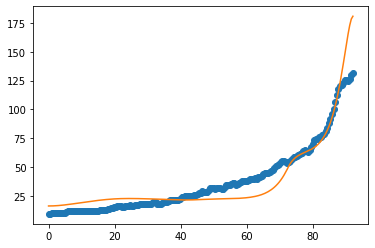

8
3.8336370313029535
81.48524524337711
27731.697274914244
6.127061412459758
13.800076278322164
oxigeno [1.92274776e-36 2.07275858e-36 2.54627709e-36 3.41755841e-36
 4.82366153e-36 6.98676683e-36 1.02505867e-35 1.51371243e-35
 2.24336042e-35 3.33247397e-35 4.95936046e-35 7.39267404e-35
 1.10378076e-34 1.65075326e-34 2.47297314e-34 3.71119673e-34
 5.57932929e-34 8.40301750e-34 1.26788926e-33 1.91656598e-33
 2.90243739e-33 4.40347942e-33 6.69295864e-33 1.01911324e-32
 1.55453422e-32 2.37542663e-32 3.63609344e-32 5.57529390e-32
 8.56299426e-32 1.31732525e-31 2.02979659e-31 3.13245595e-31
 4.84138009e-31 7.49344899e-31 1.16144053e-30 1.80254735e-30
 2.80104570e-30 4.35777033e-30 6.78708802e-30 1.05813162e-29
 1.65117441e-29 2.57870366e-29 4.03015674e-29 6.30246256e-29
 9.86101977e-29 1.54351945e-28 2.41678111e-28 3.78490496e-28
 5.92822233e-28 9.28554974e-28 1.45435033e-27 2.27759537e-27
 3.56616578e-27 5.58237181e-27 8.73587988e-27 1.36661753e-26
 2.13709894e-26 3.34062067e-26 5.21968632e-

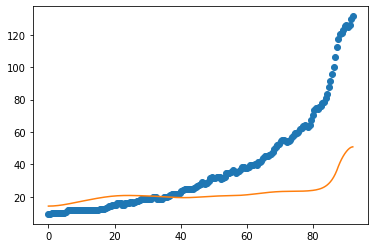

9
4.995419250104957
23.85458493290293
21154.965984175706
9.26343351233771
18.86936737168546
oxigeno [5.94326622e-81 8.53919746e-81 1.85923025e-80 4.48825858e-80
 1.10408754e-79 2.72632469e-79 6.74264562e-79 1.66999785e-78
 4.14316853e-78 1.02989722e-77 2.56570540e-77 6.40719484e-77
 1.60421565e-76 4.02777673e-76 1.01423577e-75 2.56174407e-75
 6.49079791e-75 1.64990421e-74 4.20766989e-74 1.07662095e-73
 2.76395447e-73 7.11947354e-73 1.83996637e-72 4.77097961e-72
 1.24115670e-71 3.23927783e-71 8.48104127e-71 2.22742117e-70
 5.86781689e-70 1.55037514e-69 4.10813048e-69 1.09158155e-68
 2.90821286e-68 7.76790593e-68 2.07986650e-67 5.58165527e-67
 1.50115460e-66 4.04536973e-66 1.09217933e-65 2.95367394e-65
 8.00003308e-65 2.16974039e-64 5.89163173e-64 1.60140019e-63
 4.35637741e-63 1.18587315e-62 3.22972428e-62 8.79906861e-62
 2.39764217e-61 6.53347320e-61 1.78014483e-60 4.84910365e-60
 1.32041414e-59 3.59379571e-59 9.77568787e-59 2.65737141e-58
 7.21825545e-58 1.95909187e-57 5.31239598e-57 

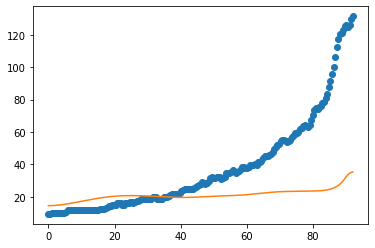

8.244711183319975
106.56169668870541
23343.62519981734
0.802471140961923
39.47368862920082
oxigeno [2.72321745e-12 2.75157373e-12 2.83723277e-12 2.98197859e-12
 3.18882950e-12 3.46210668e-12 3.80753252e-12 4.23236100e-12
 4.74554335e-12 5.35793306e-12 6.08253490e-12 6.93480437e-12
 7.93300444e-12 9.09862845e-12 1.04568993e-11 1.20373569e-11
 1.38745483e-11 1.60088369e-11 1.84873505e-11 2.13650905e-11
 2.47062300e-11 2.85856307e-11 3.30906161e-11 3.83230423e-11
 4.44017171e-11 5.14652235e-11 5.96752161e-11 6.92202669e-11
 8.03203516e-11 9.32320820e-11 1.08254806e-10 1.25737715e-10
 1.46088132e-10 1.69781153e-10 1.97370882e-10 2.29503505e-10
 2.66932500e-10 3.10536325e-10 3.61338985e-10 4.20533929e-10
 4.89511816e-10 5.69892751e-10 6.63563708e-10 7.72721949e-10
 8.99925387e-10 1.04815098e-09 1.22086240e-09 1.42208844e-09
 1.65651382e-09 1.92958431e-09 2.24762838e-09 2.61799795e-09
 3.04923113e-09 3.55124044e-09 4.13553023e-09 4.81544789e-09
 5.60647408e-09 6.52655769e-09 7.59650252e-09 8

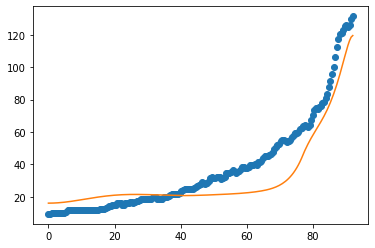

10
2.505982162561353
85.43188534114962
27109.4934008546
3.650266021855033
19.533922696780202
oxigeno [7.49670542e-28 7.84153140e-28 8.90804097e-28 1.07955145e-27
 1.36803759e-27 1.78338482e-27 2.36492513e-27 3.16818590e-27
 4.27055935e-27 5.77926690e-27 7.84248147e-27 1.06648197e-26
 1.45289012e-26 1.98253517e-26 2.70945782e-26 3.70849791e-26
 5.08341339e-26 6.97821626e-26 9.59301795e-26 1.32062042e-25
 1.82055045e-25 2.51315766e-25 3.47392178e-25 4.80834312e-25
 6.66405672e-25 9.24790108e-25 1.28499901e-24 1.78776919e-24
 2.49036290e-24 3.47335368e-24 4.85022599e-24 6.78096332e-24
 9.49129199e-24 1.32999462e-23 1.86573101e-23 2.62001938e-23
 3.68294846e-23 5.18202147e-23 7.29775345e-23 1.02857650e-22
 1.45080601e-22 2.04772765e-22 2.89192393e-22 4.08613177e-22
 5.77571194e-22 8.16623236e-22 1.15482427e-21 1.63321570e-21
 2.30973380e-21 3.26611295e-21 4.61759047e-21 6.52654578e-21
 9.22166441e-21 1.30248601e-20 1.83890902e-20 2.59514652e-20
 3.66078253e-20 5.16174406e-20 7.27499610e-20

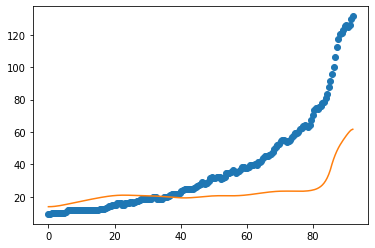

11
3.112695892682496
34.568405314481794
28873.330144070413
9.966680637725812
19.965640631966508
oxigeno [9.97581892e-70 1.29817227e-69 2.38113602e-69 4.90036611e-69
 1.03817832e-68 2.21601912e-68 4.74406150e-68 1.01786114e-67
 2.18891646e-67 4.71928350e-67 1.02030829e-66 2.21249394e-66
 4.81279422e-66 1.05033824e-65 2.29992894e-65 5.05331296e-65
 1.11410552e-64 2.46471914e-64 5.47135723e-64 1.21870766e-63
 2.72375198e-63 6.10778190e-63 1.37413829e-62 3.10163390e-62
 7.02336890e-62 1.59542497e-61 3.63549481e-61 8.30971122e-61
 1.90511331e-60 4.38069474e-60 1.01023937e-59 2.33632327e-59
 5.41792541e-59 1.25974901e-58 2.93657008e-58 6.86200580e-58
 1.60716148e-57 3.77227365e-57 8.87184112e-57 2.09034095e-56
 4.93325789e-56 1.16594888e-55 2.75909003e-55 6.53584331e-55
 1.54950831e-54 3.67578180e-54 8.72323672e-54 2.07056840e-53
 4.91476015e-53 1.16637783e-52 2.76714276e-52 6.56174436e-52
 1.55507741e-51 3.68289123e-51 8.71562634e-51 2.06090784e-50
 4.86915888e-50 1.14941328e-49 2.71095034e

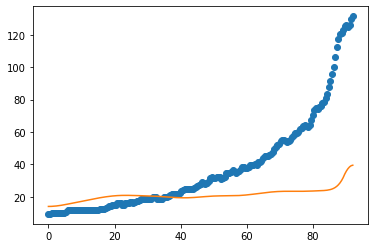

0.13253609871235364
61.98203978411732
25547.53169780896
8.265326381780124
8.958931036363513
oxigeno [4.02665742e-48 4.48006381e-48 5.96102253e-48 8.87319436e-48
 1.40360139e-47 2.29379300e-47 3.81669779e-47 6.41287550e-47
 1.08242785e-46 1.82904835e-46 3.08660525e-46 5.19505462e-46
 8.72525529e-46 1.46646040e-45 2.47687847e-45 4.21983910e-45
 7.26276051e-45 1.26112108e-44 2.20201361e-44 3.85239552e-44
 6.73587383e-44 1.17560930e-43 2.04683725e-43 3.55344885e-43
 6.14946766e-43 1.06161341e-42 1.83327428e-42 3.18155728e-42
 5.57567966e-42 9.89364713e-42 1.77592309e-41 3.21076646e-41
 5.81130454e-41 1.04765371e-40 1.87760150e-40 3.35015837e-40
 5.96875297e-40 1.06426774e-39 1.90105817e-39 3.40366641e-39
 6.11445972e-39 1.10412196e-38 2.00784600e-38 3.67969659e-38
 6.78796510e-38 1.25643744e-37 2.32346447e-37 4.27476240e-37
 7.80521214e-37 1.41482528e-36 2.55355593e-36 4.60569982e-36
 8.31842043e-36 1.50379033e-35 2.71656238e-35 4.89879114e-35
 8.81620205e-35 1.58325955e-34 2.83819489e-34 

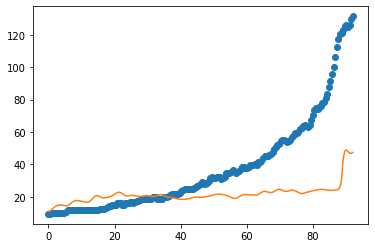

6.323592953104054
75.89430655715653
23155.860869263393
4.745135626282664
32.25948913262258
oxigeno [2.04492687e-33 2.18686858e-33 2.63240540e-33 3.44347100e-33
 4.73302928e-33 6.68119238e-33 9.56103650e-33 1.37779599e-32
 1.99284800e-32 2.88873374e-32 4.19361406e-32 6.09532361e-32
 8.86940732e-32 1.29205603e-31 1.88439531e-31 2.75161031e-31
 4.02297086e-31 5.88939813e-31 8.63326891e-31 1.26728139e-30
 1.86283397e-30 2.74211221e-30 4.04212638e-30 5.96690113e-30
 8.82063855e-30 1.30574624e-29 1.93561069e-29 2.87321621e-29
 4.27069046e-29 6.35614422e-29 9.47195622e-29 1.41324841e-28
 2.11111105e-28 3.15716025e-28 4.72664352e-28 7.08363262e-28
 1.06262773e-27 1.59551907e-27 2.39768081e-27 3.60596190e-27
 5.42703309e-27 8.17308462e-27 1.23157814e-26 1.85678012e-26
 2.80060347e-26 4.22576862e-26 6.37813137e-26 9.62910985e-26
 1.45397111e-25 2.19571151e-25 3.31603088e-25 5.00795809e-25
 7.56271772e-25 1.14195159e-24 1.72404621e-24 2.60232554e-24
 3.92705755e-24 5.92445611e-24 8.93488903e-24 1

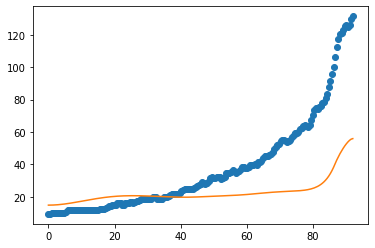

12
8.708227200433718
43.55336799908543
23905.74181322145
9.004243619171714
46.317639432138265
oxigeno [2.50258113e-59 3.07270119e-59 5.04254121e-59 9.30920246e-59
 1.78182110e-58 3.44566120e-58 6.68431777e-58 1.29850948e-57
 2.52513877e-57 4.91573977e-57 9.58093192e-57 1.86982570e-56
 3.65449108e-56 7.15383862e-56 1.40277231e-55 2.75559524e-55
 5.42329367e-55 1.06945954e-54 2.11323619e-54 4.18444560e-54
 8.30333800e-54 1.65122461e-53 3.29084293e-53 6.57294477e-53
 1.31572284e-52 2.63946512e-52 5.30647247e-52 1.06910876e-51
 2.15847834e-51 4.36680446e-51 8.85211873e-51 1.79792826e-50
 3.65856333e-50 7.45814477e-50 1.52299923e-49 3.11517010e-49
 6.38175012e-49 1.30928719e-48 2.68984293e-48 5.53317578e-48
 1.13955510e-47 2.34945218e-47 4.84869633e-47 1.00153680e-46
 2.07037421e-46 4.28279673e-46 8.86461387e-46 1.83570798e-45
 3.80292022e-45 7.88061372e-45 1.63339985e-44 3.38591678e-44
 7.01898516e-44 1.45496002e-43 3.01559088e-43 6.24893423e-43
 1.29455607e-42 2.68094618e-42 5.54983853e-4

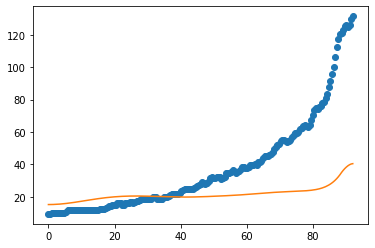

3.3419920326651966
96.28164536663964
20196.188520538675
0.27832745594095526
31.184907872708514
oxigeno [8.16064073e-07 8.15718346e-07 8.14688168e-07 8.12994465e-07
 8.10671862e-07 8.07768317e-07 8.04344651e-07 8.00473991e-07
 7.96241179e-07 7.91742166e-07 7.87083456e-07 7.82381620e-07
 7.77762921e-07 7.73363091e-07 7.69327277e-07 7.65810180e-07
 7.62976407e-07 7.61001049e-07 7.60070483e-07 7.60383422e-07
 7.62152199e-07 7.65604304e-07 7.70984174e-07 7.78555241e-07
 7.88602257e-07 8.01433900e-07 8.17385689e-07 8.36823226e-07
 8.60145786e-07 8.87790293e-07 9.20235708e-07 9.58007869e-07
 1.00168482e-06 1.05190267e-06 1.10936202e-06 1.17483502e-06
 1.24917304e-06 1.33331517e-06 1.42829736e-06 1.53526246e-06
 1.65547119e-06 1.79031398e-06 1.94132399e-06 2.11019125e-06
 2.29877808e-06 2.50913598e-06 2.74352412e-06 3.00442959e-06
 3.29458970e-06 3.61701650e-06 3.97502383e-06 4.37225710e-06
 4.81272619e-06 5.30084173e-06 5.84145500e-06 6.43990188e-06
 7.10205101e-06 7.83435655e-06 8.64391574e-

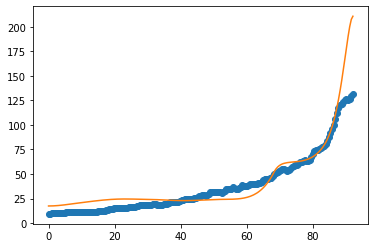

13
9.921225540206164
73.76900079188397
21680.15939594865
8.89122346567401
3.3442747545426377
oxigeno [6.37407115e-46 7.19596454e-46 9.87351353e-46 1.50974269e-45
 2.42171353e-45 3.95931241e-45 6.52154073e-45 1.07753359e-44
 1.78318844e-44 2.95418920e-44 4.89900623e-44 8.13240291e-44
 1.35145939e-43 2.24852290e-43 3.74574685e-43 6.24828026e-43
 1.04374525e-42 1.74609511e-42 2.92552915e-42 4.90935218e-42
 8.25170236e-42 1.38923353e-41 2.34276344e-41 3.95738887e-41
 6.69604507e-41 1.13489666e-40 1.92671904e-40 3.27640364e-40
 5.58063110e-40 9.52058017e-40 1.62675615e-39 2.78383093e-39
 4.77094974e-39 8.18816626e-39 1.40722876e-38 2.42166334e-38
 4.17260386e-38 7.19808372e-38 1.24312243e-37 2.14915711e-37
 3.71919466e-37 6.44206014e-37 1.11677060e-36 1.93746760e-36
 3.36359770e-36 5.84306415e-36 1.01557579e-35 1.76598701e-35
 3.07209746e-35 5.34594178e-35 9.30519158e-35 1.61997824e-34
 2.82063963e-34 4.91149116e-34 8.55224837e-34 1.48909838e-33
 2.59250016e-33 4.51277770e-33 7.85375919e-33

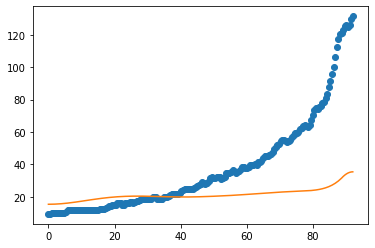

6.591107910171184
134.3066305294385
20581.852106871916
8.630164227845448
14.898145697790234
oxigeno [3.31084421e-33 3.52248095e-33 4.18454144e-33 5.38206113e-33
 7.26920919e-33 1.00897580e-32 1.42096178e-32 2.01659830e-32
 2.87400060e-32 4.10633004e-32 5.87734952e-32 8.42412545e-32
 1.20901748e-31 1.73739136e-31 2.49995638e-31 3.60210772e-31
 5.19746748e-31 7.51030754e-31 1.08685584e-30 1.57524714e-30
 2.28664574e-30 3.32452836e-30 4.84112667e-30 7.06072432e-30
 1.03142266e-29 1.50905160e-29 2.21128281e-29 3.24524555e-29
 4.76981870e-29 7.02090326e-29 1.03491487e-28 1.52763136e-28
 2.25795230e-28 3.34173105e-28 4.95182691e-28 7.34635483e-28
 1.09110054e-27 1.62224645e-27 2.41434777e-27 3.59653782e-27
 5.36218043e-27 8.00091868e-27 1.19467354e-26 1.78500216e-26
 2.66856357e-26 3.99149027e-26 5.97284332e-26 8.94099964e-26
 1.33881648e-25 2.00520151e-25 3.00379287e-25 4.50019170e-25
 6.74242917e-25 1.01018901e-24 1.51344818e-24 2.26720219e-24
 3.39587056e-24 5.08547907e-24 7.61404452e-24 

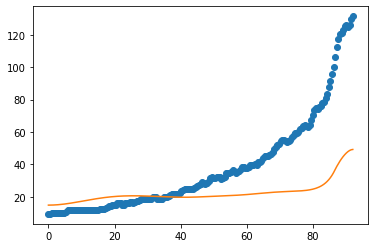

14
3.287109054720972
62.31213574283204
20758.82373808734
1.2814077514271012
21.190613900552155
oxigeno [2.31663668e-20 2.38194053e-20 2.58154187e-20 2.92673224e-20
 3.43708552e-20 4.14164024e-20 5.08065853e-20 6.30807372e-20
 7.89478246e-20 9.93299152e-20 1.25418976e-19 1.58750648e-19
 2.01299746e-19 2.55603674e-19 3.24921745e-19 4.13440829e-19
 5.26540770e-19 6.71137067e-19 8.56123466e-19 1.09294386e-18
 1.39633163e-18 1.78526601e-18 2.28420961e-18 2.92471075e-18
 3.74747876e-18 4.80507305e-18 6.16538851e-18 7.91617426e-18
 1.01708931e-17 1.30763209e-17 1.68224022e-17 2.16550330e-17
 2.78926372e-17 3.59476591e-17 4.63544229e-17 5.98052323e-17
 7.71971266e-17 9.96924094e-17 1.28796960e-16 1.66461488e-16
 2.15212363e-16 2.78320542e-16 3.60019527e-16 4.65786401e-16
 6.02703936e-16 7.79926888e-16 1.00928212e-15 1.30604053e-15
 1.68990963e-15 2.18630926e-15 2.82801070e-15 3.65724221e-15
 4.72839273e-15 6.11148310e-15 7.89662112e-15 1.01997177e-14
 1.31698181e-14 1.69985006e-14 2.19319199e-

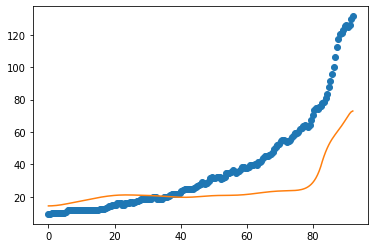

15
2.1539525948360514
22.14835253533957
28239.99788111734
5.9289314517884275
13.84391124843609
oxigeno [2.01191491e-69 2.65178362e-69 4.97814102e-69 1.04724202e-68
 2.26450854e-68 4.93098327e-68 1.07681111e-67 2.35691984e-67
 5.17138485e-67 1.13769290e-66 2.51007075e-66 5.55460660e-66
 1.23301345e-65 2.74567838e-65 6.13340599e-65 1.37439969e-64
 3.08931833e-64 6.96503160e-64 1.57493937e-63 3.57153105e-63
 8.12207333e-63 1.85215606e-62 4.23514156e-62 9.71012138e-62
 2.23222941e-61 5.14522528e-61 1.18909441e-60 2.75529825e-60
 6.40106691e-60 1.49092051e-59 3.48142313e-59 8.14959077e-59
 1.91232964e-58 4.49784213e-58 1.06028434e-57 2.50481219e-57
 5.92947494e-57 1.40635175e-56 3.34156913e-56 7.95280343e-56
 1.89552307e-55 4.52369189e-55 1.08073300e-54 2.58406005e-54
 6.18209553e-54 1.47946029e-53 3.54070586e-53 8.47193304e-53
 2.02616682e-52 4.84252864e-52 1.15635529e-51 2.75845566e-51
 6.57274591e-51 1.56423303e-50 3.71803786e-50 8.82637722e-50
 2.09275427e-49 4.95611172e-49 1.17240355e-

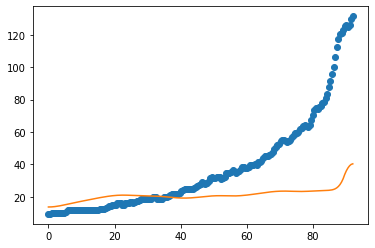

0.532252913989876
71.68513833199279
26926.988320345343
5.702707192041443
40.95627438125838
oxigeno [1.97854687e-37 2.12927877e-37 2.60574943e-37 3.48540072e-37
 4.91337397e-37 7.12914155e-37 1.05093759e-36 1.56340436e-36
 2.33871865e-36 3.51111794e-36 5.28453214e-36 7.96990819e-36
 1.20440572e-35 1.82426170e-35 2.77063629e-35 4.22097672e-35
 6.45149621e-35 9.89157369e-35 1.52069449e-34 2.34267592e-34
 3.61382042e-34 5.57867902e-34 8.61447071e-34 1.33050728e-33
 2.05593268e-33 3.18017872e-33 4.92810846e-33 7.65667742e-33
 1.19343722e-32 1.86670101e-32 2.92952543e-32 4.61031546e-32
 7.27001069e-32 1.14777528e-31 1.81306979e-31 2.86455182e-31
 4.52669828e-31 7.15681495e-31 1.13264120e-30 1.79537819e-30
 2.85197640e-30 4.54175172e-30 7.25158102e-30 1.16058653e-29
 1.86090133e-29 2.98696613e-29 4.79525171e-29 7.69311255e-29
 1.23259740e-28 1.97154370e-28 3.14785205e-28 5.01754737e-28
 7.98601064e-28 1.26948128e-27 2.01585326e-27 3.19804423e-27
 5.06931780e-27 8.02979939e-27 1.27119446e-26 2

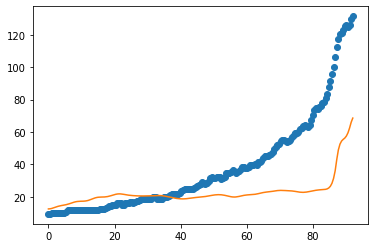

16
2.5581496261876007
67.47920773102653
22930.159466506146
6.632868075566459
46.12586891879652
oxigeno [2.20842376e-41 2.43062717e-41 3.14214434e-41 4.48709158e-41
 6.73904473e-41 1.03588079e-40 1.60924962e-40 2.51318161e-40
 3.93725930e-40 6.18301985e-40 9.73069337e-40 1.53465385e-39
 2.42557515e-39 3.84215131e-39 6.09961547e-39 9.70519688e-39
 1.54767182e-38 2.47354136e-38 3.96199957e-38 6.35991647e-38
 1.02309495e-37 1.64927816e-37 2.66423196e-37 4.31259053e-37
 6.99490142e-37 1.13682131e-36 1.85123067e-36 3.02048657e-36
 4.93776932e-36 8.08742365e-36 1.32709213e-35 2.18165938e-35
 3.59292812e-35 5.92738991e-35 9.79504127e-35 1.62124185e-34
 2.68754259e-34 4.46161611e-34 7.41681358e-34 1.23448372e-33
 2.05705589e-33 3.43119034e-33 5.72825691e-33 9.57009776e-33
 1.59978246e-32 2.67540205e-32 4.47541763e-32 7.48736251e-32
 1.25260054e-31 2.09520890e-31 3.50366007e-31 5.85669841e-31
 9.78553568e-31 1.63414399e-30 2.72741700e-30 4.54943705e-30
 7.58411604e-30 1.26355870e-29 2.10394865e-

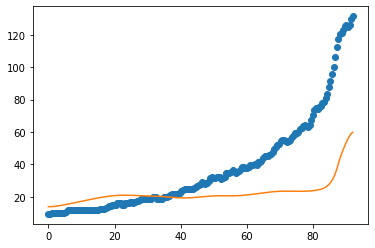

17
1.2842207521545168
27.661346256603863
21266.875172317432
5.9685696538535655
11.665086686956963
oxigeno [2.18474074e-62 2.71631082e-62 4.57030559e-62 8.65405350e-62
 1.69781463e-61 3.36732534e-61 6.70991681e-61 1.34156335e-60
 2.69090728e-60 5.41515036e-60 1.09340472e-59 2.21528919e-59
 4.50365001e-59 9.18702912e-59 1.88034807e-58 3.86112369e-58
 7.95323136e-58 1.64306487e-57 3.40380057e-57 7.06949335e-57
 1.47181746e-56 3.07120219e-56 6.42284139e-56 1.34622217e-55
 2.82820656e-55 5.95611791e-55 1.25756994e-54 2.66237045e-54
 5.65200411e-54 1.20319403e-53 2.56826095e-53 5.49614215e-53
 1.17901887e-52 2.53484962e-52 5.46116228e-52 1.17887933e-51
 2.54962249e-51 5.52451317e-51 1.19928779e-50 2.60832622e-50
 5.68318647e-50 1.24041876e-49 2.71150547e-49 5.93471259e-49
 1.30011855e-48 2.84958863e-48 6.24607361e-48 1.36857914e-47
 2.99639495e-47 6.55315430e-47 1.43124691e-46 3.12118791e-46
 6.79565792e-46 1.47722600e-45 3.20619739e-45 6.94872382e-45
 1.50399967e-44 3.25148390e-44 7.0221791

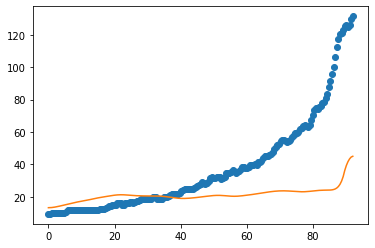

1.049517084536214
37.70685068247055
27341.911498825986
1.9483787198006846
21.299689730427247
oxigeno [3.31762110e-32 3.53944641e-32 4.23609283e-32 5.50574136e-32
 7.52829563e-32 1.05923580e-31 1.51385667e-31 2.18259372e-31
 3.16314982e-31 4.59988861e-31 6.70595464e-31 9.79620659e-31
 1.43362760e-30 2.10156605e-30 3.08565830e-30 4.53759803e-30
 6.68263147e-30 9.85533200e-30 1.45527462e-29 2.15134209e-29
 3.18351452e-29 4.71508615e-29 6.98923303e-29 1.03686570e-28
 1.53953456e-28 2.28808005e-28 3.40423444e-28 5.07089578e-28
 7.56318010e-28 1.12952107e-27 1.68905549e-27 2.52882279e-27
 3.79023123e-27 5.68626463e-27 8.53784999e-27 1.28289359e-26
 1.92900864e-26 2.90255501e-26 4.37065354e-26 6.58650765e-26
 9.93402282e-26 1.49954087e-25 2.26533264e-25 3.42447917e-25
 5.17924177e-25 7.83510515e-25 1.18526466e-24 1.79250623e-24
 2.70939728e-24 4.09223722e-24 6.17529087e-24 9.30935980e-24
 1.40193802e-23 2.10904206e-23 3.16960598e-23 4.75899965e-23
 7.13919938e-23 1.07014546e-22 1.60299443e-22

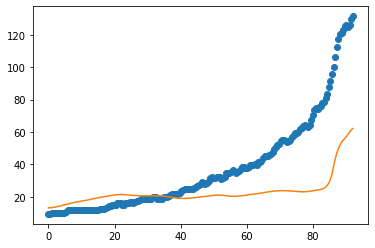

18
0.40511838378678744
18.9504263048579
23763.965889253504
9.443883444433364
36.46480348071734
oxigeno [6.33604515e-91 9.53568904e-91 2.24121354e-90 5.83564212e-90
 1.55612737e-89 4.20082641e-89 1.14529798e-88 3.14695580e-88
 8.69393261e-88 2.40977566e-87 6.69296232e-87 1.86251330e-86
 5.19860546e-86 1.45812628e-85 4.11812505e-85 1.17279162e-84
 3.36897928e-84 9.75284877e-84 2.83984031e-83 8.29762674e-83
 2.42725001e-82 7.09596609e-82 2.07133238e-81 6.03789248e-81
 1.75976070e-80 5.13944502e-80 1.50830756e-79 4.46019775e-79
 1.33139732e-78 4.01330670e-78 1.22003653e-77 3.73081412e-77
 1.14411572e-76 3.50930021e-76 1.07488699e-75 3.28675713e-75
 1.00414501e-74 3.06992109e-74 9.40956080e-74 2.89678906e-73
 8.97082476e-73 2.79725972e-72 8.78359028e-72 2.77496336e-71
 8.80346073e-71 2.79712364e-70 8.87573574e-70 2.80608443e-69
 8.82644898e-69 2.76146540e-68 8.59889417e-68 2.66786887e-67
 8.25536241e-67 2.54925001e-66 7.85713690e-66 2.41694993e-65
 7.42023845e-65 2.27409382e-64 6.96051931e-

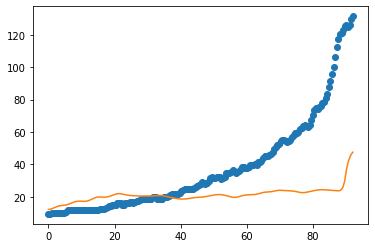

8.085697732244368
114.8623657983773
20513.207942471163
3.2936221559578605
1.9956461345249354
oxigeno [2.67447955e-23 2.76112069e-23 3.02666914e-23 3.48837986e-23
 4.17630453e-23 5.13532887e-23 6.42822655e-23 8.13994975e-23
 1.03834667e-22 1.33075699e-22 1.71072265e-22 2.20372297e-22
 2.84301611e-22 3.67199974e-22 4.74731273e-22 6.14291071e-22
 7.95542367e-22 1.03112024e-21 1.33755916e-21 1.73651408e-21
 2.25636948e-21 2.93436063e-21 3.81937208e-21 4.97563146e-21
 6.48758736e-21 8.46635425e-21 1.10582312e-20 1.44559661e-20
 1.89136563e-20 2.47664632e-20 3.24567065e-20 4.25684059e-20
 5.58730162e-20 7.33899886e-20 9.64669717e-20 1.26886027e-19
 1.67004298e-19 2.19940291e-19 2.89820565e-19 3.82106354e-19
 5.04025972e-19 6.65147168e-19 8.78134558e-19 1.15975174e-18
 1.53218681e-18 2.02480511e-18 2.67646629e-18 3.53858615e-18
 4.67918166e-18 6.18821240e-18 8.18463183e-18 1.08256917e-17
 1.43192146e-17 1.89397756e-17 2.50500285e-17 3.31287998e-17
 4.38080847e-17 5.79217422e-17 7.65695628e-17

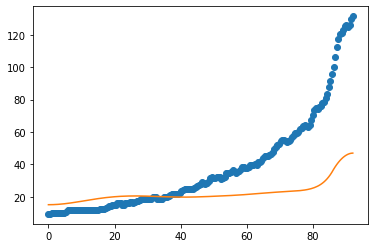

19
2.3247771708897216
117.4420048415433
26097.341904014083
1.1309158268682424
16.161725322824914
oxigeno [1.10563831e-13 1.11859221e-13 1.15776987e-13 1.22412848e-13
 1.31929439e-13 1.44561039e-13 1.60620366e-13 1.80507597e-13
 2.04721853e-13 2.33875462e-13 2.68711378e-13 3.10124244e-13
 3.59185695e-13 4.17174634e-13 4.85613361e-13 5.66310642e-13
 6.61413019e-13 7.73465950e-13 9.05486688e-13 1.06105118e-12
 1.24439778e-12 1.46055099e-12 1.71546923e-12 2.01622117e-12
 2.37119617e-12 2.79035524e-12 3.28553020e-12 3.87078017e-12
 4.56281599e-12 5.38150564e-12 6.35047571e-12 7.49782723e-12
 8.85698746e-12 1.04677229e-11 1.23773440e-11 1.46421358e-11
 1.73290556e-11 2.05177457e-11 2.43029125e-11 2.87971387e-11
 3.41341966e-11 4.04729499e-11 4.80019402e-11 5.69447745e-11
 6.75664517e-11 8.01807913e-11 9.51591619e-11 1.12940745e-10
 1.34044621e-10 1.59084012e-10 1.88783091e-10 2.23996842e-10
 2.65734534e-10 3.15187482e-10 3.73761884e-10 4.43117645e-10
 5.25214257e-10 6.22364964e-10 7.37300645

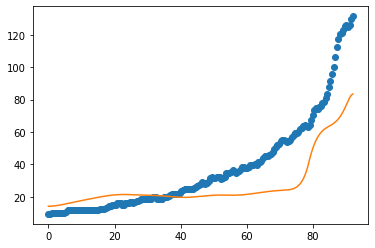

20
SMC step with target distance: 350.0
after perturb [0.14317391261544365, 37.38070211064853, 15736.056445520999, -1.4776971875497886, -6.515686533240331]
parameters [0.14317391261544365, 37.38070211064853, 15736.056445520999, -1.4776971875497886, -6.515686533240331]
after perturb [2.3829810157256883, 107.33717661658841, 21064.98667571594, 3.034335279392603, 12.2192555207296]
parameters [2.3829810157256883, 107.33717661658841, 21064.98667571594, 3.034335279392603, 12.2192555207296]
oxigeno [8.63496698e-23 8.89606114e-23 9.69541543e-23 1.10823413e-22
 1.31427572e-22 1.60050705e-22 1.98489993e-22 2.49179731e-22
 3.15360144e-22 4.01303318e-22 5.12612790e-22 6.56618818e-22
 8.42898541e-22 1.08395967e-21 1.39613884e-21 1.80078217e-21
 2.32579771e-21 3.00769822e-21 3.89429188e-21 5.04822990e-21
 6.55168886e-21 8.51255693e-21 1.10726154e-20 1.44183681e-20
 1.87953883e-20 2.45273379e-20 3.20411959e-20 4.19007428e-20
 5.48510207e-20 7.18773947e-20 9.42840382e-20 1.23798266e-19
 1.62709266e-19 

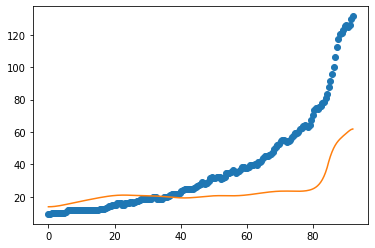

after perturb [-3.883275942757725, 84.08240442366088, 25443.321073030595, 0.16117017534298506, 24.922544505440683]
parameters [-3.883275942757725, 84.08240442366088, 25443.321073030595, 0.16117017534298506, 24.922544505440683]
after perturb [8.327526587060799, 157.2452121466328, 24015.320847777763, 16.117747350870705, 11.337230123496072]
parameters [8.327526587060799, 157.2452121466328, 24015.320847777763, 16.117747350870705, 11.337230123496072]
after perturb [-4.588143196581756, 14.552658517273514, 24867.67489811699, -7.288265158059849, 18.053975019798877]
parameters [-4.588143196581756, 14.552658517273514, 24867.67489811699, -7.288265158059849, 18.053975019798877]
after perturb [5.177407007279303, 34.09006912310593, 24584.46512262391, 4.051809748309022, 42.25670539332616]
parameters [5.177407007279303, 34.09006912310593, 24584.46512262391, 4.051809748309022, 42.25670539332616]
oxigeno [5.40305714e-47 6.20678351e-47 8.85650043e-47 1.41392187e-46
 2.36263605e-46 4.01462563e-46 6.863797

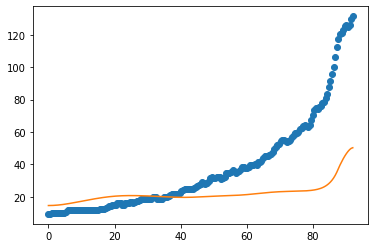

after perturb [1.237301016680103, 86.82996812379871, 25908.666179331212, -0.1787000288275138, 12.562806675956228]
parameters [1.237301016680103, 86.82996812379871, 25908.666179331212, -0.1787000288275138, 12.562806675956228]
after perturb [-1.506372862576653, 58.68952539208966, 24384.41125448611, -0.589120137111413, 62.5462428329392]
parameters [-1.506372862576653, 58.68952539208966, 24384.41125448611, -0.589120137111413, 62.5462428329392]
after perturb [8.229119382492744, 13.359054847536036, 16012.043388474936, 4.670439350836315, 30.614688780519877]
parameters [8.229119382492744, 13.359054847536036, 16012.043388474936, 4.670439350836315, 30.614688780519877]
after perturb [0.7224751548946348, 69.94974814752564, 29074.670245074343, 12.833153117978444, 38.28102933176269]
parameters [0.7224751548946348, 69.94974814752564, 29074.670245074343, 12.833153117978444, 38.28102933176269]
after perturb [8.055620664567357, 80.60968385566889, 18823.88138163976, 0.3227109583283314, 62.79615308348679]

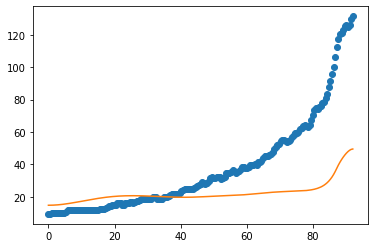

after perturb [0.6984006851572344, 78.44803871849643, 20017.029708185735, -2.3607176065682394, 26.231054687851714]
parameters [0.6984006851572344, 78.44803871849643, 20017.029708185735, -2.3607176065682394, 26.231054687851714]
after perturb [2.6923987900593715, 109.48988630396137, 27547.819108824126, 7.741903856341441, 24.709495044866078]
parameters [2.6923987900593715, 109.48988630396137, 27547.819108824126, 7.741903856341441, 24.709495044866078]
oxigeno [6.85758961e-35 7.32543377e-35 8.79334932e-35 1.14638202e-34
 1.57068779e-34 2.21142197e-34 3.15864186e-34 4.54668717e-34
 6.57435990e-34 9.53509443e-34 1.38619480e-33 2.01946734e-33
 2.94797875e-33 4.31200501e-33 6.31980726e-33 9.28113288e-33
 1.36574867e-32 2.01376888e-32 2.97516230e-32 4.40417619e-32
 6.53222408e-32 9.70708111e-32 1.44522792e-31 2.15572568e-31
 3.22144021e-31 4.82276977e-31 7.23308415e-31 1.08672961e-30
 1.63561195e-30 2.46597405e-30 3.72420228e-30 5.63377700e-30
 8.53631597e-30 1.29546589e-29 1.96899034e-29 2.9970

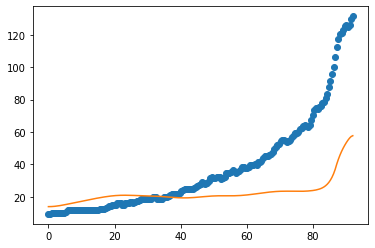

after perturb [-2.478345532484711, 32.647781808460124, 9397.109526131338, -4.804785979822334, -4.815078320398442]
parameters [-2.478345532484711, 32.647781808460124, 9397.109526131338, -4.804785979822334, -4.815078320398442]
after perturb [-4.486466882140894, 26.65006490339318, 27272.375988762724, 1.9114350809766774, 26.229190366030032]
parameters [-4.486466882140894, 26.65006490339318, 27272.375988762724, 1.9114350809766774, 26.229190366030032]
after perturb [11.900619431230925, 134.45509307598803, 28045.075170238593, 2.4395142773796135, 11.479604068133359]
parameters [11.900619431230925, 134.45509307598803, 28045.075170238593, 2.4395142773796135, 11.479604068133359]
after perturb [4.123652990951156, 100.70606854251005, 22707.956404184057, 4.908369852322201, 16.858548750191126]
parameters [4.123652990951156, 100.70606854251005, 22707.956404184057, 4.908369852322201, 16.858548750191126]
oxigeno [2.02067339e-29 2.12362759e-29 2.44303801e-29 3.01167916e-29
 3.88807383e-29 5.16280724e-29 

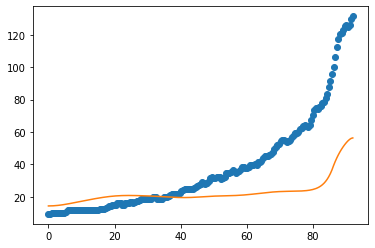

after perturb [4.816922934338084, 63.86178447346981, 25982.256340797074, 4.3135075591569185, 53.08142521113365]
parameters [4.816922934338084, 63.86178447346981, 25982.256340797074, 4.3135075591569185, 53.08142521113365]
after perturb [3.0802632519592583, 84.93102664695459, 22743.656204391256, 5.919719813723905, 38.49679906369183]
parameters [3.0802632519592583, 84.93102664695459, 22743.656204391256, 5.919719813723905, 38.49679906369183]
oxigeno [6.66197380e-35 7.13696021e-35 8.63001783e-35 1.13556232e-34
 1.57067847e-34 2.23142636e-34 3.21422881e-34 4.66360862e-34
 6.79450239e-34 9.92576057e-34 1.45303195e-33 2.13103279e-33
 3.13097285e-33 4.60831770e-33 6.79498524e-33 1.00375397e-32
 1.48547555e-32 2.20245094e-32 3.27151475e-32 4.86843986e-32
 7.25810317e-32 1.08403026e-31 1.62194505e-31 2.43107443e-31
 3.65021379e-31 5.49017891e-31 8.27166000e-31 1.24832047e-30
 1.88701421e-30 2.85711153e-30 4.33279333e-30 6.58084310e-30
 1.00103627e-29 1.52493860e-29 2.32630208e-29 3.55357237e-29
 

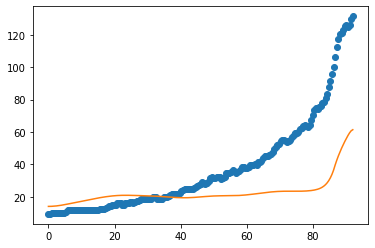

after perturb [3.4543406413277755, 137.86129542861255, 28207.45066304992, 4.218856847127727, 59.917019520547626]
parameters [3.4543406413277755, 137.86129542861255, 28207.45066304992, 4.218856847127727, 59.917019520547626]
after perturb [6.500543917626064, 39.61178710494936, 14736.216052149068, 5.066259214787921, -5.057839136218259]
parameters [6.500543917626064, 39.61178710494936, 14736.216052149068, 5.066259214787921, -5.057839136218259]
after perturb [13.326394948229328, 121.49189503650294, 13402.891845992217, 8.175785650350454, 3.01827690530744]
parameters [13.326394948229328, 121.49189503650294, 13402.891845992217, 8.175785650350454, 3.01827690530744]
after perturb [-2.624944613446364, 54.59093087256148, 28615.537625859117, 2.257048568768698, 27.35338200212505]
parameters [-2.624944613446364, 54.59093087256148, 28615.537625859117, 2.257048568768698, 27.35338200212505]
after perturb [5.119665619847519, 73.79419802619326, 22416.306979365912, 1.482939152024512, 70.77218096778734]
par

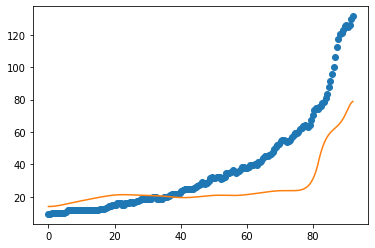

1
after perturb [-0.936215143569509, 88.62455552117738, 31474.31574828043, 7.753795608464211, -2.781930649883904]
parameters [-0.936215143569509, 88.62455552117738, 31474.31574828043, 7.753795608464211, -2.781930649883904]
after perturb [4.452381502433669, 131.60092338771491, 30392.755183087913, 9.006723807628354, 36.91653297431823]
parameters [4.452381502433669, 131.60092338771491, 30392.755183087913, 9.006723807628354, 36.91653297431823]
after perturb [10.308054243025218, 68.53234994015274, 14827.155617867726, 12.815669752116216, 40.18918790487925]
parameters [10.308054243025218, 68.53234994015274, 14827.155617867726, 12.815669752116216, 40.18918790487925]
after perturb [-0.13738056829073747, 98.54889379285113, 27320.330251783667, 9.35521075952868, 51.08554562514167]
parameters [-0.13738056829073747, 98.54889379285113, 27320.330251783667, 9.35521075952868, 51.08554562514167]
after perturb [6.846639794803915, 121.90663413003819, 22869.52639077923, 17.65818531314452, 26.206151664444246

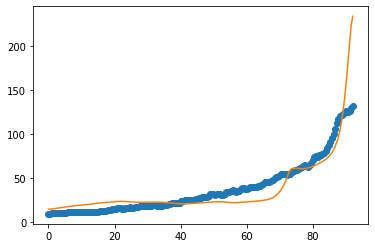

2
after perturb [7.439347752185608, 122.50668251494052, 32121.85764714986, 0.25593757334488265, -17.32624744869711]
parameters [7.439347752185608, 122.50668251494052, 32121.85764714986, 0.25593757334488265, -17.32624744869711]
after perturb [6.243851439085637, 118.50813606205504, 22784.041347293314, 5.824659581946269, 40.147288895533976]
parameters [6.243851439085637, 118.50813606205504, 22784.041347293314, 5.824659581946269, 40.147288895533976]
oxigeno [2.92101332e-29 3.06968577e-29 3.53089120e-29 4.35180041e-29
 5.61656532e-29 7.45526741e-29 1.00578186e-28 1.36943795e-28
 1.87446089e-28 2.57390790e-28 3.54176169e-28 4.88113252e-28
 6.73578514e-28 9.30634564e-28 1.28731081e-27 1.78281625e-27
 2.47207064e-27 3.43210253e-27 4.77109407e-27 6.64118232e-27
 9.25659797e-27 1.29193948e-26 1.80559852e-26 2.52690729e-26
 3.54115420e-26 4.96916822e-26 6.98231675e-26 9.82389931e-26
 1.38396873e-25 1.95215494e-25 2.75698077e-25 3.89824166e-25
 5.51825625e-25 7.82013160e-25 1.10939178e-24 1.575407

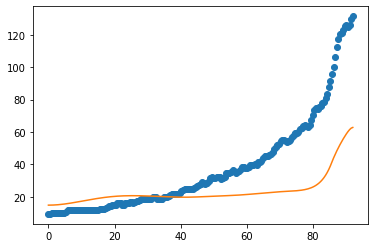

after perturb [8.095493534480369, 147.8356345848042, 30354.05416165582, 6.724540054938448, 47.78528198777947]
parameters [8.095493534480369, 147.8356345848042, 30354.05416165582, 6.724540054938448, 47.78528198777947]
after perturb [1.497020213157696, 108.53804242515756, 27436.570413994203, 7.4139733583212815, 44.60323984552956]
parameters [1.497020213157696, 108.53804242515756, 27436.570413994203, 7.4139733583212815, 44.60323984552956]
oxigeno [2.89195348e-34 3.07749827e-34 3.65835491e-34 4.71063190e-34
 6.37316734e-34 8.86741167e-34 1.25293667e-33 1.78584598e-33
 2.55908782e-33 3.68087527e-33 5.31022862e-33 7.68104022e-33
 1.11378116e-32 1.61887645e-32 2.35848374e-32 3.44372822e-32
 5.03928843e-32 7.38953360e-32 1.08575672e-31 1.59836525e-31
 2.35728228e-31 3.48265595e-31 5.15411825e-31 7.64074462e-31
 1.13463926e-30 1.68784354e-30 2.51521094e-30 3.75490982e-30
 5.61587459e-30 8.41452259e-30 1.26306857e-29 1.89928891e-29
 2.86085170e-29 4.31627458e-29 6.52229990e-29 9.87055420e-29
 1.

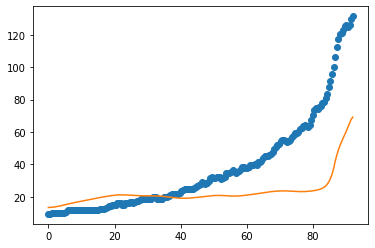

after perturb [6.54325051634519, 27.00441269996977, 16451.714127871535, 11.82503823894608, 45.48238309383989]
parameters [6.54325051634519, 27.00441269996977, 16451.714127871535, 11.82503823894608, 45.48238309383989]
after perturb [4.928860612278561, 88.83541376268376, 25586.234192127715, 10.36738449862182, 26.791752459682062]
parameters [4.928860612278561, 88.83541376268376, 25586.234192127715, 10.36738449862182, 26.791752459682062]
after perturb [-0.3389177169454394, 82.8402174491583, 26035.06474920888, -4.8098690676572, 66.42579631765348]
parameters [-0.3389177169454394, 82.8402174491583, 26035.06474920888, -4.8098690676572, 66.42579631765348]
after perturb [8.319811762340043, 186.57057036816454, 22307.88411943592, 5.729472182192639, 35.92154201009939]
parameters [8.319811762340043, 186.57057036816454, 22307.88411943592, 5.729472182192639, 35.92154201009939]
after perturb [-1.6965728693740285, 32.12762842956365, 26991.904999222807, 2.9266399847897064, 52.45498816552574]
parameters [

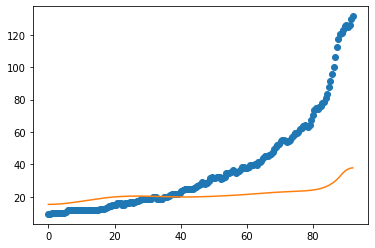

after perturb [-6.8746429411736205, 103.52091857146867, 41517.83001613833, 12.087774568299075, 43.25331036810061]
parameters [-6.8746429411736205, 103.52091857146867, 41517.83001613833, 12.087774568299075, 43.25331036810061]
after perturb [3.7685140288758054, 97.8701857263311, 21842.584206007403, 0.5193609562018213, 21.511718467518847]
parameters [3.7685140288758054, 97.8701857263311, 21842.584206007403, 0.5193609562018213, 21.511718467518847]
oxigeno [1.73613611e-10 1.74739692e-10 1.78136723e-10 1.83861412e-10
 1.92009417e-10 2.02717087e-10 2.16163943e-10 2.32575932e-10
 2.52229530e-10 2.75456747e-10 3.02651142e-10 3.34274937e-10
 3.70867384e-10 4.13054516e-10 4.61560483e-10 5.17220677e-10
 5.80996900e-10 6.53994862e-10 7.37484345e-10 8.32922420e-10
 9.41980160e-10 1.06657337e-09 1.20889788e-09 1.37147014e-09
 1.55717380e-09 1.76931318e-09 2.01167458e-09 2.28859661e-09
 2.60505069e-09 2.96673327e-09 3.38017121e-09 3.85284229e-09
 4.39331275e-09 5.01139426e-09 5.71832273e-09 6.52696195

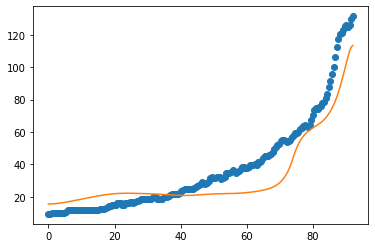

3
after perturb [3.314466382072947, 135.11990262510125, 19321.27465205, 5.863089708891916, 43.977259984834674]
parameters [3.314466382072947, 135.11990262510125, 19321.27465205, 5.863089708891916, 43.977259984834674]
after perturb [-1.6951345555038548, 9.400263444573966, 32771.97932862772, 5.3059999164110625, 50.76359747226095]
parameters [-1.6951345555038548, 9.400263444573966, 32771.97932862772, 5.3059999164110625, 50.76359747226095]
after perturb [8.62222410060465, 192.93240999992855, 33658.240596624564, 0.5440728950881293, -10.422122369339442]
parameters [8.62222410060465, 192.93240999992855, 33658.240596624564, 0.5440728950881293, -10.422122369339442]
after perturb [9.605666916623925, 43.24642288247261, 21386.822520238075, 7.073793789919239, 34.19713179865568]
parameters [9.605666916623925, 43.24642288247261, 21386.822520238075, 7.073793789919239, 34.19713179865568]
oxigeno [1.91002782e-53 2.26896956e-53 3.48048267e-53 5.99940431e-53
 1.07723806e-52 1.95959060e-52 3.57977631e-52 6

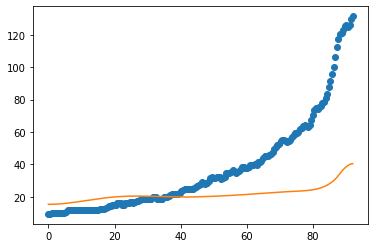

after perturb [7.444076171937365, 98.84111842303467, 27396.409707923238, 8.629055976047093, 42.60826094798224]
parameters [7.444076171937365, 98.84111842303467, 27396.409707923238, 8.629055976047093, 42.60826094798224]
oxigeno [1.41202085e-38 1.53830738e-38 1.93978407e-38 2.68842562e-38
 3.91870938e-38 5.85225834e-38 8.83864308e-38 1.34201035e-37
 2.04325819e-37 3.11625539e-37 4.75901320e-37 7.27660610e-37
 1.11397025e-36 1.70755742e-36 2.62098356e-36 4.02875648e-36
 6.20188423e-36 9.56196255e-36 1.47659783e-35 2.28394897e-35
 3.53861128e-35 5.49175497e-35 8.53743029e-35 1.32948460e-34
 2.07385615e-34 3.24047756e-34 5.07186122e-34 7.95140194e-34
 1.24860606e-33 1.96380076e-33 3.09344354e-33 4.88022771e-33
 7.71026683e-33 1.21985046e-32 1.93253052e-32 3.06550392e-32
 4.86860912e-32 7.74115933e-32 1.23218144e-31 1.96326759e-31
 3.13103863e-31 4.99768468e-31 7.98339918e-31 1.27618115e-30
 2.04131131e-30 3.26697455e-30 5.23105622e-30 8.37930923e-30
 1.34267529e-29 2.15202489e-29 3.44990880

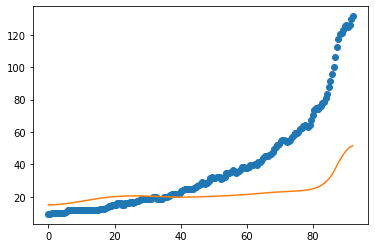

after perturb [6.045439066446553, 149.10617788898725, 24242.652740771297, 7.529016834816085, 57.59941701779684]
parameters [6.045439066446553, 149.10617788898725, 24242.652740771297, 7.529016834816085, 57.59941701779684]
after perturb [9.672472875618675, 156.9934537499154, 25807.25632445627, 4.619468087767452, 34.47413542760727]
parameters [9.672472875618675, 156.9934537499154, 25807.25632445627, 4.619468087767452, 34.47413542760727]
after perturb [10.788826335672733, 70.01145618290437, 19641.844067357022, 4.195888100774223, 42.38729580377097]
parameters [10.788826335672733, 70.01145618290437, 19641.844067357022, 4.195888100774223, 42.38729580377097]
after perturb [8.533839156795752, 172.93377982031268, 29637.818093900514, 4.352216728840574, 47.67749970422541]
parameters [8.533839156795752, 172.93377982031268, 29637.818093900514, 4.352216728840574, 47.67749970422541]
after perturb [8.435979967986754, 123.16096058276506, 24619.32031646424, 4.0151750125056616, 27.195171062438178]
paramet

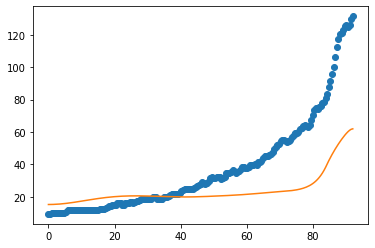

4
after perturb [1.3148576495195985, 111.9092830320893, 20570.96474418835, -3.0475217858545296, 3.1371373923998505]
parameters [1.3148576495195985, 111.9092830320893, 20570.96474418835, -3.0475217858545296, 3.1371373923998505]
after perturb [-2.956320133304448, 25.149282592121423, 21199.00815465806, 2.3300057887039873, 33.730098207778475]
parameters [-2.956320133304448, 25.149282592121423, 21199.00815465806, 2.3300057887039873, 33.730098207778475]
after perturb [5.127303401571886, 97.75604674288758, 26623.683274484003, 4.066484157756539, 9.242856794973896]
parameters [5.127303401571886, 97.75604674288758, 26623.683274484003, 4.066484157756539, 9.242856794973896]
oxigeno [1.79995949e-27 1.88129007e-27 2.13265882e-27 2.57689426e-27
 3.25443870e-27 4.22719220e-27 5.58442521e-27 7.45135753e-27
 1.00012757e-26 1.34724282e-26 1.81914381e-26 2.46056605e-26
 3.33278631e-26 4.51979288e-26 6.13681114e-26 8.34209371e-26
 1.13532404e-25 1.54698112e-25 2.11046913e-25 2.88276393e-25
 3.94258113e-25 

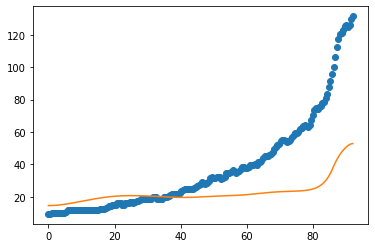

after perturb [-3.779827486497719, 62.145539054168026, 34239.1573669922, 4.446556770640905, 56.2286742174127]
parameters [-3.779827486497719, 62.145539054168026, 34239.1573669922, 4.446556770640905, 56.2286742174127]
after perturb [10.38765826020851, 109.64996604346344, 18188.288383980373, 13.41507588665515, 43.47219448720465]
parameters [10.38765826020851, 109.64996604346344, 18188.288383980373, 13.41507588665515, 43.47219448720465]
after perturb [5.618303607016082, 153.86732889761632, 24554.85245209792, 4.16258515498164, -14.546293259701066]
parameters [5.618303607016082, 153.86732889761632, 24554.85245209792, 4.16258515498164, -14.546293259701066]
after perturb [6.292429600047732, 111.96137378382724, 26152.974293889805, 10.91752849838051, -0.5120391786677665]
parameters [6.292429600047732, 111.96137378382724, 26152.974293889805, 10.91752849838051, -0.5120391786677665]
after perturb [-1.5976822830400281, 145.9668558925643, 33353.33730713085, 6.675909718670156, 52.38881140325601]
para

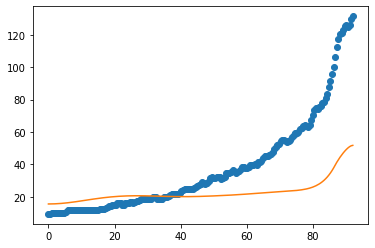

after perturb [14.98053169171807, 86.03440608295702, 16423.073800356447, -3.576218621838078, 23.337862253396175]
parameters [14.98053169171807, 86.03440608295702, 16423.073800356447, -3.576218621838078, 23.337862253396175]
after perturb [6.142073416494415, 89.91349640467031, 28878.36120654588, 7.555142747490134, 23.78554071840689]
parameters [6.142073416494415, 89.91349640467031, 28878.36120654588, 7.555142747490134, 23.78554071840689]
oxigeno [4.03205900e-38 4.38228828e-38 5.49390857e-38 7.56053942e-38
 1.09429439e-37 1.62334686e-37 2.43623930e-37 3.67659891e-37
 5.56477980e-37 8.43824856e-37 1.28139187e-36 1.94844024e-36
 2.96668136e-36 4.52331657e-36 6.90677020e-36 1.05622037e-35
 1.61779101e-35 2.48199943e-35 3.81426813e-35 5.87172585e-35
 9.05474042e-35 1.39877780e-34 2.16464709e-34 3.35575959e-34
 5.21142449e-34 8.10732194e-34 1.26341029e-33 1.97217491e-33
 3.08365640e-33 4.82935573e-33 7.57523268e-33 1.19004969e-32
 1.87229083e-32 2.94981979e-32 4.65376758e-32 7.35143864e-32
 1.

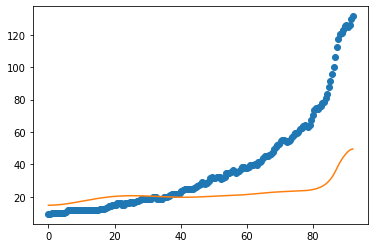

after perturb [-9.845443166135976, 59.540432327397255, 35147.64863179529, 4.50213443326624, 56.05589575193905]
parameters [-9.845443166135976, 59.540432327397255, 35147.64863179529, 4.50213443326624, 56.05589575193905]
after perturb [-1.7462009453848708, 58.17205617438745, 30226.202771382646, -1.3343907585390404, 22.21932906287518]
parameters [-1.7462009453848708, 58.17205617438745, 30226.202771382646, -1.3343907585390404, 22.21932906287518]
after perturb [2.2791579184269026, 78.18638990209129, 17429.04016388901, -3.8209420884572896, 65.46251678167248]
parameters [2.2791579184269026, 78.18638990209129, 17429.04016388901, -3.8209420884572896, 65.46251678167248]
after perturb [13.615068724120526, 158.22152931581473, 23355.95940994336, 4.418176242036872, -5.904479652037979]
parameters [13.615068724120526, 158.22152931581473, 23355.95940994336, 4.418176242036872, -5.904479652037979]
after perturb [6.885478573724356, 153.08388196128976, 30678.773287980544, 0.2920098054860678, -6.41939180615

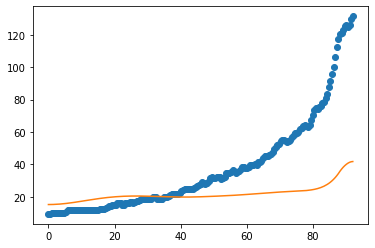

after perturb [-1.2928011577184093, 123.95624243299227, 28101.824880967397, 3.4820865870427893, 25.091494437903435]
parameters [-1.2928011577184093, 123.95624243299227, 28101.824880967397, 3.4820865870427893, 25.091494437903435]
after perturb [4.028124847720547, 53.80275869031444, 22554.470086743215, 7.231781785774917, 41.450331571267355]
parameters [4.028124847720547, 53.80275869031444, 22554.470086743215, 7.231781785774917, 41.450331571267355]
oxigeno [2.62647204e-48 3.00112045e-48 4.23201767e-48 6.67105381e-48
 1.10174200e-47 1.85219357e-47 3.13548277e-47 5.32484186e-47
 9.06110587e-47 1.54455483e-46 2.63740825e-46 4.51175835e-46
 7.73318043e-46 1.32818915e-45 2.28607107e-45 3.94346787e-45
 6.81787359e-45 1.18145747e-44 2.05208891e-44 3.57263275e-44
 6.23441109e-44 1.09047155e-43 1.91178433e-43 3.35938863e-43
 5.91653165e-43 1.04435091e-42 1.84749287e-42 3.27535956e-42
 5.81910133e-42 1.03598225e-41 1.84809648e-41 3.30329161e-41
 5.91548727e-41 1.06126549e-40 1.90727403e-40 3.433367

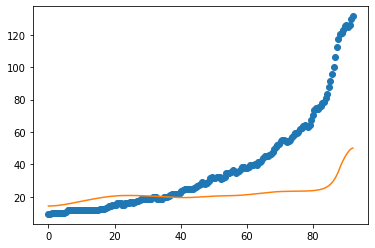

after perturb [7.41874758009643, 105.48383732951706, 15031.477594161432, 3.6986954400995913, 14.897156591796264]
parameters [7.41874758009643, 105.48383732951706, 15031.477594161432, 3.6986954400995913, 14.897156591796264]
after perturb [11.035835760561472, 97.38830352943565, 22750.64438637177, 2.0929173051872336, 41.068977666017666]
parameters [11.035835760561472, 97.38830352943565, 22750.64438637177, 2.0929173051872336, 41.068977666017666]
after perturb [-2.257980367169456, 74.76232833163985, 25126.437221954246, 5.334086230557438, 27.98857140982397]
parameters [-2.257980367169456, 74.76232833163985, 25126.437221954246, 5.334086230557438, 27.98857140982397]
after perturb [5.57153433390536, 123.6553199004928, 23348.82626320403, 1.4309819249839768, 23.52393194010775]
parameters [5.57153433390536, 123.6553199004928, 23348.82626320403, 1.4309819249839768, 23.52393194010775]
oxigeno [8.09261453e-15 8.20615449e-15 8.54999393e-15 9.13389265e-15
 9.97445730e-15 1.10956639e-14 1.25296139e-14 1

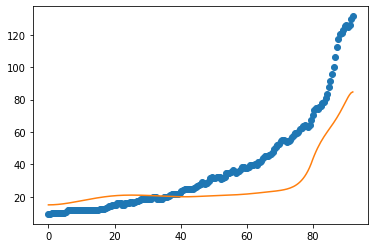

5
after perturb [5.23517115564853, 132.77122311317348, 25467.192984625748, 9.224982955027714, 9.61293106588019]
parameters [5.23517115564853, 132.77122311317348, 25467.192984625748, 9.224982955027714, 9.61293106588019]
oxigeno [1.44887526e-34 1.54708039e-34 1.85506845e-34 2.41483889e-34
 3.30294053e-34 4.64131255e-34 6.61465718e-34 9.49694548e-34
 1.36910548e-33 1.97875664e-33 2.86517435e-33 4.15521502e-33
 6.03509934e-33 8.77861699e-33 1.27889829e-32 1.86610522e-32
 2.72739472e-32 3.99291853e-32 5.85569908e-32 8.60249312e-32
 1.26600340e-31 1.86644188e-31 2.75653768e-31 4.07831730e-31
 6.04450387e-31 8.97418972e-31 1.33467259e-30 1.98832268e-30
 2.96699765e-30 4.43454720e-30 6.63841889e-30 9.95274604e-30
 1.49438258e-29 2.24696921e-29 3.38316305e-29 5.10048520e-29
 7.69898399e-29 1.16347684e-28 1.76015971e-28 2.66552505e-28
 4.04031391e-28 6.12933774e-28 9.30554854e-28 1.41372185e-27
 2.14903307e-27 3.26846044e-27 4.97311881e-27 7.56946606e-27
 1.15244168e-26 1.75492215e-26 2.67270743

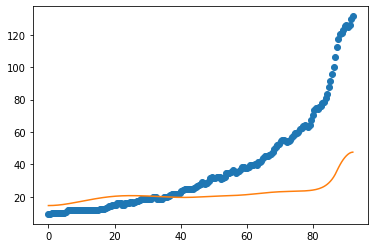

after perturb [4.168576826130723, 53.20372193207728, 25816.06025647759, 4.707419843550921, 44.211966393301815]
parameters [4.168576826130723, 53.20372193207728, 25816.06025647759, 4.707419843550921, 44.211966393301815]
oxigeno [6.76857720e-40 7.44617765e-40 9.61466123e-40 1.37087944e-39
 2.05514425e-39 3.15227293e-39 4.88453252e-39 7.60469181e-39
 1.18699534e-38 1.85596236e-38 2.90622681e-38 4.55736262e-38
 7.15714917e-38 1.12573908e-37 1.77351756e-37 2.79871386e-37
 4.42412105e-37 7.00577485e-37 1.11136432e-36 1.76617602e-36
 2.81184394e-36 4.48463759e-36 7.16537369e-36 1.14688467e-35
 1.83891654e-35 2.95362760e-35 4.75213998e-35 7.65859486e-35
 1.23628971e-34 1.99887587e-34 3.23688350e-34 5.24956418e-34
 8.52612160e-34 1.38671371e-33 2.25840437e-33 3.68270070e-33
 6.01241256e-33 9.82684716e-33 1.60777731e-32 2.63296421e-32
 4.31549510e-32 7.07848998e-32 1.16180028e-31 1.90791493e-31
 3.13457571e-31 5.15165250e-31 8.46874383e-31 1.39236780e-30
 2.28934469e-30 3.76402573e-30 6.18789212

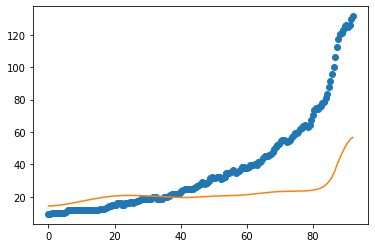

after perturb [4.247784738969334, 93.900596189811, 28006.046587694345, 1.964647133790114, 17.936516433729928]
parameters [4.247784738969334, 93.900596189811, 28006.046587694345, 1.964647133790114, 17.936516433729928]
oxigeno [6.79151770e-20 6.96115204e-20 7.47858605e-20 8.36987410e-20
 9.68000503e-20 1.14753444e-19 1.38472499e-19 1.69170692e-19
 2.08428128e-19 2.58278903e-19 3.21324231e-19 4.00878011e-19
 5.01153417e-19 6.27501629e-19 7.86716935e-19 9.87426535e-19
 1.24058853e-18 1.56012828e-18 1.96375191e-18 2.47398668e-18
 3.11951214e-18 3.93686424e-18 4.97261793e-18 6.28618381e-18
 7.95339316e-18 1.00710954e-17 1.27630555e-17 1.61875218e-17
 2.05469382e-17 2.61004108e-17 3.31797119e-17 4.22098237e-17
 5.37353100e-17 6.84541624e-17 8.72612326e-17 1.11303951e-16
 1.42053784e-16 1.81397844e-16 2.31756279e-16 2.96232645e-16
 3.78806420e-16 4.84579349e-16 6.20090538e-16 7.93719240e-16
 1.01619954e-15 1.30127765e-15 1.66655104e-15 2.13453917e-15
 2.73404925e-15 3.50191764e-15 4.48522951e-

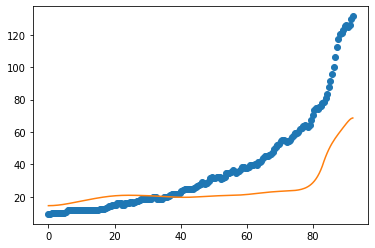

6
after perturb [8.027351603585162, 167.58994701093786, 23584.757859786987, 2.7893672424114895, 24.25360179020894]
parameters [8.027351603585162, 167.58994701093786, 23584.757859786987, 2.7893672424114895, 24.25360179020894]
after perturb [10.404220859437054, 90.45542890419193, 20400.576565236748, 8.48297446040059, 35.98766989722789]
parameters [10.404220859437054, 90.45542890419193, 20400.576565236748, 8.48297446040059, 35.98766989722789]
after perturb [-5.345951024538085, 46.292196180860614, 26706.441877740595, 2.9671124099865733, 56.613519863675066]
parameters [-5.345951024538085, 46.292196180860614, 26706.441877740595, 2.9671124099865733, 56.613519863675066]
after perturb [0.536340445149623, 63.249885994988276, 17077.531454965574, 2.270855118637326, 23.97775645046636]
parameters [0.536340445149623, 63.249885994988276, 17077.531454965574, 2.270855118637326, 23.97775645046636]
after perturb [11.11373559382122, 177.83049984938594, 21047.28055276599, 9.105305643335727, 1.85102862690366

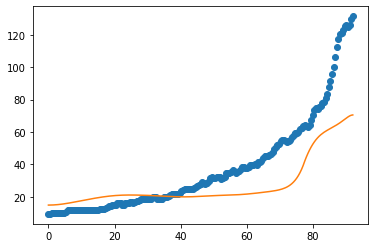

7
after perturb [-5.278670608580574, 35.925236649359945, 24137.447934171796, -0.7570274068111927, 40.70278865335198]
parameters [-5.278670608580574, 35.925236649359945, 24137.447934171796, -0.7570274068111927, 40.70278865335198]
after perturb [6.0979438873685705, 96.82944771665314, 19656.980463605352, 7.582395167279602, 24.099706533178676]
parameters [6.0979438873685705, 96.82944771665314, 19656.980463605352, 7.582395167279602, 24.099706533178676]
after perturb [14.033348461063692, 158.9809179163717, 27837.08001912594, 5.162178681942791, 17.673063211251247]
parameters [14.033348461063692, 158.9809179163717, 27837.08001912594, 5.162178681942791, 17.673063211251247]
after perturb [1.0770255272073084, 86.72723575421159, 35135.49842654794, 1.6400068572375583, 29.605282637702267]
parameters [1.0770255272073084, 86.72723575421159, 35135.49842654794, 1.6400068572375583, 29.605282637702267]
after perturb [8.602070583303965, 113.69214520278372, 15297.133136503893, 6.616211930921304, 21.22119260

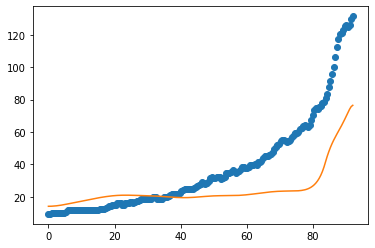

8
after perturb [1.2699621831169106, 21.565637050854583, 25123.02178094872, 3.8840381807537696, 24.92593812954143]
parameters [1.2699621831169106, 21.565637050854583, 25123.02178094872, 3.8840381807537696, 24.92593812954143]
oxigeno [1.33451756e-58 1.64337409e-58 2.71300040e-58 5.04019042e-58
 9.71123798e-58 1.89209084e-57 3.70294095e-57 7.26800167e-57
 1.43032605e-56 2.82239597e-56 5.58455989e-56 1.10806387e-55
 2.20470687e-55 4.39886816e-55 8.80067557e-55 1.76539621e-54
 3.55033959e-54 7.15707290e-54 1.44599241e-53 2.92743802e-53
 5.93793365e-53 1.20659622e-52 2.45609907e-52 5.00833405e-52
 1.02314106e-51 2.09421446e-51 4.29540870e-51 8.82942944e-51
 1.81900612e-50 3.75587965e-50 7.77212881e-50 1.61164785e-49
 3.34840609e-49 6.96909074e-49 1.45286001e-48 3.03344739e-48
 6.34291567e-48 1.32822952e-47 2.78542094e-47 5.84982166e-47
 1.23031238e-46 2.59102279e-46 5.46310945e-46 1.15296592e-45
 2.43480734e-45 5.14309857e-45 1.08624164e-44 2.29298172e-44
 4.83607531e-44 1.01876585e-43 2.14

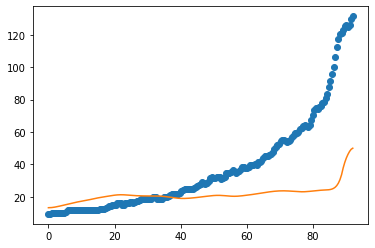

after perturb [-1.1511886238427493, 88.74337345724138, 30484.774171329, 0.8743687214355151, 18.09189844648375]
parameters [-1.1511886238427493, 88.74337345724138, 30484.774171329, 0.8743687214355151, 18.09189844648375]
after perturb [4.023955006145177, 114.67401358471109, 22021.609147728395, -0.33991423133484333, 43.316537294784084]
parameters [4.023955006145177, 114.67401358471109, 22021.609147728395, -0.33991423133484333, 43.316537294784084]
after perturb [8.549577157848887, 59.54891694607963, 18087.417012562564, 10.036080623947266, 68.11596734791331]
parameters [8.549577157848887, 59.54891694607963, 18087.417012562564, 10.036080623947266, 68.11596734791331]
after perturb [16.73969160768236, 162.22810183695975, 17099.321433850586, 17.913471220583556, 87.70621359592874]
parameters [16.73969160768236, 162.22810183695975, 17099.321433850586, 17.913471220583556, 87.70621359592874]
after perturb [3.8073601781388, 85.90413138546981, 21282.520899681447, 2.149842292673465, 1.6782940738151169

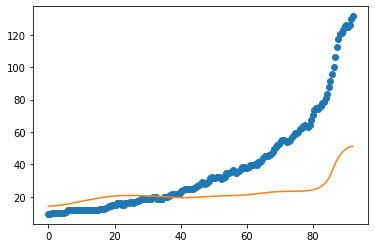

after perturb [7.665484167411396, 102.73811080781206, 21379.262653476453, -7.272191233561295, 36.48029214708519]
parameters [7.665484167411396, 102.73811080781206, 21379.262653476453, -7.272191233561295, 36.48029214708519]
after perturb [7.084672384126906, 159.61494548881547, 25882.984463801295, 16.067138737245266, 9.682834863983032]
parameters [7.084672384126906, 159.61494548881547, 25882.984463801295, 16.067138737245266, 9.682834863983032]
after perturb [11.19689715248889, 97.27188147282506, 25801.192424621877, 1.117554591511253, 24.25286109756106]
parameters [11.19689715248889, 97.27188147282506, 25801.192424621877, 1.117554591511253, 24.25286109756106]
after perturb [0.6186021273328479, 34.96432178942139, 9527.512417777876, 5.289690954441613, 49.36545323998655]
parameters [0.6186021273328479, 34.96432178942139, 9527.512417777876, 5.289690954441613, 49.36545323998655]
after perturb [1.7800997633212936, 60.00883319371867, 29484.721072673845, 3.2457798380556313, 45.67713052535739]
par

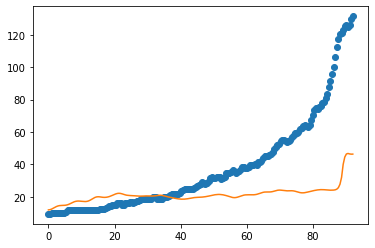

after perturb [-0.6971017114164164, 109.85007349481081, 29804.843716202588, 7.163306686409971, 24.359858178144435]
parameters [-0.6971017114164164, 109.85007349481081, 29804.843716202588, 7.163306686409971, 24.359858178144435]
after perturb [5.9701880159187, 72.75900777138531, 25840.442374094302, -4.627048789368617, 23.569800195065834]
parameters [5.9701880159187, 72.75900777138531, 25840.442374094302, -4.627048789368617, 23.569800195065834]
after perturb [3.0079253791835128, 57.97493147429734, 25185.005981910923, -6.263272354155256, 49.690179348813125]
parameters [3.0079253791835128, 57.97493147429734, 25185.005981910923, -6.263272354155256, 49.690179348813125]
after perturb [6.061085437993128, 50.059941359668855, 24056.465307263254, 1.587709639537584, 38.07996676403055]
parameters [6.061085437993128, 50.059941359668855, 24056.465307263254, 1.587709639537584, 38.07996676403055]
oxigeno [3.35245398e-25 3.50236968e-25 3.96545726e-25 4.78295194e-25
 6.02773916e-25 7.81100733e-25 1.029242

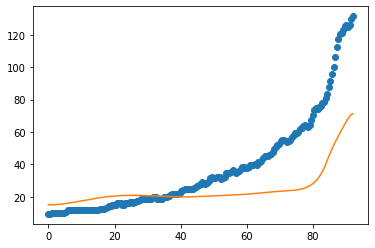

9
after perturb [1.7365000969858846, 36.08962188456412, 21480.76130319964, 11.2164041028725, 4.075153804626524]
parameters [1.7365000969858846, 36.08962188456412, 21480.76130319964, 11.2164041028725, 4.075153804626524]
after perturb [-0.06386136866629966, 75.4153033741409, 25196.312027544667, 1.5523905631229697, 7.143696717993141]
parameters [-0.06386136866629966, 75.4153033741409, 25196.312027544667, 1.5523905631229697, 7.143696717993141]
after perturb [3.8054434209886767, 102.02022705353605, 24421.309428669185, 5.524345275959159, 19.638000239132797]
parameters [3.8054434209886767, 102.02022705353605, 24421.309428669185, 5.524345275959159, 19.638000239132797]
oxigeno [7.12457161e-31 7.52047993e-31 8.75246431e-31 1.09584813e-30
 1.43863627e-30 1.94230075e-30 2.66402337e-30 3.68630503e-30
 5.12689766e-30 7.15310517e-30 1.00022872e-29 1.40112151e-29
 1.96581031e-29 2.76228310e-29 3.88733223e-29 5.47895891e-29
 7.73421002e-29 1.09348600e-28 1.54844371e-28 2.19616764e-28
 3.11977868e-28 4.

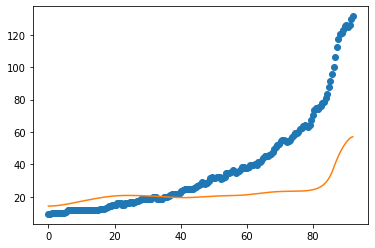

after perturb [-0.9044843852679243, 152.2742804911279, 32943.82065934562, -0.7500717407418183, 40.66197173826638]
parameters [-0.9044843852679243, 152.2742804911279, 32943.82065934562, -0.7500717407418183, 40.66197173826638]
after perturb [6.776511348711426, 146.4240767887695, 27760.1588530177, 8.973370221730626, 39.44907809552431]
parameters [6.776511348711426, 146.4240767887695, 27760.1588530177, 8.973370221730626, 39.44907809552431]
oxigeno [3.08480361e-32 3.27136274e-32 3.85369198e-32 4.90258157e-32
 6.54583569e-32 8.98435531e-32 1.25175501e-31 1.75814509e-31
 2.48046127e-31 3.50893320e-31 4.97291941e-31 7.05790268e-31
 1.00300697e-30 1.42718927e-30 2.03337011e-30 2.90085308e-30
 4.14409132e-30 5.92852170e-30 8.49364418e-30 1.21867079e-29
 1.75119449e-29 2.52026225e-29 3.63266216e-29 5.24413316e-29
 7.58211611e-29 1.09792079e-28 1.59224056e-28 2.31256660e-28
 3.36369187e-28 4.89960291e-28 7.14681590e-28 1.04388762e-27
 1.52673963e-27 2.23576047e-27 3.27802376e-27 4.81173293e-27
 7.

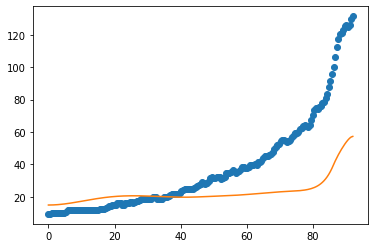

after perturb [-0.601439718072883, 124.6354221374443, 31150.895556956242, -3.332422697630334, 19.431482443938787]
parameters [-0.601439718072883, 124.6354221374443, 31150.895556956242, -3.332422697630334, 19.431482443938787]
after perturb [-5.041909805866074, 43.519903933661105, 28965.656961221008, 4.799842240693632, 21.547045945591798]
parameters [-5.041909805866074, 43.519903933661105, 28965.656961221008, 4.799842240693632, 21.547045945591798]
after perturb [-5.953236321731909, 63.14915659820907, 33858.36785033662, 4.37319620663259, 53.79963003098441]
parameters [-5.953236321731909, 63.14915659820907, 33858.36785033662, 4.37319620663259, 53.79963003098441]
after perturb [2.73705487386903, 34.10485702970951, 19386.765803635495, -5.115381180282428, 28.37165798715092]
parameters [2.73705487386903, 34.10485702970951, 19386.765803635495, -5.115381180282428, 28.37165798715092]
after perturb [-4.680710738887225, -2.062944042897925, 26370.414078107515, 1.2358333933644223, 34.813160640315985]

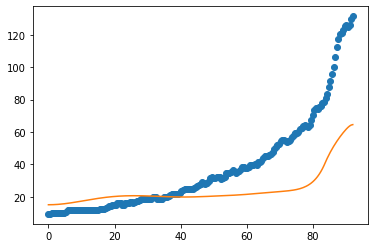

10
after perturb [16.637724155044324, 172.22624928222652, 24893.74883400973, 1.0321892404417714, 15.886291230772269]
parameters [16.637724155044324, 172.22624928222652, 24893.74883400973, 1.0321892404417714, 15.886291230772269]
after perturb [-3.1147239557089916, 86.03773298101251, 29697.898746912455, 5.682149248078206, 45.956280063709364]
parameters [-3.1147239557089916, 86.03773298101251, 29697.898746912455, 5.682149248078206, 45.956280063709364]
after perturb [-1.4234426602714962, -57.54501115823683, 17540.28446338069, -5.611844078517861, 37.4502948257143]
parameters [-1.4234426602714962, -57.54501115823683, 17540.28446338069, -5.611844078517861, 37.4502948257143]
after perturb [4.78566446218051, 85.79333904509173, 28249.214019813353, 4.548654916616951, 14.890350969698158]
parameters [4.78566446218051, 85.79333904509173, 28249.214019813353, 4.548654916616951, 14.890350969698158]
oxigeno [6.87506834e-31 7.26996713e-31 8.50015342e-31 1.07075211e-30
 1.41473211e-30 1.92187735e-30 2.651

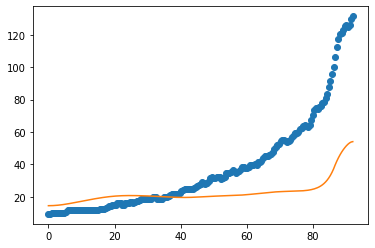

after perturb [3.915249115613544, 51.99271813042341, 21157.072223015017, 3.0400673178017152, 77.91077046581282]
parameters [3.915249115613544, 51.99271813042341, 21157.072223015017, 3.0400673178017152, 77.91077046581282]
after perturb [2.040799097696585, 141.7831382131775, 21990.964824717295, -3.360661205735738, 2.090726730221945]
parameters [2.040799097696585, 141.7831382131775, 21990.964824717295, -3.360661205735738, 2.090726730221945]
after perturb [13.338032799542004, 84.79437215365368, 22987.943956849194, 7.841276254269773, 33.90778344240569]
parameters [13.338032799542004, 84.79437215365368, 22987.943956849194, 7.841276254269773, 33.90778344240569]
after perturb [0.6058616543627346, 102.0627238113545, 25468.83953361413, 4.8072205250876205, 23.606805431913255]
parameters [0.6058616543627346, 102.0627238113545, 25468.83953361413, 4.8072205250876205, 23.606805431913255]
oxigeno [7.25213241e-29 7.57581162e-29 8.57812039e-29 1.03565007e-28
 1.30856541e-28 1.70367833e-28 2.26064292e-28

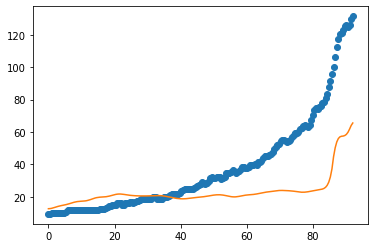

after perturb [-5.146755873115898, 85.8216268281643, 20642.38556428514, 3.2748195752827947, 9.569313256797743]
parameters [-5.146755873115898, 85.8216268281643, 20642.38556428514, 3.2748195752827947, 9.569313256797743]
after perturb [1.0745455456892965, 28.86516770078218, 27055.171202854697, -0.6240933203166221, 72.2666176814592]
parameters [1.0745455456892965, 28.86516770078218, 27055.171202854697, -0.6240933203166221, 72.2666176814592]
after perturb [0.2780238893488516, 27.771320065854837, 17499.275763505793, -2.258088962067275, 19.737753443449453]
parameters [0.2780238893488516, 27.771320065854837, 17499.275763505793, -2.258088962067275, 19.737753443449453]
after perturb [2.3542457997352035, 67.0410000886575, 24556.81871538789, 12.001384286547992, 21.582011032447678]
parameters [2.3542457997352035, 67.0410000886575, 24556.81871538789, 12.001384286547992, 21.582011032447678]
after perturb [14.04422563604105, 82.90831861623185, 20422.376414929575, 9.502305313615793, 46.714126062688166

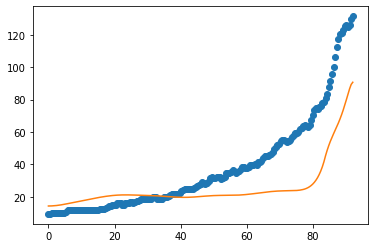

11
after perturb [12.982216578140086, 159.7588918588777, 16012.69249979651, -1.7255729567457698, -16.801959379028034]
parameters [12.982216578140086, 159.7588918588777, 16012.69249979651, -1.7255729567457698, -16.801959379028034]
after perturb [-5.559922524184262, -7.552359902001228, 25818.83722986433, -1.6975608281174344, 45.216399383518024]
parameters [-5.559922524184262, -7.552359902001228, 25818.83722986433, -1.6975608281174344, 45.216399383518024]
after perturb [3.967472143784849, 70.71458558291665, 17096.016598746864, 6.862284460466059, 52.6694874886962]
parameters [3.967472143784849, 70.71458558291665, 17096.016598746864, 6.862284460466059, 52.6694874886962]
after perturb [5.4141288659656395, 183.18760303054017, 35835.40468478561, 3.449323055767355, 37.19882669357024]
parameters [5.4141288659656395, 183.18760303054017, 35835.40468478561, 3.449323055767355, 37.19882669357024]
after perturb [15.744222351326918, 214.92439465804728, 30266.87279177091, 9.757410855861945, 45.782169067

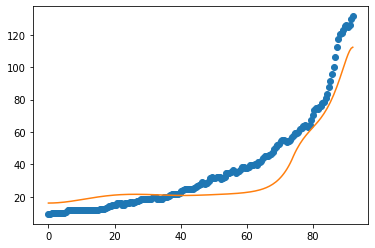

12
after perturb [5.120693227660659, 98.45165109613022, 19201.843946457513, 3.8373482286413636, 31.156640278164286]
parameters [5.120693227660659, 98.45165109613022, 19201.843946457513, 3.8373482286413636, 31.156640278164286]
after perturb [-0.5059753171839763, 32.08611175589101, 24505.676082065966, 3.482996759772455, 28.29275686130384]
parameters [-0.5059753171839763, 32.08611175589101, 24505.676082065966, 3.482996759772455, 28.29275686130384]
after perturb [-2.5995740726985783, 59.614981735822866, 30215.509098416274, 1.4154680135452398, 43.253968752130916]
parameters [-2.5995740726985783, 59.614981735822866, 30215.509098416274, 1.4154680135452398, 43.253968752130916]
after perturb [2.0012084779519106, 91.14353567137627, 25872.129042832217, 5.944879880141761, 80.71746507322007]
parameters [2.0012084779519106, 91.14353567137627, 25872.129042832217, 5.944879880141761, 80.71746507322007]
after perturb [-2.9665162362113513, 30.270032795945873, 26822.134605556577, 1.433978006531686, 37.018

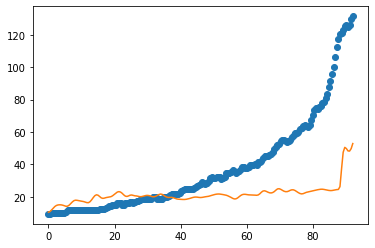

after perturb [5.180831155539649, 167.82127380722977, 19367.24127481335, 7.696566882460121, 31.025049196182618]
parameters [5.180831155539649, 167.82127380722977, 19367.24127481335, 7.696566882460121, 31.025049196182618]
after perturb [7.849943496522837, 142.05807602024845, 23500.948688662927, 12.820811173010341, 14.398771512355044]
parameters [7.849943496522837, 142.05807602024845, 23500.948688662927, 12.820811173010341, 14.398771512355044]
after perturb [-9.091796454535864, 31.045740068282406, 36299.84999030788, 6.101770195532709, 8.20072021423852]
parameters [-9.091796454535864, 31.045740068282406, 36299.84999030788, 6.101770195532709, 8.20072021423852]
after perturb [1.794517704905529, 65.28895733052791, 27118.705112416923, -0.46614035656713537, -6.724535876205962]
parameters [1.794517704905529, 65.28895733052791, 27118.705112416923, -0.46614035656713537, -6.724535876205962]
after perturb [10.111233708120205, 100.66436012442448, 19555.881641663153, 3.099923964721686, 58.47967306253

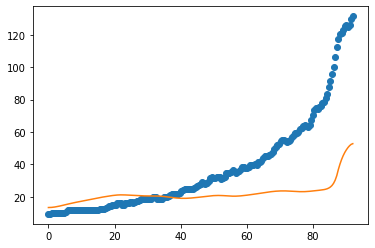

after perturb [12.64129574281879, 225.96043600488073, 27769.902671413718, 1.6170878035617966, -17.35958070188201]
parameters [12.64129574281879, 225.96043600488073, 27769.902671413718, 1.6170878035617966, -17.35958070188201]
after perturb [-2.885217052167926, 63.17114923844863, 29405.667502545137, -9.925973278451288, 31.5654457828589]
parameters [-2.885217052167926, 63.17114923844863, 29405.667502545137, -9.925973278451288, 31.5654457828589]
after perturb [3.376482091619117, 73.1864497288568, 25101.376952512397, 2.5006352468624957, 4.529245828849248]
parameters [3.376482091619117, 73.1864497288568, 25101.376952512397, 2.5006352468624957, 4.529245828849248]
oxigeno [1.13841795e-25 1.18451116e-25 1.32654023e-25 1.57607560e-25
 1.95350453e-25 2.48979152e-25 3.22916470e-25 4.23297477e-25
 5.58508240e-25 7.39927301e-25 9.82938876e-25 1.30831257e-24
 1.74407931e-24 2.32808098e-24 3.11143618e-24 4.16325367e-24
 5.57704712e-24 7.47947211e-24 1.00422359e-23 1.34983467e-23
 1.81643020e-23 2.4470

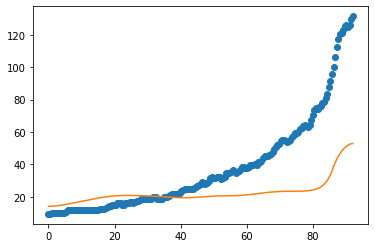

after perturb [-1.942809060220199, 68.74814633693939, 25140.171664925074, 3.1830420442406973, 50.00482353925397]
parameters [-1.942809060220199, 68.74814633693939, 25140.171664925074, 3.1830420442406973, 50.00482353925397]
after perturb [10.971975170682216, 101.92369545330713, 17684.304220264807, 11.875831981323252, 31.88014904447534]
parameters [10.971975170682216, 101.92369545330713, 17684.304220264807, 11.875831981323252, 31.88014904447534]
after perturb [-1.6954794772314306, 26.679944349241694, 25016.15728876961, 5.288948077461752, 42.519867420547406]
parameters [-1.6954794772314306, 26.679944349241694, 25016.15728876961, 5.288948077461752, 42.519867420547406]
after perturb [-4.779695888253867, -18.266146286361035, 34435.31734527214, 1.1379124870624149, 27.249220200868425]
parameters [-4.779695888253867, -18.266146286361035, 34435.31734527214, 1.1379124870624149, 27.249220200868425]
after perturb [2.282614160026884, 90.81681556833564, 26067.317581167317, 5.017049224140144, -11.7532

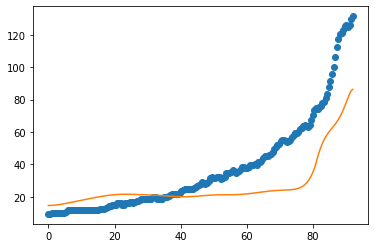

13
after perturb [4.506297586298466, 56.49149816925615, 23128.904534791374, 8.018290869468606, -5.730674334655218]
parameters [4.506297586298466, 56.49149816925615, 23128.904534791374, 8.018290869468606, -5.730674334655218]
after perturb [2.739658072516672, 126.71723015925893, 19225.893592885463, 7.470866405259504, 18.295785444799062]
parameters [2.739658072516672, 126.71723015925893, 19225.893592885463, 7.470866405259504, 18.295785444799062]
after perturb [4.659555354013708, 106.46388450281528, 22678.81686358272, 7.444542499010788, 26.443163531408306]
parameters [4.659555354013708, 106.46388450281528, 22678.81686358272, 7.444542499010788, 26.443163531408306]
oxigeno [1.01457057e-34 1.08569495e-34 1.30907985e-34 1.71621689e-34
 2.36466868e-34 3.34649790e-34 4.80183069e-34 6.93965327e-34
 1.00690840e-33 1.46460355e-33 2.13426624e-33 3.11506971e-33
 4.55353358e-33 6.66647017e-33 9.77525216e-33 1.43570686e-32
 2.11217156e-32 3.11268265e-32 4.59510617e-32 6.79548125e-32
 1.00673248e-31 1.4

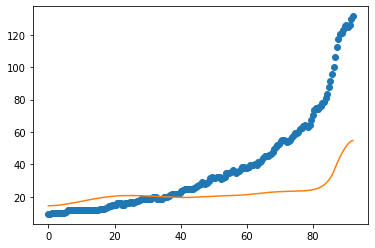

after perturb [1.3008714290363255, 81.31684643842732, 28929.641256968895, 2.7316111238994143, 38.01867345357703]
parameters [1.3008714290363255, 81.31684643842732, 28929.641256968895, 2.7316111238994143, 38.01867345357703]
oxigeno [6.81095515e-25 7.06192899e-25 7.83383512e-25 9.18524687e-25
 1.12193183e-24 1.40925647e-24 1.80281765e-24 2.33350170e-24
 3.04339851e-24 3.98941111e-24 5.24816660e-24 6.92267682e-24
 9.15135477e-24 1.21202022e-23 1.60792614e-23 2.13647999e-23
 2.84292068e-23 3.78812929e-23 5.05406756e-23 6.75113283e-23
 9.02813268e-23 1.20858544e-22 1.61955792e-22 2.17243999e-22
 2.91698910e-22 3.92075989e-22 5.27560641e-22 7.10657511e-22
 9.58405412e-22 1.29403568e-21 1.74923534e-21 2.36723732e-21
 3.20704581e-21 4.34922452e-21 5.90384259e-21 8.02140299e-21
 1.09078913e-20 1.48455058e-20 2.02211953e-20 2.75658823e-20
 3.76082474e-20 5.13482789e-20 7.01575606e-20 9.59156581e-20
 1.31195189e-19 1.79512565e-19 2.45667421e-19 3.36201984e-19
 4.60022965e-19 6.29243933e-19 8.6032

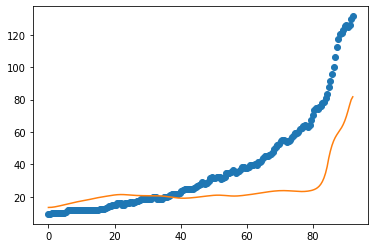

14
after perturb [0.5921129141844172, 75.14771139515392, 25310.124125905393, -0.2902048449733703, 42.05735062272261]
parameters [0.5921129141844172, 75.14771139515392, 25310.124125905393, -0.2902048449733703, 42.05735062272261]
after perturb [5.590230103415328, 58.217357196529015, 19877.66095695863, 6.796533561568436, 10.064461065985338]
parameters [5.590230103415328, 58.217357196529015, 19877.66095695863, 6.796533561568436, 10.064461065985338]
after perturb [1.9007992068423398, 39.432093202665015, 24885.827867692453, 3.5922046153545826, 46.07231767799105]
parameters [1.9007992068423398, 39.432093202665015, 24885.827867692453, 3.5922046153545826, 46.07231767799105]
oxigeno [3.18045393e-41 3.52680996e-41 4.64147112e-41 6.76825271e-41
 1.03743082e-40 1.62563241e-40 2.57229564e-40 4.08969968e-40
 6.52097899e-40 1.04207393e-39 1.66864672e-39 2.67729275e-39
 4.30424086e-39 6.93376897e-39 1.11920671e-38 1.81012149e-38
 2.93321217e-38 4.76206116e-38 7.74528675e-38 1.26196308e-37
 2.05968296e-

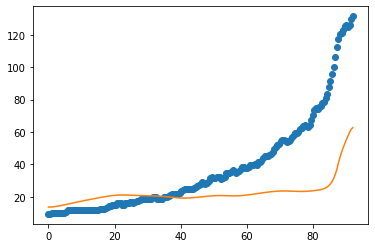

after perturb [7.090678804225964, 119.18583301559059, 23022.11794236032, 11.825943535136535, 4.759077623712265]
parameters [7.090678804225964, 119.18583301559059, 23022.11794236032, 11.825943535136535, 4.759077623712265]
after perturb [11.099915325625382, 140.88768457272258, 19635.366955609647, 0.7643928200234695, 1.0426097612465388]
parameters [11.099915325625382, 140.88768457272258, 19635.366955609647, 0.7643928200234695, 1.0426097612465388]
after perturb [6.2111544803133745, 68.6215585111329, 17659.472161835532, 5.487375352130103, -9.619215430045298]
parameters [6.2111544803133745, 68.6215585111329, 17659.472161835532, 5.487375352130103, -9.619215430045298]
after perturb [1.8014512682453199, 100.29774778602386, 21261.645986501622, -1.8342118243264098, 30.423998464403233]
parameters [1.8014512682453199, 100.29774778602386, 21261.645986501622, -1.8342118243264098, 30.423998464403233]
after perturb [1.7233841599298636, 137.37394915409027, 25222.25021658044, 3.49849509510139, 20.3368647

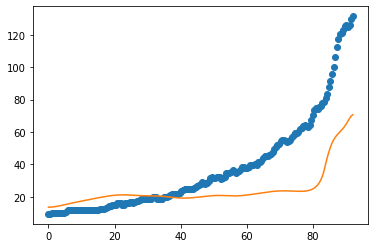

15
after perturb [13.178531307006217, 142.09799453420504, 15265.09610713804, 12.015374758311168, 25.007306601219852]
parameters [13.178531307006217, 142.09799453420504, 15265.09610713804, 12.015374758311168, 25.007306601219852]
after perturb [6.047010140845219, 58.915043483731424, 17874.904355247974, -1.5967516325930426, 19.65798379271453]
parameters [6.047010140845219, 58.915043483731424, 17874.904355247974, -1.5967516325930426, 19.65798379271453]
after perturb [-2.534834017752244, 63.963494057764755, 28851.75352926254, 8.647491591673822, 7.121705404169001]
parameters [-2.534834017752244, 63.963494057764755, 28851.75352926254, 8.647491591673822, 7.121705404169001]
after perturb [9.640874780022083, 180.64546107179814, 20807.596892722417, 4.081803906544495, 14.90760846055359]
parameters [9.640874780022083, 180.64546107179814, 20807.596892722417, 4.081803906544495, 14.90760846055359]
after perturb [9.075495904979958, 159.50272410445623, 24463.395863523878, 1.6458778979951447, 17.59754497

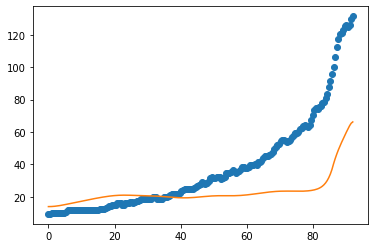

after perturb [10.92040968465325, 149.27732715909823, 21138.16613802437, 11.203950459455683, 19.674368188791924]
parameters [10.92040968465325, 149.27732715909823, 21138.16613802437, 11.203950459455683, 19.674368188791924]
after perturb [0.6728385142404663, 52.05742282450265, 29645.811624731934, 9.038157692297888, 69.39077818934737]
parameters [0.6728385142404663, 52.05742282450265, 29645.811624731934, 9.038157692297888, 69.39077818934737]
after perturb [10.747217094091305, 131.27941414037576, 25650.521997527565, 17.244416533702996, 87.03725161881034]
parameters [10.747217094091305, 131.27941414037576, 25650.521997527565, 17.244416533702996, 87.03725161881034]
after perturb [6.200229549060509, 140.92532859290216, 30187.622345094005, 9.49202401567808, 21.23367644186121]
parameters [6.200229549060509, 140.92532859290216, 30187.622345094005, 9.49202401567808, 21.23367644186121]
after perturb [1.9842295933357774, 121.00686711512219, 23667.051048572765, 6.108742905230164, 46.07762272898574]

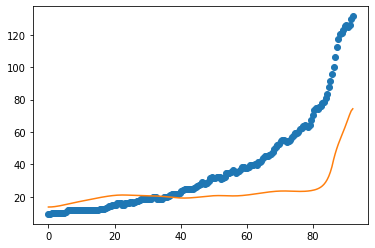

after perturb [9.579826019652693, 146.75805402741497, 22157.758481686702, -0.3107007842479139, 33.16368463366023]
parameters [9.579826019652693, 146.75805402741497, 22157.758481686702, -0.3107007842479139, 33.16368463366023]
after perturb [-0.32347490187397687, -49.41748168122669, 20314.208411440275, 3.2036573036912546, 55.130572300831396]
parameters [-0.32347490187397687, -49.41748168122669, 20314.208411440275, 3.2036573036912546, 55.130572300831396]
after perturb [6.836972134809711, 61.71305097937551, 27392.8937167814, 2.6266844013840314, 45.70837765271864]
parameters [6.836972134809711, 61.71305097937551, 27392.8937167814, 2.6266844013840314, 45.70837765271864]
oxigeno [2.64279661e-28 2.78303544e-28 3.21860033e-28 3.99564309e-28
 5.19661885e-28 6.94924183e-28 9.44040662e-28 1.29366510e-27
 1.78134878e-27 2.45969591e-27 3.40221918e-27 4.71157268e-27
 6.53112009e-27 9.06119217e-27 1.25819474e-26 1.74855423e-26
 2.43214426e-26 3.38602973e-26 4.71840638e-26 6.58132819e-26
 9.18869615e-2

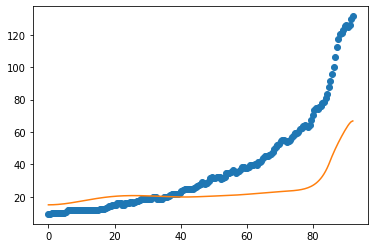

16
after perturb [4.629529596559994, 100.86652509536879, 22495.712579382074, -5.077016791340146, 20.718940519914014]
parameters [4.629529596559994, 100.86652509536879, 22495.712579382074, -5.077016791340146, 20.718940519914014]
after perturb [3.2358135392982894, 70.9772261828249, 22203.24047644988, 2.274168918968455, 19.437188544240083]
parameters [3.2358135392982894, 70.9772261828249, 22203.24047644988, 2.274168918968455, 19.437188544240083]
oxigeno [1.13917739e-24 1.18309559e-24 1.31825223e-24 1.55513265e-24
 1.91216737e-24 2.41725186e-24 3.11005710e-24 4.04533335e-24
 5.29749782e-24 6.96691103e-24 9.18839865e-24 1.21427780e-23
 1.60724212e-23 2.13022566e-23 2.82681083e-23 3.75549548e-23
 4.99486076e-23 6.65055700e-23 8.86475436e-23 1.18289385e-22
 1.58012498e-22 2.11299984e-22 2.82855814e-22 3.79038369e-22
 5.08449767e-22 6.82737525e-22 9.17685729e-22 1.23470113e-21
 1.66283817e-21 2.24155950e-21 3.02450059e-21 4.08460515e-21
 5.52113165e-21 7.46921406e-21 1.01129077e-20 1.37029891e

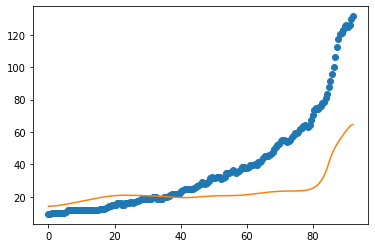

after perturb [-14.826120769668387, -40.27206754052216, 26158.94082510617, -2.912282836766722, 49.66322025209715]
parameters [-14.826120769668387, -40.27206754052216, 26158.94082510617, -2.912282836766722, 49.66322025209715]
after perturb [12.46109986081081, 102.31899346998551, 10397.698221118555, 9.395839104504649, 18.657891482171742]
parameters [12.46109986081081, 102.31899346998551, 10397.698221118555, 9.395839104504649, 18.657891482171742]
after perturb [-1.7189266094404032, 47.81677361845186, 20823.373778583984, 1.139921984409647, 45.33888744482945]
parameters [-1.7189266094404032, 47.81677361845186, 20823.373778583984, 1.139921984409647, 45.33888744482945]
after perturb [6.736277000950425, 101.60845181078547, 23744.57839149211, 14.570176819776654, 47.76145646824362]
parameters [6.736277000950425, 101.60845181078547, 23744.57839149211, 14.570176819776654, 47.76145646824362]
after perturb [1.881815883848768, 73.17212624699827, 30617.866404854758, 6.852471704999371, 9.74029457571217

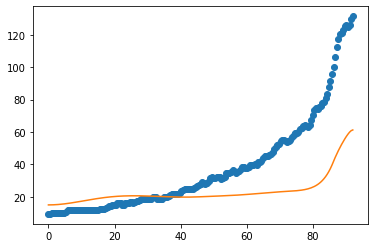

after perturb [9.880444406657727, 116.65983049453149, 27813.21236730174, 5.734912196019097, 25.163785686002328]
parameters [9.880444406657727, 116.65983049453149, 27813.21236730174, 5.734912196019097, 25.163785686002328]
oxigeno [2.50004346e-29 2.63185519e-29 3.04120361e-29 3.77133072e-29
 4.89948256e-29 6.54528261e-29 8.88374640e-29 1.21644096e-28
 1.67387443e-28 2.30989981e-28 3.19329249e-28 4.42007461e-28
 6.12433113e-28 8.49341503e-28 1.17893374e-27 1.63788851e-27
 2.27760680e-27 3.17020058e-27 4.41695048e-27 6.16026243e-27
 8.60058776e-27 1.20203897e-26 1.68181230e-26 2.35564513e-26
 3.30307283e-26 4.63663347e-26 6.51571373e-26 9.16625826e-26
 1.29088444e-25 1.81986978e-25 2.56827600e-25 3.62811178e-25
 5.13032481e-25 7.26140354e-25 1.02870961e-24 1.45863087e-24
 2.06995650e-24 2.93982974e-24 4.17839432e-24 5.94296837e-24
 8.45831941e-24 1.20456678e-23 1.71641762e-23 2.44702975e-23
 3.49026611e-23 4.98034728e-23 7.10921068e-23 1.01513280e-22
 1.44991777e-22 2.07139334e-22 2.959787

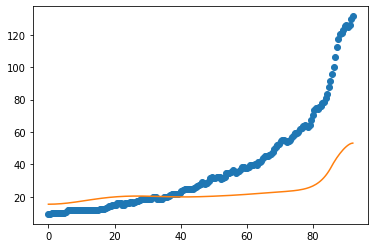

after perturb [3.904291734272924, 87.86466817139171, 19828.30020785472, 8.907495402795075, 34.2740338093211]
parameters [3.904291734272924, 87.86466817139171, 19828.30020785472, 8.907495402795075, 34.2740338093211]
after perturb [-1.1081716982276186, 13.135246736397935, 27268.842236227847, -3.2343864028041747, 36.90977350574703]
parameters [-1.1081716982276186, 13.135246736397935, 27268.842236227847, -3.2343864028041747, 36.90977350574703]
after perturb [7.676493178786322, 98.4626192609517, 18840.64125140006, -1.1670912921920706, -0.7802412904536506]
parameters [7.676493178786322, 98.4626192609517, 18840.64125140006, -1.1670912921920706, -0.7802412904536506]
after perturb [11.239824926140898, 180.65504274875047, 19057.642926240173, 9.873312039136668, -7.463952691388851]
parameters [11.239824926140898, 180.65504274875047, 19057.642926240173, 9.873312039136668, -7.463952691388851]
after perturb [-1.3715946695185748, 51.356537697719645, 23793.002801137533, 0.8355063382676845, 69.839122337

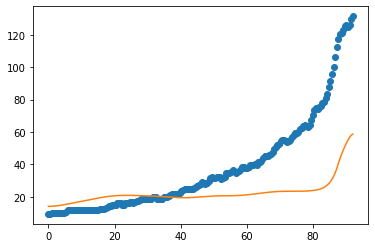

after perturb [-3.9084309862121938, -41.52529836282554, 26912.518934813175, 7.328362309960481, 71.68465899882278]
parameters [-3.9084309862121938, -41.52529836282554, 26912.518934813175, 7.328362309960481, 71.68465899882278]
after perturb [1.1606511071463588, 82.65648424958576, 23218.1127661251, -5.083546210404779, 21.71995737049656]
parameters [1.1606511071463588, 82.65648424958576, 23218.1127661251, -5.083546210404779, 21.71995737049656]
after perturb [-7.514699854626917, 24.421220497064603, 38070.31519108347, 10.52325481533843, 55.89463410178717]
parameters [-7.514699854626917, 24.421220497064603, 38070.31519108347, 10.52325481533843, 55.89463410178717]
after perturb [-0.9150830889815253, 23.802463870769156, 26214.716453460394, -0.5113952994795476, 22.70066551849432]
parameters [-0.9150830889815253, 23.802463870769156, 26214.716453460394, -0.5113952994795476, 22.70066551849432]
after perturb [14.168424584810456, 162.50781176761976, 21842.362112217033, -2.763216328795302, 44.74201045

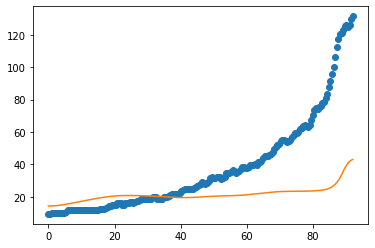

after perturb [-0.62150367392135, 62.888147204896114, 24505.725962173798, 0.06440321371825297, 56.34678325523936]
parameters [-0.62150367392135, 62.888147204896114, 24505.725962173798, 0.06440321371825297, 56.34678325523936]
after perturb [5.63112720542727, 94.80804417610771, 30730.581310813737, 9.00783326179757, 37.56899283505408]
parameters [5.63112720542727, 94.80804417610771, 30730.581310813737, 9.00783326179757, 37.56899283505408]
after perturb [-1.5782191324366757, 38.12613169506065, 31706.19549693623, 5.910391738448843, 63.487610058203806]
parameters [-1.5782191324366757, 38.12613169506065, 31706.19549693623, 5.910391738448843, 63.487610058203806]
after perturb [2.2107055251147822, 82.78361462654858, 17305.92059614775, 5.495292288157513, 43.66838502306924]
parameters [2.2107055251147822, 82.78361462654858, 17305.92059614775, 5.495292288157513, 43.66838502306924]
after perturb [-4.26858431250995, -15.266433110397294, 26957.88617343629, -2.2226673833601645, 10.982807176991884]
par

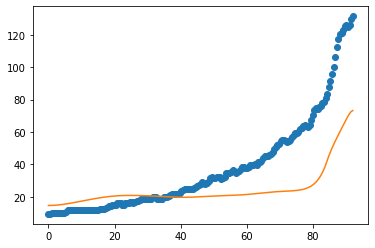

17
after perturb [11.049197452403643, 171.29632925182491, 16823.673437959285, -4.061396777349691, 5.361056906002471]
parameters [11.049197452403643, 171.29632925182491, 16823.673437959285, -4.061396777349691, 5.361056906002471]
after perturb [-2.528385753131934, 85.57674887227017, 33205.43559741156, 10.452687174617015, 85.52875424169493]
parameters [-2.528385753131934, 85.57674887227017, 33205.43559741156, 10.452687174617015, 85.52875424169493]
after perturb [13.930352954892884, 73.55756743038629, 15697.057589525697, -3.9795082817841543, 44.60452586486261]
parameters [13.930352954892884, 73.55756743038629, 15697.057589525697, -3.9795082817841543, 44.60452586486261]
after perturb [7.237741643759778, 98.73291662932601, 24464.991961224307, 4.274041060962713, 7.934916285489637]
parameters [7.237741643759778, 98.73291662932601, 24464.991961224307, 4.274041060962713, 7.934916285489637]
oxigeno [4.97777874e-28 5.21527577e-28 5.95046078e-28 7.25365004e-28
 9.24971624e-28 1.21304390e-27 1.61735

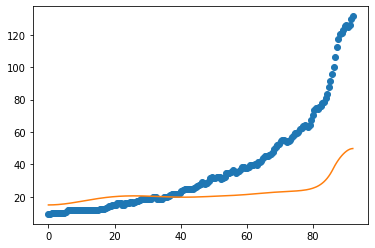

after perturb [3.433659486358299, 117.81476287210492, 23973.93456856846, -6.573043235968151, 28.583061166388738]
parameters [3.433659486358299, 117.81476287210492, 23973.93456856846, -6.573043235968151, 28.583061166388738]
after perturb [-2.787726317826904, 81.06888555526703, 31961.627820598726, 11.449577506855341, 55.159023918006156]
parameters [-2.787726317826904, 81.06888555526703, 31961.627820598726, 11.449577506855341, 55.159023918006156]
after perturb [3.4700794173675478, 23.787516463011276, 17762.235215075132, 8.387187704420615, 22.391336719037938]
parameters [3.4700794173675478, 23.787516463011276, 17762.235215075132, 8.387187704420615, 22.391336719037938]
after perturb [12.005174165078817, 102.45652195578171, 24715.330458724733, 4.4105522049198544, 43.3544295701043]
parameters [12.005174165078817, 102.45652195578171, 24715.330458724733, 4.4105522049198544, 43.3544295701043]
after perturb [7.740428930422992, 73.60252037902671, 23489.35340540851, 4.2670896948437695, 29.912325164

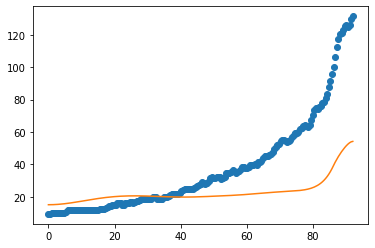

after perturb [-2.1202648026342343, -8.262576313978357, 19873.693250871213, 0.0020406753554267354, 19.164966780959578]
parameters [-2.1202648026342343, -8.262576313978357, 19873.693250871213, 0.0020406753554267354, 19.164966780959578]
after perturb [12.94689811286241, 157.63731902822926, 20122.329752036123, 2.850758095206082, 35.53517766907296]
parameters [12.94689811286241, 157.63731902822926, 20122.329752036123, 2.850758095206082, 35.53517766907296]
after perturb [11.309380242650377, 144.05904551569324, 24743.081697765032, 5.32336316562236, -24.618390176912296]
parameters [11.309380242650377, 144.05904551569324, 24743.081697765032, 5.32336316562236, -24.618390176912296]
after perturb [6.519283697099638, 117.13672930160723, 25453.764072057835, -5.234310421067703, 0.503690412680335]
parameters [6.519283697099638, 117.13672930160723, 25453.764072057835, -5.234310421067703, 0.503690412680335]
after perturb [5.325175359284017, 90.35229818730654, 25272.331756127096, -0.10657739941598188, 7

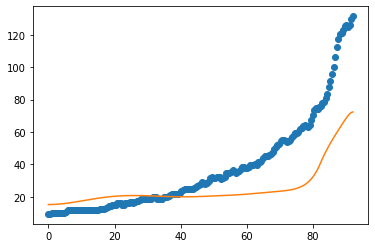

18
after perturb [5.617039941330805, 112.18437161223503, 21703.186460370183, -3.640814880886634, 22.847882428815304]
parameters [5.617039941330805, 112.18437161223503, 21703.186460370183, -3.640814880886634, 22.847882428815304]
after perturb [8.7519549545765, 93.47424262422834, 20637.9199515898, 7.10068485756026, 17.071293999887985]
parameters [8.7519549545765, 93.47424262422834, 20637.9199515898, 7.10068485756026, 17.071293999887985]
oxigeno [2.30845500e-36 2.49453953e-36 3.08280699e-36 4.16821988e-36
 5.92628183e-36 8.64193784e-36 1.27566849e-35 1.89419244e-35
 2.82111329e-35 4.20902113e-35 6.28756092e-35 9.40253929e-35
 1.40752175e-34 2.10923149e-34 3.16428119e-34 4.75261816e-34
 7.14697982e-34 1.07613459e-33 1.62250053e-33 2.44959362e-33
 3.70346043e-33 5.60707273e-33 8.50132629e-33 1.29081303e-32
 1.96276069e-32 2.98880147e-32 4.55772523e-32 6.96007040e-32
 1.06434930e-31 1.62985181e-31 2.49914607e-31 3.83706306e-31
 5.89864620e-31 9.07888505e-31 1.39900266e-30 2.15818227e-30
 3.3

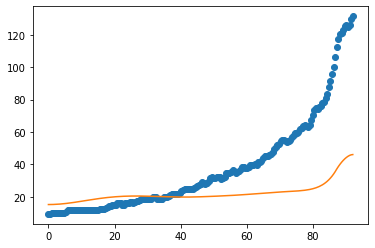

after perturb [-3.3428920035126635, 31.16515211374208, 26365.566677902752, 7.910054997783231, 22.9033584691093]
parameters [-3.3428920035126635, 31.16515211374208, 26365.566677902752, 7.910054997783231, 22.9033584691093]
after perturb [5.541135743825969, 54.57834682592471, 25260.94285106182, 7.0424594988366875, 51.20569741436259]
parameters [5.541135743825969, 54.57834682592471, 25260.94285106182, 7.0424594988366875, 51.20569741436259]
after perturb [1.678529328561142, 110.42625220853265, 24714.768822823364, 7.127594118792347, 20.94052453231117]
parameters [1.678529328561142, 110.42625220853265, 24714.768822823364, 7.127594118792347, 20.94052453231117]
oxigeno [2.08395168e-33 2.21154071e-33 2.61017972e-33 3.32962498e-33
 4.46024675e-33 6.14531766e-33 8.60063830e-33 1.21443556e-32
 1.72413424e-32 2.45686850e-32 3.51120123e-32 5.03070755e-32
 7.22478944e-32 1.03992984e-31 1.50016284e-31 2.16871825e-31
 3.14174565e-31 4.56049616e-31 6.63276766e-31 9.66469269e-31
 1.41079468e-30 2.06299999

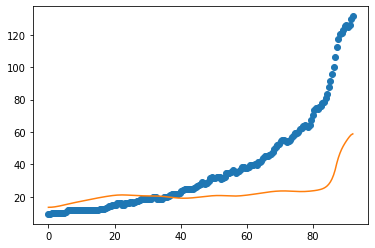

after perturb [2.5984599646738937, -5.063222733954618, 21352.261494475002, -4.636977148538397, 9.080634749048325]
parameters [2.5984599646738937, -5.063222733954618, 21352.261494475002, -4.636977148538397, 9.080634749048325]
after perturb [4.02243712414509, 92.3127599307183, 25354.465503063966, 4.916578592460109, 8.849911054787182]
parameters [4.02243712414509, 92.3127599307183, 25354.465503063966, 4.916578592460109, 8.849911054787182]
oxigeno [6.12538407e-31 6.46959451e-31 7.54108933e-31 9.46103355e-31
 1.24471870e-30 1.68397001e-30 2.31416447e-30 3.20793820e-30
 4.46904197e-30 6.24499654e-30 8.74524447e-30 1.22671489e-29
 1.72332324e-29 2.42445508e-29 3.41572755e-29 4.81927016e-29
 6.80954755e-29 9.63614652e-29 1.36566352e-28 1.93840061e-28
 2.75552628e-28 3.92306936e-28 5.59377353e-28 7.98796968e-28
 1.14238923e-27 1.63617601e-27 2.34679355e-27 3.37083976e-27
 4.84850435e-27 6.98346040e-27 1.00719151e-26 1.45450652e-26
 2.10311773e-26 3.04464083e-26 4.41277217e-26 6.40274682e-26
 9.

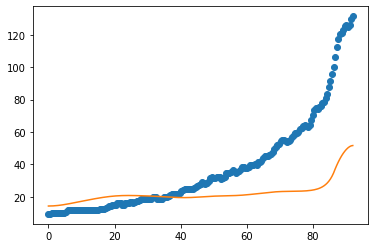

after perturb [2.224709267370092, 16.050136121744913, 25156.607597536204, 1.106134728381641, 18.644766849003933]
parameters [2.224709267370092, 16.050136121744913, 25156.607597536204, 1.106134728381641, 18.644766849003933]
oxigeno [6.02333674e-20 5.99082386e-20 5.89451544e-20 5.73801100e-20
 5.52701702e-20 5.26894440e-20 4.97241178e-20 4.64670716e-20
 4.30125985e-20 3.94516642e-20 3.58680249e-20 3.23353773e-20
 2.89155851e-20 2.56579113e-20 2.25991126e-20 1.97642070e-20
 1.71677105e-20 1.48151537e-20 1.27047098e-20 1.08288033e-20
 9.17560410e-21 7.73034855e-21 6.47645793e-21 5.39644960e-21
 4.47265251e-21 3.68774859e-21 3.02516603e-21 2.46935083e-21
 2.00594038e-21 1.62185979e-21 1.30535795e-21 1.04599685e-21
 8.34605881e-22 6.63210195e-22 5.24941522e-22 4.13938130e-22
 3.25239891e-22 2.54683169e-22 1.98799238e-22 1.54718854e-22
 1.20084692e-22 9.29725361e-23 7.18214856e-23 5.53729816e-23
 4.26181681e-23 3.27529121e-23 2.51397337e-23 1.92758734e-23
 1.47667387e-23 1.13040144e-23 8.6477

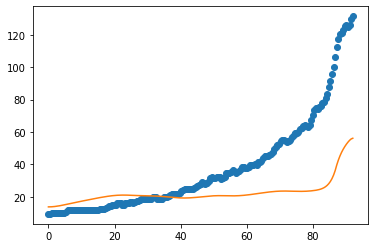

after perturb [-1.3692202198367847, 58.319942990566894, 28405.441039734127, 4.465580615185801, 48.17278593374016]
parameters [-1.3692202198367847, 58.319942990566894, 28405.441039734127, 4.465580615185801, 48.17278593374016]
after perturb [12.628947912577749, 148.96827439224987, 24350.36236404042, -0.5553688148075226, 21.26141366023159]
parameters [12.628947912577749, 148.96827439224987, 24350.36236404042, -0.5553688148075226, 21.26141366023159]
after perturb [14.681905323311316, 158.3632965733738, 27164.93755317262, 1.9165445470005644, -21.885688710671957]
parameters [14.681905323311316, 158.3632965733738, 27164.93755317262, 1.9165445470005644, -21.885688710671957]
after perturb [3.0436592905548547, 11.491630398558897, 16573.975012114643, 0.8565365034015089, 36.92945438964255]
parameters [3.0436592905548547, 11.491630398558897, 16573.975012114643, 0.8565365034015089, 36.92945438964255]
after perturb [14.78490337449006, 94.38936757479308, 20478.208596779794, -0.8604099056014611, -12.50

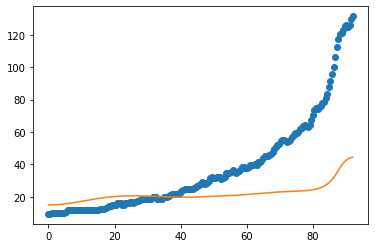

after perturb [14.633572110570887, 44.618569865104384, 14120.481392257943, 3.6078235057250008, 20.800823478670228]
parameters [14.633572110570887, 44.618569865104384, 14120.481392257943, 3.6078235057250008, 20.800823478670228]
after perturb [-0.2251487001700212, 71.24713510723188, 29534.770135194685, 5.649635087288477, 6.354299097978732]
parameters [-0.2251487001700212, 71.24713510723188, 29534.770135194685, 5.649635087288477, 6.354299097978732]
after perturb [1.907213039796606, 42.81076154676072, 26239.293277159148, 10.66389971188255, 25.900620570319436]
parameters [1.907213039796606, 42.81076154676072, 26239.293277159148, 10.66389971188255, 25.900620570319436]
after perturb [6.578912704289739, 107.89425784060253, 25467.314350052402, 0.8287483242748093, 13.10694209780828]
parameters [6.578912704289739, 107.89425784060253, 25467.314350052402, 0.8287483242748093, 13.10694209780828]
oxigeno [1.92157905e-12 1.94183172e-12 2.00301833e-12 2.10643460e-12
 2.25427378e-12 2.44967802e-12 2.6968

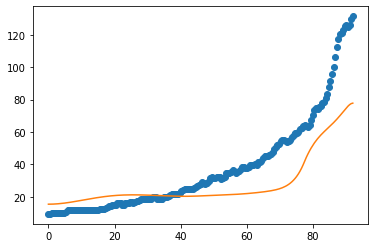

19
after perturb [11.264059675544527, 197.70487001540533, 26808.215118168675, 9.623266292034545, 10.084026240457803]
parameters [11.264059675544527, 197.70487001540533, 26808.215118168675, 9.623266292034545, 10.084026240457803]
after perturb [-5.110481322443837, 75.66226883440505, 29059.370302096733, 4.938431475310055, 29.596093718536594]
parameters [-5.110481322443837, 75.66226883440505, 29059.370302096733, 4.938431475310055, 29.596093718536594]
after perturb [5.280465761573949, 125.23331259241516, 24456.868022063558, 7.204249716134368, 21.340252999532712]
parameters [5.280465761573949, 125.23331259241516, 24456.868022063558, 7.204249716134368, 21.340252999532712]
oxigeno [1.53934961e-31 1.62795340e-31 1.90401225e-31 2.39949793e-31
 3.17195002e-31 4.31142110e-31 5.95140799e-31 8.28516890e-31
 1.15895303e-30 1.62592763e-30 2.28566246e-30 3.21823209e-30
 4.53778203e-30 6.40722714e-30 9.05942015e-30 1.28276788e-29
 1.81898701e-29 2.58321615e-29 3.67413419e-29 5.23386964e-29
 7.46744011e-

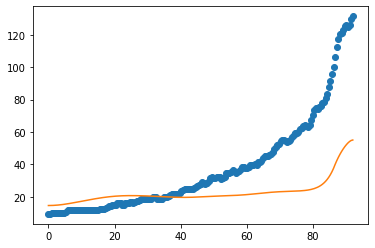

after perturb [9.862069250336232, 181.6667760938198, 21129.722633736616, -1.4577169386417428, -23.649160619787956]
parameters [9.862069250336232, 181.6667760938198, 21129.722633736616, -1.4577169386417428, -23.649160619787956]
after perturb [-3.2031790833258857, 68.25742733185251, 19459.31303195009, 5.4389392876199985, 52.40667395043804]
parameters [-3.2031790833258857, 68.25742733185251, 19459.31303195009, 5.4389392876199985, 52.40667395043804]
after perturb [7.665964748850374, 174.9071091758761, 16947.397942253396, 5.746016516006554, 5.048828276356776]
parameters [7.665964748850374, 174.9071091758761, 16947.397942253396, 5.746016516006554, 5.048828276356776]
after perturb [0.7397055867718043, 47.167950269841874, 24431.69186572454, 3.8136532223970314, 50.317110340539074]
parameters [0.7397055867718043, 47.167950269841874, 24431.69186572454, 3.8136532223970314, 50.317110340539074]
after perturb [1.6020184781970868, 76.7618946020259, 22612.799538920674, 0.7245144920587256, 53.2537121543

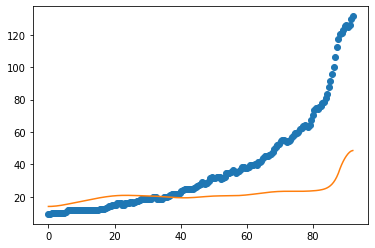

after perturb [2.4453477857355916, 82.10585669732929, 22398.408029553437, 10.312274787134692, 38.9898962134076]
parameters [2.4453477857355916, 82.10585669732929, 22398.408029553437, 10.312274787134692, 38.9898962134076]
after perturb [17.042713228717975, 163.71652216054915, 18627.788233506108, 5.242136545281863, 28.548998614472804]
parameters [17.042713228717975, 163.71652216054915, 18627.788233506108, 5.242136545281863, 28.548998614472804]
after perturb [11.636602149140383, 175.2969387251445, 21147.163254220388, 3.6717038557382184, 40.55384032479099]
parameters [11.636602149140383, 175.2969387251445, 21147.163254220388, 3.6717038557382184, 40.55384032479099]
after perturb [11.82795546737347, 130.0774780620998, 23274.706191183555, 8.408341437866042, 2.528882428993292]
parameters [11.82795546737347, 130.0774780620998, 23274.706191183555, 8.408341437866042, 2.528882428993292]
after perturb [1.638900226138741, 140.55813576877318, 22748.485324653844, 1.28002812290922, 11.804808703204927]


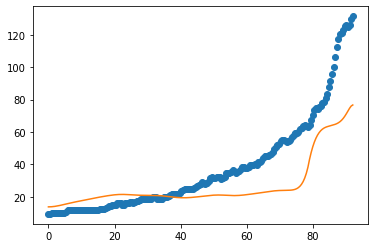

20
parameters [2.1552327142014907, 87.09674438481113, 26262.648585503684, 1.4081177834253882, 20.63066062246356]
parameters [0.8466273305641732, 97.76694512542906, 27797.461224427097, 0.42246650413161246, 35.011065646585735]
parameters [3.7685140288758054, 97.8701857263311, 21842.584206007403, 0.5193609562018213, 21.511718467518847]
parameters [8.435979967986754, 123.16096058276506, 24619.32031646424, 4.0151750125056616, 27.195171062438178]
parameters [5.57153433390536, 123.6553199004928, 23348.82626320403, 1.4309819249839768, 23.52393194010775]
parameters [4.247784738969334, 93.900596189811, 28006.046587694345, 1.964647133790114, 17.936516433729928]
parameters [4.9172768517186185, 145.69901295465817, 23383.196544842765, 1.0155790550931343, 7.621152200443673]
parameters [3.061404728492175, 129.0434128693981, 28458.965033867706, 3.5109113709075856, 31.642107774680895]
parameters [6.061085437993128, 50.059941359668855, 24056.465307263254, 1.587709639537584, 38.07996676403055]
parameters 

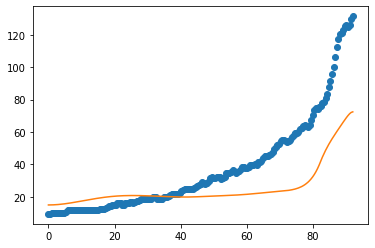

after perturb [12.477453403449758, 13.659963340124456, 22815.81464894138, 1.4558179251144021, 45.33095140091124]
parameters [12.477453403449758, 13.659963340124456, 22815.81464894138, 1.4558179251144021, 45.33095140091124]
after perturb [8.563797513174062, 126.64002996119558, 24984.59160273982, -0.7632043203332145, 15.708608009032336]
parameters [8.563797513174062, 126.64002996119558, 24984.59160273982, -0.7632043203332145, 15.708608009032336]
after perturb [-1.0854169910936364, 76.23961888392706, 21817.425856478072, -0.39568151383443073, 27.193724634026356]
parameters [-1.0854169910936364, 76.23961888392706, 21817.425856478072, -0.39568151383443073, 27.193724634026356]
after perturb [6.228166960784135, 1.8928863487123593, 30975.670940274507, 2.7918431440980287, 61.10064908556076]
parameters [6.228166960784135, 1.8928863487123593, 30975.670940274507, 2.7918431440980287, 61.10064908556076]
after perturb [0.43937690027814047, 18.642131510857737, 24293.530914665524, 1.739272690749351, 30.

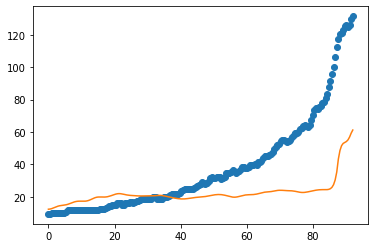

after perturb [5.9474418686809525, 8.94269985419755, 23345.610204751763, 0.3017714086979888, 37.53162591005278]
parameters [5.9474418686809525, 8.94269985419755, 23345.610204751763, 0.3017714086979888, 37.53162591005278]
after perturb [2.2540075707924134, 104.59732112421888, 24910.51520732993, 1.0611995758534691, 11.652415599773626]
parameters [2.2540075707924134, 104.59732112421888, 24910.51520732993, 1.0611995758534691, 11.652415599773626]
oxigeno [3.53752049e-14 3.58273179e-14 3.71956157e-14 3.95163492e-14
 4.28511931e-14 4.72891686e-14 5.29494062e-14 5.99848299e-14
 6.85868649e-14 7.89913075e-14 9.14855298e-14 1.06417235e-13
 1.24205034e-13 1.45351161e-13 1.70456745e-13 2.00240104e-13
 2.35558671e-13 2.77435268e-13 3.27089596e-13 3.85976021e-13
 4.55828914e-13 5.38717097e-13 6.37109236e-13 7.53952367e-13
 8.92766195e-13 1.05775625e-12 1.25394963e-12 1.48735778e-12
 1.76517151e-12 2.09599470e-12 2.49012425e-12 2.95988541e-12
 3.52003335e-12 4.18823411e-12 4.98564019e-12 5.93757909e-

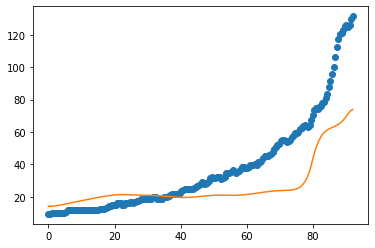

1
after perturb [2.338076311184354, -14.082018527808302, 29795.074202866883, 2.2944235231143004, 59.100346697364834]
parameters [2.338076311184354, -14.082018527808302, 29795.074202866883, 2.2944235231143004, 59.100346697364834]
after perturb [-3.425490418252105, 160.73550693651654, 34707.15920698356, 1.6400563669847839, 17.186014574495516]
parameters [-3.425490418252105, 160.73550693651654, 34707.15920698356, 1.6400563669847839, 17.186014574495516]
after perturb [6.038670534874804, 25.35191217083502, 27452.58203212102, -0.2157005804680696, 37.86453443054452]
parameters [6.038670534874804, 25.35191217083502, 27452.58203212102, -0.2157005804680696, 37.86453443054452]
after perturb [12.494716036447095, 235.04137754459865, 22722.660837869502, 5.082967502427263, -3.533237962316246]
parameters [12.494716036447095, 235.04137754459865, 22722.660837869502, 5.082967502427263, -3.533237962316246]
after perturb [6.0886831439328635, 116.04653420709974, 30596.89531854505, 3.0930695577491383, 45.231

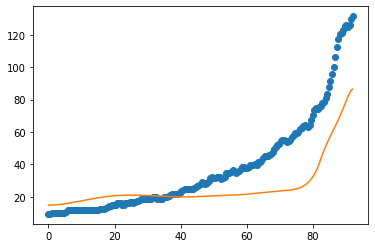

2
after perturb [2.0673096132267395, 62.503969019567855, 33755.17074539428, 3.8686463826187536, 57.75191730318538]
parameters [2.0673096132267395, 62.503969019567855, 33755.17074539428, 3.8686463826187536, 57.75191730318538]
after perturb [3.382921784974564, 104.27505758911659, 21346.462829049062, 1.8213315340024356, 43.32605556126836]
parameters [3.382921784974564, 104.27505758911659, 21346.462829049062, 1.8213315340024356, 43.32605556126836]
oxigeno [4.17232939e-18 4.25748431e-18 4.51647468e-18 4.96003920e-18
 5.60662349e-18 6.48322944e-18 7.62666156e-18 9.08523087e-18
 1.09209992e-17 1.32126735e-17 1.60592930e-17 1.95848886e-17
 2.39443476e-17 2.93307734e-17 3.59847088e-17 4.42056864e-17
 5.43666896e-17 6.69322609e-17 8.24811815e-17 1.01734890e-16
 1.25593109e-16 1.55178523e-16 1.91892850e-16 2.37487218e-16
 2.94150553e-16 3.64620619e-16 4.52323543e-16 5.61549182e-16
 6.97671568e-16 8.67426022e-16 1.07925751e-15 1.34375854e-15
 1.67421939e-15 2.08731959e-15 2.60399620e-15 3.25053400

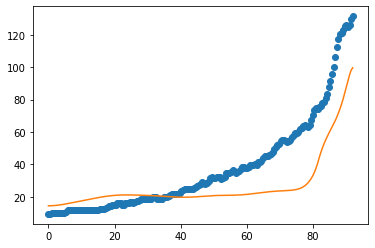

3
after perturb [8.809116087654967, 128.8561799666881, 25135.330685898225, 4.026397545796433, 35.80572398883984]
parameters [8.809116087654967, 128.8561799666881, 25135.330685898225, 4.026397545796433, 35.80572398883984]
oxigeno [1.49101414e-23 1.54185100e-23 1.69783709e-23 1.96964556e-23
 2.37590561e-23 2.94452960e-23 3.71470883e-23 4.73972863e-23
 6.09081669e-23 7.86231774e-23 1.01785919e-22 1.32031689e-22
 1.71508677e-22 2.23038299e-22 2.90327243e-22 3.78247991e-22
 4.93210109e-22 6.43651975e-22 8.40692437e-22 1.09899502e-21
 1.43791481e-21 1.88302137e-21 2.46812256e-21 3.23795520e-21
 4.25176474e-21 5.58807002e-21 7.35100843e-21 9.67878977e-21
 1.27549638e-20 1.68234434e-20 2.22085422e-20 2.93417060e-20
 3.87971848e-20 5.13396416e-20 6.79877040e-20 9.00988048e-20
 1.19482449e-19 1.58551437e-19 2.10523757e-19 2.79692108e-19
 3.71783686e-19 4.94440381e-19 6.57859606e-19 8.75649315e-19
 1.16596856e-18 1.55304860e-18 2.06922091e-18 2.75762036e-18
 3.67578714e-18 4.90046471e-18 6.533988

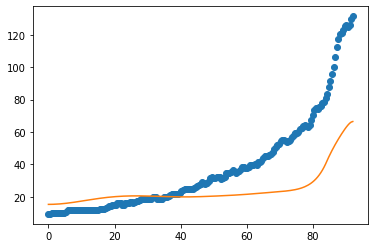

after perturb [5.710110127136624, 168.64991888028948, 21979.965990469624, 0.5391356048462261, -19.02501303607214]
parameters [5.710110127136624, 168.64991888028948, 21979.965990469624, 0.5391356048462261, -19.02501303607214]
after perturb [5.054399165572204, 128.43583298167533, 28050.763528308576, 3.0782131347858503, 50.87355912725967]
parameters [5.054399165572204, 128.43583298167533, 28050.763528308576, 3.0782131347858503, 50.87355912725967]
after perturb [5.367571527337165, 109.81170540930832, 21807.270134117367, 2.493379019911641, 34.70901820888816]
parameters [5.367571527337165, 109.81170540930832, 21807.270134117367, 2.493379019911641, 34.70901820888816]
oxigeno [2.10392288e-20 2.15838679e-20 2.32461521e-20 2.61127569e-20
 3.03334872e-20 3.61296305e-20 4.38063425e-20 5.37698089e-20
 6.65502158e-20 8.28319169e-20 1.03492629e-19 1.29654044e-19
 1.62746964e-19 2.04594969e-19 2.57521789e-19 3.24489085e-19
 4.09273230e-19 5.16692220e-19 6.52897042e-19 8.25745982e-19
 1.04528572e-18 1.

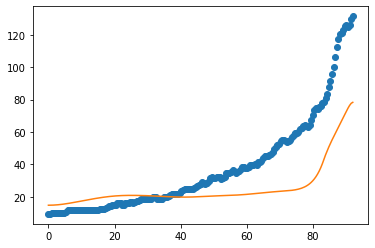

after perturb [7.217989428950614, 111.93408488318178, 21577.407776485135, 1.0374077827678763, 13.920987414303532]
parameters [7.217989428950614, 111.93408488318178, 21577.407776485135, 1.0374077827678763, 13.920987414303532]
oxigeno [1.62921696e-13 1.64912555e-13 1.70933951e-13 1.81133637e-13
 1.95762264e-13 2.15180098e-13 2.39866694e-13 2.70433808e-13
 3.07641907e-13 3.52420760e-13 4.05894697e-13 4.69413268e-13
 5.44588176e-13 6.33337567e-13 7.37938934e-13 8.61092188e-13
 1.00599470e-12 1.17643053e-12 1.37687633e-12 1.61262717e-12
 1.88994573e-12 2.21623935e-12 2.60026995e-12 3.05240299e-12
 3.58490262e-12 4.21228151e-12 4.95171550e-12 5.82353489e-12
 6.85180657e-12 8.06502343e-12 9.49692079e-12 1.11874430e-11
 1.31838872e-11 1.55422570e-11 1.83288629e-11 2.16222156e-11
 2.55152625e-11 3.01180310e-11 3.55607504e-11 4.19975374e-11
 4.96107455e-11 5.86160960e-11 6.92687293e-11 8.18703371e-11
 9.67775676e-11 1.14411925e-10 1.35271427e-10 1.59944323e-10
 1.89125241e-10 2.23634167e-10 2.64

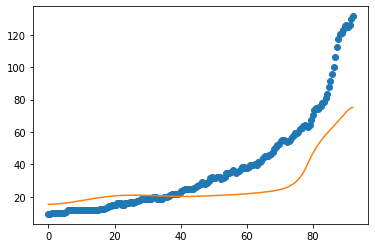

4
after perturb [-0.033150485022496845, 138.69211486385134, 23819.042366031503, 1.2810849774237216, 4.311362586569947]
parameters [-0.033150485022496845, 138.69211486385134, 23819.042366031503, 1.2810849774237216, 4.311362586569947]
after perturb [-2.5645189648662057, 51.11894894624161, 25615.658603130472, 0.1529131397079686, 19.202025673473678]
parameters [-2.5645189648662057, 51.11894894624161, 25615.658603130472, 0.1529131397079686, 19.202025673473678]
after perturb [6.123514685363188, 149.23049816157612, 23607.954251402283, 2.3113760310770943, 21.07164728872954]
parameters [6.123514685363188, 149.23049816157612, 23607.954251402283, 2.3113760310770943, 21.07164728872954]
oxigeno [7.76093593e-17 7.89490636e-17 8.30149462e-17 8.99491006e-17
 9.99943733e-17 1.13503660e-16 1.30953458e-16 1.52962232e-16
 1.80314363e-16 2.13990679e-16 2.55206842e-16 3.05461209e-16
 3.66594185e-16 4.40861570e-16 5.31025039e-16 6.40463589e-16
 7.73310740e-16 9.34623387e-16 1.13058957e-15 1.36878418e-15
 1.6

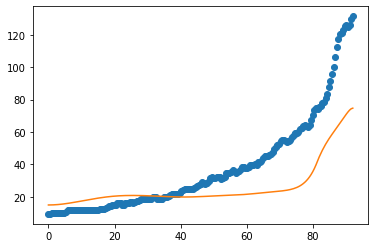

5
after perturb [7.488371157596145, 123.00891678444341, 20844.147044823872, 1.6857849558728255, 23.148117469018608]
parameters [7.488371157596145, 123.00891678444341, 20844.147044823872, 1.6857849558728255, 23.148117469018608]
oxigeno [4.88011951e-16 4.96079729e-16 5.20551067e-16 5.62239553e-16
 6.22533454e-16 7.03445450e-16 8.07684931e-16 9.38755643e-16
 1.10108247e-15 1.30017227e-15 1.54281503e-15 1.83733313e-15
 2.19388860e-15 2.62486024e-15 3.14530565e-15 3.77352614e-15
 4.53175721e-15 5.44701168e-15 6.55210912e-15 7.88693275e-15
 9.49996368e-15 1.14501541e-14 1.38092146e-14 1.66644063e-14
 2.01219514e-14 2.43111976e-14 2.93897038e-14 3.55494512e-14
 4.30244285e-14 5.20998942e-14 6.31236872e-14 7.65200354e-14
 9.28064127e-14 1.12614113e-13 1.36713359e-13 1.66043928e-13
 2.01752516e-13 2.45238292e-13 2.98208428e-13 3.62745772e-13
 4.41391293e-13 5.37244479e-13 6.54085566e-13 7.96524288e-13
 9.70180834e-13 1.18190591e-12 1.44004828e-12 1.75477980e-12
 2.13849038e-12 2.60626744e-12 3.

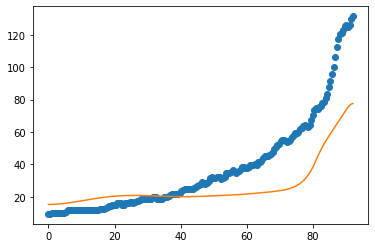

6
after perturb [1.6230253944155775, 94.6623936589957, 27921.512377854244, 2.109503550599645, 31.24347646379864]
parameters [1.6230253944155775, 94.6623936589957, 27921.512377854244, 2.109503550599645, 31.24347646379864]
oxigeno [2.12352430e-20 2.17679079e-20 2.33934127e-20 2.61959186e-20
 3.03212218e-20 3.59853790e-20 4.34874752e-20 5.32272901e-20
 6.57289245e-20 8.16718228e-20 1.01931092e-19 1.27629593e-19
 1.60205004e-19 2.01495962e-19 2.53852557e-19 3.20277972e-19
 4.04610050e-19 5.11754180e-19 6.47982421e-19 8.21318349e-19
 1.04203320e-18 1.32328668e-18 1.68195607e-18 2.13970990e-18
 2.72439920e-18 3.47185995e-18 4.42824710e-18 5.65305499e-18
 7.22302366e-18 9.23718968e-18 1.18234176e-17 1.51468516e-17
 1.94208620e-17 2.49212399e-17 3.20046200e-17 4.11324106e-17
 5.29018745e-17 6.80864781e-17 8.76882020e-17 1.13005236e-16
 1.45719386e-16 1.88008666e-16 2.42691997e-16 3.13414797e-16
 4.04886663e-16 5.23185469e-16 6.76146294e-16 8.73858927e-16
 1.12930458e-15 1.45917141e-15 1.884899

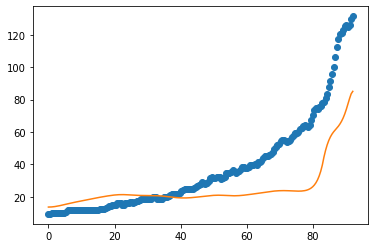

after perturb [6.313788797569103, 127.70983787789046, 29297.62944925429, 4.136614040339746, 10.781207594526272]
parameters [6.313788797569103, 127.70983787789046, 29297.62944925429, 4.136614040339746, 10.781207594526272]
after perturb [1.8382372689552093, 113.11510669652105, 23912.579550312028, -1.287169702796423, 15.384367411057633]
parameters [1.8382372689552093, 113.11510669652105, 23912.579550312028, -1.287169702796423, 15.384367411057633]
after perturb [8.411914859470397, 104.26650793736607, 16261.044428154659, 1.485350658416265, 3.8244935269837583]
parameters [8.411914859470397, 104.26650793736607, 16261.044428154659, 1.485350658416265, 3.8244935269837583]
after perturb [-1.532672828377374, 177.75224674171773, 33113.381850306396, 4.391581369150173, 27.216311414173635]
parameters [-1.532672828377374, 177.75224674171773, 33113.381850306396, 4.391581369150173, 27.216311414173635]
after perturb [3.8011385983869594, 68.54789844363812, 26953.120399508676, 2.2169095194507595, 37.6099258

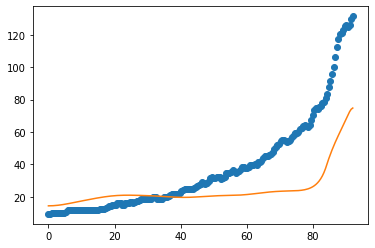

after perturb [6.844109098158252, 215.1651657591941, 26570.634773422902, 3.9740225495397885, 1.601629568703327]
parameters [6.844109098158252, 215.1651657591941, 26570.634773422902, 3.9740225495397885, 1.601629568703327]
after perturb [3.4161859935141594, 43.275009562155375, 33319.581574246346, 2.339447822166623, 44.9080819629374]
parameters [3.4161859935141594, 43.275009562155375, 33319.581574246346, 2.339447822166623, 44.9080819629374]
after perturb [0.22714942656381698, 187.70981206862552, 23444.908805941217, 0.7216438782326854, -18.254152854120353]
parameters [0.22714942656381698, 187.70981206862552, 23444.908805941217, 0.7216438782326854, -18.254152854120353]
after perturb [6.497324545266652, 103.56078527782299, 30152.81758727282, 5.121993345959735, 37.27557534953288]
parameters [6.497324545266652, 103.56078527782299, 30152.81758727282, 5.121993345959735, 37.27557534953288]
after perturb [6.004950757938857, 16.768506232082096, 27902.15285275177, 2.699402224723382, 65.1453892365499

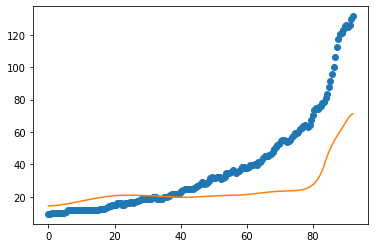

after perturb [-2.337419553954479, 129.42976060907486, 35193.39313896069, 2.069045655802389, 40.99703977595389]
parameters [-2.337419553954479, 129.42976060907486, 35193.39313896069, 2.069045655802389, 40.99703977595389]
after perturb [4.562890931437693, 135.8186106268978, 24169.626193452033, -0.4503076781538565, 14.970541350686352]
parameters [4.562890931437693, 135.8186106268978, 24169.626193452033, -0.4503076781538565, 14.970541350686352]
after perturb [7.285346900404319, 169.493390643458, 25017.19969920385, 1.970402056771131, 41.47402285459494]
parameters [7.285346900404319, 169.493390643458, 25017.19969920385, 1.970402056771131, 41.47402285459494]
after perturb [3.626470512902509, 50.525912252573676, 27334.016500657443, 2.3092006314589453, 42.39465643379669]
parameters [3.626470512902509, 50.525912252573676, 27334.016500657443, 2.3092006314589453, 42.39465643379669]
oxigeno [1.19815652e-29 1.26818926e-29 1.48646866e-29 1.87852474e-29
 2.49031985e-29 3.39381889e-29 4.69575183e-29 6

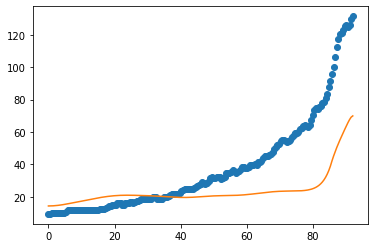

after perturb [1.8054580725344704, 139.95913524061467, 19007.038491158826, -0.4748183312748522, 8.619085044262214]
parameters [1.8054580725344704, 139.95913524061467, 19007.038491158826, -0.4748183312748522, 8.619085044262214]
after perturb [6.90897065240597, 68.4907682666995, 29503.70726159205, 2.9525745562059864, 34.66274052827851]
parameters [6.90897065240597, 68.4907682666995, 29503.70726159205, 2.9525745562059864, 34.66274052827851]
after perturb [5.333449353277409, 72.11277999750092, 26086.729328547903, 0.11571932069371949, 34.68360638021432]
parameters [5.333449353277409, 72.11277999750092, 26086.729328547903, 0.11571932069371949, 34.68360638021432]
oxigeno [1.46093150e-03 1.46016489e-03 1.45786996e-03 1.45406135e-03
 1.44876323e-03 1.44200890e-03 1.43384035e-03 1.42430763e-03
 1.41346818e-03 1.40138602e-03 1.38813097e-03 1.37377776e-03
 1.35840518e-03 1.34209520e-03 1.32493215e-03 1.30700191e-03
 1.28839117e-03 1.26918674e-03 1.24947496e-03 1.22934109e-03
 1.20886891e-03 1.1881

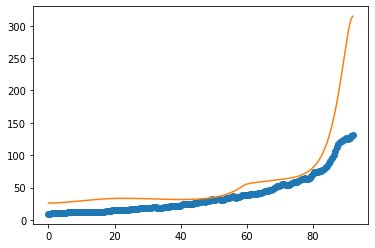

after perturb [8.760782791046108, 102.2205340108624, 28796.91646670224, 5.232775440902037, 35.56263335835921]
parameters [8.760782791046108, 102.2205340108624, 28796.91646670224, 5.232775440902037, 35.56263335835921]
oxigeno [5.38274100e-30 5.68189514e-30 6.61263433e-30 8.27857616e-30
 1.08654886e-29 1.46625207e-29 2.00953762e-29 2.77753897e-29
 3.85703917e-29 5.37059159e-29 7.49090425e-29 1.04612466e-28
 1.46243912e-28 2.04636776e-28 2.86613226e-28 4.01813021e-28
 5.63872828e-28 7.92106104e-28 1.11389858e-27 1.56812786e-27
 2.21005002e-27 3.11828957e-27 4.40484795e-27 6.22944719e-27
 8.82010492e-27 1.25026727e-26 1.77432756e-26 2.52093346e-26
 3.58573669e-26 5.10593996e-26 7.27850819e-26 1.03864180e-25
 1.48365119e-25 2.12141098e-25 3.03618274e-25 4.34933655e-25
 6.23578312e-25 8.94770817e-25 1.28488596e-24 1.84640850e-24
 2.65509064e-24 3.82029384e-24 5.49993095e-24 7.92205364e-24
 1.14160365e-23 1.64576171e-23 2.37339355e-23 3.42374324e-23
 4.94013738e-23 7.12953991e-23 1.02907584e-

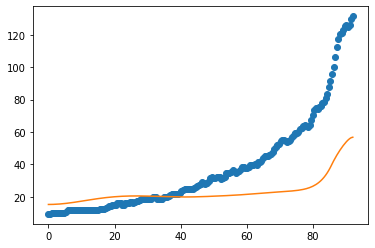

after perturb [0.20280181926833984, 88.61083694402795, 22759.5181671033, 1.4216543501709924, 27.703679262320126]
parameters [0.20280181926833984, 88.61083694402795, 22759.5181671033, 1.4216543501709924, 27.703679262320126]
oxigeno [1.30756540e-17 1.33055723e-17 1.40083506e-17 1.52228543e-17
 1.70134401e-17 1.94699649e-17 2.27086153e-17 2.68739960e-17
 3.21427750e-17 3.87290970e-17 4.68927819e-17 5.69532568e-17
 6.93133867e-17 8.44950436e-17 1.03182585e-16 1.26265876e-16
 1.54875292e-16 1.90407832e-16 2.34553746e-16 2.89340159e-16
 3.57203677e-16 4.41091184e-16 5.44582053e-16 6.72039759e-16
 8.28837128e-16 1.02173645e-15 1.25949824e-15 1.55370717e-15
 1.91967547e-15 2.37721161e-15 2.95109377e-15 3.67128174e-15
 4.57322915e-15 5.69895631e-15 7.09948172e-15 8.83864569e-15
 1.09977089e-14 1.36802039e-14 1.70174912e-14 2.11764520e-14
 2.63707641e-14 3.28761273e-14 4.10480954e-14 5.13398740e-14
 6.43174850e-14 8.06715573e-14 1.01229111e-13 1.26974609e-13
 1.59094600e-13 1.99058009e-13 2.4872

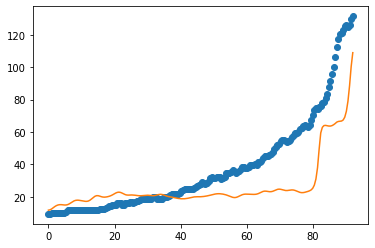

7
after perturb [4.466744379816938, 140.67515744355052, 26838.63531825801, 4.946121493954809, 11.697052616448213]
parameters [4.466744379816938, 140.67515744355052, 26838.63531825801, 4.946121493954809, 11.697052616448213]
oxigeno [5.92345710e-25 6.13523510e-25 6.78585279e-25 7.92233570e-25
 9.62707161e-25 1.20241767e-24 1.52891357e-24 1.96625193e-24
 2.54689275e-24 3.31427550e-24 4.32629597e-24 5.65998031e-24
 7.41775743e-24 9.73587223e-24 1.27956724e-23 1.68387586e-23
 2.21873352e-23 2.92715722e-23 3.86664247e-23 5.11412288e-23
 6.77265674e-23 8.98045031e-23 1.19230453e-22 1.58497943e-22
 2.10961502e-22 2.81138459e-22 3.75117839e-22 5.01114748e-22
 6.70222436e-22 8.97433044e-22 1.20302365e-21 1.61443904e-21
 2.16884988e-21 2.91662946e-21 3.92607930e-21 5.28985259e-21
 7.13368547e-21 9.62826399e-21 1.30053506e-20 1.75796943e-20
 2.37787904e-20 3.21832906e-20 4.35818547e-20 5.90455770e-20
 8.00289352e-20 1.08506655e-19 1.47159195e-19 1.99624018e-19
 2.70835849e-19 3.67487247e-19 4.9865

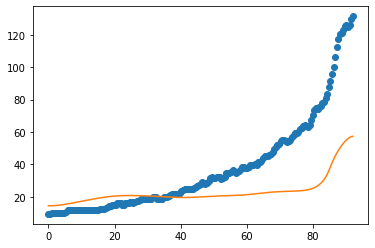

after perturb [-0.6483631144171413, 143.45611908774825, 26538.169988722144, 2.6801121992350794, 26.727924125435706]
parameters [-0.6483631144171413, 143.45611908774825, 26538.169988722144, 2.6801121992350794, 26.727924125435706]
after perturb [0.6091150298485564, 57.246524491483015, 28913.11844351307, 1.704913413041655, 23.464749584886228]
parameters [0.6091150298485564, 57.246524491483015, 28913.11844351307, 1.704913413041655, 23.464749584886228]
oxigeno [3.30674960e-24 3.42826107e-24 3.80234280e-24 4.45850432e-24
 5.44884720e-24 6.85255817e-24 8.78250038e-24 1.13943642e-23
 1.48991872e-23 1.95805469e-23 2.58183704e-23 3.41220803e-23
 4.51766391e-23 5.99059186e-23 7.95587055e-23 1.05823690e-22
 1.40981298e-22 1.88102720e-22 2.51310732e-22 3.36123754e-22
 4.49915359e-22 6.02537701e-22 8.07180706e-22 1.08157081e-21
 1.44965351e-21 1.94395078e-21 2.60883476e-21 3.50501065e-21
 4.71556131e-21 6.35399214e-21 8.57486414e-21 1.15878668e-20
 1.56766223e-20 2.12241790e-20 2.87480949e-20 3.8949

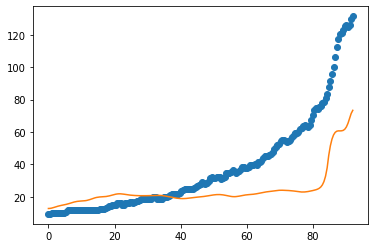

after perturb [5.994361106032536, 79.33059340374739, 27127.9907539148, 0.7460012856419285, 29.942444836682412]
parameters [5.994361106032536, 79.33059340374739, 27127.9907539148, 0.7460012856419285, 29.942444836682412]
oxigeno [6.29723782e-14 6.37966009e-14 6.62923101e-14 7.05293143e-14
 7.66262684e-14 8.47542102e-14 9.51416685e-14 1.08081502e-13
 1.23939687e-13 1.43166333e-13 1.66309272e-13 1.94030656e-13
 2.27127087e-13 2.66553927e-13 3.13454547e-13 3.69195464e-13
 4.35408478e-13 5.14041153e-13 6.07417263e-13 7.18309131e-13
 8.50024175e-13 1.00650843e-12 1.19247035e-12 1.41352887e-12
 1.67639037e-12 1.98906031e-12 2.36109610e-12 2.80390933e-12
 3.33112683e-12 3.95902192e-12 4.70702943e-12 5.59836033e-12
 6.66073536e-12 7.92725993e-12 9.43746745e-12 1.12385628e-11
 1.33869035e-11 1.59497640e-11 1.90074349e-11 2.26557209e-11
 2.70089109e-11 3.22033088e-11 3.84014273e-11 4.57969690e-11
 5.46207393e-11 6.51476611e-11 7.77050958e-11 9.26827081e-11
 1.10544156e-10 1.31840940e-10 1.57228805

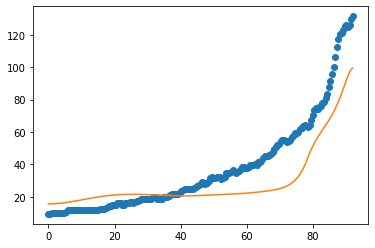

8
after perturb [2.14824326307597, 135.49659942890645, 29095.887684105022, 2.3588478358540463, 44.995273621133386]
parameters [2.14824326307597, 135.49659942890645, 29095.887684105022, 2.3588478358540463, 44.995273621133386]
after perturb [1.5360454398700594, 135.36768508972668, 24545.535184824843, 1.1203842393452843, 8.911946893107125]
parameters [1.5360454398700594, 135.36768508972668, 24545.535184824843, 1.1203842393452843, 8.911946893107125]
oxigeno [1.05730099e-12 1.06754148e-12 1.09847844e-12 1.15076387e-12
 1.22550282e-12 1.32428121e-12 1.44920551e-12 1.60295509e-12
 1.78884821e-12 2.01092350e-12 2.27403860e-12 2.58398835e-12
 2.94764524e-12 3.37312501e-12 3.86998107e-12 4.44943218e-12
 5.12462874e-12 5.91096512e-12 6.82644718e-12 7.89212699e-12
 9.13261907e-12 1.05767155e-11 1.22581193e-11 1.42163173e-11
 1.64976149e-11 1.91563578e-11 2.22563646e-11 2.58726015e-11
 3.00931328e-11 3.50213915e-11 4.07788285e-11 4.75080125e-11
 5.53762757e-11 6.45800190e-11 7.53498096e-11 8.795641

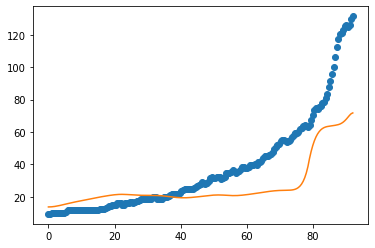

9
after perturb [8.69185007086307, 95.70632260149588, 22849.277011277663, -1.4744438813659535, 27.881602691946632]
parameters [8.69185007086307, 95.70632260149588, 22849.277011277663, -1.4744438813659535, 27.881602691946632]
after perturb [0.888554079520594, 145.89191597033073, 28678.002117495915, 1.9967935869739912, 16.78112056009157]
parameters [0.888554079520594, 145.89191597033073, 28678.002117495915, 1.9967935869739912, 16.78112056009157]
oxigeno [6.86652569e-16 6.96370778e-16 7.25838536e-16 7.76006077e-16
 8.48493263e-16 9.45644197e-16 1.07060533e-15 1.22743042e-15
 1.42121819e-15 1.65829136e-15 1.94642786e-15 2.29515578e-15
 2.71612334e-15 3.22355292e-15 3.83478660e-15 4.57092986e-15
 5.45760334e-15 6.52582107e-15 7.81302908e-15 9.36435986e-15
 1.12341859e-14 1.34880844e-14 1.62053519e-14 1.94822247e-14
 2.34359639e-14 2.82099523e-14 3.39799275e-14 4.09614547e-14
 4.94187497e-14 5.96750175e-14 7.21246035e-14 8.72474671e-14
 1.05626783e-13 1.27970815e-13 1.55140554e-13 1.88184904

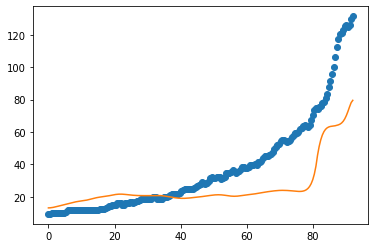

10
after perturb [11.336235286017164, 41.243626431408444, 24327.165790641655, 2.8197595424813864, 32.30596124669515]
parameters [11.336235286017164, 41.243626431408444, 24327.165790641655, 2.8197595424813864, 32.30596124669515]
after perturb [8.957767551606482, 17.39680350940273, 21455.525553300235, 4.648974631305007, 49.7580982253851]
parameters [8.957767551606482, 17.39680350940273, 21455.525553300235, 4.648974631305007, 49.7580982253851]
oxigeno [2.05086436e-70 2.80980865e-70 5.64660642e-70 1.26542562e-69
 2.90037038e-69 6.67646619e-69 1.53837114e-68 3.54635823e-68
 8.17953294e-68 1.88780466e-67 4.36044841e-67 1.00811796e-66
 2.33321249e-66 5.40645068e-66 1.25439078e-65 2.91446592e-65
 6.78154445e-65 1.58042830e-64 3.68914420e-64 8.62589735e-64
 2.02036139e-63 4.74038346e-63 1.11420827e-62 2.62356661e-62
 6.18857366e-62 1.46237087e-61 3.46166231e-61 8.20842753e-61
 1.94969911e-60 4.63861592e-60 1.10535064e-59 2.63801462e-59
 6.30509575e-59 1.50908209e-58 3.61666061e-58 8.67843241e-5

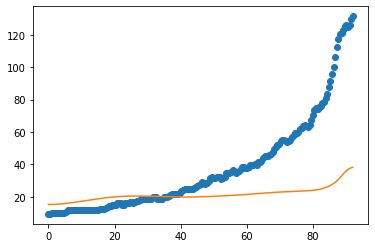

after perturb [1.6608522881121583, 35.603780706376334, 25152.507540260984, 0.9223374609440693, 13.13179492051859]
parameters [1.6608522881121583, 35.603780706376334, 25152.507540260984, 0.9223374609440693, 13.13179492051859]
oxigeno [1.95412693e-17 1.94781408e-17 1.92904334e-17 1.89830744e-17
 1.85639326e-17 1.80433480e-17 1.74335541e-17 1.67480527e-17
 1.60009975e-17 1.52066301e-17 1.43787967e-17 1.35305600e-17
 1.26739070e-17 1.18195482e-17 1.09767997e-17 1.01535377e-17
 9.35621661e-18 8.58993885e-18 7.85856584e-18 7.16485699e-18
 6.51062319e-18 5.89688160e-18 5.32400083e-18 4.79182836e-18
 4.29979692e-18 3.84701017e-18 3.43231178e-18 3.05434413e-18
 2.71160325e-18 2.40249619e-18 2.12540566e-18 1.87876515e-18
 1.66114704e-18 1.47136644e-18 1.30860469e-18 1.17255956e-18
 1.06363309e-18 9.83173301e-19 9.33792927e-19 9.19796761e-19
 9.47759853e-19 1.02731304e-18 1.17221090e-18 1.40178226e-18
 1.74289753e-18 2.23263284e-18 2.92187367e-18 3.88018494e-18
 5.20238927e-18 7.01744990e-18 9.50

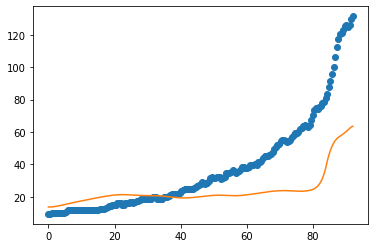

after perturb [0.8684468352728985, 190.05244217832157, 22237.918869159686, 0.5595443072057752, 1.854278789381957]
parameters [0.8684468352728985, 190.05244217832157, 22237.918869159686, 0.5595443072057752, 1.854278789381957]
after perturb [4.583489644189443, 155.23090202572382, 23595.7856740058, 2.0467673577262033, 12.05742508430929]
parameters [4.583489644189443, 155.23090202572382, 23595.7856740058, 2.0467673577262033, 12.05742508430929]
after perturb [5.957045781258278, 198.6532060738594, 20834.00050764217, 2.309523807091648, -16.040470103684864]
parameters [5.957045781258278, 198.6532060738594, 20834.00050764217, 2.309523807091648, -16.040470103684864]
after perturb [1.9410161199359937, 120.96845275492734, 22547.077971675382, 4.184295887513068, 20.16313555839492]
parameters [1.9410161199359937, 120.96845275492734, 22547.077971675382, 4.184295887513068, 20.16313555839492]
oxigeno [8.26441988e-25 8.55118000e-25 9.43180431e-25 1.09689375e-24
 1.32724978e-24 1.65084256e-24 2.09119409e-

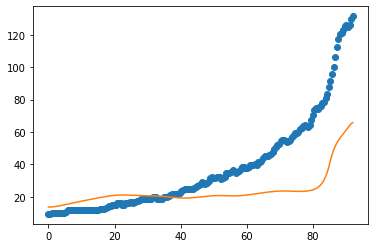

after perturb [5.10649193627386, 17.43400604419282, 23605.624098965192, -0.9072016443180506, 59.522521682958526]
parameters [5.10649193627386, 17.43400604419282, 23605.624098965192, -0.9072016443180506, 59.522521682958526]
after perturb [9.466626231393738, 122.99028279331692, 21555.640197937177, 4.527239861014882, 36.9388221622791]
parameters [9.466626231393738, 122.99028279331692, 21555.640197937177, 4.527239861014882, 36.9388221622791]
oxigeno [1.69996663e-25 1.76808066e-25 1.97788989e-25 2.34624796e-25
 2.90279095e-25 3.69239828e-25 4.77893276e-25 6.25058688e-25
 8.22730475e-25 1.08709350e-24 1.43990161e-24 1.91034265e-24
 2.53755748e-24 3.37404101e-24 4.49023481e-24 5.98073180e-24
 7.97266470e-24 1.06370554e-23 1.42041829e-23 1.89844084e-23
 2.53964198e-23 3.40055650e-23 4.55759194e-23 6.11410544e-23
 8.21002901e-23 1.10349689e-22 1.48460434e-22 1.99921860e-22
 2.69472740e-22 3.63553073e-22 4.90920456e-22 6.63491304e-22
 8.97489288e-22 1.21501363e-21 1.64618123e-21 2.23205306e-21
 

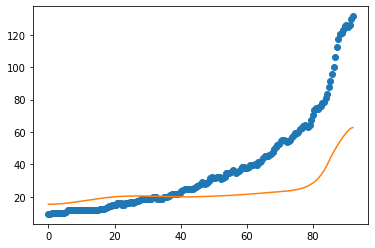

after perturb [0.028632737777529726, 122.26648814829105, 24913.71880028835, 1.3442885353456275, 26.44001847916286]
parameters [0.028632737777529726, 122.26648814829105, 24913.71880028835, 1.3442885353456275, 26.44001847916286]
oxigeno [1.84539144e-14 1.86448848e-14 1.92390495e-14 2.02813457e-14
 2.18260883e-14 2.39454297e-14 2.67150186e-14 3.02151847e-14
 3.45411803e-14 3.98081283e-14 4.61493275e-14 5.37018803e-14
 6.26195854e-14 7.31265059e-14 8.55652318e-14 1.00385231e-13
 1.18158919e-13 1.39551581e-13 1.65231919e-13 1.95913112e-13
 2.32435985e-13 2.75834920e-13 3.27336359e-13 3.88377324e-13
 4.60528080e-13 5.45505211e-13 6.45451843e-13 7.63603476e-13
 9.04745145e-13 1.07488893e-12 1.28151096e-12 1.53277284e-12
 1.83629997e-12 2.19966984e-12 2.63077183e-12 3.14222388e-12
 3.75129310e-12 4.47926606e-12 5.34912725e-12 6.38888142e-12
 7.63176966e-12 9.12198996e-12 1.09186589e-11 1.30954979e-11
 1.57426201e-11 1.89607373e-11 2.28586071e-11 2.75502375e-11
 3.31496501e-11 3.97931211e-11 4.

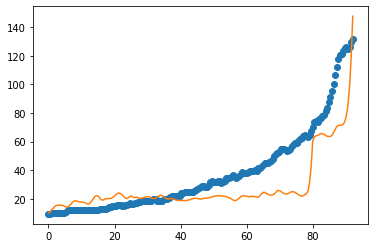

11
after perturb [0.9004815144055689, -24.43994767636363, 26854.137966095645, 0.5743089589032337, 50.03244312303431]
parameters [0.9004815144055689, -24.43994767636363, 26854.137966095645, 0.5743089589032337, 50.03244312303431]
after perturb [8.959778757685086, 37.1294320435137, 23418.29547972323, -0.4426214617243417, 50.07693082452276]
parameters [8.959778757685086, 37.1294320435137, 23418.29547972323, -0.4426214617243417, 50.07693082452276]
after perturb [8.71131667693551, 32.98526885738639, 23725.53062407916, 3.2377117159168183, 43.89826310138872]
parameters [8.71131667693551, 32.98526885738639, 23725.53062407916, 3.2377117159168183, 43.89826310138872]
oxigeno [2.71263671e-43 3.07216965e-43 4.24568847e-43 6.54311026e-43
 1.05715613e-42 1.73967021e-42 2.88265568e-42 4.78944373e-42
 7.96717840e-42 1.32632047e-41 2.20938292e-41 3.68282535e-41
 6.14335784e-41 1.02559645e-40 1.71365845e-40 2.86601139e-40
 4.79803458e-40 8.04087677e-40 1.34901726e-39 2.26580162e-39
 3.81003970e-39 6.41431

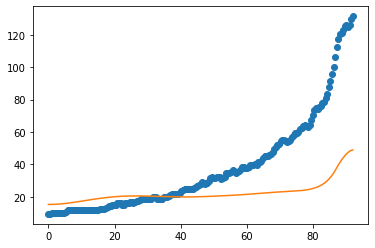

after perturb [9.267323112864267, 99.62862760566138, 19280.67698045389, 3.003590325658969, 38.94881924821127]
parameters [9.267323112864267, 99.62862760566138, 19280.67698045389, 3.003590325658969, 38.94881924821127]
after perturb [6.97871141929766, 80.52902756217472, 34018.09437806909, 3.0152725644952576, 28.0143560330436]
parameters [6.97871141929766, 80.52902756217472, 34018.09437806909, 3.0152725644952576, 28.0143560330436]
after perturb [4.681044982861158, 71.47559848668698, 24772.969413578354, 0.2633408806655527, 20.45398092745419]
parameters [4.681044982861158, 71.47559848668698, 24772.969413578354, 0.2633408806655527, 20.45398092745419]
oxigeno [1.25018482e-06 1.24916472e-06 1.24611252e-06 1.24105232e-06
 1.23402383e-06 1.22508172e-06 1.21429467e-06 1.20174428e-06
 1.18752383e-06 1.17173684e-06 1.15449566e-06 1.13591996e-06
 1.11613527e-06 1.09527158e-06 1.07346197e-06 1.05084145e-06
 1.02754588e-06 1.00371103e-06 9.79471839e-07 9.54961829e-07
 9.30312680e-07 9.05653969e-07 8.8

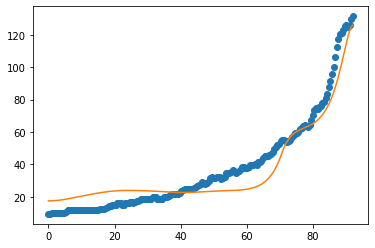

12
after perturb [0.3155871737634115, 202.20105582187026, 24777.694219548805, 2.835561303386797, 10.750363118395441]
parameters [0.3155871737634115, 202.20105582187026, 24777.694219548805, 2.835561303386797, 10.750363118395441]
after perturb [0.22910334059399173, 88.4476906157469, 22516.232089916757, 1.1460598678248488, 13.57302578120779]
parameters [0.22910334059399173, 88.4476906157469, 22516.232089916757, 1.1460598678248488, 13.57302578120779]
oxigeno [4.85136188e-16 4.92409626e-16 5.14580300e-16 5.52691110e-16
 6.08459000e-16 6.84259756e-16 7.83130226e-16 9.08800105e-16
 1.06576184e-15 1.25938797e-15 1.49612296e-15 1.78380856e-15
 2.13221194e-15 2.55377102e-15 3.06446335e-15 3.68462583e-15
 4.43958055e-15 5.36006451e-15 6.48265156e-15 7.85046237e-15
 9.51437193e-15 1.15347206e-14 1.39834591e-14 1.69469234e-14
 2.05299961e-14 2.48628602e-14 3.01112138e-14 3.64893640e-14
 4.42737253e-14 5.38133695e-14 6.55354697e-14 7.99468736e-14
 9.76377696e-14 1.19296718e-13 1.45744412e-13 1.77985

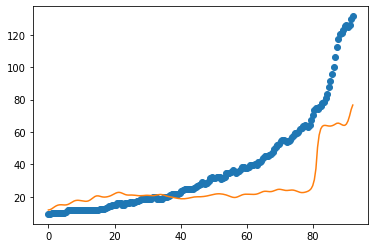

after perturb [8.669558905312819, 192.39111536511618, 19618.486966191012, 1.8413738364769943, -6.673267167255165]
parameters [8.669558905312819, 192.39111536511618, 19618.486966191012, 1.8413738364769943, -6.673267167255165]
after perturb [4.564803715738602, 142.61681578083994, 21466.430765031404, 3.5516085853921275, 1.8758120553970468]
parameters [4.564803715738602, 142.61681578083994, 21466.430765031404, 3.5516085853921275, 1.8758120553970468]
oxigeno [1.28908367e-21 1.32297031e-21 1.42643242e-21 1.60498017e-21
 1.86814917e-21 2.23005143e-21 2.71019417e-21 3.33461771e-21
 4.13742378e-21 5.16279065e-21 6.46760244e-21 8.12486029e-21
 1.02280932e-20 1.28970531e-20 1.62850619e-20 2.05884899e-20
 2.60589861e-20 3.30192660e-20 4.18835040e-20 5.31836880e-20
 6.76037032e-20 8.60234384e-20 1.09575899e-19 1.39721204e-19
 1.78342520e-19 2.27870485e-19 2.91444669e-19 3.73123180e-19
 4.78154853e-19 6.13332822e-19 7.87453880e-19 1.01191539e-18
 1.30149098e-18 1.67533851e-18 2.15830990e-18 2.782652

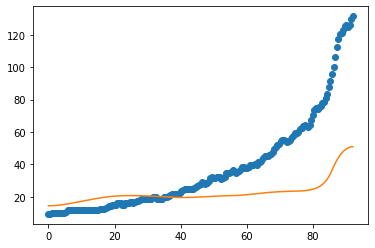

after perturb [15.057108827837071, 67.89612784277003, 24819.76415683449, 2.7002664088937536, 66.22227991961606]
parameters [15.057108827837071, 67.89612784277003, 24819.76415683449, 2.7002664088937536, 66.22227991961606]
after perturb [3.9478026418273617, 167.3652014295746, 28360.696295260597, 2.2112363257360075, 5.672130052241583]
parameters [3.9478026418273617, 167.3652014295746, 28360.696295260597, 2.2112363257360075, 5.672130052241583]
after perturb [4.862484531739088, 123.6707479615889, 23231.40014385805, -1.0449079719638152, -2.055076916591961]
parameters [4.862484531739088, 123.6707479615889, 23231.40014385805, -1.0449079719638152, -2.055076916591961]
after perturb [7.518031821279573, 81.71876712810628, 26813.515574944744, 2.4914349684693855, 18.382928189614226]
parameters [7.518031821279573, 81.71876712810628, 26813.515574944744, 2.4914349684693855, 18.382928189614226]
oxigeno [6.46299421e-24 6.70235189e-24 7.43813844e-24 8.72484733e-24
 1.06579192e-23 1.33810578e-23 1.70972843

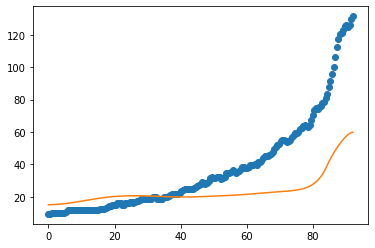

after perturb [1.4351928824343063, 165.87650915907582, 30115.197402193906, 4.778180845574083, 14.438423724128807]
parameters [1.4351928824343063, 165.87650915907582, 30115.197402193906, 4.778180845574083, 14.438423724128807]
after perturb [10.612624203002264, 202.3483522180208, 24708.417342188022, 1.5236946055528673, 17.972287123746483]
parameters [10.612624203002264, 202.3483522180208, 24708.417342188022, 1.5236946055528673, 17.972287123746483]
after perturb [-0.0015213501291988507, 181.76729585520073, 25291.685875119736, 1.9362662749454151, 8.567633709504767]
parameters [-0.0015213501291988507, 181.76729585520073, 25291.685875119736, 1.9362662749454151, 8.567633709504767]
after perturb [13.438692874509295, 161.75260158403344, 22522.544528171507, -0.747490577796461, 28.688336264039677]
parameters [13.438692874509295, 161.75260158403344, 22522.544528171507, -0.747490577796461, 28.688336264039677]
after perturb [5.400242074412094, 9.826085173125293, 27672.423746186814, 0.633992068999575

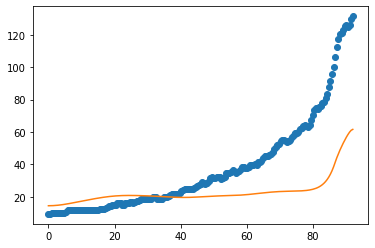

after perturb [-1.9075533628385104, 142.16519232866594, 20151.604678636068, 1.4265905767361982, -0.620292516274926]
parameters [-1.9075533628385104, 142.16519232866594, 20151.604678636068, 1.4265905767361982, -0.620292516274926]
after perturb [3.554305760904854, -2.438257695757187, 33599.37732268902, 2.5688145634401387, 76.46692791697161]
parameters [3.554305760904854, -2.438257695757187, 33599.37732268902, 2.5688145634401387, 76.46692791697161]
after perturb [7.744428856804225, 156.83581618047276, 22106.319619194695, 1.056984752264745, 14.75390297171823]
parameters [7.744428856804225, 156.83581618047276, 22106.319619194695, 1.056984752264745, 14.75390297171823]
after perturb [2.877972812389345, 26.98923629358093, 26663.65532482168, 0.18647763023170394, 48.456836161573634]
parameters [2.877972812389345, 26.98923629358093, 26663.65532482168, 0.18647763023170394, 48.456836161573634]
oxigeno [6.04769816e-05 6.03910323e-05 6.01342962e-05 5.97100731e-05
 5.91237457e-05 5.83826107e-05 5.7495

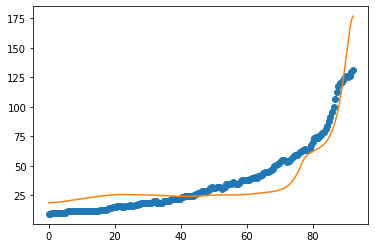

13
after perturb [1.8066946081248105, -8.828311641220601, 23235.49422201778, 2.1252011676427935, 32.985328031197426]
parameters [1.8066946081248105, -8.828311641220601, 23235.49422201778, 2.1252011676427935, 32.985328031197426]
after perturb [7.28345115738375, 221.84004272532914, 18694.022907813705, 2.8190956747321234, 6.593997332186346]
parameters [7.28345115738375, 221.84004272532914, 18694.022907813705, 2.8190956747321234, 6.593997332186346]
after perturb [4.192029462436224, 137.726998514772, 22080.02308785765, 1.7716646006555237, 25.943959120637007]
parameters [4.192029462436224, 137.726998514772, 22080.02308785765, 1.7716646006555237, 25.943959120637007]
oxigeno [1.85543997e-15 1.88261944e-15 1.96496961e-15 2.10495332e-15
 2.30676783e-15 2.57648714e-15 2.92226826e-15 3.35462886e-15
 3.88680612e-15 4.53520993e-15 5.31998652e-15 6.26571312e-15
 7.40224899e-15 8.76577373e-15 1.04000514e-14 1.23579666e-14
 1.47033908e-14 1.75134465e-14 2.08812561e-14 2.49192786e-14
 2.97633581e-14 3.5

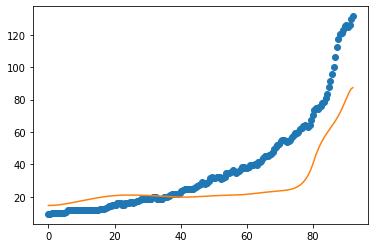

14
after perturb [-3.1722735234636303, 105.78001582126484, 27874.283912610033, 0.21387615316999498, 39.75072767667704]
parameters [-3.1722735234636303, 105.78001582126484, 27874.283912610033, 0.21387615316999498, 39.75072767667704]
after perturb [7.647637705513812, 120.4313514146985, 20808.216529819812, 4.558905979133547, 8.972833454517199]
parameters [7.647637705513812, 120.4313514146985, 20808.216529819812, 4.558905979133547, 8.972833454517199]
oxigeno [4.51623792e-26 4.70024016e-26 5.26728203e-26 6.26374182e-26
 7.77127325e-26 9.91374866e-26 1.28678360e-25 1.68781618e-25
 2.22784332e-25 2.95204409e-25 3.92136021e-25 5.21786874e-25
 6.95207231e-25 9.27278801e-25 1.23805655e-24 1.65459052e-24
 2.21340130e-24 2.96384652e-24 3.97270316e-24 5.33041028e-24
 7.15958110e-24 9.62661907e-24 1.29575826e-23 1.74598688e-23
 2.35518715e-23 3.18035748e-23 4.29921463e-23 5.81781200e-23
 7.88098466e-23 1.06866770e-22 1.45056044e-22 1.97082453e-22
 2.68019075e-22 3.64816441e-22 4.97002072e-22 6.77641

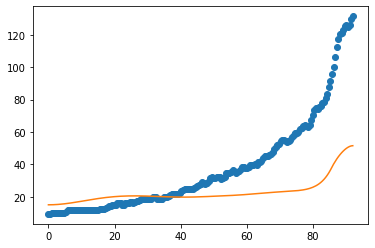

after perturb [11.625989490595005, 32.12600804777979, 27512.747522557915, 3.351399333604197, 65.8210948721836]
parameters [11.625989490595005, 32.12600804777979, 27512.747522557915, 3.351399333604197, 65.8210948721836]
after perturb [-1.1569932748246532, 90.20381011321399, 33946.588892052125, 3.7189450371673263, 52.2359440751509]
parameters [-1.1569932748246532, 90.20381011321399, 33946.588892052125, 3.7189450371673263, 52.2359440751509]
after perturb [4.353933120434344, 104.59949946570514, 25727.419952039596, 2.4604102038029145, 28.313303027478568]
parameters [4.353933120434344, 104.59949946570514, 25727.419952039596, 2.4604102038029145, 28.313303027478568]
oxigeno [7.92265939e-21 8.13443368e-21 8.78116737e-21 9.89775357e-21
 1.15445907e-20 1.38110939e-20 1.68209131e-20 2.07391844e-20
 2.57822687e-20 3.22305902e-20 4.04453855e-20 5.08904264e-20
 6.41601014e-20 8.10156565e-20 1.02431929e-19 1.29657604e-19
 1.64292921e-19 2.08389908e-19 2.64581761e-19 3.36249912e-19
 4.27739905e-19 5.44

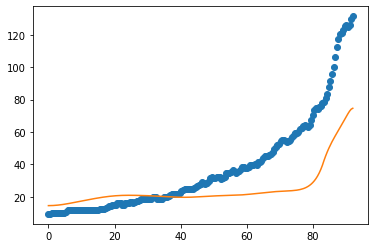

after perturb [4.107702717724738, 115.8056373343511, 27305.058688944777, -0.3032604166808799, 6.3614669772656605]
parameters [4.107702717724738, 115.8056373343511, 27305.058688944777, -0.3032604166808799, 6.3614669772656605]
after perturb [5.116305814962548, 216.70479057589438, 24520.50689062351, 2.5204455024733403, 6.245597812150979]
parameters [5.116305814962548, 216.70479057589438, 24520.50689062351, 2.5204455024733403, 6.245597812150979]
after perturb [-1.8138678049125776, 104.4495701007755, 31008.25056518478, 2.448992537270775, 35.47890518309264]
parameters [-1.8138678049125776, 104.4495701007755, 31008.25056518478, 2.448992537270775, 35.47890518309264]
after perturb [3.002904774394376, 95.99472284581037, 19578.467740721986, 2.0626169911808736, 29.284228721228796]
parameters [3.002904774394376, 95.99472284581037, 19578.467740721986, 2.0626169911808736, 29.284228721228796]
after perturb [-0.6631359994834636, 169.06863949859368, 31139.4800925497, 1.264202825841317, 19.70587067789115

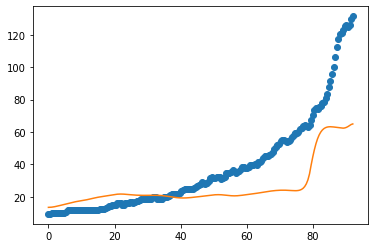

15
after perturb [-0.278496111773717, 72.4842771463364, 28446.107351371873, 2.4092858236702135, 31.879435283412015]
parameters [-0.278496111773717, 72.4842771463364, 28446.107351371873, 2.4092858236702135, 31.879435283412015]
after perturb [8.615516283356119, 85.56104142621395, 23779.78423988038, 2.3655368382858417, 35.560136750980256]
parameters [8.615516283356119, 85.56104142621395, 23779.78423988038, 2.3655368382858417, 35.560136750980256]
oxigeno [1.02383552e-22 1.05843961e-22 1.16458751e-22 1.34944862e-22
 1.62552569e-22 2.01152787e-22 2.53368121e-22 3.22757298e-22
 4.14066584e-22 5.33566805e-22 6.89501072e-22 8.92676689e-22
 1.15724577e-21 1.50173350e-21 1.95039229e-21 2.53498494e-21
 3.29713383e-21 4.29141695e-21 5.58945052e-21 7.28527520e-21
 9.50246639e-21 1.24035249e-20 1.62022864e-20 2.11803261e-20
 2.77086573e-20 3.62764399e-20 4.75289812e-20 6.23180498e-20
 8.17685125e-20 1.07366611e-19 1.41076932e-19 1.85497409e-19
 2.44064771e-19 3.21326851e-19 4.23303534e-19 5.57965215e

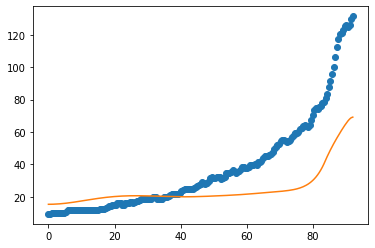

after perturb [-1.2202541896842742, 97.74232346310785, 22856.018091100745, 1.3985003411876087, 18.081540580907184]
parameters [-1.2202541896842742, 97.74232346310785, 22856.018091100745, 1.3985003411876087, 18.081540580907184]
after perturb [-0.3459699781873531, 97.75381150675884, 31158.176462561278, 3.0443469148527464, 34.80373255630698]
parameters [-0.3459699781873531, 97.75381150675884, 31158.176462561278, 3.0443469148527464, 34.80373255630698]
after perturb [1.9971131908390918, 37.733130499918325, 23261.710953854505, -0.01618514867344223, 32.416514611797545]
parameters [1.9971131908390918, 37.733130499918325, 23261.710953854505, -0.01618514867344223, 32.416514611797545]
after perturb [4.630177850055541, 56.49511051601931, 22648.10150319685, 0.6777017200505006, 23.82630549470292]
parameters [4.630177850055541, 56.49511051601931, 22648.10150319685, 0.6777017200505006, 23.82630549470292]
oxigeno [8.42870696e-14 8.41574450e-14 8.37705286e-14 8.31321605e-14
 8.22519729e-14 8.11432462e-1

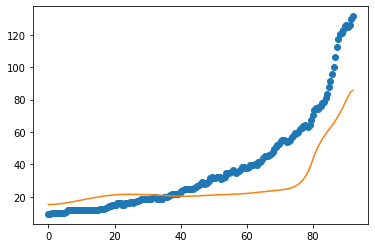

16
after perturb [8.820263603543061, 200.86351362218298, 23211.43763128896, 3.3474568017766595, 8.985746156789324]
parameters [8.820263603543061, 200.86351362218298, 23211.43763128896, 3.3474568017766595, 8.985746156789324]
after perturb [2.5899217936651615, 165.21800951460597, 25019.671096737162, -0.10986840284602872, 19.63395573704512]
parameters [2.5899217936651615, 165.21800951460597, 25019.671096737162, -0.10986840284602872, 19.63395573704512]
after perturb [7.063460831132579, 34.65664946660979, 24140.2875327952, 2.977025966970716, 43.85556094611343]
parameters [7.063460831132579, 34.65664946660979, 24140.2875327952, 2.977025966970716, 43.85556094611343]
oxigeno [1.32678991e-40 1.48000943e-40 1.97491483e-40 2.92540744e-40
 4.55044401e-40 7.22489432e-40 1.15668651e-39 1.85821894e-39
 2.99004856e-39 4.81592695e-39 7.76285004e-39 1.25226568e-38
 2.02174684e-38 3.26694014e-38 5.28408268e-38 8.55539357e-38
 1.38668314e-37 2.25010505e-37 3.65539746e-37 5.94548231e-37
 9.68213752e-37 1.5

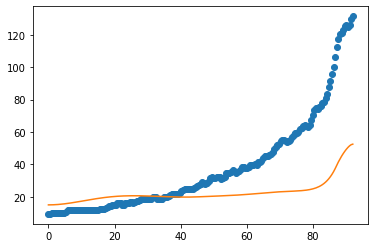

after perturb [2.1392462681173967, 100.97712460599348, 20232.75252099951, -0.5245996293724384, 21.181717992076877]
parameters [2.1392462681173967, 100.97712460599348, 20232.75252099951, -0.5245996293724384, 21.181717992076877]
after perturb [8.156411430042816, 179.765202514932, 27061.65780440302, 2.8123140870415333, 22.019497894040068]
parameters [8.156411430042816, 179.765202514932, 27061.65780440302, 2.8123140870415333, 22.019497894040068]
after perturb [1.3766075620319436, 109.76143573032513, 21709.578995570493, 5.513556203835385, 29.99445634414875]
parameters [1.3766075620319436, 109.76143573032513, 21709.578995570493, 5.513556203835385, 29.99445634414875]
oxigeno [1.21981807e-29 1.27897908e-29 1.46233912e-29 1.78818007e-29
 2.28921565e-29 3.01622650e-29 4.04372327e-29 5.47829842e-29
 7.47065256e-29 1.02327310e-28 1.40620347e-28 1.93760530e-28
 2.67610077e-28 3.70408445e-28 5.13748743e-28 7.13959623e-28
 9.94061504e-28 1.38653767e-27 1.93726450e-27 2.71109604e-27
 3.79981787e-27 5.

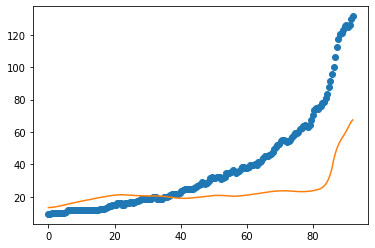

after perturb [-1.31671609303894, 163.07045831168224, 18326.48541115399, 1.7136608615284337, 10.365130777399095]
parameters [-1.31671609303894, 163.07045831168224, 18326.48541115399, 1.7136608615284337, 10.365130777399095]
after perturb [4.372679721059743, 152.4985099087861, 22183.32843843456, -0.19095237936688814, 5.801990061244235]
parameters [4.372679721059743, 152.4985099087861, 22183.32843843456, -0.19095237936688814, 5.801990061244235]
after perturb [0.7093063398610991, 117.84745913970877, 24611.195704314603, 1.5890319579060301, 12.671527140926823]
parameters [0.7093063398610991, 117.84745913970877, 24611.195704314603, 1.5890319579060301, 12.671527140926823]
oxigeno [5.04381620e-16 5.11823659e-16 5.34406612e-16 5.72909337e-16
 6.28657605e-16 7.03565507e-16 8.00194371e-16 9.21832420e-16
 1.07260152e-15 1.25760065e-15 1.48309801e-15 1.75678431e-15
 2.08809763e-15 2.48862584e-15 2.97258817e-15 3.55739395e-15
 4.26427875e-15 5.11902693e-15 6.15280660e-15 7.40316856e-15
 8.91529119e-1

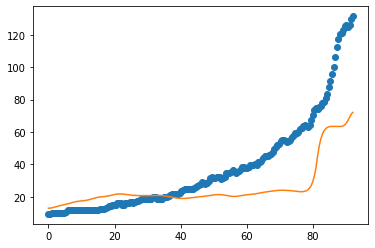

after perturb [4.580694905622593, 151.39586456577902, 19395.44651275799, -1.0031792174915346, -8.614520784267018]
parameters [4.580694905622593, 151.39586456577902, 19395.44651275799, -1.0031792174915346, -8.614520784267018]
after perturb [9.946848019901088, 103.81860904310878, 24138.215976698506, 1.1284095878176506, 18.454058696524694]
parameters [9.946848019901088, 103.81860904310878, 24138.215976698506, 1.1284095878176506, 18.454058696524694]
oxigeno [1.31910546e-14 1.33831756e-14 1.39651181e-14 1.49537928e-14
 1.63779604e-14 1.82791176e-14 2.07127764e-14 2.37501798e-14
 2.74805113e-14 3.20136682e-14 3.74836939e-14 4.40529782e-14
 5.19173680e-14 6.13123561e-14 7.25205527e-14 8.58806894e-14
 1.01798454e-13 1.20759519e-13 1.43345191e-13 1.70251218e-13
 2.02310361e-13 2.40519511e-13 2.86072223e-13 3.40397791e-13
 4.05208131e-13 4.82554069e-13 5.74892885e-13 6.85169365e-13
 8.16913069e-13 9.74355017e-13 1.16256767e-12 1.38763282e-12
 1.65684293e-12 1.97894251e-12 2.36441747e-12 2.825841

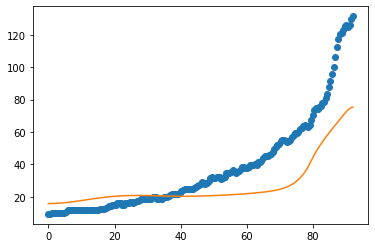

17
after perturb [1.4746736341131137, 113.22727864647878, 18043.7878160423, -0.4041280441954782, -4.430663075713394]
parameters [1.4746736341131137, 113.22727864647878, 18043.7878160423, -0.4041280441954782, -4.430663075713394]
after perturb [12.639956099467021, 133.55307937691643, 28872.661206386587, 3.2500269750766835, 41.00600398115478]
parameters [12.639956099467021, 133.55307937691643, 28872.661206386587, 3.2500269750766835, 41.00600398115478]
after perturb [4.238312402982281, 44.71786227798825, 31310.3694197147, 3.561076792903667, 57.2914614509384]
parameters [4.238312402982281, 44.71786227798825, 31310.3694197147, 3.561076792903667, 57.2914614509384]
after perturb [10.180450152707753, 105.86166476420858, 21725.726794368333, 3.6070247793680608, 37.03824978056715]
parameters [10.180450152707753, 105.86166476420858, 21725.726794368333, 3.6070247793680608, 37.03824978056715]
after perturb [3.4989943409777355, 53.92768238709296, 26773.843937736, 1.7391037230121076, 20.633852765620638

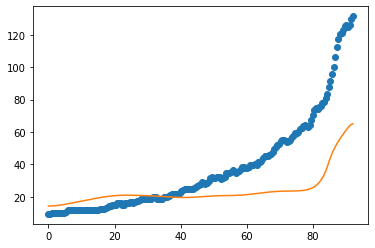

after perturb [-2.8234786931699407, 148.23694656937633, 25535.506961578827, 1.8709912816599055, 18.449315727274268]
parameters [-2.8234786931699407, 148.23694656937633, 25535.506961578827, 1.8709912816599055, 18.449315727274268]
after perturb [2.4855527905364054, 136.78506155695936, 26995.215504304597, 5.2793979695129005, 1.9067969013607922]
parameters [2.4855527905364054, 136.78506155695936, 26995.215504304597, 5.2793979695129005, 1.9067969013607922]
oxigeno [1.51500586e-26 1.57249591e-26 1.74940357e-26 2.05941650e-26
 2.52663181e-26 3.18760505e-26 4.09447528e-26 5.31945171e-26
 6.96107317e-26 9.15281676e-26 1.20748524e-25 1.59700371e-25
 2.11656454e-25 2.81028851e-25 3.73769949e-25 4.97917585e-25
 6.64336810e-25 8.87730290e-25 1.18801619e-24 1.59220953e-24
 2.13699406e-24 2.87224255e-24 3.86584103e-24 5.21030747e-24
 7.03188229e-24 9.50302628e-24 1.28596190e-23 1.74246455e-23
 2.36408446e-23 3.21157404e-23 4.36837941e-23 5.94922357e-23
 8.11196519e-23 1.10739903e-22 1.51348751e-22 2.

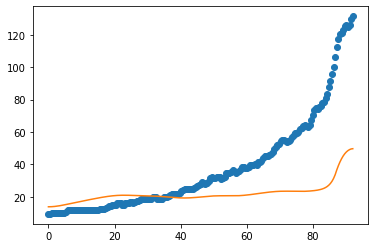

after perturb [3.7459562367562382, 90.57351820019785, 24326.560932585875, 1.1982738566455655, 28.917232887110224]
parameters [3.7459562367562382, 90.57351820019785, 24326.560932585875, 1.1982738566455655, 28.917232887110224]
oxigeno [4.19917899e-16 4.27086797e-16 4.48840641e-16 4.85930306e-16
 5.39639034e-16 6.11831442e-16 7.05024837e-16 8.22485699e-16
 9.68355183e-16 1.14780867e-15 1.36725578e-15 1.63458895e-15
 1.95949062e-15 2.35381152e-15 2.83203552e-15 3.41185022e-15
 4.11484667e-15 4.96737737e-15 6.00160818e-15 7.25680807e-15
 8.78093100e-15 1.06325562e-14 1.28832688e-14 1.56205816e-14
 1.89515211e-14 2.30070298e-14 2.79473709e-14 3.39687639e-14
 4.13115303e-14 5.02700933e-14 6.12052493e-14 7.45592252e-14
 9.08741460e-14 1.10814678e-13 1.35195775e-13 1.65016667e-13
 2.01502462e-13 2.46155042e-13 3.00815286e-13 3.67739097e-13
 4.49690216e-13 5.50053486e-13 6.72972968e-13 8.23520267e-13
 1.00789959e-12 1.23369743e-12 1.51018651e-12 1.84869559e-12
 2.26305941e-12 2.77016599e-12 3.39

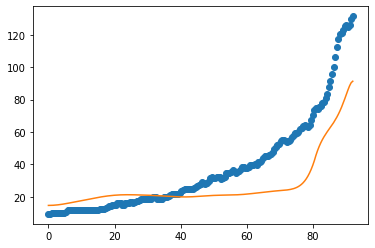

18
after perturb [6.726162843060591, 134.3229377723288, 25272.089811978956, 3.9128859073555993, 13.762094782236812]
parameters [6.726162843060591, 134.3229377723288, 25272.089811978956, 3.9128859073555993, 13.762094782236812]
oxigeno [7.45596655e-23 7.68890390e-23 8.40234860e-23 9.64116543e-23
 1.14834204e-22 1.40455620e-22 1.74901823e-22 2.20369100e-22
 2.79772146e-22 3.56941861e-22 4.56887182e-22 5.86140016e-22
 7.53208475e-22 9.69171804e-22 1.24846105e-21 1.60988363e-21
 2.07796865e-21 2.68473431e-21 3.47201139e-21 4.49449992e-21
 5.82379294e-21 7.55367708e-21 9.80711930e-21 1.27454821e-20
 1.65806843e-20 2.15912581e-20 2.81435600e-20 3.67198028e-20
 4.79551154e-20 6.26865549e-20 8.20179439e-20 1.07405662e-19
 1.40772184e-19 1.84656357e-19 2.42412325e-19 3.18472853e-19
 4.18697886e-19 5.50835930e-19 7.25134690e-19 9.55149137e-19
 1.25881067e-18 1.65984142e-18 2.18962469e-18 2.88967794e-18
 3.81492155e-18 5.03799804e-18 6.65497745e-18 8.79289118e-18
 1.16196766e-17 1.53572989e-17 2.0

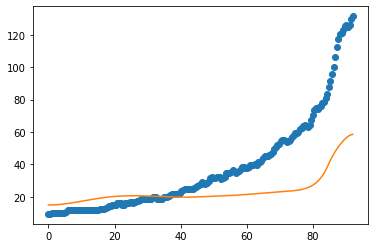

after perturb [8.165147190508502, 61.96200616887984, 30768.417540060113, 1.7273317495787632, 63.66456929030183]
parameters [8.165147190508502, 61.96200616887984, 30768.417540060113, 1.7273317495787632, 63.66456929030183]
after perturb [8.465384450766779, 141.8604827012037, 21985.088585420002, 4.8282314833027185, 12.337811594665778]
parameters [8.465384450766779, 141.8604827012037, 21985.088585420002, 4.8282314833027185, 12.337811594665778]
oxigeno [1.46614046e-24 1.51910058e-24 1.68182055e-24 1.96610842e-24
 2.39263128e-24 2.99247832e-24 3.80952143e-24 4.90376285e-24
 6.35593999e-24 8.27376113e-24 1.08002808e-23 1.41251026e-23
 1.84993363e-23 2.42555521e-23 3.18344042e-23 4.18201661e-23
 5.49881896e-23 7.23683363e-23 9.53298180e-23 1.25694765e-22
 1.65890365e-22 2.19152817e-22 2.89800961e-22 3.83603612e-22
 5.08273031e-22 6.74128212e-22 8.94986951e-22 1.18936621e-21
 1.58209806e-21 2.10650606e-21 2.80733739e-21 3.74471470e-21
 4.99946359e-21 6.68029633e-21 8.93350050e-21 1.19560077e-20

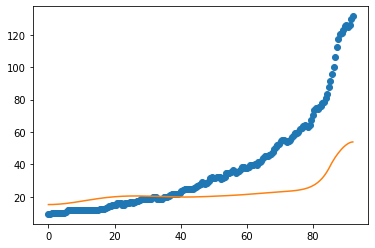

after perturb [6.47720134720371, 138.97639479432326, 28672.908454560067, 6.75149611621841, 51.41262876052618]
parameters [6.47720134720371, 138.97639479432326, 28672.908454560067, 6.75149611621841, 51.41262876052618]
after perturb [10.824146464340714, 125.31597391510257, 15241.629420501678, 2.3150634331795428, 10.16618749295842]
parameters [10.824146464340714, 125.31597391510257, 15241.629420501678, 2.3150634331795428, 10.16618749295842]
after perturb [1.8249857917028707, 161.64414511777534, 20943.884352011133, -2.7219978158263496, -22.73322115374635]
parameters [1.8249857917028707, 161.64414511777534, 20943.884352011133, -2.7219978158263496, -22.73322115374635]
after perturb [7.663700908066904, 110.96373994585463, 27985.76995317416, 8.260442110201286, 44.6615536957744]
parameters [7.663700908066904, 110.96373994585463, 27985.76995317416, 8.260442110201286, 44.6615536957744]
oxigeno [1.20853641e-35 1.30044481e-35 1.59017280e-35 2.12190693e-35
 2.97690227e-35 4.28618522e-35 6.25113167e-

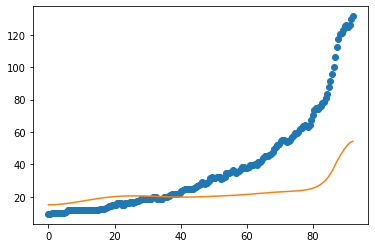

after perturb [6.312574316091327, 76.82529563156193, 28272.78774380754, 4.326828961821725, 45.55310626346726]
parameters [6.312574316091327, 76.82529563156193, 28272.78774380754, 4.326828961821725, 45.55310626346726]
oxigeno [8.98329801e-32 9.55026255e-32 1.13227468e-31 1.45247820e-31
 1.95618629e-31 2.70736481e-31 3.80174634e-31 5.37939623e-31
 7.64321211e-31 1.08859033e-30 1.55291887e-30 2.21806842e-30
 3.17164773e-30 4.54010801e-30 6.50618662e-30 9.33430386e-30
 1.34075845e-29 1.92818917e-29 2.77647880e-29 4.00310601e-29
 5.77919370e-29 8.35432373e-29 1.20929654e-28 1.75280091e-28
 2.54395155e-28 3.69706663e-28 5.37986415e-28 7.83866560e-28
 1.14355984e-27 1.67035490e-27 2.44273887e-27 3.57641026e-27
 5.24205460e-27 7.69165905e-27 1.12974826e-26 1.66097866e-26
 2.44423767e-26 3.59993777e-26 5.30631361e-26 7.82727382e-26
 1.15536837e-25 1.70645511e-25 2.52177000e-25 3.72841186e-25
 5.51469748e-25 8.15963457e-25 1.20765560e-24 1.78776973e-24
 2.64697334e-24 3.91950590e-24 5.80406247e-

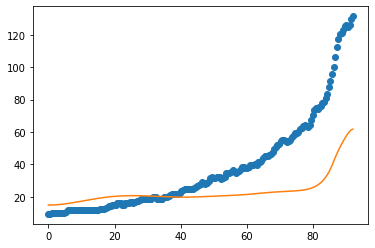

after perturb [1.90701024677226, 177.69070446770138, 20544.726544587294, 1.4063814638655927, -10.673412285595145]
parameters [1.90701024677226, 177.69070446770138, 20544.726544587294, 1.4063814638655927, -10.673412285595145]
after perturb [5.365259329531973, 100.08257048084518, 24260.768572794936, 0.5765271727450811, 37.04973822266747]
parameters [5.365259329531973, 100.08257048084518, 24260.768572794936, 0.5765271727450811, 37.04973822266747]
oxigeno [6.46244138e-11 6.51390144e-11 6.66915702e-11 6.93085105e-11
 7.30344448e-11 7.79330155e-11 8.40881142e-11 9.16054850e-11
 1.00614746e-10 1.11271869e-10 1.23762160e-10 1.38303812e-10
 1.55152078e-10 1.74604167e-10 1.97004948e-10 2.22753576e-10
 2.52311166e-10 2.86209677e-10 3.25062177e-10 3.69574675e-10
 4.20559789e-10 4.78952473e-10 5.45828153e-10 6.22423593e-10
 7.10160916e-10 8.10675230e-10 9.25846392e-10 1.05783551e-09
 1.20912689e-09 1.38257614e-09 1.58146544e-09 1.80956684e-09
 2.07121491e-09 2.37138982e-09 2.71581253e-09 3.11105369

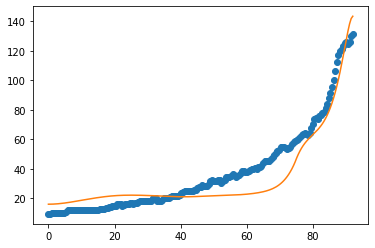

19
after perturb [3.3406950158720194, 89.10055788107609, 23955.866214263628, 5.835098129691225, 34.79902492593398]
parameters [3.3406950158720194, 89.10055788107609, 23955.866214263628, 5.835098129691225, 34.79902492593398]
oxigeno [6.79938852e-34 7.25570467e-34 8.68622633e-34 1.12843364e-33
 1.54025065e-33 2.16022607e-33 3.07343086e-33 4.40609200e-33
 6.34391087e-33 9.15926240e-33 1.32514654e-32 1.92063780e-32
 2.78846468e-32 4.05525349e-32 5.90761350e-32 8.62100942e-32
 1.26027486e-31 1.84560792e-31 2.70759101e-31 3.97919666e-31
 5.85832066e-31 8.63994375e-31 1.27644425e-30 1.88902599e-30
 2.80033689e-30 4.15823732e-30 6.18478422e-30 9.21393110e-30
 1.37485962e-29 2.05471413e-29 3.07545477e-29 4.61015676e-29
 6.92073183e-29 1.04039366e-28 1.56613669e-28 2.36059935e-28
 3.56243687e-28 5.38236533e-28 8.14078502e-28 1.23250816e-27
 1.86768851e-27 2.83249165e-27 4.29871725e-27 6.52785102e-27
 9.91783553e-27 1.50741519e-26 2.29177890e-26 3.48491499e-26
 5.29967359e-26 8.05942469e-26 1.225

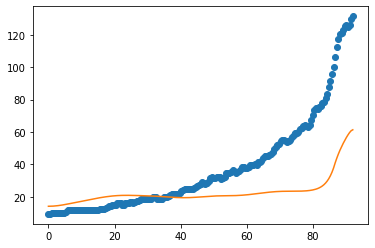

after perturb [17.068245929575717, 70.79094142109302, 22987.188961367756, -0.2516275866441662, 29.278110084673564]
parameters [17.068245929575717, 70.79094142109302, 22987.188961367756, -0.2516275866441662, 29.278110084673564]
after perturb [7.379820427667794, 114.06553940659616, 19363.28936255502, 2.7124151939070886, 31.815966236175527]
parameters [7.379820427667794, 114.06553940659616, 19363.28936255502, 2.7124151939070886, 31.815966236175527]
after perturb [0.8533568388449506, 195.7823827706017, 33171.974669600895, 4.586107630964397, 20.05040655519297]
parameters [0.8533568388449506, 195.7823827706017, 33171.974669600895, 4.586107630964397, 20.05040655519297]
after perturb [4.716016271030729, 90.42396593489912, 17614.154546615002, 1.9216739540493228, 35.3796053571837]
parameters [4.716016271030729, 90.42396593489912, 17614.154546615002, 1.9216739540493228, 35.3796053571837]
after perturb [4.179175626344063, 117.49800418498994, 21478.410231332597, 4.55000882493084, -0.201070251808566

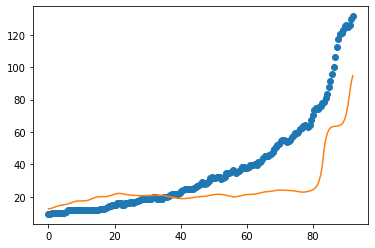

after perturb [4.0616968590658225, 24.024992336309012, 27093.11230203862, 1.4854115964353498, 47.95911011771821]
parameters [4.0616968590658225, 24.024992336309012, 27093.11230203862, 1.4854115964353498, 47.95911011771821]
oxigeno [1.59428712e-26 1.58757129e-26 1.56761305e-26 1.53497019e-26
 1.49053994e-26 1.43551326e-26 1.37131588e-26 1.29954086e-26
 1.22187734e-26 1.14004041e-26 1.05570621e-26 9.70455657e-27
 8.85729141e-27 8.02793364e-27 7.22720458e-27 6.46378696e-27
 5.74433389e-27 5.07356177e-27 4.45440697e-27 3.88822650e-27
 3.37502394e-27 2.91368478e-27 2.50220822e-27 2.13792558e-27
 1.81769870e-27 1.53809429e-27 1.29553245e-27 1.08640948e-27
 9.07196464e-28 7.54516077e-28 6.25200933e-28 5.16337554e-28
 4.25300667e-28 3.49783707e-28 2.87833054e-28 2.37896255e-28
 1.98899077e-28 1.70373674e-28 1.52672304e-28 1.47320713e-28
 1.57596916e-28 1.89471907e-28 2.53130088e-28 3.65417044e-28
 5.53769507e-28 8.62512488e-28 1.36293420e-27 2.16938535e-27
 3.46497756e-27 5.54256430e-27 8.8700

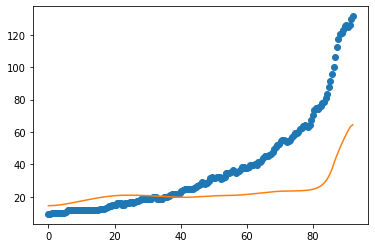

after perturb [7.644156443435257, 71.55894817483227, 24970.157763620788, 1.6976867982076975, 28.864537748183302]
parameters [7.644156443435257, 71.55894817483227, 24970.157763620788, 1.6976867982076975, 28.864537748183302]
oxigeno [1.87796599e-21 1.93667735e-21 2.11646994e-21 2.42855452e-21
 2.89241588e-21 3.53706988e-21 4.40294079e-21 5.54448645e-21
 7.03375001e-21 8.96508108e-21 1.14613502e-20 1.46820855e-20
 1.88340944e-20 2.41853096e-20 3.10828268e-20 3.99763994e-20
 5.14490458e-20 6.62569342e-20 8.53813765e-20 1.10096637e-19
 1.42058399e-19 1.83419241e-19 2.36979410e-19 3.06383772e-19
 3.96379155e-19 5.13150706e-19 6.64761642e-19 8.61728291e-19
 1.11777220e-18 1.45080395e-18 1.88421020e-18 2.44853751e-18
 3.18369536e-18 4.14183819e-18 5.39113587e-18 7.02070556e-18
 9.14706215e-18 1.19225532e-17 1.55463866e-17 2.02790450e-17
 2.64611208e-17 3.45379217e-17 4.50916033e-17 5.88831174e-17
 7.69069536e-17 1.00462550e-16 1.31247407e-16 1.71478459e-16
 2.24050194e-16 2.92740577e-16 3.8247

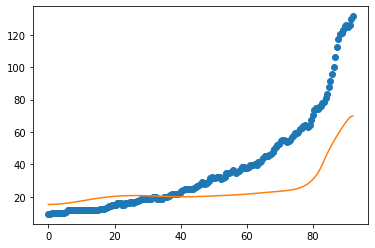

after perturb [-1.3475398061780495, 159.74216587364873, 17317.86664580517, -0.5555513192895989, 23.50109699693315]
parameters [-1.3475398061780495, 159.74216587364873, 17317.86664580517, -0.5555513192895989, 23.50109699693315]
after perturb [3.5069933841220844, 66.62170633337074, 23031.486976122458, 1.4359312820956607, 26.926864452970044]
parameters [3.5069933841220844, 66.62170633337074, 23031.486976122458, 1.4359312820956607, 26.926864452970044]
oxigeno [1.21165730e-20 1.24632959e-20 1.35233588e-20 1.53576591e-20
 1.80718230e-20 2.18226806e-20 2.68279109e-20 3.33794814e-20
 4.18617553e-20 5.27754452e-20 6.67689794e-20 8.46793334e-20
 1.07585016e-19 1.36874709e-19 1.74336112e-19 2.22270914e-19
 2.83643595e-19 3.62274054e-19 4.63087092e-19 5.92435686e-19
 7.58520076e-19 9.71931387e-19 1.24635711e-18 1.59949710e-18
 2.05425344e-18 2.64027664e-18 3.39597564e-18 4.37113137e-18
 5.63029604e-18 7.25721481e-18 9.36057807e-18 1.20815046e-17
 1.56032758e-17 2.01639961e-17 2.60730559e-17 3.3732

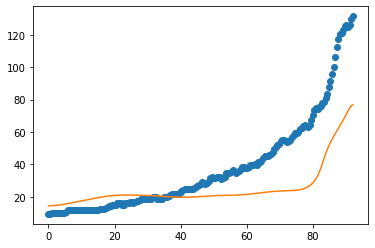

after perturb [3.4864109058587, 185.02913320711767, 11862.547505381077, -2.15679563223478, -30.53781952989992]
parameters [3.4864109058587, 185.02913320711767, 11862.547505381077, -2.15679563223478, -30.53781952989992]
after perturb [8.61553872511942, 184.0669437715071, 26914.416983141324, 3.2978184025509045, 0.6279725200482185]
parameters [8.61553872511942, 184.0669437715071, 26914.416983141324, 3.2978184025509045, 0.6279725200482185]
after perturb [5.044728598021647, 96.99031718059913, 25432.869112270077, 1.3588670800734262, 31.00240549368086]
parameters [5.044728598021647, 96.99031718059913, 25432.869112270077, 1.3588670800734262, 31.00240549368086]
oxigeno [1.90940219e-16 1.94327503e-16 2.04610205e-16 2.22155553e-16
 2.47591396e-16 2.81830586e-16 3.26106525e-16 3.82021333e-16
 4.51608664e-16 5.37413753e-16 6.42594067e-16 7.71044759e-16
 9.27554191e-16 1.11799609e-15 1.34956646e-15 1.63107527e-15
 1.97330543e-15 2.38945422e-15 2.89567629e-15 3.51175140e-15
 4.26190573e-15 5.17582226

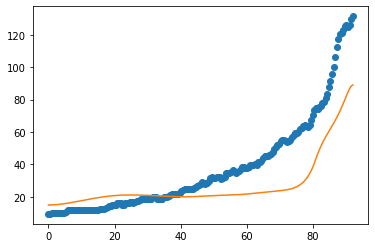

20
parameters [2.2540075707924134, 104.59732112421888, 24910.51520732993, 1.0611995758534691, 11.652415599773626]
parameters [5.06631512393906, 88.1128287608957, 21306.736171362954, 1.6982757677267215, 38.644640067786256]
parameters [3.382921784974564, 104.27505758911659, 21346.462829049062, 1.8213315340024356, 43.32605556126836]
parameters [7.217989428950614, 111.93408488318178, 21577.407776485135, 1.0374077827678763, 13.920987414303532]
parameters [6.123514685363188, 149.23049816157612, 23607.954251402283, 2.3113760310770943, 21.07164728872954]
parameters [7.488371157596145, 123.00891678444341, 20844.147044823872, 1.6857849558728255, 23.148117469018608]
parameters [0.20280181926833984, 88.61083694402795, 22759.5181671033, 1.4216543501709924, 27.703679262320126]
parameters [5.994361106032536, 79.33059340374739, 27127.9907539148, 0.7460012856419285, 29.942444836682412]
parameters [1.5360454398700594, 135.36768508972668, 24545.535184824843, 1.1203842393452843, 8.911946893107125]
paramet

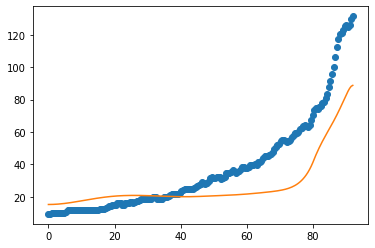

after perturb [6.423803105854413, 171.31026759733817, 22295.367777115076, 1.6699176605721733, 2.385987991496499]
parameters [6.423803105854413, 171.31026759733817, 22295.367777115076, 1.6699176605721733, 2.385987991496499]
after perturb [7.09995050308366, 19.46693841430948, 24051.753176548682, 0.0906924955297468, 50.32358567302042]
parameters [7.09995050308366, 19.46693841430948, 24051.753176548682, 0.0906924955297468, 50.32358567302042]
after perturb [2.4675067836540303, 70.69899148406276, 20264.850952755256, 1.011338321373592, 35.60432708701223]
parameters [2.4675067836540303, 70.69899148406276, 20264.850952755256, 1.011338321373592, 35.60432708701223]
oxigeno [4.98588069e-17 5.08368527e-17 5.38100415e-17 5.88972594e-17
 6.63024999e-17 7.63239131e-17 8.93670339e-17 1.05962784e-16
 1.26791050e-16 1.52710911e-16 1.84798868e-16 2.24396823e-16
 2.73171992e-16 3.33191507e-16 4.07015137e-16 4.97810458e-16
 6.09495848e-16 7.46918058e-16 9.16072795e-16 1.12437887e-15
 1.38101908e-15 1.697364

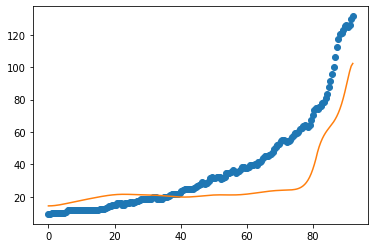

after perturb [2.633131587019057, 164.73863229924086, 22524.15394545853, 2.0638313286818364, -8.800483717042695]
parameters [2.633131587019057, 164.73863229924086, 22524.15394545853, 2.0638313286818364, -8.800483717042695]
after perturb [2.311089010362448, 46.80652919222378, 21526.507161291098, -0.5831175532165149, 38.03843375656743]
parameters [2.311089010362448, 46.80652919222378, 21526.507161291098, -0.5831175532165149, 38.03843375656743]
after perturb [2.5426556583137367, 126.22823828467942, 30701.13892480026, 1.6722985522612173, 6.853054189223917]
parameters [2.5426556583137367, 126.22823828467942, 30701.13892480026, 1.6722985522612173, 6.853054189223917]
after perturb [5.7831715935622015, 68.56137612581551, 21174.81482370249, 0.9550852237314577, 44.37829609803517]
parameters [5.7831715935622015, 68.56137612581551, 21174.81482370249, 0.9550852237314577, 44.37829609803517]
oxigeno [7.14005445e-17 7.28164239e-17 7.71211698e-17 8.44885266e-17
 9.52162489e-17 1.09738757e-16 1.28645644

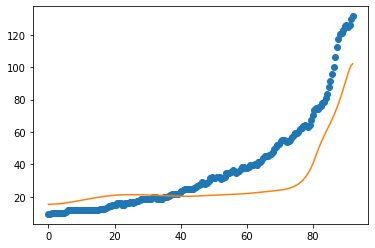

1
after perturb [9.671281086863361, 199.7153126963253, 18306.091079484613, 3.838813906008135, 51.9660719777732]
parameters [9.671281086863361, 199.7153126963253, 18306.091079484613, 3.838813906008135, 51.9660719777732]
after perturb [5.148125226010036, 120.3414242323573, 16943.212343857398, 3.929717439355865, 42.522421692675216]
parameters [5.148125226010036, 120.3414242323573, 16943.212343857398, 3.929717439355865, 42.522421692675216]
after perturb [12.918204816965584, 113.42125438146766, 25830.002316152313, 1.191041260865585, 19.27773027403679]
parameters [12.918204816965584, 113.42125438146766, 25830.002316152313, 1.191041260865585, 19.27773027403679]
after perturb [-3.0481080935229765, 55.06452148247215, 24329.34784729539, 0.3844443412783951, -2.923493871569855]
parameters [-3.0481080935229765, 55.06452148247215, 24329.34784729539, 0.3844443412783951, -2.923493871569855]
after perturb [6.319428177007985, -11.262345946969091, 22863.041553313007, -0.2984845024833491, 38.5265463625093

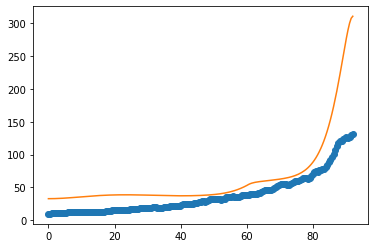

after perturb [8.890376809626458, 105.28599435310585, 26481.858160738608, 1.4870333913891338, 24.49886379500854]
parameters [8.890376809626458, 105.28599435310585, 26481.858160738608, 1.4870333913891338, 24.49886379500854]
oxigeno [1.98816238e-16 2.02384881e-16 2.13218860e-16 2.31707174e-16
 2.58514524e-16 2.94606556e-16 3.41286629e-16 4.00245591e-16
 4.73626597e-16 5.64107606e-16 6.75004934e-16 8.10402101e-16
 9.75309282e-16 1.17585992e-15 1.41955266e-15 1.71554856e-15
 2.07503608e-15 2.51167886e-15 3.04216519e-15 3.68688198e-15
 4.47074165e-15 5.42419653e-15 6.58448348e-15 7.99715101e-15
 9.71793337e-15 1.18150502e-14 1.43720291e-14 1.74911691e-14
 2.12977921e-14 2.59454590e-14 3.16223721e-14 3.85592296e-14
 4.70388633e-14 5.74080597e-14 7.00920602e-14 8.56123404e-14
 1.04608409e-13 1.27864522e-13 1.56342428e-13 1.91221467e-13
 2.33947689e-13 2.86293991e-13 3.50433707e-13 4.29030651e-13
 5.25349248e-13 6.43389169e-13 7.88049893e-13 9.65331741e-13
 1.18258140e-12 1.44879163e-12 1.7749

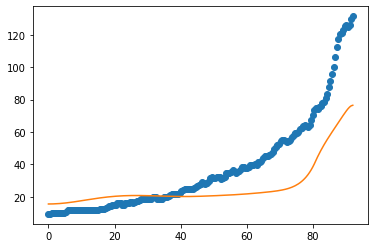

after perturb [10.154519988931348, 234.58295787297254, 20994.782566939528, 4.757117565622057, 37.12261681843505]
parameters [10.154519988931348, 234.58295787297254, 20994.782566939528, 4.757117565622057, 37.12261681843505]
after perturb [7.756320542556278, 83.41688086218413, 24165.066017990335, 0.0811273741965732, 8.727226843420675]
parameters [7.756320542556278, 83.41688086218413, 24165.066017990335, 0.0811273741965732, 8.727226843420675]
oxigeno [4.14563218e-03 4.14430117e-03 4.14031530e-03 4.13369596e-03
 4.12447856e-03 4.11271222e-03 4.09845929e-03 4.08179477e-03
 4.06280565e-03 4.04159015e-03 4.01825685e-03 3.99292385e-03
 3.96571777e-03 3.93677287e-03 3.90623000e-03 3.87423574e-03
 3.84094138e-03 3.80650209e-03 3.77107602e-03 3.73482354e-03
 3.69790647e-03 3.66048746e-03 3.62272938e-03 3.58479481e-03
 3.54684560e-03 3.50904256e-03 3.47154514e-03 3.43451127e-03
 3.39809724e-03 3.36245768e-03 3.32774554e-03 3.29411229e-03
 3.26170799e-03 3.23068162e-03 3.20118133e-03 3.17335484e-03

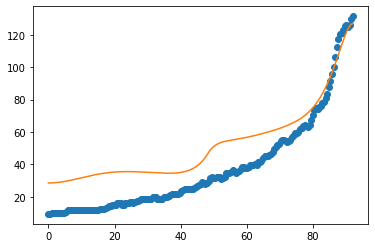

2
after perturb [0.7342785939853785, 133.85217086405066, 29409.203905706298, 1.2242844871038614, 35.96652200645763]
parameters [0.7342785939853785, 133.85217086405066, 29409.203905706298, 1.2242844871038614, 35.96652200645763]
after perturb [4.349743517686654, 105.81211394636179, 18017.32844661581, 2.455088714618307, 49.11656820490812]
parameters [4.349743517686654, 105.81211394636179, 18017.32844661581, 2.455088714618307, 49.11656820490812]
after perturb [6.808618932284261, 116.64014381184364, 17911.541713974653, 2.494501626454007, 29.951643660955597]
parameters [6.808618932284261, 116.64014381184364, 17911.541713974653, 2.494501626454007, 29.951643660955597]
after perturb [6.435790327242678, 96.20085342985315, 21035.39933185518, 1.1728431228036322, 3.1813766397006047]
parameters [6.435790327242678, 96.20085342985315, 21035.39933185518, 1.1728431228036322, 3.1813766397006047]
oxigeno [8.34613859e-16 8.48051336e-16 8.88797071e-16 9.58165997e-16
 1.05840029e-15 1.19274724e-15 1.36557238

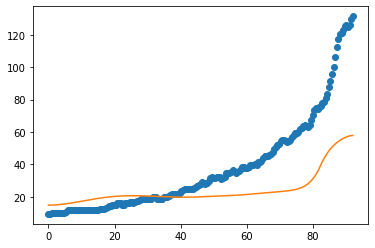

after perturb [2.4143713299990237, 12.704900611596635, 29370.921868381884, 0.2912950752473924, 42.3270579009069]
parameters [2.4143713299990237, 12.704900611596635, 29370.921868381884, 0.2912950752473924, 42.3270579009069]
after perturb [11.345790030734145, 150.69123560077077, 20200.980361117225, 1.0240668898661778, 24.12702915626835]
parameters [11.345790030734145, 150.69123560077077, 20200.980361117225, 1.0240668898661778, 24.12702915626835]
after perturb [7.023893409318247, 53.34659787862065, 25788.800565300124, -0.4138312391903817, 21.85442236255676]
parameters [7.023893409318247, 53.34659787862065, 25788.800565300124, -0.4138312391903817, 21.85442236255676]
after perturb [-1.7981210359554682, 142.43022749580965, 25434.118109936804, 1.889091755658439, 6.091636725736908]
parameters [-1.7981210359554682, 142.43022749580965, 25434.118109936804, 1.889091755658439, 6.091636725736908]
after perturb [3.626652132638374, 91.36090230769601, 22254.779859330665, 0.3062092799005788, 6.576414571

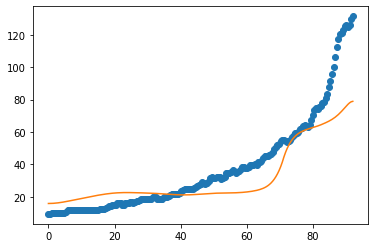

3
after perturb [9.931562453343961, 131.39141503181412, 22032.27821503101, 1.4650509714161237, 0.563169182820257]
parameters [9.931562453343961, 131.39141503181412, 22032.27821503101, 1.4650509714161237, 0.563169182820257]
after perturb [6.300721611222359, 55.49051821544348, 18486.06210731744, 0.29434791135714156, 1.0389526408315426]
parameters [6.300721611222359, 55.49051821544348, 18486.06210731744, 0.29434791135714156, 1.0389526408315426]
after perturb [5.840026039239154, 174.9348168796576, 26615.505020280158, 1.7416177519690836, -4.56358568163132]
parameters [5.840026039239154, 174.9348168796576, 26615.505020280158, 1.7416177519690836, -4.56358568163132]
after perturb [9.59176172694055, 135.70462626043505, 23093.498238785367, 1.8556653160989818, 15.810032739452858]
parameters [9.59176172694055, 135.70462626043505, 23093.498238785367, 1.8556653160989818, 15.810032739452858]
oxigeno [5.49893505e-16 5.58866425e-16 5.86078947e-16 6.32422601e-16
 6.99417798e-16 7.89266973e-16 9.04931774

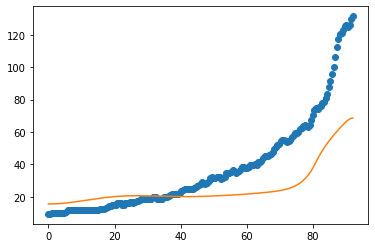

after perturb [0.4207592701600107, 171.83404508198464, 18589.678354667758, 2.1592885308423506, 3.1121295031015643]
parameters [0.4207592701600107, 171.83404508198464, 18589.678354667758, 2.1592885308423506, 3.1121295031015643]
after perturb [1.9312463604084347, 82.64298830666898, 21206.449951241426, 0.7448773581893846, 9.455622432748463]
parameters [1.9312463604084347, 82.64298830666898, 21206.449951241426, 0.7448773581893846, 9.455622432748463]
oxigeno [9.88479486e-14 1.00053045e-13 1.03700252e-13 1.09886299e-13
 1.18775673e-13 1.30605602e-13 1.45693228e-13 1.64445134e-13
 1.87369507e-13 2.15091264e-13 2.48370583e-13 2.88125363e-13
 3.35458275e-13 3.91689196e-13 4.58394002e-13 5.37450881e-13
 6.31095616e-13 7.41987577e-13 8.73288575e-13 1.02875716e-12
 1.21286156e-12 1.43091490e-12 1.68923739e-12 1.99535055e-12
 2.35820980e-12 2.78848258e-12 3.29888064e-12 3.90455642e-12
 4.62357564e-12 5.47748045e-12 6.49196057e-12 7.69765330e-12
 9.13109798e-12 1.08358748e-11 1.28639639e-11 1.527736

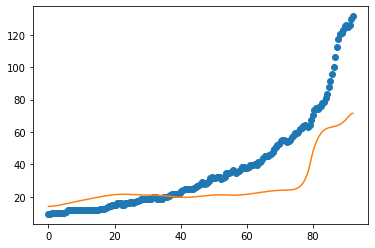

after perturb [-1.0289262455470167, -1.9898006991372768, 23252.069875944184, -0.34954370440456406, 38.3655504112352]
parameters [-1.0289262455470167, -1.9898006991372768, 23252.069875944184, -0.34954370440456406, 38.3655504112352]
after perturb [5.357541681589591, 101.41448985157056, 12562.99675274664, 2.120513374505709, 47.492570276340004]
parameters [5.357541681589591, 101.41448985157056, 12562.99675274664, 2.120513374505709, 47.492570276340004]
after perturb [1.194309966189342, 119.77081521793397, 28982.97617393233, 1.4105525114498056, 6.501035742275338]
parameters [1.194309966189342, 119.77081521793397, 28982.97617393233, 1.4105525114498056, 6.501035742275338]
oxigeno [3.69884880e-15 3.74850770e-15 3.89893039e-15 4.15450429e-15
 4.52270724e-15 5.01435940e-15 5.64398428e-15 6.43029053e-15
 7.39679177e-15 8.57258899e-15 9.99334582e-15 1.17024927e-14
 1.37526996e-14 1.62076592e-14 1.91442287e-14 2.26549837e-14
 2.68512570e-14 3.18667569e-14 3.78619034e-14 4.50290692e-14
 5.35989755e-1

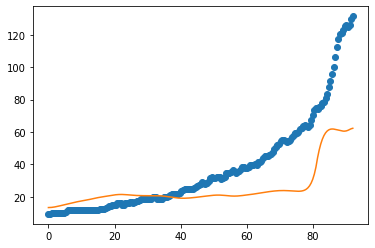

after perturb [7.998465954805571, 14.767892117903031, 22424.064770045326, -0.6270097986787351, 39.145271504633165]
parameters [7.998465954805571, 14.767892117903031, 22424.064770045326, -0.6270097986787351, 39.145271504633165]
after perturb [5.38444995361494, 209.03539559656872, 22750.993157897632, 2.1226102940915865, 6.823159757111899]
parameters [5.38444995361494, 209.03539559656872, 22750.993157897632, 2.1226102940915865, 6.823159757111899]
after perturb [5.027796853275822, 77.44396913886109, 23353.2137491739, 0.11209283652466967, 26.344133825379394]
parameters [5.027796853275822, 77.44396913886109, 23353.2137491739, 0.11209283652466967, 26.344133825379394]
oxigeno [1.52640082e-03 1.52565732e-03 1.52343159e-03 1.51973796e-03
 1.51460005e-03 1.50805044e-03 1.50013016e-03 1.49088816e-03
 1.48038056e-03 1.46866996e-03 1.45582458e-03 1.44191752e-03
 1.42702582e-03 1.41122973e-03 1.39461186e-03 1.37725647e-03
 1.35924875e-03 1.34067421e-03 1.32161809e-03 1.30216492e-03
 1.28239803e-03 1.

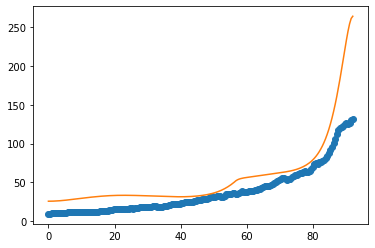

after perturb [0.09462316834045792, 126.94943535630219, 25410.36734017453, 1.712139281489479, 21.674238191941942]
parameters [0.09462316834045792, 126.94943535630219, 25410.36734017453, 1.712139281489479, 21.674238191941942]
oxigeno [7.06427471e-16 7.15448165e-16 7.43139973e-16 7.91236742e-16
 8.62336242e-16 9.59764557e-16 1.08745758e-15 1.24997277e-15
 1.45265722e-15 1.70181733e-15 2.00477488e-15 2.36999293e-15
 2.80783402e-15 3.33216272e-15 3.96210364e-15 4.72311220e-15
 5.64725690e-15 6.77248181e-15 8.14155317e-15 9.80271290e-15
 1.18122655e-14 1.42376485e-14 1.71595660e-14 2.06730790e-14
 2.48887712e-14 2.99387841e-14 3.59934253e-14 4.32875136e-14
 5.21441478e-14 6.29844199e-14 7.63232911e-14 9.27459711e-14
 1.12879957e-13 1.37402291e-13 1.67106291e-13 2.03023896e-13
 2.46512156e-13 2.99275133e-13 3.63372412e-13 4.41311213e-13
 5.36230574e-13 6.52190070e-13 7.94468077e-13 9.69763440e-13
 1.18626892e-12 1.45357073e-12 1.78247672e-12 2.18493383e-12
 2.67440234e-12 3.26727974e-12 3.98

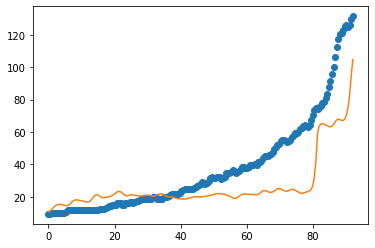

after perturb [-0.028096438149336933, 44.18537798801812, 24970.09473834165, 0.4489102407181531, 69.58459633934089]
parameters [-0.028096438149336933, 44.18537798801812, 24970.09473834165, 0.4489102407181531, 69.58459633934089]
after perturb [7.0315336225793965, 176.83759340140003, 20221.381360729054, 2.8608802942336604, 29.38713890615419]
parameters [7.0315336225793965, 176.83759340140003, 20221.381360729054, 2.8608802942336604, 29.38713890615419]
after perturb [7.587905249531148, 121.18379677453446, 20977.407095646653, 1.3509040249854494, 3.5438138120201828]
parameters [7.587905249531148, 121.18379677453446, 20977.407095646653, 1.3509040249854494, 3.5438138120201828]
oxigeno [6.67512561e-15 6.76830635e-15 7.05046204e-15 7.52951254e-15
 8.21892499e-15 9.13812415e-15 1.03130855e-14 1.17771304e-14
 1.35719504e-14 1.57488923e-14 1.83705488e-14 2.15127060e-14
 2.52667110e-14 2.97423410e-14 3.50712662e-14 4.14112241e-14
 4.89510418e-14 5.79166770e-14 6.85784773e-14 8.12599014e-14
 9.6347995

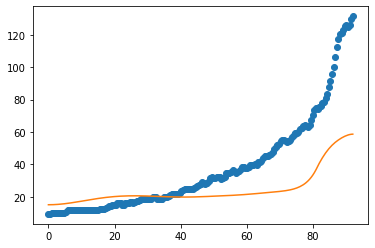

after perturb [0.7019621310393149, 87.34845921803296, 20118.525964413748, 1.3146801866219635, 5.368356780648863]
parameters [0.7019621310393149, 87.34845921803296, 20118.525964413748, 1.3146801866219635, 5.368356780648863]
oxigeno [2.29909638e-17 2.34057071e-17 2.46667293e-17 2.68251195e-17
 2.99683891e-17 3.42240071e-17 3.97644097e-17 4.68137134e-17
 5.56565905e-17 6.66500369e-17 8.02389985e-17 9.69769592e-17
 1.17552573e-16 1.42823252e-16 1.73856377e-16 2.11978641e-16
 2.58834170e-16 3.16452733e-16 3.87330642e-16 4.74528977e-16
 5.81796468e-16 7.13727597e-16 8.75969833e-16 1.07549682e-15
 1.32096601e-15 1.62317871e-15 1.99565811e-15 2.45535668e-15
 3.02350274e-15 3.72659914e-15 4.59760080e-15 5.67732402e-15
 7.01617919e-15 8.67636490e-15 1.07347096e-14 1.32863894e-14
 1.64497811e-14 2.03727326e-14 2.52405374e-14 3.12859018e-14
 3.88011786e-14 4.81531308e-14 5.98005012e-14 7.43147533e-14
 9.24045754e-14 1.14945145e-13 1.43013740e-13 1.77933957e-13
 2.21331438e-13 2.75204402e-13 3.4201

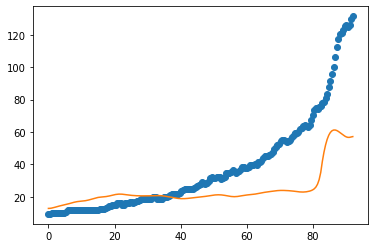

after perturb [3.9721922022151497, 165.88267179359124, 22491.59373822414, 1.6250638339240195, -2.5431738020722694]
parameters [3.9721922022151497, 165.88267179359124, 22491.59373822414, 1.6250638339240195, -2.5431738020722694]
after perturb [6.968007382285991, 166.4131418955248, 19942.21700702013, 2.2216032666491077, -12.16748052465913]
parameters [6.968007382285991, 166.4131418955248, 19942.21700702013, 2.2216032666491077, -12.16748052465913]
after perturb [8.989470194126838, 18.803113593268208, 23281.843141199133, 0.9142789861913725, 51.10877092280961]
parameters [8.989470194126838, 18.803113593268208, 23281.843141199133, 0.9142789861913725, 51.10877092280961]
after perturb [4.289209125673633, 187.77529710530337, 27179.345081112177, 2.37262969326581, -6.132305531355158]
parameters [4.289209125673633, 187.77529710530337, 27179.345081112177, 2.37262969326581, -6.132305531355158]
after perturb [1.315792582030243, 63.60408192874924, 22458.59368555056, 0.5731583945115307, 5.81721756851299

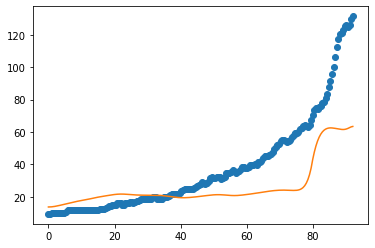

after perturb [12.70022680174985, 101.01700351874543, 23202.8852472116, 1.0625114187617555, 18.723355091996716]
parameters [12.70022680174985, 101.01700351874543, 23202.8852472116, 1.0625114187617555, 18.723355091996716]
after perturb [-3.4621947625860185, 28.13414253900403, 20697.06346749872, 0.002775046974512807, 24.71556295737402]
parameters [-3.4621947625860185, 28.13414253900403, 20697.06346749872, 0.002775046974512807, 24.71556295737402]
after perturb [0.5398536901737064, 120.44553555746643, 25772.019188026414, 0.9360399564222714, 18.965357215085966]
parameters [0.5398536901737064, 120.44553555746643, 25772.019188026414, 0.9360399564222714, 18.965357215085966]
oxigeno [2.38692669e-12 2.40866706e-12 2.47443657e-12 2.58587696e-12
 2.74571534e-12 2.95775696e-12 3.22688936e-12 3.55911252e-12
 3.96161493e-12 4.44291747e-12 5.01310600e-12 5.68416485e-12
 6.47040782e-12 7.38898267e-12 8.46040729e-12 9.70908994e-12
 1.11637997e-11 1.28580862e-11 1.48306909e-11 1.71260372e-11
 1.97949160e

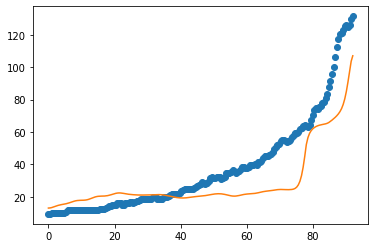

4
after perturb [4.162488207762346, 129.55637120924047, 21417.60805938042, 0.8919567079574798, 29.070180379754195]
parameters [4.162488207762346, 129.55637120924047, 21417.60805938042, 0.8919567079574798, 29.070180379754195]
oxigeno [1.31803037e-11 1.32953436e-11 1.36425249e-11 1.42280763e-11
 1.50625250e-11 1.61609196e-11 1.75431479e-11 1.92343564e-11
 2.12654798e-11 2.36738922e-11 2.65041925e-11 2.98091409e-11
 3.36507666e-11 3.81016704e-11 4.32465497e-11 4.91839802e-11
 5.60284925e-11 6.39129901e-11 7.29915619e-11 8.34427520e-11
 9.54733592e-11 1.09322851e-10 1.25268489e-10 1.43631282e-10
 1.64782891e-10 1.89153649e-10 2.17241852e-10 2.49624540e-10
 2.86969984e-10 3.30052153e-10 3.79767454e-10 4.37154097e-10
 5.03414476e-10 5.79941032e-10 6.68346084e-10 7.70496253e-10
 8.88552122e-10 1.02501391e-09 1.18277404e-09 1.36517760e-09
 1.57609178e-09 1.81998577e-09 2.10202237e-09 2.42816327e-09
 2.80528984e-09 3.24134180e-09 3.74547635e-09 4.32825085e-09
 5.00183244e-09 5.78023882e-09 6.67

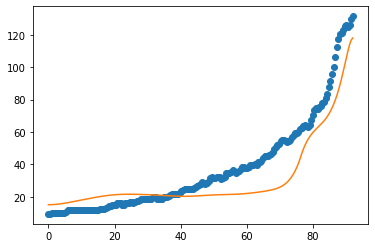

5
after perturb [-0.03954821206944936, 148.68999717795302, 33744.14072678995, 1.3894332683591502, 16.07073606856218]
parameters [-0.03954821206944936, 148.68999717795302, 33744.14072678995, 1.3894332683591502, 16.07073606856218]
after perturb [9.296508064267778, 164.14025914483, 25302.493328950834, 2.1714003032225135, 31.427483476943664]
parameters [9.296508064267778, 164.14025914483, 25302.493328950834, 2.1714003032225135, 31.427483476943664]
after perturb [2.086328082246847, 157.84491068668865, 17836.986960530852, 2.6049807138198444, 23.830241199540918]
parameters [2.086328082246847, 157.84491068668865, 17836.986960530852, 2.6049807138198444, 23.830241199540918]
after perturb [11.888921367290903, 82.88472682725083, 28392.964745331075, -0.06167447587109787, 5.333801557069579]
parameters [11.888921367290903, 82.88472682725083, 28392.964745331075, -0.06167447587109787, 5.333801557069579]
after perturb [8.852523139458572, 101.88586688107304, 19493.46889310136, 1.517013654674899, 47.18173

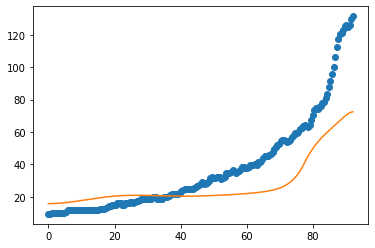

after perturb [-0.32104654615221495, 138.0590032929506, 18634.910414000384, 3.539595165335954, 70.51241768836]
parameters [-0.32104654615221495, 138.0590032929506, 18634.910414000384, 3.539595165335954, 70.51241768836]
after perturb [5.919091553820781, 116.11586274031026, 22593.033176214227, 1.0949295516060011, 28.891419140912465]
parameters [5.919091553820781, 116.11586274031026, 22593.033176214227, 1.0949295516060011, 28.891419140912465]
oxigeno [1.57466940e-13 1.59364427e-13 1.65103008e-13 1.74822295e-13
 1.88759159e-13 2.07254136e-13 2.30760653e-13 2.59857331e-13
 2.95263733e-13 3.37859996e-13 3.88710921e-13 4.49095216e-13
 5.20540745e-13 6.04866792e-13 7.04234580e-13 8.21207516e-13
 9.58822923e-13 1.12067734e-12 1.31102792e-12 1.53491285e-12
 1.79829439e-12 2.10822865e-12 2.47306713e-12 2.90269597e-12
 3.40881974e-12 4.00529833e-12 4.70854645e-12 5.53800754e-12
 6.51671584e-12 7.67196254e-12 9.03608555e-12 1.06474050e-11
 1.25513315e-11 1.48016781e-11 1.74622131e-11 2.06084971e-11

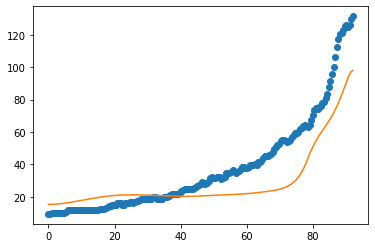

6
after perturb [-1.8178898114213375, 74.38258601939935, 26186.786221106868, 0.4459226984550253, 17.339462251516167]
parameters [-1.8178898114213375, 74.38258601939935, 26186.786221106868, 0.4459226984550253, 17.339462251516167]
after perturb [5.530754701618145, 67.46787570823076, 20182.935811557974, 0.9457883988347182, 50.958168283825266]
parameters [5.530754701618145, 67.46787570823076, 20182.935811557974, 0.9457883988347182, 50.958168283825266]
after perturb [2.5419016821962113, 65.78380522214042, 23450.292651607597, 0.8672154386506266, 36.549427796904126]
parameters [2.5419016821962113, 65.78380522214042, 23450.292651607597, 0.8672154386506266, 36.549427796904126]
oxigeno [2.29705155e-16 2.32550172e-16 2.41202650e-16 2.56019686e-16
 2.77612719e-16 3.06872708e-16 3.45006942e-16 3.93589109e-16
 4.54624843e-16 5.30635647e-16 6.24764866e-16 7.40910401e-16
 8.83889965e-16 1.05964621e-15 1.27550075e-15 1.54046847e-15
 1.86564605e-15 2.26469231e-15 2.75442212e-15 3.35554084e-15
 4.0935531

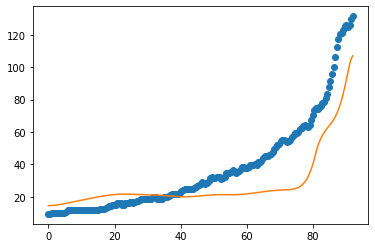

7
after perturb [9.082151974308854, 67.08267958696426, 21788.39460686301, -0.20151160236491128, 32.041562819938]
parameters [9.082151974308854, 67.08267958696426, 21788.39460686301, -0.20151160236491128, 32.041562819938]
after perturb [6.092170247338581, 54.19905740341456, 25260.88354622077, -0.34997297286829987, 22.80534484887439]
parameters [6.092170247338581, 54.19905740341456, 25260.88354622077, -0.34997297286829987, 22.80534484887439]
after perturb [1.7856376396736544, 117.00812046427271, 18869.096381772128, 2.551471857669078, 21.52225629556137]
parameters [1.7856376396736544, 117.00812046427271, 18869.096381772128, 2.551471857669078, 21.52225629556137]
after perturb [-1.6717679393237355, 76.88483666377364, 18704.19382404511, 2.1975440588261477, 59.022343088189174]
parameters [-1.6717679393237355, 76.88483666377364, 18704.19382404511, 2.1975440588261477, 59.022343088189174]
after perturb [-1.5584282921645098, 194.19902089222393, 28589.68727633661, 1.8151384452034502, 6.04688158348

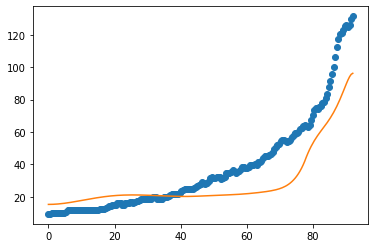

8
after perturb [4.982345741135337, 138.0480792617385, 20971.513728290087, 1.6011199099776974, 30.68618744103656]
parameters [4.982345741135337, 138.0480792617385, 20971.513728290087, 1.6011199099776974, 30.68618744103656]
oxigeno [1.00251167e-14 1.01604491e-14 1.05701603e-14 1.12655071e-14
 1.22656374e-14 1.35981822e-14 1.53001134e-14 1.74188922e-14
 2.00139492e-14 2.31585432e-14 2.69420608e-14 3.14728336e-14
 3.68815672e-14 4.33254965e-14 5.09934069e-14 6.01116922e-14
 7.09516534e-14 8.38382865e-14 9.91608600e-14 1.17385643e-13
 1.39071222e-13 1.64886930e-13 1.95635021e-13 2.32277361e-13
 2.75967546e-13 3.28089544e-13 3.90304220e-13 4.64605293e-13
 5.53386683e-13 6.59523516e-13 7.86469547e-13 9.38374297e-13
 1.12022385e-12 1.33801003e-12 1.59893358e-12 1.91164805e-12
 2.28655257e-12 2.73614289e-12 3.27543227e-12 3.92245583e-12
 4.69887465e-12 5.63069896e-12 6.74915353e-12 8.09171292e-12
 9.70333929e-12 1.16379621e-11 1.39602460e-11 1.67477031e-11
 2.00932156e-11 2.41080469e-11 2.8925

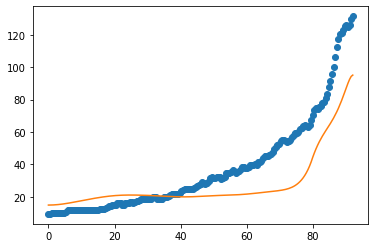

9
after perturb [4.977604997708031, 162.17600360617192, 22303.984641644707, 1.8796754881838231, 7.158678083635602]
parameters [4.977604997708031, 162.17600360617192, 22303.984641644707, 1.8796754881838231, 7.158678083635602]
after perturb [5.400272666036683, 85.69747353568883, 22014.130754136477, 1.1842817672540566, 33.420819305612994]
parameters [5.400272666036683, 85.69747353568883, 22014.130754136477, 1.1842817672540566, 33.420819305612994]
oxigeno [1.68491199e-16 1.71583925e-16 1.80975830e-16 1.97012587e-16
 2.20285475e-16 2.51654783e-16 2.92283949e-16 3.43685865e-16
 4.07783317e-16 4.86986115e-16 5.84288184e-16 7.03388760e-16
 8.48842849e-16 1.02624742e-15 1.24247126e-15 1.50593855e-15
 1.82697815e-15 2.21825404e-15 2.69529535e-15 3.27714927e-15
 3.98718518e-15 4.85408531e-15 5.91306523e-15 7.20737771e-15
 8.79016596e-15 1.07267476e-14 1.30974296e-14 1.60009774e-14
 1.95588903e-14 2.39206701e-14 2.92703129e-14 3.58343050e-14
 4.38914725e-14 5.37851072e-14 6.59378928e-14 8.08702709

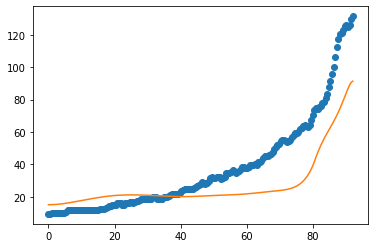

after perturb [8.768696266060333, 63.17094805607526, 28317.541648885774, 1.0259207960052241, 41.91766387484785]
parameters [8.768696266060333, 63.17094805607526, 28317.541648885774, 1.0259207960052241, 41.91766387484785]
oxigeno [3.13082173e-18 3.20531568e-18 3.43237717e-18 3.82292170e-18
 4.39573953e-18 5.17842466e-18 6.20874193e-18 7.53650303e-18
 9.22604863e-18 1.13594658e-17 1.40407083e-17 1.74008352e-17
 2.16046419e-17 2.68590333e-17 3.34235788e-17 4.16238073e-17
 5.18679475e-17 6.46680006e-17 8.06662668e-17 1.00668740e-16
 1.25687153e-16 1.56991920e-16 1.96178808e-16 2.45252915e-16
 3.06734441e-16 3.83791939e-16 4.80410171e-16 6.01601574e-16
 7.53672663e-16 9.44559610e-16 1.18425096e-15 1.48532001e-15
 1.86359531e-15 2.33900475e-15 2.93663835e-15 3.68808566e-15
 4.63311872e-15 5.82180899e-15 7.31718951e-15 9.19860169e-15
 1.15659011e-14 1.45447410e-14 1.82932078e-14 2.30101494e-14
 2.89456264e-14 3.64140198e-14 4.58104639e-14 5.76314393e-14
 7.25005666e-14 9.12008994e-14 1.147153

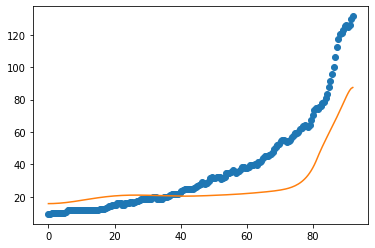

after perturb [3.22229366567364, 77.3108760280567, 30961.930862394212, 0.9738105912798419, 29.343095063573315]
parameters [3.22229366567364, 77.3108760280567, 30961.930862394212, 0.9738105912798419, 29.343095063573315]
after perturb [6.342790088759988, 161.70807684298768, 22624.680908424474, 1.8214224478563317, 3.0950647842347507]
parameters [6.342790088759988, 161.70807684298768, 22624.680908424474, 1.8214224478563317, 3.0950647842347507]
after perturb [5.128999430404731, 200.20000275405027, 22651.58120718011, 2.513812371965834, 9.668990956591662]
parameters [5.128999430404731, 200.20000275405027, 22651.58120718011, 2.513812371965834, 9.668990956591662]
after perturb [8.300773964588323, 89.82077251310405, 21636.73051660315, 1.4495803065189363, 15.596151084850003]
parameters [8.300773964588323, 89.82077251310405, 21636.73051660315, 1.4495803065189363, 15.596151084850003]
oxigeno [9.78840197e-18 9.99493849e-18 1.06232455e-17 1.16997987e-17
 1.32700209e-17 1.54002900e-17 1.81808812e-17 2

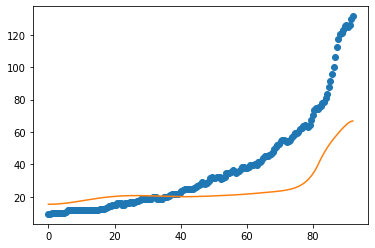

after perturb [7.68311087055237, 207.38070818922986, 27895.788061530675, 2.342523312915202, -17.777068374455016]
parameters [7.68311087055237, 207.38070818922986, 27895.788061530675, 2.342523312915202, -17.777068374455016]
after perturb [3.8010387836690427, 50.52503605305478, 22213.724387508333, 0.40878570868703024, 31.110020022421658]
parameters [3.8010387836690427, 50.52503605305478, 22213.724387508333, 0.40878570868703024, 31.110020022421658]
oxigeno [4.60245332e-09 4.59603322e-09 4.57684512e-09 4.54510386e-09
 4.50116127e-09 4.44549734e-09 4.37870826e-09 4.30149214e-09
 4.21463290e-09 4.11898308e-09 4.01544615e-09 3.90495913e-09
 3.78847586e-09 3.66695156e-09 3.54132894e-09 3.41252608e-09
 3.28142630e-09 3.14886994e-09 3.01564802e-09 2.88249769e-09
 2.75009925e-09 2.61907458e-09 2.48998677e-09 2.36334074e-09
 2.23958474e-09 2.11911246e-09 2.00226573e-09 1.88933772e-09
 1.78057638e-09 1.67618841e-09 1.57634338e-09 1.48117824e-09
 1.39080213e-09 1.30530144e-09 1.22474540e-09 1.149191

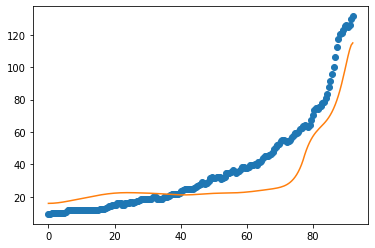

10
after perturb [-1.349263389583464, 124.0998418214121, 21852.88139170044, 0.6659288045993313, -20.5755776509402]
parameters [-1.349263389583464, 124.0998418214121, 21852.88139170044, 0.6659288045993313, -20.5755776509402]
after perturb [-1.496911378182154, 50.491535006172874, 24609.84481970308, 1.4822282360966328, 56.56981431377611]
parameters [-1.496911378182154, 50.491535006172874, 24609.84481970308, 1.4822282360966328, 56.56981431377611]
after perturb [3.601154250179826, 125.43870638365632, 30382.845027382653, 1.7669553223639534, 56.083964223616896]
parameters [3.601154250179826, 125.43870638365632, 30382.845027382653, 1.7669553223639534, 56.083964223616896]
after perturb [11.422313202451384, 187.04689438079245, 27126.365955223562, 2.445270817542779, 15.952218267659749]
parameters [11.422313202451384, 187.04689438079245, 27126.365955223562, 2.445270817542779, 15.952218267659749]
after perturb [15.635805776431948, 104.74852306981037, 19201.080629167634, 2.0154462350554385, 25.90264

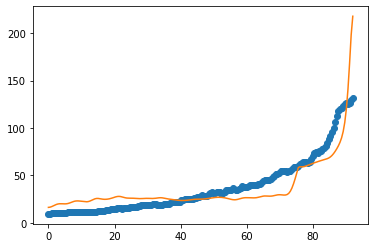

11
after perturb [-4.224963806384468, 139.74170641443044, 22507.348029798508, 3.031139305070151, 23.48024371479731]
parameters [-4.224963806384468, 139.74170641443044, 22507.348029798508, 3.031139305070151, 23.48024371479731]
after perturb [-0.5785401127181433, 128.84724292898014, 30367.04323393772, 1.2955301679345745, 30.33201800850209]
parameters [-0.5785401127181433, 128.84724292898014, 30367.04323393772, 1.2955301679345745, 30.33201800850209]
after perturb [8.033604760433743, 111.8607965707202, 16736.899448105367, 1.2716785128299648, 14.926186582751498]
parameters [8.033604760433743, 111.8607965707202, 16736.899448105367, 1.2716785128299648, 14.926186582751498]
after perturb [3.6786658339648013, 8.956391371930025, 20659.4195250182, -0.5539217999822046, 29.464982153163557]
parameters [3.6786658339648013, 8.956391371930025, 20659.4195250182, -0.5539217999822046, 29.464982153163557]
after perturb [4.099093292559456, 117.69134287769887, 21967.48918254561, 1.4987265784363921, 34.7271275

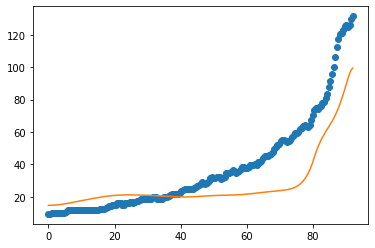

12
after perturb [0.3708721985384078, 61.525721665125246, 18790.59094967288, 0.31733732248315805, 13.88531551076747]
parameters [0.3708721985384078, 61.525721665125246, 18790.59094967288, 0.31733732248315805, 13.88531551076747]
after perturb [-2.708771167085903, 68.60776626660038, 28214.01114377425, 1.515164292387944, 68.1865091783694]
parameters [-2.708771167085903, 68.60776626660038, 28214.01114377425, 1.515164292387944, 68.1865091783694]
after perturb [-1.918260838770521, 56.36260194108912, 22884.821382431703, -1.0072441405243373, -18.31395211940105]
parameters [-1.918260838770521, 56.36260194108912, 22884.821382431703, -1.0072441405243373, -18.31395211940105]
after perturb [4.346774590279584, 82.39165103242598, 30355.851424206743, 0.4512610743185153, 47.297919489265524]
parameters [4.346774590279584, 82.39165103242598, 30355.851424206743, 0.4512610743185153, 47.297919489265524]
after perturb [5.698154876963956, 60.34283513895433, 25967.72695334274, 1.2117515829442462, 46.8938081805

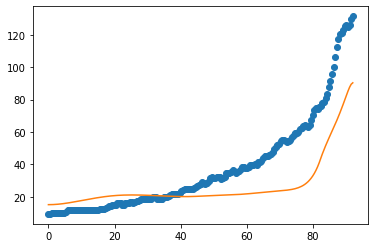

after perturb [2.9309183870165016, 17.690160357567358, 31679.717931601, -1.0656929602327723, 16.669069822173526]
parameters [2.9309183870165016, 17.690160357567358, 31679.717931601, -1.0656929602327723, 16.669069822173526]
after perturb [4.048511438076423, 104.94779242316345, 25678.33734397766, 2.3486769155545084, 39.497113829800554]
parameters [4.048511438076423, 104.94779242316345, 25678.33734397766, 2.3486769155545084, 39.497113829800554]
oxigeno [2.54087303e-20 2.60554802e-20 2.80289711e-20 3.14307762e-20
 3.64364575e-20 4.33053705e-20 5.23952004e-20 6.41821025e-20
 7.92876579e-20 9.85142683e-20 1.22891136e-19 1.53733623e-19
 1.92719617e-19 2.41987601e-19 3.04262464e-19 3.83016891e-19
 4.82678370e-19 6.08894839e-19 7.68875710e-19 9.71829898e-19
 1.22952878e-18 1.55703010e-18 1.97360939e-18 2.50395904e-18
 3.17973257e-18 4.04153463e-18 5.14148609e-18 6.54653178e-18
 8.34270683e-18 1.06406407e-17 1.35826587e-17 1.73519455e-17
 2.21843680e-17 2.83837305e-17 3.63414511e-17 4.65619393e-

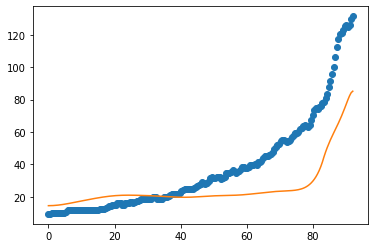

after perturb [8.880963498066594, 123.79327844502382, 25803.03831504679, 1.1044592357191865, 9.481950678185857]
parameters [8.880963498066594, 123.79327844502382, 25803.03831504679, 1.1044592357191865, 9.481950678185857]
oxigeno [2.95872078e-13 2.99297523e-13 3.09653365e-13 3.27180120e-13
 3.52285376e-13 3.85554079e-13 4.27763310e-13 4.79901976e-13
 5.43195920e-13 6.19139159e-13 7.09532073e-13 8.16527597e-13
 9.42686667e-13 1.09104442e-12 1.26518898e-12 1.46935491e-12
 1.70853398e-12 1.98860614e-12 2.31649444e-12 2.70034789e-12
 3.14975752e-12 3.67601127e-12 4.29239485e-12 5.01454660e-12
 5.86087609e-12 6.85305775e-12 8.01661294e-12 9.38159606e-12
 1.09834034e-11 1.28637259e-11 1.50716725e-11 1.76650922e-11
 2.07121320e-11 2.42930703e-11 2.85024752e-11 3.34517439e-11
 3.92720900e-11 4.61180557e-11 5.41716410e-11 6.36471564e-11
 7.47969225e-11 8.79179648e-11 1.03359871e-10 1.21534015e-10
 1.42924370e-10 1.68100204e-10 1.97730941e-10 2.32603597e-10
 2.73643192e-10 3.21936660e-10 3.787608

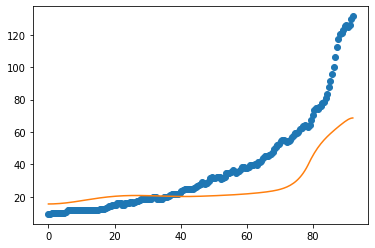

after perturb [5.520815063973467, 61.44283962792064, 21293.965317817845, 0.6497466200764912, 49.14113916093164]
parameters [5.520815063973467, 61.44283962792064, 21293.965317817845, 0.6497466200764912, 49.14113916093164]
oxigeno [2.83162026e-13 2.82827452e-13 2.81830573e-13 2.80191911e-13
 2.77945635e-13 2.75139544e-13 2.71835085e-13 2.68107460e-13
 2.64045884e-13 2.59754067e-13 2.55351004e-13 2.50972178e-13
 2.46771283e-13 2.42922603e-13 2.39624195e-13 2.37102049e-13
 2.35615429e-13 2.35463631e-13 2.36994455e-13 2.40614709e-13
 2.46803192e-13 2.56126626e-13 2.69259155e-13 2.87006151e-13
 3.10333213e-13 3.40401460e-13 3.78610416e-13 4.26650121e-13
 4.86564381e-13 5.60827535e-13 6.52437575e-13 7.65029077e-13
 9.03010093e-13 1.07172805e-12 1.27767073e-12 1.52870955e-12
 1.83439416e-12 2.20630873e-12 2.65850277e-12 3.20801198e-12
 3.87548730e-12 4.68595459e-12 5.66973136e-12 6.86353272e-12
 8.31180469e-12 1.00683312e-11 1.21981696e-11 1.47799815e-11
 1.79088377e-11 2.16995927e-11 2.629094

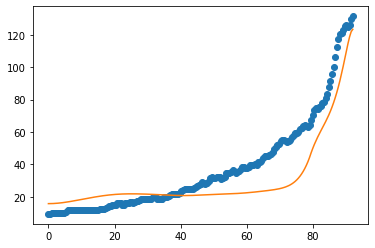

13
after perturb [-0.19546080965624557, 23.518180396869184, 29576.39425507737, -0.9604404033657976, 8.599010615694622]
parameters [-0.19546080965624557, 23.518180396869184, 29576.39425507737, -0.9604404033657976, 8.599010615694622]
after perturb [5.952597843777236, 72.64645647753882, 21384.455856464338, 0.4413754499159972, -16.21570284381925]
parameters [5.952597843777236, 72.64645647753882, 21384.455856464338, 0.4413754499159972, -16.21570284381925]
after perturb [0.7406857311997608, 75.62809745683407, 17648.916737877003, 1.9631447773475457, 55.07354312741016]
parameters [0.7406857311997608, 75.62809745683407, 17648.916737877003, 1.9631447773475457, 55.07354312741016]
after perturb [5.451988245196645, 66.86243848591454, 19954.456783510712, 1.2041353521287783, 45.65865149717544]
parameters [5.451988245196645, 66.86243848591454, 19954.456783510712, 1.2041353521287783, 45.65865149717544]
after perturb [4.255165561823038, -46.80296565205923, 28817.914212360625, -2.091038046248692, 56.2262

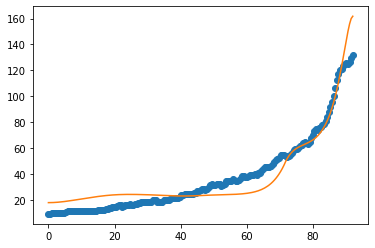

14
after perturb [7.5016570184911755, 129.42718161678656, 20213.810481490724, 2.1136788532108826, 34.01296829203268]
parameters [7.5016570184911755, 129.42718161678656, 20213.810481490724, 2.1136788532108826, 34.01296829203268]
oxigeno [2.41641414e-17 2.46217352e-17 2.60119392e-17 2.83877313e-17
 3.18398049e-17 3.65002759e-17 4.25480978e-17 5.02164253e-17
 5.98022511e-17 7.16787450e-17 8.63108412e-17 1.04274774e-16
 1.26282436e-16 1.53211648e-16 1.86143727e-16 2.26410028e-16
 2.75649598e-16 3.35880566e-16 4.09588540e-16 4.99836064e-16
 6.10398181e-16 7.45930368e-16 9.12176582e-16 1.11622709e-15
 1.36683803e-15 1.67482751e-15 2.05356676e-15 2.51958902e-15
 3.09334459e-15 3.80013711e-15 4.67128452e-15 5.74555854e-15
 7.07096952e-15 8.70697899e-15 1.07272422e-14 1.32230073e-14
 1.63073264e-14 2.01202730e-14 2.48354030e-14 3.06677550e-14
 3.78837519e-14 4.68134535e-14 5.78657138e-14 7.15469223e-14
 8.84841733e-14 1.09453895e-13 1.35417213e-13 1.67563624e-13
 2.07364894e-13 2.56641576e-13 3

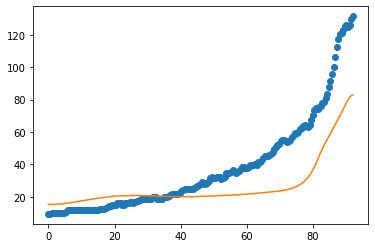

after perturb [8.92872460897573, 89.25838021535874, 26577.55611210394, 0.8175274401760058, 11.264856075180955]
parameters [8.92872460897573, 89.25838021535874, 26577.55611210394, 0.8175274401760058, 11.264856075180955]
oxigeno [9.60787515e-14 9.73588456e-14 1.01233066e-13 1.07804180e-13
 1.17246672e-13 1.29811652e-13 1.45833933e-13 1.65741484e-13
 1.90067549e-13 2.19465784e-13 2.54728873e-13 2.96811181e-13
 3.46856114e-13 4.06229022e-13 4.76556614e-13 5.59774088e-13
 6.58181381e-13 7.74510236e-13 9.12004102e-13 1.07451327e-12
 1.26660809e-12 1.49371374e-12 1.76227045e-12 2.07992417e-12
 2.45575322e-12 2.90053783e-12 3.42708053e-12 4.05058696e-12
 4.78911838e-12 5.66412933e-12 6.70110627e-12 7.93032596e-12
 9.38775588e-12 1.11161229e-11 1.31661816e-11 1.55982180e-11
 1.84838339e-11 2.19080610e-11 2.59718669e-11 3.07951231e-11
 3.65201201e-11 4.33157281e-11 5.13823200e-11 6.09575949e-11
 7.23234632e-11 8.58141840e-11 1.01825979e-10 1.20828386e-10
 1.43377664e-10 1.70132605e-10 2.01873197

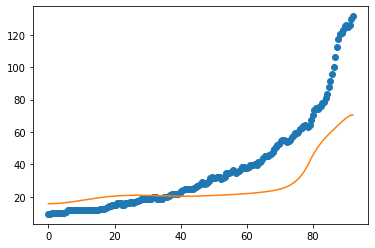

after perturb [-5.631308490733316, 90.2158835433106, 27891.176650750876, 0.5726637695670664, 19.154309372336304]
parameters [-5.631308490733316, 90.2158835433106, 27891.176650750876, 0.5726637695670664, 19.154309372336304]
after perturb [1.3394359844697243, 101.56105791673518, 25912.328855479474, 1.9094310318028729, 48.59440823168359]
parameters [1.3394359844697243, 101.56105791673518, 25912.328855479474, 1.9094310318028729, 48.59440823168359]
oxigeno [9.20407849e-19 9.39745252e-19 9.98607546e-19 1.09958896e-18
 1.24716163e-18 1.44790492e-18 1.71084074e-18 2.04789110e-18
 2.47448126e-18 3.01032039e-18 3.68040173e-18 4.51627584e-18
 5.55766382e-18 6.85449304e-18 8.46945739e-18 1.04812292e-17
 1.29884843e-17 1.61149480e-17 2.00157352e-17 2.48853440e-17
 3.09677755e-17 3.85693952e-17 4.80753280e-17 5.99703845e-17
 7.48657644e-17 9.35330696e-17 1.16947510e-16 1.46342630e-16
 1.83279448e-16 2.29733710e-16 2.88205995e-16 3.61860889e-16
 4.54703376e-16 5.71803098e-16 7.19580298e-16 9.06171135

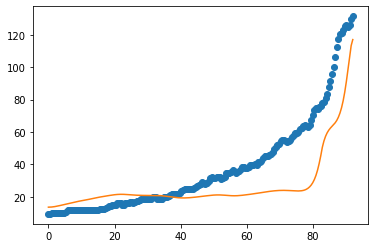

after perturb [7.785483344360515, 140.72204248727542, 22205.565073094087, 1.7241496424820784, 15.078342103694027]
parameters [7.785483344360515, 140.72204248727542, 22205.565073094087, 1.7241496424820784, 15.078342103694027]
oxigeno [3.66387332e-15 3.71698105e-15 3.87785489e-15 4.15119596e-15
 4.54500508e-15 5.07083726e-15 5.74417002e-15 6.58489837e-15
 7.61797344e-15 8.87420682e-15 1.03912685e-14 1.22149127e-14
 1.44004749e-14 1.70146916e-14 2.01379063e-14 2.38667396e-14
 2.83173170e-14 3.36291670e-14 3.99699285e-14 4.75410319e-14
 5.65845565e-14 6.73915053e-14 8.03117913e-14 9.57662889e-14
 1.14261378e-13 1.36406493e-13 1.62935305e-13 1.94731282e-13
 2.32858521e-13 2.78598968e-13 3.33497298e-13 3.99415070e-13
 4.78596020e-13 5.73744808e-13 6.88121936e-13 8.25658152e-13
 9.91092293e-13 1.19013733e-12 1.42968032e-12 1.71802311e-12
 2.06517204e-12 2.48318644e-12 2.98659775e-12 3.59291345e-12
 4.32322263e-12 5.20292355e-12 6.26259743e-12 7.53905745e-12
 9.07660766e-12 1.09285533e-11 1.31

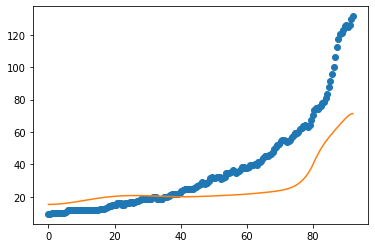

after perturb [-1.6883359738165102, 106.28172481833535, 21048.238817655838, 1.1467201735456474, 18.012587630187834]
parameters [-1.6883359738165102, 106.28172481833535, 21048.238817655838, 1.1467201735456474, 18.012587630187834]
after perturb [7.184830112483844, 149.12622877259622, 22834.849904604518, 0.9669240084736841, 28.147818087244076]
parameters [7.184830112483844, 149.12622877259622, 22834.849904604518, 0.9669240084736841, 28.147818087244076]
oxigeno [3.47471396e-11 3.50300563e-11 3.58834795e-11 3.73215169e-11
 3.93679774e-11 4.20568218e-11 4.54328058e-11 4.95523282e-11
 5.44845017e-11 6.03124665e-11 6.71349738e-11 7.50682697e-11
 8.42483175e-11 9.48334027e-11 1.07007172e-10 1.20982167e-10
 1.37003924e-10 1.55355718e-10 1.76364052e-10 2.00404991e-10
 2.27911475e-10 2.59381751e-10 2.95389093e-10 3.36592995e-10
 3.83752068e-10 4.37738873e-10 4.99557007e-10 5.70360735e-10
 6.51477583e-10 7.44434293e-10 8.50986650e-10 9.73153735e-10
 1.11325725e-09 1.27396667e-09 1.45835096e-09 1.66

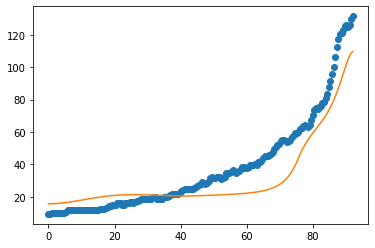

15
after perturb [4.255509321552135, 66.24059769616284, 20811.55532573252, 0.0620799123030058, 7.101477593946157]
parameters [4.255509321552135, 66.24059769616284, 20811.55532573252, 0.0620799123030058, 7.101477593946157]
oxigeno [1.09321352e-02 1.09276453e-02 1.09142056e-02 1.08919057e-02
 1.08608929e-02 1.08213701e-02 1.07735921e-02 1.07178616e-02
 1.06545241e-02 1.05839631e-02 1.05065944e-02 1.04228603e-02
 1.03332245e-02 1.02381664e-02 1.01381758e-02 1.00337486e-02
 9.92538232e-03 9.81357231e-03 9.69880853e-03 9.58157280e-03
 9.46233658e-03 9.34155913e-03 9.21968617e-03 9.09714876e-03
 8.97436252e-03 8.85172708e-03 8.72962568e-03 8.60842490e-03
 8.48847457e-03 8.37010766e-03 8.25364033e-03 8.13937198e-03
 8.02758538e-03 7.91854689e-03 7.81250659e-03 7.70969869e-03
 7.61034183e-03 7.51463956e-03 7.42278093e-03 7.33494119e-03
 7.25128266e-03 7.17195572e-03 7.09710003e-03 7.02684590e-03
 6.96131582e-03 6.90062624e-03 6.84488941e-03 6.79421550e-03
 6.74871475e-03 6.70849983e-03 6.67368

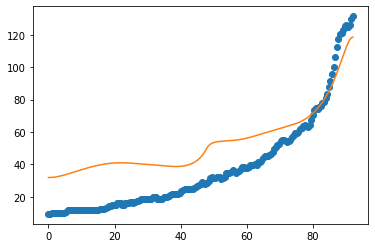

after perturb [10.16119436016521, 76.41372166158374, 22417.47776669937, 2.338782539672593, 51.30722172268891]
parameters [10.16119436016521, 76.41372166158374, 22417.47776669937, 2.338782539672593, 51.30722172268891]
after perturb [9.780313718633495, 56.7252712781572, 23217.515532240795, 1.4685144694379988, 55.18404120531912]
parameters [9.780313718633495, 56.7252712781572, 23217.515532240795, 1.4685144694379988, 55.18404120531912]
after perturb [7.877770132771666, 58.94872287753426, 17814.087617401776, 2.299165866169603, 76.65895217780684]
parameters [7.877770132771666, 58.94872287753426, 17814.087617401776, 2.299165866169603, 76.65895217780684]
after perturb [14.137823543052534, 86.80547299935068, 17107.707153166237, 0.7463252513928116, 14.972917334503096]
parameters [14.137823543052534, 86.80547299935068, 17107.707153166237, 0.7463252513928116, 14.972917334503096]
after perturb [4.610047456075162, 134.37093440587427, 23078.96192685942, 1.5008891874053925, 32.5393287826078]
parameter

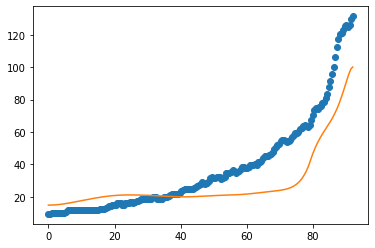

16
after perturb [1.5207798928261198, 141.50141482804491, 26939.38492353839, 1.3669323587487954, 18.385552324535702]
parameters [1.5207798928261198, 141.50141482804491, 26939.38492353839, 1.3669323587487954, 18.385552324535702]
oxigeno [1.61631780e-13 1.63382319e-13 1.68675015e-13 1.77634269e-13
 1.90471361e-13 2.07490419e-13 2.29096975e-13 2.55809256e-13
 2.88272534e-13 3.27276903e-13 3.73778952e-13 4.28927948e-13
 4.94097167e-13 5.70921194e-13 6.61340097e-13 7.67651628e-13
 8.92572854e-13 1.03931307e-12 1.21166036e-12 1.41408481e-12
 1.65186211e-12 1.93122211e-12 2.25952744e-12 2.64548817e-12
 3.09941892e-12 3.63354557e-12 4.26236926e-12 5.00309670e-12
 5.87614749e-12 6.90575177e-12 8.12065522e-12 9.55495352e-12
 1.12490838e-11 1.32510076e-11 1.56176255e-11 1.84164705e-11
 2.17277328e-11 2.56466692e-11 3.02864582e-11 3.57815606e-11
 4.22916504e-11 5.00061895e-11 5.91497307e-11 6.99880548e-11
 8.28352752e-11 9.80620869e-11 1.16105380e-10 1.37479500e-10
 1.62789506e-10 1.92746825e-10 2

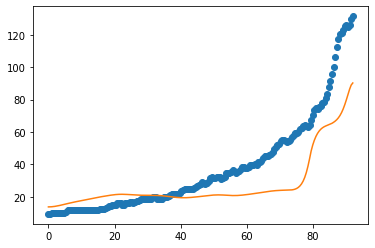

after perturb [4.176572877848741, 85.2790014197112, 14673.012340270961, 1.9764780909092188, 38.855180918902974]
parameters [4.176572877848741, 85.2790014197112, 14673.012340270961, 1.9764780909092188, 38.855180918902974]
after perturb [-3.3804778178387087, 185.694381333048, 26753.030319121768, 1.423729317341217, -4.359870220488897]
parameters [-3.3804778178387087, 185.694381333048, 26753.030319121768, 1.423729317341217, -4.359870220488897]
after perturb [2.632385020563473, 66.85801663342158, 27181.283752533807, -0.36313545686156923, 22.255687668261466]
parameters [2.632385020563473, 66.85801663342158, 27181.283752533807, -0.36313545686156923, 22.255687668261466]
after perturb [1.1152910436764256, 49.3196814884152, 21653.974795973623, 0.17939910161709838, 15.801311196003759]
parameters [1.1152910436764256, 49.3196814884152, 21653.974795973623, 0.17939910161709838, 15.801311196003759]
oxigeno [4.92595697e-05 4.92056491e-05 4.90448051e-05 4.87797157e-05
 4.84146072e-05 4.79549471e-05 4.74

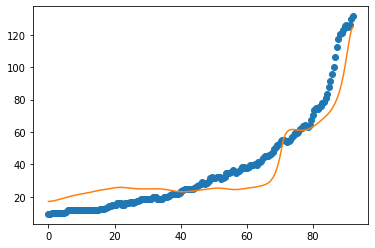

17
after perturb [4.113682952750432, 70.86578604959132, 23302.447667433265, 1.2415137112529417, 39.79593188281972]
parameters [4.113682952750432, 70.86578604959132, 23302.447667433265, 1.2415137112529417, 39.79593188281972]
oxigeno [1.15225997e-18 1.17954815e-18 1.26270704e-18 1.40568529e-18
 1.61528597e-18 1.90151199e-18 2.27807549e-18 2.76309838e-18
 3.38004197e-18 4.15891566e-18 5.13783034e-18 6.36498063e-18
 7.90116412e-18 9.82297519e-18 1.22268488e-17 1.52341769e-17
 1.89977807e-17 2.37100981e-17 2.96135424e-17 3.70136124e-17
 4.62954904e-17 5.79450610e-17 7.25755412e-17 9.09612263e-17
 1.14080269e-16 1.43168919e-16 1.79790315e-16 2.25921731e-16
 2.84065249e-16 3.57388155e-16 4.49901010e-16 5.66683502e-16
 7.14170842e-16 9.00516834e-16 1.13605402e-15 1.43387662e-15
 1.81057874e-15 2.28718874e-15 2.89035135e-15 3.65382227e-15
 4.62035697e-15 5.84409623e-15 7.39357729e-15 9.35553264e-15
 1.18396799e-14 1.49847583e-14 1.89661325e-14 2.40053662e-14
 3.03822716e-14 3.84500683e-14 4.865

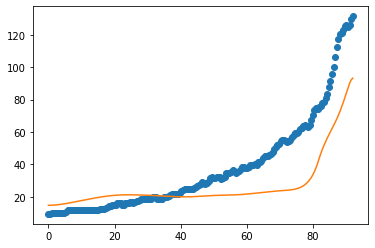

after perturb [5.24324543894344, 129.8129638470275, 23556.112971347986, 1.6080185985656992, 35.92327279033644]
parameters [5.24324543894344, 129.8129638470275, 23556.112971347986, 1.6080185985656992, 35.92327279033644]
oxigeno [3.10642325e-15 3.15164721e-15 3.28865269e-15 3.52148429e-15
 3.85703028e-15 4.30524909e-15 4.87949737e-15 5.59697117e-15
 6.47927597e-15 7.55314554e-15 8.85133515e-15 1.04137209e-14
 1.22886444e-14 1.45345509e-14 1.72219793e-14 2.04359766e-14
 2.42790233e-14 2.88745755e-14 3.43713541e-14 4.09485358e-14
 4.88220358e-14 5.82521139e-14 6.95525810e-14 8.31019447e-14
 9.93569032e-14 1.18868683e-13 1.42302818e-13 1.70463099e-13
 2.04320563e-13 2.45048579e-13 2.94065317e-13 3.53085122e-13
 4.24180659e-13 5.09858053e-13 6.13147716e-13 7.37714093e-13
 8.87988204e-13 1.06932766e-12 1.28820978e-12 1.55246444e-12
 1.87155495e-12 2.25691640e-12 2.72236332e-12 3.28458051e-12
 3.96371381e-12 4.78408097e-12 5.77502658e-12 6.97195006e-12
 8.41754136e-12 1.01632657e-11 1.22711471

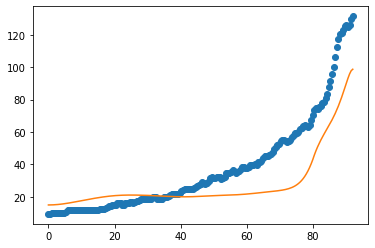

18
after perturb [3.260900431336925, 113.98966206367582, 17923.2249599844, 0.1940682308047057, -13.748091949374302]
parameters [3.260900431336925, 113.98966206367582, 17923.2249599844, 0.1940682308047057, -13.748091949374302]
after perturb [11.255680382241716, 42.07616469281134, 19485.49349672061, 0.2578804528297488, 40.48372212243125]
parameters [11.255680382241716, 42.07616469281134, 19485.49349672061, 0.2578804528297488, 40.48372212243125]
after perturb [6.394872960843582, 164.2953192134802, 23442.23277759437, 1.076904172019397, -12.7185689010172]
parameters [6.394872960843582, 164.2953192134802, 23442.23277759437, 1.076904172019397, -12.7185689010172]
after perturb [0.0485031345392386, 85.57977816455345, 26494.829991487408, -0.2213974961514693, -11.293994048841114]
parameters [0.0485031345392386, 85.57977816455345, 26494.829991487408, -0.2213974961514693, -11.293994048841114]
after perturb [-1.4772068531777778, 25.90805100416805, 23256.483994009526, 0.5106739595469205, 39.848758114

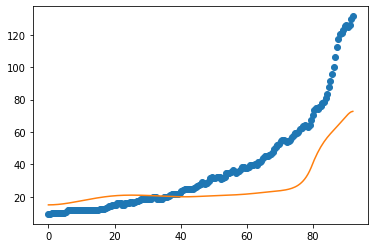

after perturb [0.9714584364665484, 99.31167367159138, 21531.23310128821, 1.7531050095538137, 25.187014253174794]
parameters [0.9714584364665484, 99.31167367159138, 21531.23310128821, 1.7531050095538137, 25.187014253174794]
oxigeno [2.87818460e-18 2.93534420e-18 3.10926417e-18 3.40738922e-18
 3.84253370e-18 4.43350236e-18 5.20598706e-18 6.19377962e-18
 7.44036604e-18 9.00099770e-18 1.09453667e-17 1.33610425e-17
 1.63578523e-17 2.00734092e-17 2.46800136e-17 3.03931899e-17
 3.74821822e-17 4.62828461e-17 5.72135551e-17 7.07950130e-17
 8.76752293e-17 1.08661370e-16 1.34760723e-16 1.67233554e-16
 2.07661157e-16 2.58032868e-16 3.20856273e-16 3.99295358e-16
 4.97342216e-16 6.20029413e-16 7.73692607e-16 9.66296902e-16
 1.20784603e-15 1.51090073e-15 1.89124176e-15 2.36872286e-15
 2.96837003e-15 3.72179377e-15 4.66899189e-15 5.86063034e-15
 7.36090115e-15 9.25107100e-15 1.16338552e-14 1.46387851e-14
 1.84287884e-14 2.32082763e-14 2.92331344e-14 3.68231458e-14
 4.63775297e-14 5.83944584e-14 7.3495

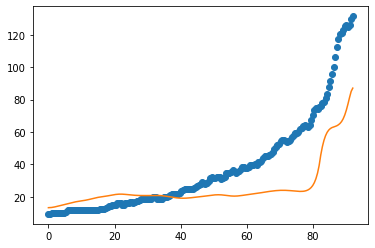

after perturb [-1.6936309451841742, 144.14322745748962, 22246.319334064196, 2.9625545837936267, 42.12661125313236]
parameters [-1.6936309451841742, 144.14322745748962, 22246.319334064196, 2.9625545837936267, 42.12661125313236]
after perturb [-0.5660562824948867, 138.0520876199123, 28660.394147803574, 1.8456490040487756, 21.368137806559588]
parameters [-0.5660562824948867, 138.0520876199123, 28660.394147803574, 1.8456490040487756, 21.368137806559588]
after perturb [12.553662720858306, 147.2326332615237, 15979.913733362653, 0.8876000401766341, -11.36128140136871]
parameters [12.553662720858306, 147.2326332615237, 15979.913733362653, 0.8876000401766341, -11.36128140136871]
after perturb [3.522714841192887, 119.77705817302957, 23521.132955645535, 2.25007258027585, 32.3983197317988]
parameters [3.522714841192887, 119.77705817302957, 23521.132955645535, 2.25007258027585, 32.3983197317988]
oxigeno [1.39193120e-18 1.42109041e-18 1.50980927e-18 1.66187017e-18
 1.88377566e-18 2.18505677e-18 2.57

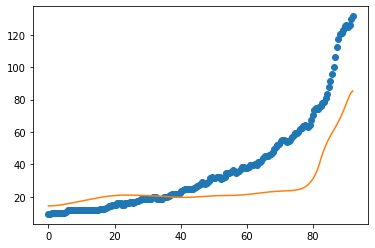

after perturb [-1.6634459511783375, 108.40262173754583, 27094.94121355381, 1.2017096436338144, 50.01119708215681]
parameters [-1.6634459511783375, 108.40262173754583, 27094.94121355381, 1.2017096436338144, 50.01119708215681]
after perturb [5.375852901940766, 124.90119520188927, 21200.197783769698, 1.3949495122157192, 25.568439208417793]
parameters [5.375852901940766, 124.90119520188927, 21200.197783769698, 1.3949495122157192, 25.568439208417793]
oxigeno [1.45988166e-14 1.47962091e-14 1.53937879e-14 1.64079212e-14
 1.78664438e-14 1.98095063e-14 2.22908040e-14 2.53792232e-14
 2.91609602e-14 3.37421817e-14 3.92523132e-14 4.58480647e-14
 5.37183253e-14 6.30900886e-14 7.42356064e-14 8.74810061e-14
 1.03216662e-13 1.21909667e-13 1.44118816e-13 1.70512620e-13
 2.01890937e-13 2.39210962e-13 2.83618456e-13 3.36485246e-13
 3.99454291e-13 4.74493800e-13 5.63962257e-13 6.70686501e-13
 7.98055501e-13 9.50132953e-13 1.13179243e-12 1.34887956e-12
 1.60840663e-12 1.91878593e-12 2.29010947e-12 2.734484

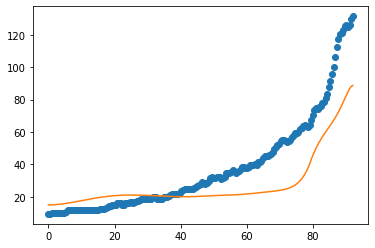

after perturb [6.588492508180108, 8.190469886702445, 30351.05550162768, -0.12519857720974925, 72.31072418462537]
parameters [6.588492508180108, 8.190469886702445, 30351.05550162768, -0.12519857720974925, 72.31072418462537]
after perturb [5.201639495079106, 102.25853520992771, 21907.868469013, 0.5873897252903408, -13.021898926257943]
parameters [5.201639495079106, 102.25853520992771, 21907.868469013, 0.5873897252903408, -13.021898926257943]
after perturb [1.5032531186435636, 117.94742433597902, 23493.545904723178, 2.510661231486698, 24.34064675669455]
parameters [1.5032531186435636, 117.94742433597902, 23493.545904723178, 2.510661231486698, 24.34064675669455]
oxigeno [9.93872972e-20 1.01627791e-19 1.08454483e-19 1.20188804e-19
 1.37386109e-19 1.60866163e-19 1.91758001e-19 2.31561566e-19
 2.82229499e-19 3.46273698e-19 4.26902695e-19 5.28197672e-19
 6.55337091e-19 8.14882552e-19 1.01514184e-18 1.26662945e-18
 1.58265063e-18 1.98004251e-18 2.48011622e-18 3.10985737e-18
 3.90345991e-18 4.90

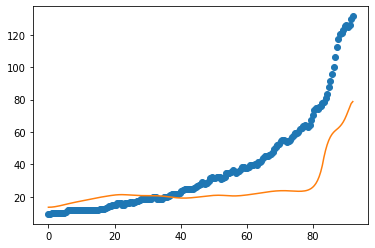

after perturb [-5.334050792302592, 189.91155842897442, 28560.530816841663, 2.5685327200675214, 0.002463246588249035]
parameters [-5.334050792302592, 189.91155842897442, 28560.530816841663, 2.5685327200675214, 0.002463246588249035]
after perturb [4.963129604510563, 54.41316601112206, 24930.71159009371, 1.6586257835630265, 57.66827909030633]
parameters [4.963129604510563, 54.41316601112206, 24930.71159009371, 1.6586257835630265, 57.66827909030633]
after perturb [0.9533017143503102, 117.81256547738738, 18649.0376568504, 2.9287926856513256, 34.259598296650275]
parameters [0.9533017143503102, 117.81256547738738, 18649.0376568504, 2.9287926856513256, 34.259598296650275]
after perturb [10.130130605570052, 151.68296857221227, 21205.287256801406, 2.271601775825677, 12.263121725312656]
parameters [10.130130605570052, 151.68296857221227, 21205.287256801406, 2.271601775825677, 12.263121725312656]
after perturb [-2.810318356885541, 82.96715938060493, 21700.10313770208, 1.1954428241407058, -2.470442

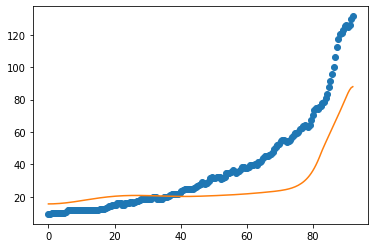

after perturb [2.5428516046576393, 59.62948183605123, 24939.10661284367, 0.8614529776949578, 42.84476432383012]
parameters [2.5428516046576393, 59.62948183605123, 24939.10661284367, 0.8614529776949578, 42.84476432383012]
oxigeno [1.35339441e-16 1.35563609e-16 1.36259859e-16 1.37500204e-16
 1.39407314e-16 1.42158674e-16 1.45992822e-16 1.51218037e-16
 1.58224045e-16 1.67497421e-16 1.79641538e-16 1.95402158e-16
 2.15699972e-16 2.41671764e-16 2.74722266e-16 3.16589270e-16
 3.69425260e-16 4.35899621e-16 5.19326535e-16 6.23825010e-16
 7.54519108e-16 9.17788550e-16 1.12158246e-15 1.37581222e-15
 1.69284361e-15 2.08811323e-15 2.58090090e-15 3.19529725e-15
 3.96141611e-15 4.91691334e-15 6.10888932e-15 7.59627199e-15
 9.45280083e-15 1.17707625e-14 1.46656658e-14 1.82820878e-14
 2.28009825e-14 2.84488063e-14 3.55089051e-14 4.43357062e-14
 5.53723877e-14 6.91728529e-14 8.64290291e-14 1.08004751e-13
 1.34977778e-13 1.68691873e-13 2.10821310e-13 2.63450771e-13
 3.29174278e-13 4.11217706e-13 5.135905

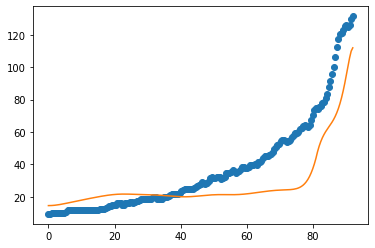

19
after perturb [3.8672336382674692, 82.3963577055923, 21696.012872257008, 1.2353368481747107, 35.333165218594345]
parameters [3.8672336382674692, 82.3963577055923, 21696.012872257008, 1.2353368481747107, 35.333165218594345]
oxigeno [3.56111908e-17 3.63094313e-17 3.84317073e-17 4.20618668e-17
 4.73436595e-17 5.44869322e-17 6.37766923e-17 7.55854515e-17
 9.03894120e-17 1.08789233e-16 1.31536331e-16 1.59565914e-16
 1.94038277e-16 2.36390274e-16 2.88399333e-16 3.52263034e-16
 4.30697938e-16 5.27062347e-16 6.45508772e-16 7.91173350e-16
 9.70411204e-16 1.19108901e-15 1.46294876e-15 1.79806013e-15
 2.21138328e-15 2.72146911e-15 3.35133056e-15 4.12952711e-15
 5.09151440e-15 6.28132375e-15 7.75365218e-15 9.57646242e-15
 1.18342169e-14 1.46318985e-14 1.81000083e-14 2.24007740e-14
 2.77358585e-14 3.43559271e-14 4.25725125e-14 5.27727224e-14
 6.54374580e-14 8.11639689e-14 1.00693760e-13 1.24947099e-13
 1.55065668e-13 1.92465252e-13 2.38900797e-13 2.96546729e-13
 3.68096049e-13 4.56882601e-13 5.6

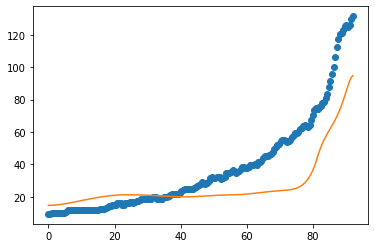

after perturb [-1.882972262821833, 82.04651399733986, 19007.409562302135, 0.3608386524600218, -1.4038496533163123]
parameters [-1.882972262821833, 82.04651399733986, 19007.409562302135, 0.3608386524600218, -1.4038496533163123]
after perturb [-3.14553137067455, 46.19067790053649, 29666.440704646473, 0.8888853279363037, 29.227039838300083]
parameters [-3.14553137067455, 46.19067790053649, 29666.440704646473, 0.8888853279363037, 29.227039838300083]
after perturb [1.5611233069759556, 178.74172765852563, 21033.470268782472, 3.7334651283320746, 42.4449871216961]
parameters [1.5611233069759556, 178.74172765852563, 21033.470268782472, 3.7334651283320746, 42.4449871216961]
after perturb [1.3262698062261684, 113.26517363042036, 26679.25836174635, 1.2892235679218729, 35.29476100935852]
parameters [1.3262698062261684, 113.26517363042036, 26679.25836174635, 1.2892235679218729, 35.29476100935852]
oxigeno [9.01316292e-15 9.13280964e-15 9.49515896e-15 1.01105541e-14
 1.09966216e-14 1.21788623e-14 1.36

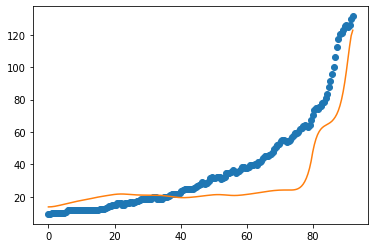

20
parameters [5.7831715935622015, 68.56137612581551, 21174.81482370249, 0.9550852237314577, 44.37829609803517]
parameters [7.756320542556278, 83.41688086218413, 24165.066017990335, 0.0811273741965732, 8.727226843420675]
parameters [3.626652132638374, 91.36090230769601, 22254.779859330665, 0.3062092799005788, 6.576414571466762]
parameters [0.5398536901737064, 120.44553555746643, 25772.019188026414, 0.9360399564222714, 18.965357215085966]
parameters [4.162488207762346, 129.55637120924047, 21417.60805938042, 0.8919567079574798, 29.070180379754195]
parameters [5.919091553820781, 116.11586274031026, 22593.033176214227, 1.0949295516060011, 28.891419140912465]
parameters [2.5419016821962113, 65.78380522214042, 23450.292651607597, 0.8672154386506266, 36.549427796904126]
parameters [6.267796861198809, 141.97205632206519, 28534.407003013686, 1.2078015142333958, 25.80137024454765]
parameters [4.982345741135337, 138.0480792617385, 20971.513728290087, 1.6011199099776974, 30.68618744103656]
paramet

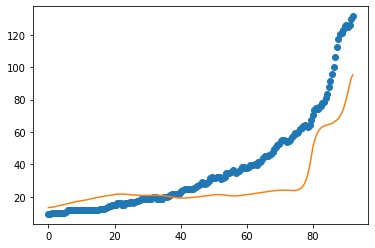

after perturb [6.8088430082500375, 209.7377665204418, 22197.472477028565, 1.872752433117895, 26.94127321441853]
parameters [6.8088430082500375, 209.7377665204418, 22197.472477028565, 1.872752433117895, 26.94127321441853]
after perturb [0.95578391823181, 123.54056429051138, 29850.447727859726, 0.489065965112461, 10.853600203500232]
parameters [0.95578391823181, 123.54056429051138, 29850.447727859726, 0.489065965112461, 10.853600203500232]
after perturb [4.7426863584955825, 47.55140818211329, 33312.02314979031, -0.21721266073761392, 15.826243227881218]
parameters [4.7426863584955825, 47.55140818211329, 33312.02314979031, -0.21721266073761392, 15.826243227881218]
after perturb [7.575504802297167, 63.15249793965644, 21921.50642916367, -0.250408792317139, 21.83569282969811]
parameters [7.575504802297167, 63.15249793965644, 21921.50642916367, -0.250408792317139, 21.83569282969811]
after perturb [3.514132953299338, 100.22471817251024, 23882.812832337473, 0.5772548063855383, 45.2609668726529]


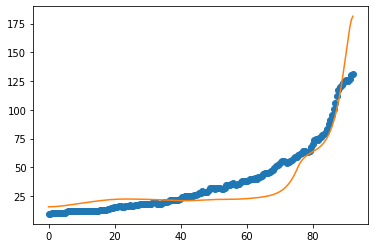

1
after perturb [0.8032107719917833, 101.39490103293868, 26934.389448520156, 2.1336831245221255, 63.942880315543846]
parameters [0.8032107719917833, 101.39490103293868, 26934.389448520156, 2.1336831245221255, 63.942880315543846]
after perturb [3.0282619943197244, 124.58364286093256, 18496.36646979429, 1.301530654631735, 34.40371765445943]
parameters [3.0282619943197244, 124.58364286093256, 18496.36646979429, 1.301530654631735, 34.40371765445943]
after perturb [1.0221227740656316, 153.54560198269834, 28599.424876172347, 2.4857248277761688, 43.29542929195916]
parameters [1.0221227740656316, 153.54560198269834, 28599.424876172347, 2.4857248277761688, 43.29542929195916]
after perturb [2.9340450891284213, 78.68600594862687, 20188.139155788976, 1.335138652041696, 31.855004765146134]
parameters [2.9340450891284213, 78.68600594862687, 20188.139155788976, 1.335138652041696, 31.855004765146134]
oxigeno [3.06512148e-18 3.13211831e-18 3.33606680e-18 3.68598454e-18
 4.19738684e-18 4.89304140e-18 5.

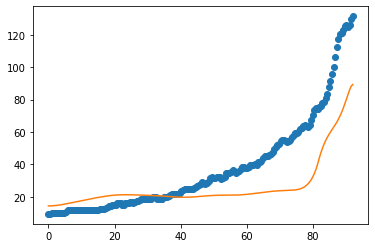

after perturb [12.614990899418775, 144.75448397185977, 20345.16820650368, 0.8858323996833712, 38.41154192131833]
parameters [12.614990899418775, 144.75448397185977, 20345.16820650368, 0.8858323996833712, 38.41154192131833]
after perturb [1.6849082775320352, -9.97235885552007, 19498.678667522956, -0.07100887401618516, 37.61391236751468]
parameters [1.6849082775320352, -9.97235885552007, 19498.678667522956, -0.07100887401618516, 37.61391236751468]
after perturb [9.06839250314126, 185.43790825495756, 21674.143925575387, 1.7229521496154516, 22.805874249274858]
parameters [9.06839250314126, 185.43790825495756, 21674.143925575387, 1.7229521496154516, 22.805874249274858]
after perturb [7.6325715591634475, 181.27170718432964, 22171.437546075536, 1.0425675018055987, 22.324380441787657]
parameters [7.6325715591634475, 181.27170718432964, 22171.437546075536, 1.0425675018055987, 22.324380441787657]
after perturb [3.2003188782714793, 88.33356719666742, 31294.567563405446, 1.4063031739301968, 53.462

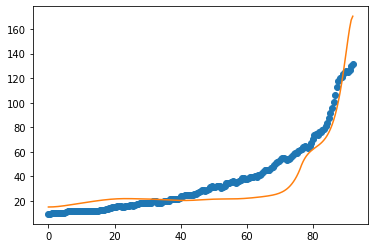

2
after perturb [6.1463684227062325, 90.28677884086827, 22968.995867407048, 0.016988574805380074, 25.764260140089245]
parameters [6.1463684227062325, 90.28677884086827, 22968.995867407048, 0.016988574805380074, 25.764260140089245]
oxigeno [ 2.77401288  2.77368759  2.77271335  2.771095    2.76884058  2.7659612
  2.76247102  2.75838701  2.75372891  2.74851896  2.74278178  2.73654415
  2.72983479  2.72268415  2.71512422  2.7071883   2.6989108   2.69032704
  2.68147308  2.6723855   2.66310128  2.65365764  2.64409187  2.63444122
  2.62474279  2.61503341  2.60534955  2.59572722  2.58620192  2.57680854
  2.56758129  2.55855369  2.54975847  2.54122756  2.53299201  2.52508202
  2.51752686  2.51035489  2.50359355  2.49726933  2.49140782  2.4860337
  2.48117078  2.47684204  2.47306968  2.46987514  2.46727922  2.4653021
  2.46396345  2.4632825   2.46327811  2.46396887  2.46537318  2.46750935
  2.47039565  2.4740504   2.47849208  2.48373932  2.489811    2.49672631
  2.50450475  2.51316619  2.522730

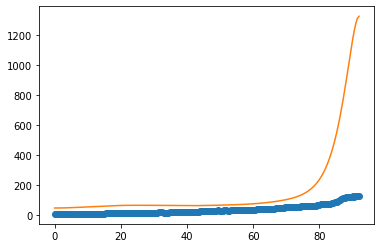

after perturb [7.078898026742412, 107.21247551669028, 28516.77450553948, -0.6995801435463763, -22.656337172123678]
parameters [7.078898026742412, 107.21247551669028, 28516.77450553948, -0.6995801435463763, -22.656337172123678]
after perturb [8.396910235543906, 32.51712532836348, 21182.528375283036, -0.15535312034933757, 31.768952913569418]
parameters [8.396910235543906, 32.51712532836348, 21182.528375283036, -0.15535312034933757, 31.768952913569418]
after perturb [-0.3486409014401781, 58.852595327474035, 20046.512395170896, 0.7353899079268915, 33.55392107481058]
parameters [-0.3486409014401781, 58.852595327474035, 20046.512395170896, 0.7353899079268915, 33.55392107481058]
after perturb [1.1773526995758394, 51.6335002303277, 17980.772201837415, -0.05304153967237851, 7.9455423298058]
parameters [1.1773526995758394, 51.6335002303277, 17980.772201837415, -0.05304153967237851, 7.9455423298058]
after perturb [11.7145134453311, 169.3667579022782, 28911.621307078298, 1.5402344184814933, 15.480

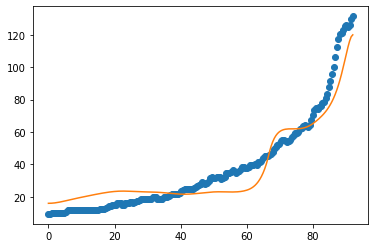

3
after perturb [5.057276168825406, 140.0114337276348, 24663.506861609094, 1.8901835721641158, 45.8437568685345]
parameters [5.057276168825406, 140.0114337276348, 24663.506861609094, 1.8901835721641158, 45.8437568685345]
oxigeno [8.46466264e-16 8.59422696e-16 8.98694517e-16 9.65503238e-16
 1.06193170e-15 1.19099641e-15 1.35675251e-15 1.56443533e-15
 1.82064390e-15 2.13357303e-15 2.51330305e-15 2.97215775e-15
 3.52514436e-15 4.19049212e-15 4.99030991e-15 5.95138837e-15
 7.10617694e-15 8.49397380e-15 1.01623746e-14 1.21690364e-14
 1.45838249e-14 1.74914295e-14 2.09945484e-14 2.52177674e-14
 3.03122855e-14 3.64616727e-14 4.38888839e-14 5.28648063e-14
 6.37186713e-14 7.68507398e-14 9.27477530e-14 1.12001748e-13
 1.35332968e-13 1.63617742e-13 1.97922413e-13 2.39544604e-13
 2.90063379e-13 3.51400218e-13 4.25893074e-13 5.16386297e-13
 6.26339775e-13 7.59961329e-13 9.22367259e-13 1.11977695e-12
 1.35974864e-12 1.65146502e-12 2.00607899e-12 2.43713218e-12
 2.96106134e-12 3.59781093e-12 4.371573

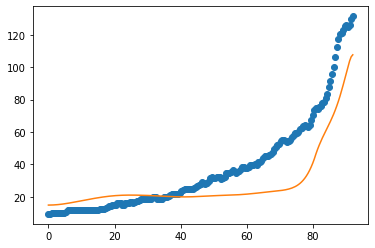

after perturb [9.580961716209083, 176.08646933767992, 18937.244226796123, 0.9793801470948917, 19.085632557603233]
parameters [9.580961716209083, 176.08646933767992, 18937.244226796123, 0.9793801470948917, 19.085632557603233]
after perturb [1.0106455634477411, 130.4431609907154, 23574.223682028492, 1.0309960489875118, 12.984135179306243]
parameters [1.0106455634477411, 130.4431609907154, 23574.223682028492, 1.0309960489875118, 12.984135179306243]
oxigeno [2.05928667e-12 2.07834846e-12 2.13594082e-12 2.23329284e-12
 2.37248028e-12 2.55646728e-12 2.78916689e-12 3.07552333e-12
 3.42162017e-12 3.83481976e-12 4.32393970e-12 4.89947111e-12
 5.57384215e-12 6.36172766e-12 7.28040452e-12 8.35015224e-12
 9.59470109e-12 1.10417365e-11 1.27234780e-11 1.46773620e-11
 1.69468708e-11 1.95825574e-11 2.26433199e-11 2.61979771e-11
 3.03271800e-11 3.51256827e-11 4.07049706e-11 4.71962390e-11
 5.47537164e-11 6.35583561e-11 7.38219740e-11 8.57919873e-11
 9.97569922e-11 1.16053503e-10 1.35074226e-10 1.572782

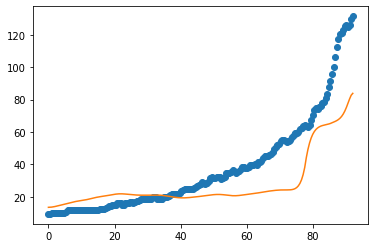

after perturb [1.7311709848641574, 152.35758290054906, 23311.319407347146, 1.3610732848398175, 34.76614839751364]
parameters [1.7311709848641574, 152.35758290054906, 23311.319407347146, 1.3610732848398175, 34.76614839751364]
after perturb [3.0646667969548282, 102.36571595128586, 26497.68787835256, 0.10154426728507271, 5.27689558281104]
parameters [3.0646667969548282, 102.36571595128586, 26497.68787835256, 0.10154426728507271, 5.27689558281104]
oxigeno [1.10793612e-03 1.10760444e-03 1.10661262e-03 1.10497023e-03
 1.10269306e-03 1.09980281e-03 1.09632673e-03 1.09229721e-03
 1.08775126e-03 1.08272999e-03 1.07727811e-03 1.07144336e-03
 1.06527607e-03 1.05882866e-03 1.05215532e-03 1.04531162e-03
 1.03835430e-03 1.03134106e-03 1.02433045e-03 1.01738181e-03
 1.01055528e-03 1.00391184e-03 9.97513366e-04 9.91422763e-04
 9.85704093e-04 9.80422715e-04 9.75645434e-04 9.71440671e-04
 9.67878621e-04 9.65031424e-04 9.62973343e-04 9.61780936e-04
 9.61533251e-04 9.62312010e-04 9.64201818e-04 9.67290373

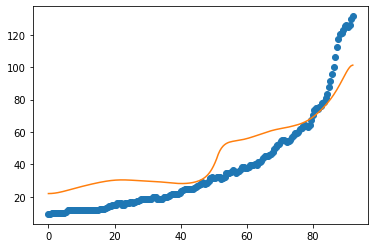

4
after perturb [8.473948260878382, 76.3300908318636, 18931.90712051546, 1.3383441729774672, 51.10474243835683]
parameters [8.473948260878382, 76.3300908318636, 18931.90712051546, 1.3383441729774672, 51.10474243835683]
after perturb [9.245538891894306, 263.38789045130454, 19251.528313161725, 2.7878315739051627, 32.332868800688814]
parameters [9.245538891894306, 263.38789045130454, 19251.528313161725, 2.7878315739051627, 32.332868800688814]
after perturb [4.94644512000543, 82.999091115863, 21686.555622426113, 0.17017282160642672, 6.72240715287842]
parameters [4.94644512000543, 82.999091115863, 21686.555622426113, 0.17017282160642672, 6.72240715287842]
oxigeno [4.28949340e-05 4.28728307e-05 4.28066759e-05 4.26969334e-05
 4.25443689e-05 4.23500404e-05 4.21152846e-05 4.18417000e-05
 4.15311280e-05 4.11856318e-05 4.08074739e-05 4.03990936e-05
 3.99630837e-05 3.95021684e-05 3.90191826e-05 3.85170517e-05
 3.79987746e-05 3.74674085e-05 3.69260557e-05 3.63778536e-05
 3.58259669e-05 3.52735826e-

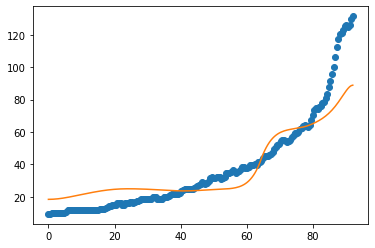

5
after perturb [9.132681841669228, 60.45525677169401, 17444.34216732106, 0.7064437622028705, 49.150155081220205]
parameters [9.132681841669228, 60.45525677169401, 17444.34216732106, 0.7064437622028705, 49.150155081220205]
after perturb [-5.893687337130414, -14.792737504906725, 19534.18546196423, 0.5022092088924447, 30.90881431169091]
parameters [-5.893687337130414, -14.792737504906725, 19534.18546196423, 0.5022092088924447, 30.90881431169091]
after perturb [5.322909794240038, 121.94520353157309, 32083.775410928632, 1.0660194142267598, 21.000034570669172]
parameters [5.322909794240038, 121.94520353157309, 32083.775410928632, 1.0660194142267598, 21.000034570669172]
after perturb [3.2642853737220094, 40.53709808430163, 16014.07934934623, 0.9590634670743993, 76.61713365144244]
parameters [3.2642853737220094, 40.53709808430163, 16014.07934934623, 0.9590634670743993, 76.61713365144244]
after perturb [0.28188272257204616, 98.95959401824375, 29837.655329280373, 0.6778255154790118, 12.37094612

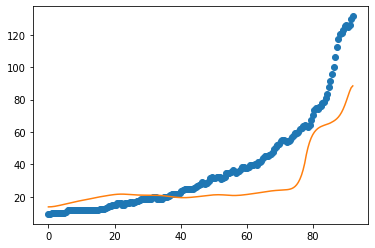

after perturb [6.225275835892091, 76.17791731765402, 32400.423697430524, -0.6733168415322183, -14.17415945298261]
parameters [6.225275835892091, 76.17791731765402, 32400.423697430524, -0.6733168415322183, -14.17415945298261]
after perturb [10.453499610158204, 185.9714248222226, 16329.745025799994, 2.0194439414032264, 38.37718363958231]
parameters [10.453499610158204, 185.9714248222226, 16329.745025799994, 2.0194439414032264, 38.37718363958231]
after perturb [2.126332274863369, 76.22774409714303, 21361.296762318936, 0.5891420577362588, 40.89957777981304]
parameters [2.126332274863369, 76.22774409714303, 21361.296762318936, 0.5891420577362588, 40.89957777981304]
oxigeno [4.22179955e-12 4.22616325e-12 4.23954835e-12 4.26284027e-12
 4.29752663e-12 4.34571622e-12 4.41016800e-12 4.49433224e-12
 4.60240646e-12 4.73940900e-12 4.91127387e-12 5.12497021e-12
 5.38865062e-12 5.71183310e-12 6.10562175e-12 6.58297276e-12
 7.15901298e-12 7.85142024e-12 8.68087609e-12 9.67160372e-12
 1.08520067e-11 1.

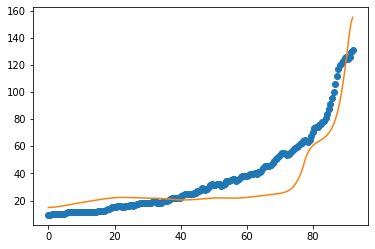

6
after perturb [4.455932293004559, 118.00735348373598, 23012.825519551592, 1.0811671254262134, 29.672643276293574]
parameters [4.455932293004559, 118.00735348373598, 23012.825519551592, 1.0811671254262134, 29.672643276293574]
oxigeno [2.48523309e-13 2.51383502e-13 2.60031001e-13 2.74668358e-13
 2.95639155e-13 3.23437187e-13 3.58719650e-13 4.02324721e-13
 4.55293993e-13 5.18900406e-13 5.94682432e-13 6.84485476e-13
 7.90511647e-13 9.15379306e-13 1.06219407e-12 1.23463328e-12
 1.43704639e-12 1.67457404e-12 1.95328937e-12 2.28036557e-12
 2.66427444e-12 3.11502189e-12 3.64442688e-12 4.26645216e-12
 4.99759610e-12 5.85735708e-12 6.86878346e-12 8.05912521e-12
 9.46060532e-12 1.11113330e-11 1.30563845e-11 1.53490806e-11
 1.80524983e-11 2.12412556e-11 2.50036200e-11 2.94439964e-11
 3.46858625e-11 4.08752284e-11 4.81847123e-11 5.68183403e-11
 6.70171935e-11 7.90660515e-11 9.33012018e-11 1.10119618e-10
 1.29989745e-10 1.53464156e-10 1.81194433e-10 2.13948614e-10
 2.52631689e-10 2.98309650e-10 3.

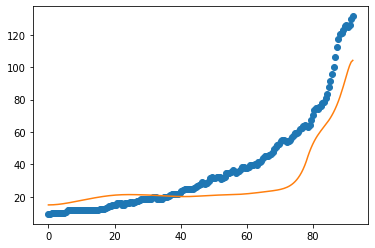

after perturb [7.904655417800612, 24.72138372745403, 18468.21650086206, 0.1370982199386364, 37.649781146723896]
parameters [7.904655417800612, 24.72138372745403, 18468.21650086206, 0.1370982199386364, 37.649781146723896]
after perturb [2.9618065445337685, 100.73663231289109, 16969.66756306639, 1.856008522702337, 52.583204269267654]
parameters [2.9618065445337685, 100.73663231289109, 16969.66756306639, 1.856008522702337, 52.583204269267654]
after perturb [4.715055683338452, -8.92848813219507, 20193.193192941984, 0.6515233056900562, 45.63040192576182]
parameters [4.715055683338452, -8.92848813219507, 20193.193192941984, 0.6515233056900562, 45.63040192576182]
after perturb [-0.2593813235266902, 90.3613393306086, 25325.61736606584, 0.9815485613458361, 35.53824266384586]
parameters [-0.2593813235266902, 90.3613393306086, 25325.61736606584, 0.9815485613458361, 35.53824266384586]
after perturb [4.843635090391944, 106.80125582762423, 21879.55802770122, 0.856105635186474, 32.781914547298804]
pa

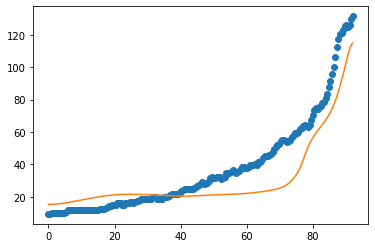

7
after perturb [6.095587546332945, 83.77556342745137, 25554.43016290816, 1.0957405380008542, 45.20958866137418]
parameters [6.095587546332945, 83.77556342745137, 25554.43016290816, 1.0957405380008542, 45.20958866137418]
oxigeno [4.05062228e-16 4.12250145e-16 4.34068870e-16 4.71292973e-16
 5.25245978e-16 5.97850602e-16 6.91701904e-16 8.10166325e-16
 9.57510595e-16 1.13906578e-15 1.36143315e-15 1.63274015e-15
 1.96295719e-15 2.36428794e-15 2.85164938e-15 3.44326133e-15
 4.16136974e-15 5.03313388e-15 6.09171391e-15 7.37760447e-15
 8.94026937e-15 1.08401459e-14 1.31511024e-14 1.59634511e-14
 1.93876431e-14 2.35587989e-14 2.86422641e-14 3.48404217e-14
 4.24010440e-14 5.16275327e-14 6.28914694e-14 7.66479974e-14
 9.34546678e-14 1.13994524e-13 1.39104369e-13 1.69809371e-13
 2.07365404e-13 2.53310850e-13 3.09529932e-13 3.78330124e-13
 4.62536728e-13 5.65608371e-13 6.91777988e-13 8.46224844e-13
 1.03528434e-12 1.26670376e-12 1.54995397e-12 1.89660906e-12
 2.32080853e-12 2.83981988e-12 3.474722

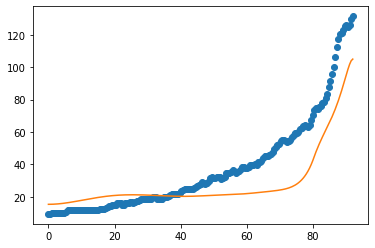

after perturb [1.093309529331778, 151.49555410370576, 23855.363733307888, 0.5188409061425997, 12.497008244782014]
parameters [1.093309529331778, 151.49555410370576, 23855.363733307888, 0.5188409061425997, 12.497008244782014]
after perturb [1.5650252453498719, 16.00199996961628, 23286.338050058697, -0.44458476020373183, 10.018103465307451]
parameters [1.5650252453498719, 16.00199996961628, 23286.338050058697, -0.44458476020373183, 10.018103465307451]
after perturb [9.451970827565642, 202.61621373550994, 28154.720716469208, 1.7944153855788816, 29.561560540549515]
parameters [9.451970827565642, 202.61621373550994, 28154.720716469208, 1.7944153855788816, 29.561560540549515]
after perturb [5.293759998147991, 159.2015519710512, 22018.80763982087, 1.9951401758660676, 43.515581163745054]
parameters [5.293759998147991, 159.2015519710512, 22018.80763982087, 1.9951401758660676, 43.515581163745054]
after perturb [4.353246725464109, 147.93313205427307, 29395.56243972046, 0.9144548112610199, 14.0898

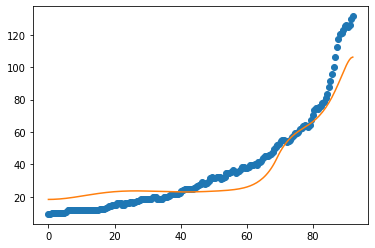

8
after perturb [10.832438997725589, 133.35515130875106, 21885.104723460227, 0.6511661464762046, -1.2283553593461356]
parameters [10.832438997725589, 133.35515130875106, 21885.104723460227, 0.6511661464762046, -1.2283553593461356]
after perturb [2.637422082409208, 49.49880404344542, 25661.437237788985, 1.353518981003158, 52.340756073255726]
parameters [2.637422082409208, 49.49880404344542, 25661.437237788985, 1.353518981003158, 52.340756073255726]
after perturb [7.263157131361558, 129.9198174645092, 27179.369696676735, 0.5052467811774224, 16.589063631814632]
parameters [7.263157131361558, 129.9198174645092, 27179.369696676735, 0.5052467811774224, 16.589063631814632]
oxigeno [6.03239719e-09 6.06600696e-09 6.16721675e-09 6.33717305e-09
 6.57780348e-09 6.89184221e-09 7.28286606e-09 7.75534163e-09
 8.31468410e-09 8.96732857e-09 9.72081460e-09 1.05838853e-08
 1.15666022e-08 1.26804769e-08 1.39386223e-08 1.53559237e-08
 1.69492343e-08 1.87375945e-08 2.07424811e-08 2.29880873e-08
 2.55016378e

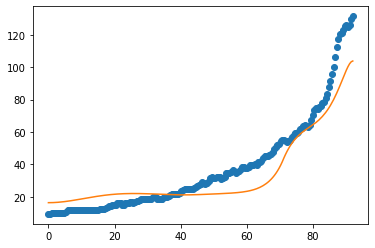

9
after perturb [9.552966609822468, 129.14215827203267, 19922.507558081605, 0.1594999558322142, 9.789462149702274]
parameters [9.552966609822468, 129.14215827203267, 19922.507558081605, 0.1594999558322142, 9.789462149702274]
after perturb [6.973788208388962, 133.26614346502532, 18962.761285318273, 1.7911480836421863, 47.56829934205936]
parameters [6.973788208388962, 133.26614346502532, 18962.761285318273, 1.7911480836421863, 47.56829934205936]
after perturb [7.708618799307714, 175.8695232821425, 28320.455468556513, 1.3126491591087546, 35.706318208295755]
parameters [7.708618799307714, 175.8695232821425, 28320.455468556513, 1.3126491591087546, 35.706318208295755]
after perturb [8.305094213874153, 135.76622145569002, 26633.78115304972, 1.1963918986635416, 26.21035551553422]
parameters [8.305094213874153, 135.76622145569002, 26633.78115304972, 1.1963918986635416, 26.21035551553422]
oxigeno [5.59458620e-13 5.65628392e-13 5.84274625e-13 6.15811398e-13
 6.60940065e-13 7.20666388e-13 7.963251

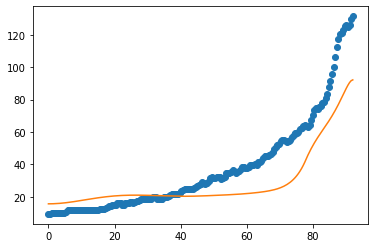

after perturb [-0.6781456530408754, 97.753993591936, 30941.75267007864, 0.278773468168916, 8.2906198117138]
parameters [-0.6781456530408754, 97.753993591936, 30941.75267007864, 0.278773468168916, 8.2906198117138]
after perturb [8.489681814890641, 159.2118333159039, 23856.66197865207, 0.18074096597096123, -4.650414743950272]
parameters [8.489681814890641, 159.2118333159039, 23856.66197865207, 0.18074096597096123, -4.650414743950272]
after perturb [3.419967487353348, -21.20656699845167, 25288.47550456364, 0.09153281868428709, 71.40211458036863]
parameters [3.419967487353348, -21.20656699845167, 25288.47550456364, 0.09153281868428709, 71.40211458036863]
after perturb [1.2548238837215122, 25.10019415022458, 27788.17527621844, -0.1333337748376291, 27.551470616275815]
parameters [1.2548238837215122, 25.10019415022458, 27788.17527621844, -0.1333337748376291, 27.551470616275815]
after perturb [0.8921846284037649, 88.75087272191196, 25169.329261442737, 1.1634146841770212, 49.02163556968118]
par

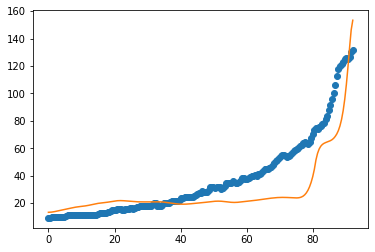

after perturb [4.64863479869228, 101.99463692710358, 18360.294621058543, 0.6110070647333657, 27.785258227662855]
parameters [4.64863479869228, 101.99463692710358, 18360.294621058543, 0.6110070647333657, 27.785258227662855]
after perturb [7.428205077291719, 133.14725903179976, 26694.697821348942, 0.32351302222402023, 14.521675154861628]
parameters [7.428205077291719, 133.14725903179976, 26694.697821348942, 0.32351302222402023, 14.521675154861628]
oxigeno [3.88528669e-07 3.89751054e-07 3.93427962e-07 3.99588738e-07
 4.08282584e-07 4.19578991e-07 4.33568364e-07 4.50362818e-07
 4.70097178e-07 4.92930172e-07 5.19045831e-07 5.48655115e-07
 5.81997768e-07 6.19344424e-07 6.60998975e-07 7.07301229e-07
 7.58629868e-07 8.15405742e-07 8.78095509e-07 9.47215674e-07
 1.02333703e-06 1.10708957e-06 1.19916785e-06 1.30033694e-06
 1.41143890e-06 1.53339989e-06 1.66723796e-06 1.81407159e-06
 1.97512899e-06 2.15175825e-06 2.34543845e-06 2.55779172e-06
 2.79059644e-06 3.04580156e-06 3.32554219e-06 3.632156

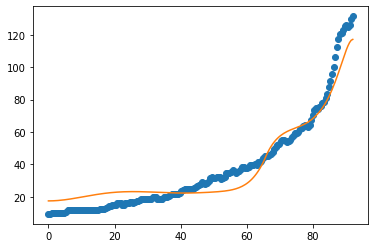

10
after perturb [5.27139380209686, 77.07024595686104, 25403.88923140247, 1.242638480882325, 46.23532542867882]
parameters [5.27139380209686, 77.07024595686104, 25403.88923140247, 1.242638480882325, 46.23532542867882]
oxigeno [7.56204993e-18 7.72566300e-18 8.22358048e-18 9.07736235e-18
 1.03240420e-17 1.20178325e-17 1.42326316e-17 1.70654478e-17
 2.06409157e-17 2.51171234e-17 3.06930397e-17 3.76179086e-17
 4.62030773e-17 5.68368495e-17 7.00031035e-17 8.63046129e-17
 1.06492242e-16 1.31501491e-16 1.62498244e-16 2.00936045e-16
 2.48627818e-16 3.07835694e-16 3.81383552e-16 4.72798023e-16
 5.86485213e-16 7.27952210e-16 9.04084766e-16 1.12349540e-15
 1.39695984e-15 1.73796408e-15 2.16339028e-15 2.69437627e-15
 3.35739273e-15 4.18559277e-15 5.22050210e-15 6.51413550e-15
 8.13164580e-15 1.01546382e-14 1.26853156e-14 1.58516602e-14
 1.98139090e-14 2.47726410e-14 3.09788730e-14 3.87466583e-14
 4.84687995e-14 6.06364372e-14 7.58634598e-14 9.49169075e-14
 1.18754825e-13 1.48573372e-13 1.85865419e

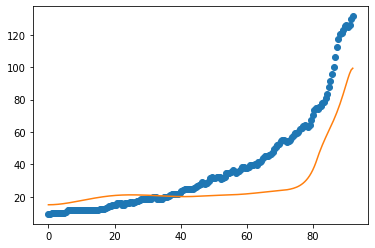

after perturb [11.530320010500377, 173.7333952090253, 27024.080093162953, 1.1626847590733524, 18.88260836627994]
parameters [11.530320010500377, 173.7333952090253, 27024.080093162953, 1.1626847590733524, 18.88260836627994]
after perturb [1.7077642904259431, 28.513625575825106, 26876.35107207523, 0.1713907495330932, 33.21824977195863]
parameters [1.7077642904259431, 28.513625575825106, 26876.35107207523, 0.1713907495330932, 33.21824977195863]
oxigeno [9.95982286e-05 9.94548964e-05 9.90271586e-05 9.83216827e-05
 9.73492279e-05 9.61241564e-05 9.46638219e-05 9.29878913e-05
 9.11176549e-05 8.90753668e-05 8.68836486e-05 8.45649703e-05
 8.21412179e-05 7.96333427e-05 7.70610933e-05 7.44428229e-05
 7.17953722e-05 6.91340228e-05 6.64725182e-05 6.38231417e-05
 6.11968392e-05 5.86033665e-05 5.60514436e-05 5.35488941e-05
 5.11027559e-05 4.87193536e-05 4.64043329e-05 4.41626634e-05
 4.19986222e-05 3.99157735e-05 3.79169569e-05 3.60042951e-05
 3.41792256e-05 3.24425538e-05 3.07945222e-05 2.92348862e-

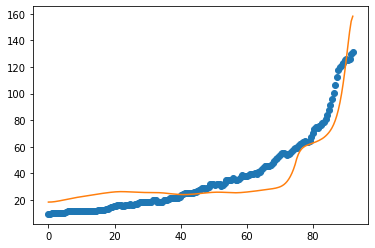

11
after perturb [4.087149378878817, 197.4459663004996, 23760.699401607486, 1.4830360436008352, 17.527606929136063]
parameters [4.087149378878817, 197.4459663004996, 23760.699401607486, 1.4830360436008352, 17.527606929136063]
after perturb [6.080679233772299, 50.362528478680574, 17086.083549235766, -0.024131769434480782, 16.626566715276326]
parameters [6.080679233772299, 50.362528478680574, 17086.083549235766, -0.024131769434480782, 16.626566715276326]
after perturb [4.621427235519719, 91.95068728409743, 23752.71174650744, 1.2561946529944548, 43.00556805840864]
parameters [4.621427235519719, 91.95068728409743, 23752.71174650744, 1.2561946529944548, 43.00556805840864]
oxigeno [2.57053016e-16 2.61565031e-16 2.75260400e-16 2.98623219e-16
 3.32481009e-16 3.78036641e-16 4.36914848e-16 5.11225230e-16
 6.03644332e-16 7.17520180e-16 8.57003586e-16 1.02721164e-15
 1.23443020e-15 1.48636376e-15 1.79244322e-15 2.16420434e-15
 2.61575292e-15 3.16433628e-15 3.83104530e-15 4.64167673e-15
 5.62779275

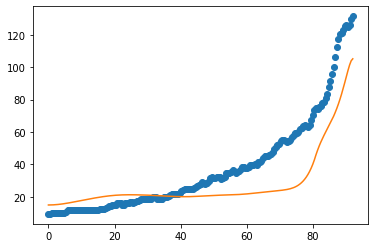

after perturb [4.661728256806528, 116.85681832379377, 26241.391851273736, 1.3792034919063223, 39.664742411255105]
parameters [4.661728256806528, 116.85681832379377, 26241.391851273736, 1.3792034919063223, 39.664742411255105]
oxigeno [5.35424345e-15 5.43094083e-15 5.66325970e-15 6.05795245e-15
 6.62651640e-15 7.38556759e-15 8.35738183e-15 9.57062180e-15
 1.10612751e-14 1.28738359e-14 1.50627704e-14 1.76943186e-14
 2.08486932e-14 2.46227543e-14 2.91332529e-14 3.45207586e-14
 4.09544091e-14 4.86376520e-14 5.78151827e-14 6.87813265e-14
 8.18901660e-14 9.75677770e-14 1.16327014e-13 1.38785377e-13
 1.65686604e-13 1.97926763e-13 2.36585791e-13 2.82965599e-13
 3.38636116e-13 4.05490916e-13 4.85814401e-13 5.82362919e-13
 6.98462675e-13 8.38127875e-13 1.00620320e-12 1.20853557e-12
 1.45218107e-12 1.74565424e-12 2.09922798e-12 2.52529450e-12
 3.03879922e-12 3.65776236e-12 4.40390538e-12 5.30340326e-12
 6.38778744e-12 7.69502914e-12 9.27083878e-12 1.11702241e-11
 1.34593578e-11 1.62178161e-11 1.95

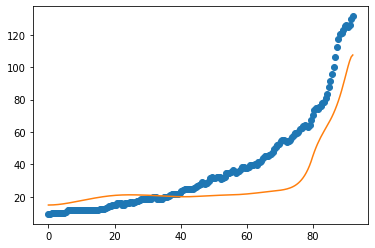

after perturb [7.24013592713748, 60.862871525872045, 20777.767230475656, 0.290361340984584, 42.1958160600515]
parameters [7.24013592713748, 60.862871525872045, 20777.767230475656, 0.290361340984584, 42.1958160600515]
oxigeno [5.24120677e-07 5.23653428e-07 5.22255058e-07 5.19935654e-07
 5.16711860e-07 5.12606633e-07 5.07648910e-07 5.01873192e-07
 4.95319062e-07 4.88030650e-07 4.80056040e-07 4.71446665e-07
 4.62256673e-07 4.52542290e-07 4.42361206e-07 4.31771959e-07
 4.20833375e-07 4.09604028e-07 3.98141760e-07 3.86503246e-07
 3.74743617e-07 3.62916145e-07 3.51071988e-07 3.39259989e-07
 3.27526544e-07 3.15915525e-07 3.04468256e-07 2.93223550e-07
 2.82217797e-07 2.71485098e-07 2.61057454e-07 2.50964998e-07
 2.41236273e-07 2.31898555e-07 2.22978223e-07 2.14501172e-07
 2.06493277e-07 1.98980897e-07 1.91991443e-07 1.85553993e-07
 1.79699974e-07 1.74463906e-07 1.69884231e-07 1.66004213e-07
 1.62872946e-07 1.60546459e-07 1.59088953e-07 1.58574165e-07
 1.59086903e-07 1.60724746e-07 1.63599954e-

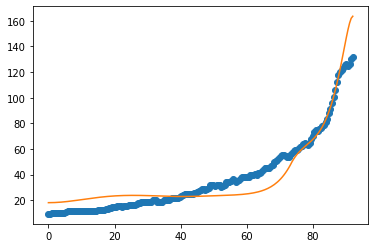

12
after perturb [6.9238262618496, 117.22833676694297, 19552.046706531917, 0.20664339217015273, 1.7050671687479744]
parameters [6.9238262618496, 117.22833676694297, 19552.046706531917, 0.20664339217015273, 1.7050671687479744]
after perturb [-3.270716457601628, 52.78476799742585, 32035.776307610977, 0.20103325477040007, 21.937755892275774]
parameters [-3.270716457601628, 52.78476799742585, 32035.776307610977, 0.20103325477040007, 21.937755892275774]
after perturb [0.5588941733519972, 232.19051255992764, 19872.403057743963, 2.1346214982494853, 11.850745997173014]
parameters [0.5588941733519972, 232.19051255992764, 19872.403057743963, 2.1346214982494853, 11.850745997173014]
after perturb [3.3544020872345794, 84.5381816435368, 17373.908382722017, 1.456921339185044, 49.62037109824237]
parameters [3.3544020872345794, 84.5381816435368, 17373.908382722017, 1.456921339185044, 49.62037109824237]
after perturb [8.548668170446886, 122.70195241088702, 24793.085566381924, 0.4120631497005842, 18.1274

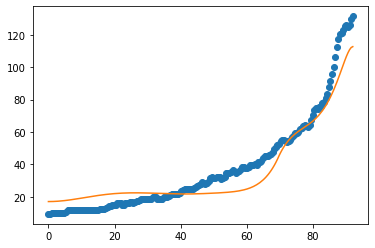

13
after perturb [7.068256913095507, 243.9553233627135, 23977.632777649364, 2.272632263978107, 34.8918697760676]
parameters [7.068256913095507, 243.9553233627135, 23977.632777649364, 2.272632263978107, 34.8918697760676]
after perturb [7.289524056161633, 124.76849960330902, 23081.303670232774, 0.3747290243079009, 24.51106063692884]
parameters [7.289524056161633, 124.76849960330902, 23081.303670232774, 0.3747290243079009, 24.51106063692884]
oxigeno [6.51578527e-08 6.54123467e-08 6.61782447e-08 6.74628210e-08
 6.92782856e-08 7.16419137e-08 7.45762304e-08 7.81092491e-08
 8.22747701e-08 8.71127386e-08 9.26696682e-08 9.89991336e-08
 1.06162336e-07 1.14228751e-07 1.23276858e-07 1.33394969e-07
 1.44682155e-07 1.57249287e-07 1.71220193e-07 1.86732957e-07
 2.03941357e-07 2.23016466e-07 2.44148428e-07 2.67548430e-07
 2.93450877e-07 3.22115811e-07 3.53831575e-07 3.88917761e-07
 4.27728461e-07 4.70655851e-07 5.18134151e-07 5.70643970e-07
 6.28717099e-07 6.92941785e-07 7.63968516e-07 8.42516393e-07


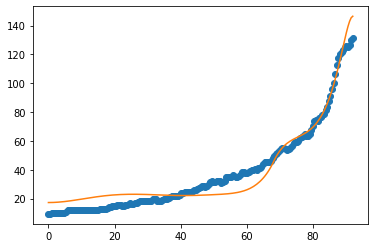

14
after perturb [4.9363612318860195, 83.45017538634264, 30294.366936666294, 1.4513658910600968, 50.94244828417764]
parameters [4.9363612318860195, 83.45017538634264, 30294.366936666294, 1.4513658910600968, 50.94244828417764]
after perturb [3.8030660738295623, 210.0318634867545, 32710.132976730594, 2.278715908219727, 42.477285633095235]
parameters [3.8030660738295623, 210.0318634867545, 32710.132976730594, 2.278715908219727, 42.477285633095235]
after perturb [7.784592921030592, 62.77404464059948, 22211.619979686366, 1.302938086919787, 60.72970843577388]
parameters [7.784592921030592, 62.77404464059948, 22211.619979686366, 1.302938086919787, 60.72970843577388]
after perturb [5.716223382435903, 75.93564312868548, 22282.12739750286, 0.13356316724385903, -2.6843400305693734]
parameters [5.716223382435903, 75.93564312868548, 22282.12739750286, 0.13356316724385903, -2.6843400305693734]
after perturb [8.453605201793257, 125.5353506267347, 26456.2963978915, 1.1473282497907702, 35.6350131205399

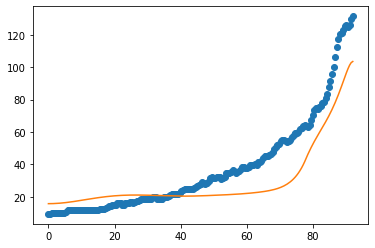

after perturb [5.356522963118455, 221.03248767472468, 21727.454694612014, 2.951565976411514, 40.93322904380343]
parameters [5.356522963118455, 221.03248767472468, 21727.454694612014, 2.951565976411514, 40.93322904380343]
after perturb [11.493663634235805, 153.94720159226912, 23624.033120706576, 0.43636389601926506, 6.453852001307556]
parameters [11.493663634235805, 153.94720159226912, 23624.033120706576, 0.43636389601926506, 6.453852001307556]
after perturb [-0.7794771290629616, 128.97111253151405, 27124.020103306946, 1.3885220588586942, 11.687206395755577]
parameters [-0.7794771290629616, 128.97111253151405, 27124.020103306946, 1.3885220588586942, 11.687206395755577]
after perturb [7.777402843419879, 82.3851485601428, 25905.601268393075, 0.08086601825985407, 26.40807294291372]
parameters [7.777402843419879, 82.3851485601428, 25905.601268393075, 0.08086601825985407, 26.40807294291372]
oxigeno [9.63811548e-03 9.63445263e-03 9.62348405e-03 9.60526941e-03
 9.57990748e-03 9.54753507e-03 9.

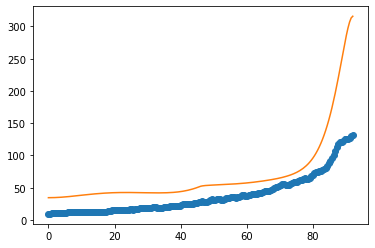

after perturb [9.402095285231596, 207.29559746538865, 24378.5897496345, 1.7658827541046784, 41.802927882990296]
parameters [9.402095285231596, 207.29559746538865, 24378.5897496345, 1.7658827541046784, 41.802927882990296]
after perturb [6.110993885634152, 86.45305962098925, 26437.261306227138, 0.7495141317491812, 41.75091631803819]
parameters [6.110993885634152, 86.45305962098925, 26437.261306227138, 0.7495141317491812, 41.75091631803819]
oxigeno [2.46991372e-13 2.50041885e-13 2.59269837e-13 2.74906543e-13
 2.97344502e-13 3.27148077e-13 3.65068862e-13 4.12066196e-13
 4.69333396e-13 5.38330476e-13 6.20824285e-13 7.18937228e-13
 8.35205964e-13 9.72651791e-13 1.13486473e-12 1.32610378e-12
 1.55141618e-12 1.81677921e-12 2.12926861e-12 2.49725847e-12
 2.93065844e-12 3.44119509e-12 4.04274560e-12 4.75173341e-12
 5.58759720e-12 6.57334678e-12 7.73622179e-12 9.10847202e-12
 1.07282816e-11 1.26408632e-11 1.48997535e-11 1.75683454e-11
 2.07217010e-11 2.44486945e-11 2.88545454e-11 3.40638097e-11
 

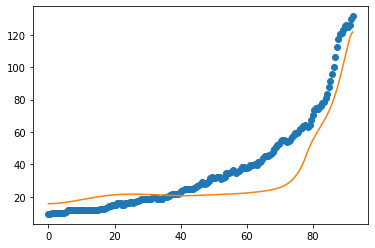

15
after perturb [8.440535804541165, 101.12578027369514, 19667.14190459761, 0.3895644265767435, 41.05604713914374]
parameters [8.440535804541165, 101.12578027369514, 19667.14190459761, 0.3895644265767435, 41.05604713914374]
after perturb [12.54110223465009, 153.6714048631633, 23258.53026771117, 0.3090990263656207, 14.585783753124858]
parameters [12.54110223465009, 153.6714048631633, 23258.53026771117, 0.3090990263656207, 14.585783753124858]
after perturb [3.163361427235588, 109.56727824062804, 21818.02092560387, 1.3392834166586411, 30.651825219716454]
parameters [3.163361427235588, 109.56727824062804, 21818.02092560387, 1.3392834166586411, 30.651825219716454]
oxigeno [2.63175150e-15 2.67073288e-15 2.78885628e-15 2.98970029e-15
 3.27936674e-15 3.66669191e-15 4.16355259e-15 4.78527744e-15
 5.55117840e-15 6.48522062e-15 7.61685504e-15 8.98204313e-15
 1.06245108e-14 1.25972774e-14 1.49645144e-14 1.78038049e-14
 2.12088839e-14 2.52929661e-14 3.01927824e-14 3.60734804e-14
 4.31345736e-14 5.1

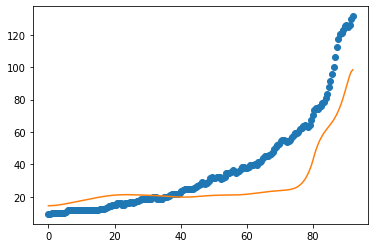

after perturb [4.911327299428345, 84.52320885365954, 18846.009258234848, 0.21402458810669345, 11.140677088031083]
parameters [4.911327299428345, 84.52320885365954, 18846.009258234848, 0.21402458810669345, 11.140677088031083]
after perturb [6.574567276678379, 106.67237807514756, 23274.610439942255, 0.5430366313701316, 26.433105415101537]
parameters [6.574567276678379, 106.67237807514756, 23274.610439942255, 0.5430366313701316, 26.433105415101537]
oxigeno [2.90163681e-10 2.92268409e-10 2.98614404e-10 3.09297635e-10
 3.24479864e-10 3.44391388e-10 3.69334956e-10 3.99690912e-10
 4.35923661e-10 4.78589570e-10 5.28346433e-10 5.85964674e-10
 6.52340475e-10 7.28511057e-10 8.15672384e-10 9.15199588e-10
 1.02867048e-09 1.15789254e-09 1.30493387e-09 1.47215862e-09
 1.66226754e-09 1.87834426e-09 2.12390822e-09 2.40297506e-09
 2.72012544e-09 3.08058362e-09 3.49030691e-09 3.95608758e-09
 4.48566888e-09 5.08787708e-09 5.77277155e-09 6.55181548e-09
 7.43806969e-09 8.44641279e-09 9.59379104e-09 1.089950

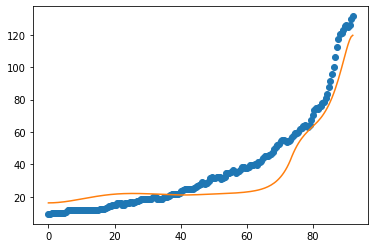

16
after perturb [4.929609174820881, 201.16125377289407, 24758.471114247368, 2.1198758556684605, 6.624331450685148]
parameters [4.929609174820881, 201.16125377289407, 24758.471114247368, 2.1198758556684605, 6.624331450685148]
after perturb [5.1212317532393685, 101.09114144509391, 25307.59880570961, 0.646378391902722, 8.2937519650895]
parameters [5.1212317532393685, 101.09114144509391, 25307.59880570961, 0.646378391902722, 8.2937519650895]
oxigeno [1.40548986e-11 1.41835330e-11 1.45718277e-11 1.52270066e-11
 1.61612777e-11 1.73920900e-11 1.89424987e-11 2.08416505e-11
 2.31253946e-11 2.58370370e-11 2.90282504e-11 3.27601617e-11
 3.71046398e-11 4.21458108e-11 4.79818345e-11 5.47269803e-11
 6.25140479e-11 7.14971849e-11 8.18551645e-11 9.37951928e-11
 1.07557331e-10 1.23419625e-10 1.41704064e-10 1.62783479e-10
 1.87089550e-10 2.15122080e-10 2.47459745e-10 2.84772532e-10
 3.27836144e-10 3.77548661e-10 4.34949811e-10 5.01243233e-10
 5.77822207e-10 6.66299337e-10 7.68540820e-10 8.86705940e-10


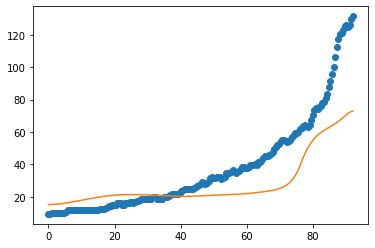

after perturb [1.8652375497745475, 89.00105516961035, 17415.60279849269, 0.9846217007582775, 22.183880167846752]
parameters [1.8652375497745475, 89.00105516961035, 17415.60279849269, 0.9846217007582775, 22.183880167846752]
after perturb [1.606751717449261, 144.8741840608362, 26889.227203880924, 0.6751367446022823, 11.24372297472739]
parameters [1.606751717449261, 144.8741840608362, 26889.227203880924, 0.6751367446022823, 11.24372297472739]
oxigeno [1.16358033e-09 1.17038658e-09 1.19089539e-09 1.22537824e-09
 1.27429208e-09 1.33828610e-09 1.41821128e-09 1.51513304e-09
 1.63034692e-09 1.76539772e-09 1.92210231e-09 2.10257627e-09
 2.30926482e-09 2.54497812e-09 2.81293156e-09 3.11679144e-09
 3.46072676e-09 3.84946832e-09 4.28837639e-09 4.78351892e-09
 5.34176216e-09 5.97087596e-09 6.67965592e-09 7.47806434e-09
 8.37739141e-09 9.39043816e-09 1.05317220e-08 1.18177061e-08
 1.32670553e-08 1.49009196e-08 1.67432525e-08 1.88211687e-08
 2.11653496e-08 2.38105071e-08 2.67959144e-08 3.01660138e-08

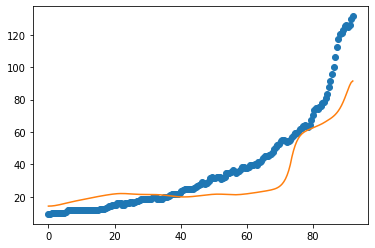

after perturb [10.096024700631814, 158.80087324746813, 24396.35750492942, 0.4120743630335537, 7.038683367431712]
parameters [10.096024700631814, 158.80087324746813, 24396.35750492942, 0.4120743630335537, 7.038683367431712]
after perturb [5.5342899379048065, 167.11808950502962, 31726.994043031205, 1.5479545935671493, 12.869087384280078]
parameters [5.5342899379048065, 167.11808950502962, 31726.994043031205, 1.5479545935671493, 12.869087384280078]
after perturb [-0.2818163404976506, -18.832436497809667, 23573.97411299915, 0.05848060580177129, 48.544784199995036]
parameters [-0.2818163404976506, -18.832436497809667, 23573.97411299915, 0.05848060580177129, 48.544784199995036]
after perturb [4.334621365765903, 75.6219435432237, 21199.367878237932, 0.6774313939439014, 29.81138904730796]
parameters [4.334621365765903, 75.6219435432237, 21199.367878237932, 0.6774313939439014, 29.81138904730796]
oxigeno [1.71984563e-13 1.73279520e-13 1.77203029e-13 1.83872099e-13
 1.93485404e-13 2.06328917e-13 

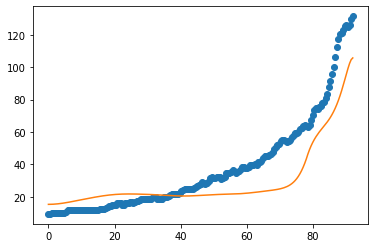

after perturb [-0.1961920469719196, -0.622601809412771, 23374.531288102335, 0.37441480649954595, 56.19341437595542]
parameters [-0.1961920469719196, -0.622601809412771, 23374.531288102335, 0.37441480649954595, 56.19341437595542]
after perturb [9.956947758161139, 120.5943031223747, 25255.20665707942, 1.1213734897889922, 42.336480129656614]
parameters [9.956947758161139, 120.5943031223747, 25255.20665707942, 1.1213734897889922, 42.336480129656614]
oxigeno [2.02093507e-13 2.04527354e-13 2.11887503e-13 2.24351303e-13
 2.42219426e-13 2.65923670e-13 2.96038164e-13 3.33294310e-13
 3.78599875e-13 4.33062750e-13 4.98020048e-13 5.75073363e-13
 6.66131140e-13 7.73459381e-13 8.99742071e-13 1.04815303e-12
 1.22244121e-12 1.42703178e-12 1.66714592e-12 1.94894258e-12
 2.27968625e-12 2.66794535e-12 3.12382697e-12 3.65925423e-12
 4.28829435e-12 5.02754628e-12 5.89659882e-12 6.91857201e-12
 8.12075660e-12 9.53536946e-12 1.12004457e-11 1.31608920e-11
 1.54697299e-11 1.81895634e-11 2.13943101e-11 2.517124

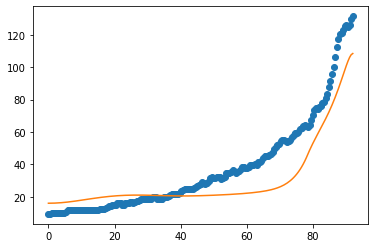

17
after perturb [3.358834631042631, 109.63338476128494, 27616.578629106127, 1.1127144954439843, 31.26769732194873]
parameters [3.358834631042631, 109.63338476128494, 27616.578629106127, 1.1127144954439843, 31.26769732194873]
oxigeno [4.77698898e-14 4.83770785e-14 5.02144138e-14 5.33296750e-14
 5.78040812e-14 6.37547204e-14 7.13380509e-14 8.07545772e-14
 9.22548420e-14 1.06146912e-13 1.22805589e-13 1.42683617e-13
 1.66325245e-13 1.94382555e-13 2.27635063e-13 2.67013230e-13
 3.13626603e-13 3.68797505e-13 4.34101351e-13 5.11414878e-13
 6.02973882e-13 7.11442293e-13 8.39994874e-13 9.92416201e-13
 1.17321915e-12 1.38778673e-12 1.64254185e-12 1.94515046e-12
 2.30476461e-12 2.73231319e-12 3.24084951e-12 3.84596673e-12
 4.56629407e-12 5.42408920e-12 6.44594499e-12 7.66363197e-12
 9.11510198e-12 1.08456827e-11 1.29094981e-11 1.53711567e-11
 1.83077553e-11 2.18112575e-11 2.59913122e-11 3.09785956e-11
 3.69287688e-11 4.40271657e-11 5.24943439e-11 6.25926579e-11
 7.46340436e-11 8.89892390e-11 1.0

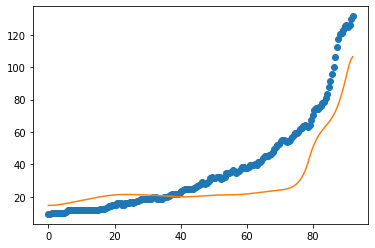

after perturb [4.431799496306695, 65.34822859690551, 21832.046356670468, 0.30992944336743944, 23.893399049507835]
parameters [4.431799496306695, 65.34822859690551, 21832.046356670468, 0.30992944336743944, 23.893399049507835]
oxigeno [1.95642634e-07 1.95451960e-07 1.94881585e-07 1.93936430e-07
 1.92624582e-07 1.90957147e-07 1.88948035e-07 1.86613708e-07
 1.83972888e-07 1.81046238e-07 1.77856037e-07 1.74425840e-07
 1.70780151e-07 1.66944109e-07 1.62943196e-07 1.58802975e-07
 1.54548853e-07 1.50205892e-07 1.45798641e-07 1.41351019e-07
 1.36886221e-07 1.32426670e-07 1.27993990e-07 1.23609019e-07
 1.19291846e-07 1.15061876e-07 1.10937920e-07 1.06938315e-07
 1.03081063e-07 9.93840013e-08 9.58649950e-08 9.25421630e-08
 8.94341321e-08 8.65603253e-08 8.39412889e-08 8.15990595e-08
 7.95575785e-08 7.78431572e-08 7.64850005e-08 7.55157936e-08
 7.49723632e-08 7.48964174e-08 7.53353793e-08 7.63433211e-08
 7.79820159e-08 8.03221196e-08 8.34445001e-08 8.74417357e-08
 9.24198021e-08 9.84999755e-08 1.05

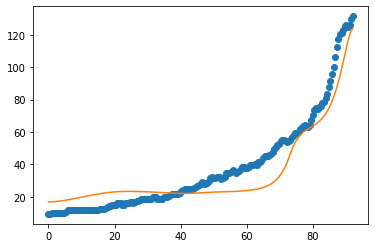

18
after perturb [9.437382541960371, 96.65551683068873, 18063.69212690378, 1.0498993437546345, 50.261216971067135]
parameters [9.437382541960371, 96.65551683068873, 18063.69212690378, 1.0498993437546345, 50.261216971067135]
after perturb [-1.8099544744316383, -22.254234273836914, 26733.930356974666, 0.7310606406354545, 52.59772503725812]
parameters [-1.8099544744316383, -22.254234273836914, 26733.930356974666, 0.7310606406354545, 52.59772503725812]
after perturb [11.130335094151299, 235.73108593188894, 27160.994449077847, 1.305127567407177, 18.624113702142207]
parameters [11.130335094151299, 235.73108593188894, 27160.994449077847, 1.305127567407177, 18.624113702142207]
after perturb [0.5248595067706393, 97.14260386625341, 29480.618773079255, 0.5963563508497549, 13.298261111054643]
parameters [0.5248595067706393, 97.14260386625341, 29480.618773079255, 0.5963563508497549, 13.298261111054643]
after perturb [9.813240653522065, 158.11357145073532, 20705.653673919674, 0.8641073467152993, 47.

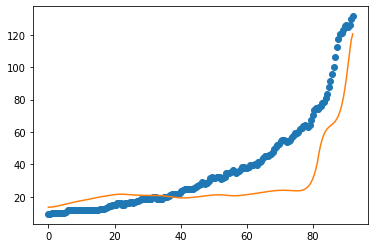

after perturb [-3.014453255746476, -86.4742691026407, 26055.321033060107, -0.7775021906699562, 42.568812077602544]
parameters [-3.014453255746476, -86.4742691026407, 26055.321033060107, -0.7775021906699562, 42.568812077602544]
after perturb [13.662416247215338, 187.75015274383136, 16343.068283268552, 0.7775950085271146, 24.11221005387209]
parameters [13.662416247215338, 187.75015274383136, 16343.068283268552, 0.7775950085271146, 24.11221005387209]
after perturb [8.547003729415492, 185.9062182125336, 29645.72460681653, 1.6146767107274649, 30.60791847815682]
parameters [8.547003729415492, 185.9062182125336, 29645.72460681653, 1.6146767107274649, 30.60791847815682]
after perturb [7.475384017252035, 190.39406969306572, 22431.914133120456, 1.902975486535166, 27.464018774875157]
parameters [7.475384017252035, 190.39406969306572, 22431.914133120456, 1.902975486535166, 27.464018774875157]
after perturb [6.88765010335368, 110.7561339482523, 18040.46302878353, 0.4439410127597568, 27.671594810212

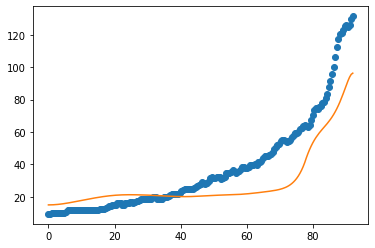

after perturb [4.300091318671292, 147.34717516056548, 20971.17094350169, 1.7161298720679659, 31.695280804407897]
parameters [4.300091318671292, 147.34717516056548, 20971.17094350169, 1.7161298720679659, 31.695280804407897]
oxigeno [1.07107042e-14 1.08520762e-14 1.12800067e-14 1.20060574e-14
 1.30498943e-14 1.44398959e-14 1.62140321e-14 1.84210417e-14
 2.11219479e-14 2.43919605e-14 2.83228258e-14 3.30257052e-14
 3.86346724e-14 4.53109509e-14 5.32480284e-14 6.26778235e-14
 7.38781098e-14 8.71814513e-14 1.02985951e-13 1.21768181e-13
 1.44098736e-13 1.70660947e-13 2.02273391e-13 2.39916985e-13
 2.84767581e-13 3.38235200e-13 4.02011237e-13 4.78125272e-13
 5.69013418e-13 6.77600535e-13 8.07399108e-13 9.62628120e-13
 1.14835590e-12 1.37067175e-12 1.63689197e-12 1.95580711e-12
 2.33797863e-12 2.79609431e-12 3.34539432e-12 4.00418111e-12
 4.79442990e-12 5.74251866e-12 6.88010106e-12 8.24514951e-12
 9.88320136e-12 1.18488470e-11 1.42075068e-11 1.70375518e-11
 2.04328349e-11 2.45057115e-11 2.9390

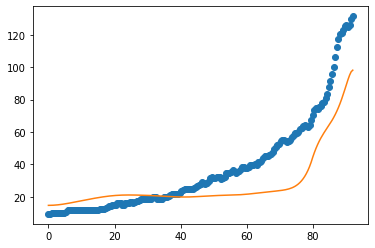

after perturb [0.10868791886305118, 43.81316307392971, 20456.297001159528, 0.4844236514050815, 34.39429292787244]
parameters [0.10868791886305118, 43.81316307392971, 20456.297001159528, 0.4844236514050815, 34.39429292787244]
oxigeno [4.33801684e-10 4.32221077e-10 4.27690725e-10 4.20737269e-10
 4.11995803e-10 4.02041410e-10 3.91281519e-10 3.79939771e-10
 3.68102938e-10 3.55765092e-10 3.42849348e-10 3.29245772e-10
 3.14902871e-10 2.99925568e-10 2.84591550e-10 2.69270889e-10
 2.54312279e-10 2.39945241e-10 2.26245147e-10 2.13177470e-10
 2.00666975e-10 1.88638823e-10 1.77023453e-10 1.65747566e-10
 1.54733832e-10 1.43927327e-10 1.33338568e-10 1.23065847e-10
 1.13267560e-10 1.04100909e-10 9.56662528e-11 8.79739282e-11
 8.09498101e-11 7.44787922e-11 6.84577546e-11 6.28283794e-11
 5.75701596e-11 5.26759731e-11 4.81369049e-11 4.39438554e-11
 4.00944075e-11 3.65975459e-11 3.34708018e-11 3.07319709e-11
 2.83913394e-11 2.64475024e-11 2.48886290e-11 2.36983422e-11
 2.28651753e-11 2.23938656e-11 2.23

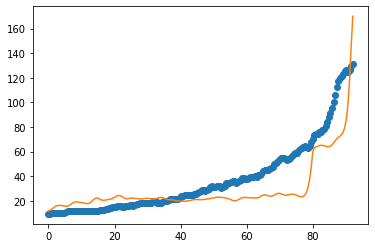

after perturb [4.124633983592322, 50.85172937625954, 21855.396432450867, -0.17393639371916547, 38.12871149904335]
parameters [4.124633983592322, 50.85172937625954, 21855.396432450867, -0.17393639371916547, 38.12871149904335]
after perturb [6.1364655409262445, 61.76785824209961, 27774.67917238729, -0.12461878668669041, 10.830514216214961]
parameters [6.1364655409262445, 61.76785824209961, 27774.67917238729, -0.12461878668669041, 10.830514216214961]
after perturb [6.402770063399311, 59.925577647730485, 21673.652932224228, 0.6585961328190564, 55.106284164382906]
parameters [6.402770063399311, 59.925577647730485, 21673.652932224228, 0.6585961328190564, 55.106284164382906]
after perturb [-1.0131434419496905, 65.41223807790827, 26662.12603366829, 1.2555687251221754, 49.27753537908454]
parameters [-1.0131434419496905, 65.41223807790827, 26662.12603366829, 1.2555687251221754, 49.27753537908454]
after perturb [4.951113139896968, 104.56757323032721, 21948.07270586711, 0.2248282962494148, 6.85154

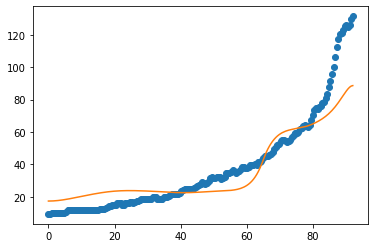

19
after perturb [5.702508196929323, 114.9105256097412, 25915.69546818146, 0.937206746218429, 24.119081153400128]
parameters [5.702508196929323, 114.9105256097412, 25915.69546818146, 0.937206746218429, 24.119081153400128]
oxigeno [1.14006596e-12 1.15226676e-12 1.18913277e-12 1.25146121e-12
 1.34060228e-12 1.45849189e-12 1.60769872e-12 1.79148674e-12
 2.01389474e-12 2.27983501e-12 2.59521358e-12 2.96707520e-12
 3.40377665e-12 3.91519305e-12 4.51296218e-12 5.21077350e-12
 6.02470899e-12 6.97364486e-12 8.07972453e-12 9.36891500e-12
 1.08716613e-11 1.26236557e-11 1.46667419e-11 1.70499776e-11
 1.98308819e-11 2.30769020e-11 2.68671334e-11 3.12943412e-11
 3.64673301e-11 4.25137272e-11 4.95832430e-11 5.78514962e-11
 6.75244942e-11 7.88438822e-11 9.20930874e-11 1.07604510e-10
 1.25767932e-10 1.47040351e-10 1.71957469e-10 2.01147109e-10
 2.35344883e-10 2.75412471e-10 3.22358945e-10 3.77365637e-10
 4.41815112e-10 5.17324949e-10 6.05787064e-10 7.09413528e-10
 8.30789883e-10 9.72937207e-10 1.13938

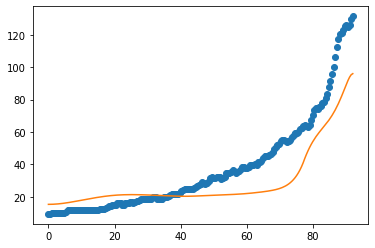

after perturb [7.247274935697761, 120.73342853528663, 28894.512700389223, 1.3743023918861215, 42.021653664565235]
parameters [7.247274935697761, 120.73342853528663, 28894.512700389223, 1.3743023918861215, 42.021653664565235]
oxigeno [1.00542398e-14 1.01957037e-14 1.06240968e-14 1.13515454e-14
 1.23986748e-14 1.37952444e-14 1.55810671e-14 1.78072428e-14
 2.05377468e-14 2.38514265e-14 2.78444720e-14 3.26334446e-14
 3.83589633e-14 4.51901738e-14 5.33301498e-14 6.30224090e-14
 7.45587636e-14 8.82887703e-14 1.04631101e-13 1.24087219e-13
 1.47257825e-13 1.74862630e-13 2.07764135e-13 2.46996212e-13
 2.93798468e-13 3.49657556e-13 4.16356836e-13 4.96036058e-13
 5.91263098e-13 7.05120158e-13 8.41307328e-13 1.00426699e-12
 1.19933324e-12 1.43291125e-12 1.71269259e-12 2.04791365e-12
 2.44966556e-12 2.93126594e-12 3.50870448e-12 4.20117701e-12
 5.03172520e-12 6.02800265e-12 7.22319202e-12 8.65710233e-12
 1.03774817e-11 1.24415870e-11 1.49180598e-11 1.78891681e-11
 2.14534835e-11 2.57290781e-11 3.08

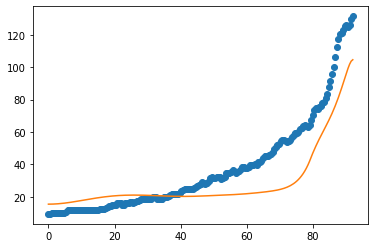

after perturb [3.858126820790377, 199.63515769796663, 19323.92830789189, 1.8647536299101328, 12.084816338154976]
parameters [3.858126820790377, 199.63515769796663, 19323.92830789189, 1.8647536299101328, 12.084816338154976]
after perturb [-1.653526847809954, 45.993327327893255, 25061.150460506207, 0.7266632978599048, 24.661634552561097]
parameters [-1.653526847809954, 45.993327327893255, 25061.150460506207, 0.7266632978599048, 24.661634552561097]
after perturb [5.523564771643618, 221.4083358462476, 24363.619962032837, 1.4829549307127756, 9.839810560821412]
parameters [5.523564771643618, 221.4083358462476, 24363.619962032837, 1.4829549307127756, 9.839810560821412]
after perturb [1.3071971577573782, 49.56876033825991, 23875.681832691636, -0.7412262019010677, -1.3460754448656616]
parameters [1.3071971577573782, 49.56876033825991, 23875.681832691636, -0.7412262019010677, -1.3460754448656616]
after perturb [6.375160175320618, 139.27399125020474, 17454.96949055882, 0.25161690172636797, 8.5957

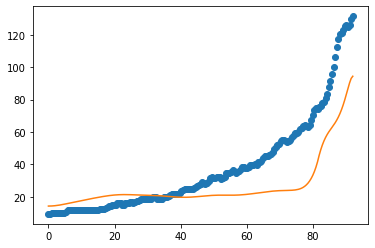

after perturb [4.396371565821627, 92.56317182427787, 25572.5740617183, 0.3618904980154045, 2.4645835979596615]
parameters [4.396371565821627, 92.56317182427787, 25572.5740617183, 0.3618904980154045, 2.4645835979596615]
oxigeno [8.35094428e-09 8.35386089e-09 8.36276984e-09 8.37814940e-09
 8.40079978e-09 8.43184804e-09 8.47275519e-09 8.52532611e-09
 8.59172241e-09 8.67447910e-09 8.77652532e-09 8.90121012e-09
 9.05233376e-09 9.23418545e-09 9.45158837e-09 9.70995281e-09
 1.00153386e-08 1.03745275e-08 1.07951079e-08 1.12855710e-08
 1.18554225e-08 1.25153095e-08 1.32771657e-08 1.41543760e-08
 1.51619638e-08 1.63168023e-08 1.76378548e-08 1.91464447e-08
 2.08665609e-08 2.28252017e-08 2.50527614e-08 2.75834656e-08
 3.04558594e-08 3.37133557e-08 3.74048491e-08 4.15854046e-08
 4.63170269e-08 5.16695210e-08 5.77214545e-08 6.45612312e-08
 7.22882899e-08 8.10144418e-08 9.08653621e-08 1.01982254e-07
 1.14523706e-07 1.28667759e-07 1.44614216e-07 1.62587222e-07
 1.82838135e-07 2.05648737e-07 2.31334817

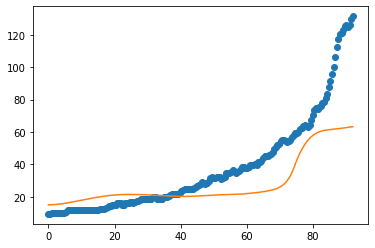

after perturb [3.1994188795039076, 76.1543537737079, 22443.759463243023, 1.280779846894947, 45.73861385028239]
parameters [3.1994188795039076, 76.1543537737079, 22443.759463243023, 1.280779846894947, 45.73861385028239]
oxigeno [3.28188399e-18 3.35406708e-18 3.57381646e-18 3.95088737e-18
 4.50206268e-18 5.25196698e-18 6.23426357e-18 7.49329510e-18
 9.08625141e-18 1.10859751e-17 1.35845485e-17 1.66978452e-17
 2.05712825e-17 2.53870694e-17 3.13733304e-17 3.88155777e-17
 4.80711377e-17 5.95872901e-17 7.39240843e-17 9.17830468e-17
 1.14043318e-16 1.41807162e-16 1.76457298e-16 2.19729166e-16
 2.73802035e-16 3.41413906e-16 4.26006458e-16 5.31907924e-16
 6.64563837e-16 8.30828201e-16 1.03933087e-15 1.30094107e-15
 1.62935200e-15 2.04181811e-15 2.56008440e-15 3.21155728e-15
 4.03077902e-15 5.06128333e-15 6.35792894e-15 7.98983225e-15
 1.00440501e-14 1.26302006e-14 1.58862580e-14 1.99858125e-14
 2.51471620e-14 3.16446908e-14 3.98231030e-14 5.01152222e-14
 6.30642421e-14 7.93515379e-14 9.98314198

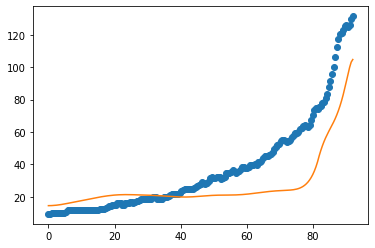

after perturb [5.781991235700141, 128.94355332178074, 22822.876837798212, 1.4372187969252177, 60.16808156020979]
parameters [5.781991235700141, 128.94355332178074, 22822.876837798212, 1.4372187969252177, 60.16808156020979]
after perturb [7.6724346365899025, 147.10213725885922, 25394.83489467805, 2.5771859009737526, 63.01524782839564]
parameters [7.6724346365899025, 147.10213725885922, 25394.83489467805, 2.5771859009737526, 63.01524782839564]
after perturb [5.794974372562162, 109.60897816536193, 25394.607385572257, 0.8023427480605889, 26.48031239598212]
parameters [5.794974372562162, 109.60897816536193, 25394.607385572257, 0.8023427480605889, 26.48031239598212]
oxigeno [4.25825586e-12 4.30060973e-12 4.42852046e-12 4.64455446e-12
 4.95305327e-12 5.36023142e-12 5.87431663e-12 6.50573558e-12
 7.26734971e-12 8.17474648e-12 9.24659303e-12 1.05050605e-11
 1.19763291e-11 1.36911859e-11 1.56857293e-11 1.80021972e-11
 2.06899386e-11 2.38065513e-11 2.74192130e-11 3.16062383e-11
 3.64588969e-11 4.

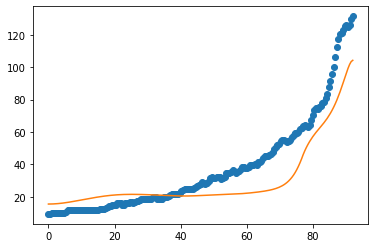

after perturb [0.4622879248945386, 93.23155486387766, 18940.382622274035, 0.31734480814451504, -6.259326449276944]
parameters [0.4622879248945386, 93.23155486387766, 18940.382622274035, 0.31734480814451504, -6.259326449276944]
after perturb [1.4241387423879264, 152.79980877179617, 25445.97870673042, 2.217033304481427, 59.35846682504921]
parameters [1.4241387423879264, 152.79980877179617, 25445.97870673042, 2.217033304481427, 59.35846682504921]
after perturb [5.475421434759584, 75.32052296833282, 21413.04030124818, -0.041120110812077865, 1.5305081954158108]
parameters [5.475421434759584, 75.32052296833282, 21413.04030124818, -0.041120110812077865, 1.5305081954158108]
after perturb [8.566343223446946, 130.56311732697645, 29514.751424329355, 1.0786732160695955, 38.898943867716284]
parameters [8.566343223446946, 130.56311732697645, 29514.751424329355, 1.0786732160695955, 38.898943867716284]
after perturb [8.237020460987281, 149.53847399242167, 23085.319035650806, 1.0075779245507528, 40.611

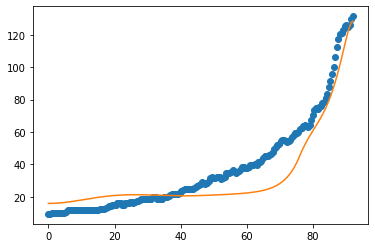

20
parameters [3.514132953299338, 100.22471817251024, 23882.812832337473, 0.5772548063855383, 45.2609668726529]
parameters [3.3038805173332966, 125.35648429865131, 24853.237963083433, 0.8364308366510274, 46.147508099596905]
parameters [2.2968277604579344, 124.41913125213578, 21540.703215606325, 0.32168233839844984, 12.703821034165133]
parameters [3.0646667969548282, 102.36571595128586, 26497.68787835256, 0.10154426728507271, 5.27689558281104]
parameters [4.94644512000543, 82.999091115863, 21686.555622426113, 0.17017282160642672, 6.72240715287842]
parameters [2.126332274863369, 76.22774409714303, 21361.296762318936, 0.5891420577362588, 40.89957777981304]
parameters [4.843635090391944, 106.80125582762423, 21879.55802770122, 0.856105635186474, 32.781914547298804]
parameters [9.24420131811331, 76.40441399464741, 26902.607195098302, 0.2524401616380373, 16.384974594246955]
parameters [7.263157131361558, 129.9198174645092, 27179.369696676735, 0.5052467811774224, 16.589063631814632]
parameters

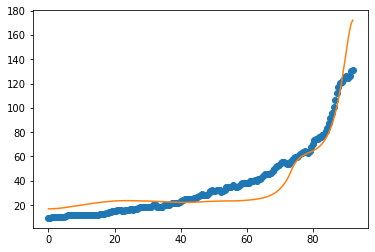

after perturb [-1.422265820264327, 90.11846224956963, 19357.907467021167, 0.3729206825602168, 13.181763198649008]
parameters [-1.422265820264327, 90.11846224956963, 19357.907467021167, 0.3729206825602168, 13.181763198649008]
after perturb [-0.5520776106247776, 97.90639073140972, 22656.41275035701, 0.34558373189164443, 24.590593194017963]
parameters [-0.5520776106247776, 97.90639073140972, 22656.41275035701, 0.34558373189164443, 24.590593194017963]
after perturb [7.349063503437009, 45.38248530958154, 31221.10205212127, 0.8974334446442125, 49.982600771951034]
parameters [7.349063503437009, 45.38248530958154, 31221.10205212127, 0.8974334446442125, 49.982600771951034]
after perturb [6.794143089772715, 131.23487751545915, 25281.467546052772, 0.11961079579247513, 2.8841871159691514]
parameters [6.794143089772715, 131.23487751545915, 25281.467546052772, 0.11961079579247513, 2.8841871159691514]
oxigeno [3.73618019e-04 3.73668430e-04 3.73820587e-04 3.74077263e-04
 3.74443071e-04 3.74924466e-04 

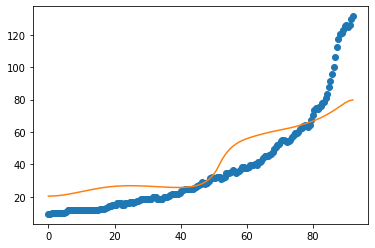

after perturb [13.19187099742599, 98.91708368636776, 27148.18912155781, 0.9189228829818166, 46.06847008991546]
parameters [13.19187099742599, 98.91708368636776, 27148.18912155781, 0.9189228829818166, 46.06847008991546]
after perturb [2.988373363608687, 106.46345424761715, 18346.612033537654, 1.1572936980762503, 66.3283013265124]
parameters [2.988373363608687, 106.46345424761715, 18346.612033537654, 1.1572936980762503, 66.3283013265124]
after perturb [15.8980611326894, 187.13105985795164, 26734.52989991429, 0.7008056553555728, 13.80434273457145]
parameters [15.8980611326894, 187.13105985795164, 26734.52989991429, 0.7008056553555728, 13.80434273457145]
after perturb [6.320294114955294, 174.86398118080587, 20475.246192335915, 0.4730882565459664, 29.6379776706521]
parameters [6.320294114955294, 174.86398118080587, 20475.246192335915, 0.4730882565459664, 29.6379776706521]
after perturb [10.970476696928149, 194.42943438758186, 18153.233525683005, 0.5761801014384038, 2.6425149094251523]
param

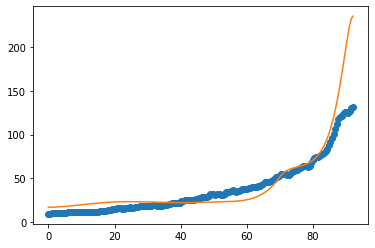

after perturb [5.9290853356695905, 70.35871879858317, 25321.989033957452, 0.7385592701737734, 49.16066334754179]
parameters [5.9290853356695905, 70.35871879858317, 25321.989033957452, 0.7385592701737734, 49.16066334754179]
oxigeno [1.44766143e-14 1.45914729e-14 1.49400785e-14 1.55346516e-14
 1.63959981e-14 1.75541848e-14 1.90495191e-14 2.09338682e-14
 2.32723680e-14 2.61455812e-14 2.96521855e-14 3.39122872e-14
 3.90714823e-14 4.53058102e-14 5.28277805e-14 6.18936898e-14
 7.28124932e-14 8.59565511e-14 1.01774640e-13 1.20807698e-13
 1.43707872e-13 1.71261560e-13 2.04417277e-13 2.44319349e-13
 2.92348664e-13 3.50171923e-13 4.19801194e-13 5.03665877e-13
 6.04699671e-13 7.26445642e-13 8.73183117e-13 1.05008091e-12
 1.26338229e-12 1.52062808e-12 1.83092591e-12 2.20527465e-12
 2.65695557e-12 3.20200335e-12 3.85977337e-12 4.65362425e-12
 5.61173897e-12 6.76811210e-12 8.16373618e-12 9.84802678e-12
 1.18805335e-11 1.43329933e-11 1.72917937e-11 2.08609260e-11
 2.51655254e-11 3.03561112e-11 3.6613

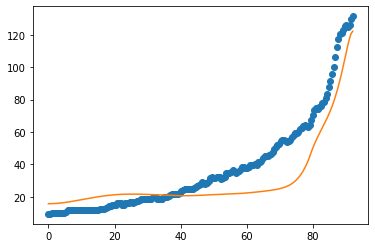

after perturb [4.918392611683112, 54.652691938705274, 31395.7230094186, 0.811758589083161, 65.73380002681526]
parameters [4.918392611683112, 54.652691938705274, 31395.7230094186, 0.811758589083161, 65.73380002681526]
after perturb [2.6434169777781165, 103.90026165012368, 23597.165926611473, 1.2967970639960267, 51.35278527768558]
parameters [2.6434169777781165, 103.90026165012368, 23597.165926611473, 1.2967970639960267, 51.35278527768558]
after perturb [7.250045688977399, 121.88490909193312, 28252.797466599673, 0.19450056522196113, -6.86037096680684]
parameters [7.250045688977399, 121.88490909193312, 28252.797466599673, 0.19450056522196113, -6.86037096680684]
after perturb [6.246356701793349, 193.54652753746797, 24728.00257790639, 1.3383778072854264, 49.891016822081454]
parameters [6.246356701793349, 193.54652753746797, 24728.00257790639, 1.3383778072854264, 49.891016822081454]
after perturb [6.047872343079639, 61.258116131381975, 25437.163535314452, 0.6223788849559473, 55.7510922155452

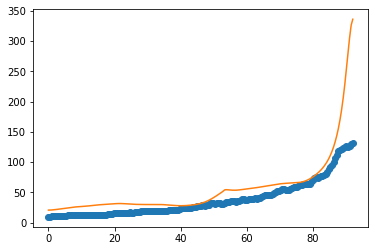

after perturb [-3.737033919935672, -60.81453914116997, 28649.110755637674, 0.07228740690849673, 55.915942658464076]
parameters [-3.737033919935672, -60.81453914116997, 28649.110755637674, 0.07228740690849673, 55.915942658464076]
after perturb [5.673782785911348, 86.39381052615116, 24618.80999250796, 0.3338242430754075, 19.169805029433373]
parameters [5.673782785911348, 86.39381052615116, 24618.80999250796, 0.3338242430754075, 19.169805029433373]
oxigeno [5.67820076e-08 5.67566766e-08 5.66812299e-08 5.65573050e-08
 5.63876273e-08 5.61760049e-08 5.59273220e-08 5.56475343e-08
 5.53436654e-08 5.50238078e-08 5.46971300e-08 5.43738922e-08
 5.40654727e-08 5.37844074e-08 5.35444460e-08 5.33606255e-08
 5.32493660e-08 5.32285898e-08 5.33178671e-08 5.35385924e-08
 5.39141928e-08 5.44703738e-08 5.52354043e-08 5.62404474e-08
 5.75199388e-08 5.91120206e-08 6.10590347e-08 6.34080825e-08
 6.62116592e-08 6.95283688e-08 7.34237314e-08 7.79710906e-08
 8.32526336e-08 8.93605366e-08 9.63982483e-08 1.044819

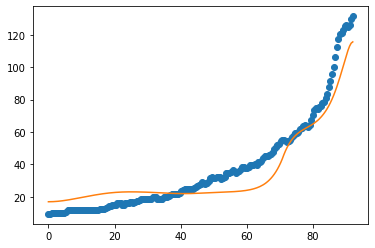

1
after perturb [6.310596702559998, 181.18687020040716, 27025.90472021136, 0.8517851372767309, 19.79315808109648]
parameters [6.310596702559998, 181.18687020040716, 27025.90472021136, 0.8517851372767309, 19.79315808109648]
after perturb [4.7210333854734685, 94.37621517784646, 25216.04442473634, 0.5501139843995948, 41.607847323134195]
parameters [4.7210333854734685, 94.37621517784646, 25216.04442473634, 0.5501139843995948, 41.607847323134195]
oxigeno [5.62915104e-11 5.66802302e-11 5.78534061e-11 5.98322231e-11
 6.26524443e-11 6.63651020e-11 7.10374849e-11 7.67544407e-11
 8.36200199e-11 9.17594939e-11 1.01321788e-10 1.12482378e-10
 1.25446710e-10 1.40454205e-10 1.57782949e-10 1.77755132e-10
 2.00743384e-10 2.27178100e-10 2.57555935e-10 2.92449621e-10
 3.32519309e-10 3.78525681e-10 4.31345070e-10 4.91986925e-10
 5.61613933e-10 6.41565237e-10 7.33383174e-10 8.38844081e-10
 9.59993746e-10 1.09918820e-09 1.25914059e-09 1.44297511e-09
 1.65428881e-09 1.89722261e-09 2.17654267e-09 2.49773367e-

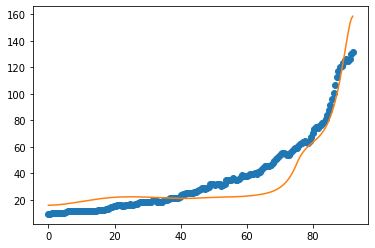

after perturb [7.117936556143513, 110.77137760564989, 22974.597705157525, 0.006394563212724247, -4.629912205212177]
parameters [7.117936556143513, 110.77137760564989, 22974.597705157525, 0.006394563212724247, -4.629912205212177]
after perturb [-2.513870456500264, 7.157115170066895, 21660.1375939089, -0.15367767027993573, 24.78809156738702]
parameters [-2.513870456500264, 7.157115170066895, 21660.1375939089, -0.15367767027993573, 24.78809156738702]
after perturb [-0.08760642639458194, 64.96034119641125, 25665.534318316222, 0.18538257461208862, 35.2596526987567]
parameters [-0.08760642639458194, 64.96034119641125, 25665.534318316222, 0.18538257461208862, 35.2596526987567]
after perturb [7.085297047949154, 163.38424255284926, 26861.924673897105, 0.5728924424051176, 23.498254487188674]
parameters [7.085297047949154, 163.38424255284926, 26861.924673897105, 0.5728924424051176, 23.498254487188674]
after perturb [-1.9168609067841516, 134.49362766933265, 25243.28500900793, 0.9129906323001324, 5

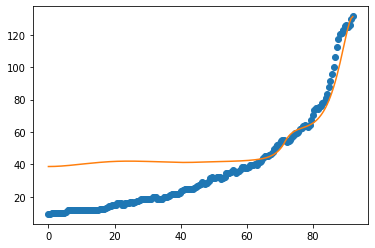

after perturb [4.766898799499535, 76.73494464403429, 23713.53391557376, 0.5559174231135633, 33.060060145476804]
parameters [4.766898799499535, 76.73494464403429, 23713.53391557376, 0.5559174231135633, 33.060060145476804]
oxigeno [1.05912919e-11 1.06025774e-11 1.06370281e-11 1.06964357e-11
 1.07838210e-11 1.09034865e-11 1.10610928e-11 1.12637624e-11
 1.15202131e-11 1.18409271e-11 1.22383606e-11 1.27271999e-11
 1.33246733e-11 1.40509266e-11 1.49294739e-11 1.59877357e-11
 1.72576787e-11 1.87765758e-11 2.05879045e-11 2.27424102e-11
 2.52993584e-11 2.83280127e-11 3.19093735e-11 3.61382243e-11
 4.11255377e-11 4.70013030e-11 5.39178470e-11 6.20537340e-11
 7.16183412e-11 8.28572266e-11 9.60584215e-11 1.11559804e-10
 1.29757736e-10 1.51117168e-10 1.76183465e-10 2.05596225e-10
 2.40105431e-10 2.80590303e-10 3.28081300e-10 3.83785778e-10
 4.49117899e-10 5.25733468e-10 6.15570509e-10 7.20896482e-10
 8.44363228e-10 9.89070873e-10 1.15864214e-09 1.35730871e-09
 1.59001165e-09 1.86251805e-09 2.181556

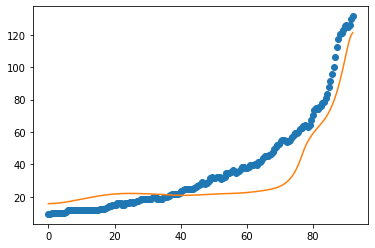

after perturb [5.988771584301094, 105.46201671197042, 25192.38109604243, 0.9166418747365337, 37.306476416314005]
parameters [5.988771584301094, 105.46201671197042, 25192.38109604243, 0.9166418747365337, 37.306476416314005]
oxigeno [3.98434939e-13 4.03058739e-13 4.17038025e-13 4.40699233e-13
 4.74595786e-13 5.19522409e-13 5.76535712e-13 6.46981599e-13
 7.32530270e-13 8.35219750e-13 9.57509161e-13 1.10234318e-12
 1.27322949e-12 1.47433130e-12 1.71057753e-12 1.98779377e-12
 2.31285743e-12 2.69388165e-12 3.14043290e-12 3.66378830e-12
 4.27723993e-12 4.99645447e-12 5.83989813e-12 6.82933871e-12
 7.99043863e-12 9.35345527e-12 1.09540678e-11 1.28343534e-11
 1.50439390e-11 1.76413604e-11 2.06956654e-11 2.42883030e-11
 2.85153514e-11 3.34901415e-11 3.93463473e-11 4.62416228e-11
 5.43618818e-11 6.39263308e-11 7.51933854e-11 8.84676217e-11
 1.04107941e-10 1.22537154e-10 1.44253230e-10 1.69842489e-10
 1.99995072e-10 2.35523076e-10 2.77381800e-10 3.26694636e-10
 3.84782205e-10 4.53196475e-10 5.3376

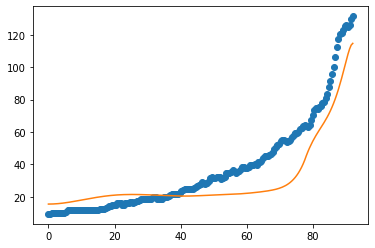

after perturb [10.894505170639942, 116.47995235576032, 17822.345741706653, -0.018762282269499497, 32.00682644663869]
parameters [10.894505170639942, 116.47995235576032, 17822.345741706653, -0.018762282269499497, 32.00682644663869]
after perturb [10.695019852435287, 43.03925094616179, 31222.690180487712, 0.3436177240583658, 21.580730326040925]
parameters [10.695019852435287, 43.03925094616179, 31222.690180487712, 0.3436177240583658, 21.580730326040925]
after perturb [6.176209653123825, 122.06140310101615, 27628.176860394753, 1.2494710062900718, 56.57635774088672]
parameters [6.176209653123825, 122.06140310101615, 27628.176860394753, 1.2494710062900718, 56.57635774088672]
after perturb [8.96958559558158, 182.65154660644876, 28106.59793663238, 0.606563529175317, 13.3911237904056]
parameters [8.96958559558158, 182.65154660644876, 28106.59793663238, 0.606563529175317, 13.3911237904056]
after perturb [3.7435509766297286, 85.88703866899401, 26368.845064861987, 0.5357007548470438, 44.151486473

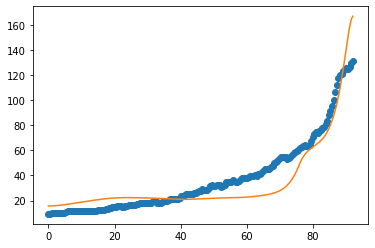

after perturb [-1.8133001721799555, 45.692528751055065, 21909.21912166476, 1.1624333328022418, 93.50039034158735]
parameters [-1.8133001721799555, 45.692528751055065, 21909.21912166476, 1.1624333328022418, 93.50039034158735]
after perturb [-0.8812314476083332, 43.98411616357913, 18182.766323452044, 0.6629921727418542, 43.46584705867717]
parameters [-0.8812314476083332, 43.98411616357913, 18182.766323452044, 0.6629921727418542, 43.46584705867717]
after perturb [-0.2878484131883221, 187.14915619154192, 22156.534921138697, 0.8497180115084494, 39.20347322854559]
parameters [-0.2878484131883221, 187.14915619154192, 22156.534921138697, 0.8497180115084494, 39.20347322854559]
after perturb [6.73458715439828, 66.76194240615848, 24658.41861625882, 0.9767349469292169, 56.27148279428911]
parameters [6.73458715439828, 66.76194240615848, 24658.41861625882, 0.9767349469292169, 56.27148279428911]
after perturb [-1.78398183634833, 105.08444377801071, 25906.334884463802, 0.40913908784162556, 35.03800825

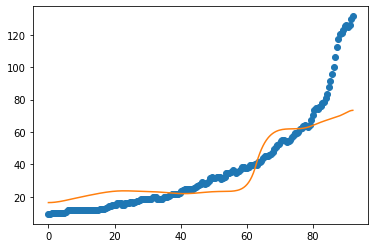

after perturb [0.09207728872421805, 86.44847332047006, 22046.714626928107, 0.6083002158867554, 45.870487519240044]
parameters [0.09207728872421805, 86.44847332047006, 22046.714626928107, 0.6083002158867554, 45.870487519240044]
oxigeno [5.86383006e-12 5.89254933e-12 5.98122110e-12 6.13641788e-12
 6.36716788e-12 6.68388005e-12 7.09746678e-12 7.61921171e-12
 8.26133109e-12 9.03746078e-12 9.96270293e-12 1.10538653e-11
 1.23313426e-11 1.38226935e-11 1.55657417e-11 1.76093756e-11
 2.00124726e-11 2.28408888e-11 2.61643489e-11 3.00571483e-11
 3.46022288e-11 3.98953647e-11 4.60470871e-11 5.31826198e-11
 6.14417069e-11 7.09852581e-11 8.20152135e-11 9.48037081e-11
 1.09713565e-10 1.27197514e-10 1.47780794e-10 1.72023689e-10
 2.00485403e-10 2.33730711e-10 2.72393996e-10 3.17284986e-10
 3.69442428e-10 4.30121085e-10 5.00767777e-10 5.83065327e-10
 6.79033712e-10 7.91186288e-10 9.22660673e-10 1.07725403e-09
 1.25936419e-09 1.47382857e-09 1.72575241e-09 2.02041833e-09
 2.36345208e-09 2.76148765e-09 3.

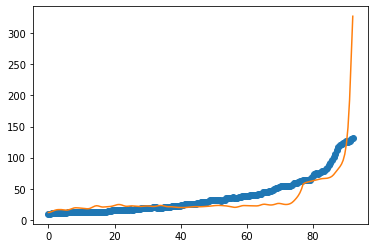

after perturb [6.641856129586927, 27.708774288985403, 17363.851312661736, -0.407251112274943, -9.562035714812575]
parameters [6.641856129586927, 27.708774288985403, 17363.851312661736, -0.407251112274943, -9.562035714812575]
after perturb [4.307484865003575, 121.97351605384662, 19919.282683191876, 0.7040333700833314, 17.680620267702594]
parameters [4.307484865003575, 121.97351605384662, 19919.282683191876, 0.7040333700833314, 17.680620267702594]
after perturb [2.5674006336264164, 66.46393218923156, 21624.039569481032, 1.1125623381847167, 65.35571950268694]
parameters [2.5674006336264164, 66.46393218923156, 21624.039569481032, 1.1125623381847167, 65.35571950268694]
after perturb [8.391587215488103, 104.5950300022766, 21337.098292952003, 0.09144254018189513, -2.0607199727126178]
parameters [8.391587215488103, 104.5950300022766, 21337.098292952003, 0.09144254018189513, -2.0607199727126178]
after perturb [10.347353417047945, 101.42390619686908, 25860.65295792062, 0.9431109440987384, 38.189

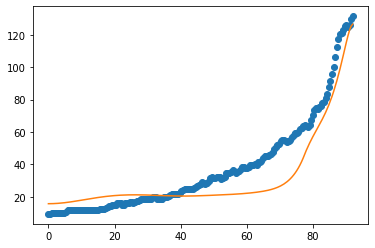

after perturb [2.9818425587789354, 59.21299208376439, 21527.690256960657, 1.0875638593795793, 72.4162355811038]
parameters [2.9818425587789354, 59.21299208376439, 21527.690256960657, 1.0875638593795793, 72.4162355811038]
after perturb [3.460249079159219, 35.923910749733004, 27634.896663785144, 0.6399483385291389, 57.77657317029099]
parameters [3.460249079159219, 35.923910749733004, 27634.896663785144, 0.6399483385291389, 57.77657317029099]
after perturb [-1.417435999443044, 133.2969929681746, 19348.026946014455, 0.8771257469187277, 54.006209771769754]
parameters [-1.417435999443044, 133.2969929681746, 19348.026946014455, 0.8771257469187277, 54.006209771769754]
after perturb [1.5382740846531213, 135.19315362825338, 28201.830595000898, 0.675335240100442, 48.38988505161696]
parameters [1.5382740846531213, 135.19315362825338, 28201.830595000898, 0.675335240100442, 48.38988505161696]
oxigeno [4.99566838e-10 5.02666394e-10 5.12008704e-10 5.27725383e-10
 5.50038072e-10 5.79261909e-10 6.158104

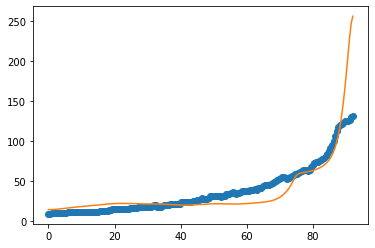

after perturb [3.5761323909854887, 151.59205537725015, 22612.34172236832, 1.0009357420611695, 51.83692264071942]
parameters [3.5761323909854887, 151.59205537725015, 22612.34172236832, 1.0009357420611695, 51.83692264071942]
after perturb [4.48417959152691, 190.25630411805216, 32272.772693576444, 0.5755718621724977, 19.295209878384945]
parameters [4.48417959152691, 190.25630411805216, 32272.772693576444, 0.5755718621724977, 19.295209878384945]
after perturb [6.838641008690714, 85.50940040423549, 21873.96299363815, -0.02766827088190943, -11.557862556407315]
parameters [6.838641008690714, 85.50940040423549, 21873.96299363815, -0.02766827088190943, -11.557862556407315]
after perturb [1.9240662137647426, 130.4267457277374, 29087.54396221745, -0.19001815670247302, -23.072168879063994]
parameters [1.9240662137647426, 130.4267457277374, 29087.54396221745, -0.19001815670247302, -23.072168879063994]
after perturb [6.52949682477732, 142.1433127025403, 27185.747889243776, 0.9816458614083149, 47.492

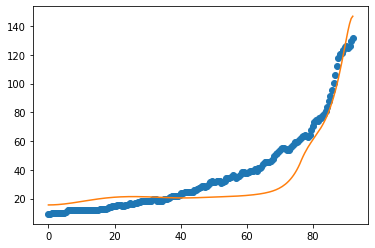

after perturb [-0.9977382022211261, 82.41650067962357, 22953.067838828734, -0.06408161445037341, 9.91279612990241]
parameters [-0.9977382022211261, 82.41650067962357, 22953.067838828734, -0.06408161445037341, 9.91279612990241]
after perturb [1.0002276608280667, 40.06878177529765, 22872.671938380092, -0.13802540835605392, 22.442553412963175]
parameters [1.0002276608280667, 40.06878177529765, 22872.671938380092, -0.13802540835605392, 22.442553412963175]
after perturb [10.51816205407844, 112.67928981866994, 16527.628620646083, 0.5123902224676711, 11.38663069570633]
parameters [10.51816205407844, 112.67928981866994, 16527.628620646083, 0.5123902224676711, 11.38663069570633]
after perturb [6.4120221705966856, 157.61866346146596, 25157.21020969438, 1.070324951328599, 44.12050086201064]
parameters [6.4120221705966856, 157.61866346146596, 25157.21020969438, 1.070324951328599, 44.12050086201064]
after perturb [1.7887501192769215, 94.41671634219358, 22508.751842213806, 0.8550318275435098, 60.700

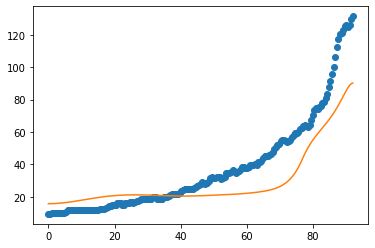

after perturb [14.4198388916454, 84.03954657859906, 25977.114328642972, 0.8642209886881617, 34.63216808124909]
parameters [14.4198388916454, 84.03954657859906, 25977.114328642972, 0.8642209886881617, 34.63216808124909]
after perturb [4.234251816449522, 102.27865727599122, 27950.653972731172, -0.09322792857074866, -11.29110792148236]
parameters [4.234251816449522, 102.27865727599122, 27950.653972731172, -0.09322792857074866, -11.29110792148236]
after perturb [10.895825908454361, 75.94124640843515, 33153.49916385034, 0.2531719478940515, 7.045423749621204]
parameters [10.895825908454361, 75.94124640843515, 33153.49916385034, 0.2531719478940515, 7.045423749621204]
after perturb [0.6642637562481943, 82.59751439799676, 22341.80968637371, 0.7657975843000042, 57.15092628317026]
parameters [0.6642637562481943, 82.59751439799676, 22341.80968637371, 0.7657975843000042, 57.15092628317026]
after perturb [8.52244745775208, 113.15753155330779, 22949.852015049408, 1.2853118782472237, 64.25157139300273

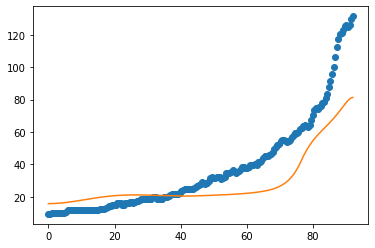

after perturb [1.9304471475812952, 69.65021990233545, 26244.74878943083, -0.054171022661185536, 6.917353651260866]
parameters [1.9304471475812952, 69.65021990233545, 26244.74878943083, -0.054171022661185536, 6.917353651260866]
after perturb [6.847200942608408, 29.99307557440678, 23570.61916917262, -0.05432418243254922, 0.4886758585920816]
parameters [6.847200942608408, 29.99307557440678, 23570.61916917262, -0.05432418243254922, 0.4886758585920816]
after perturb [10.578248283633316, -14.154633007006424, 27757.032117740724, 0.39845733645014314, 53.84703466466439]
parameters [10.578248283633316, -14.154633007006424, 27757.032117740724, 0.39845733645014314, 53.84703466466439]
after perturb [6.69735514807139, 68.52334608529321, 22454.02204824499, 0.2612432958793589, 30.013154185774273]
parameters [6.69735514807139, 68.52334608529321, 22454.02204824499, 0.2612432958793589, 30.013154185774273]
oxigeno [1.53972294e-06 1.53852039e-06 1.53492109e-06 1.52895002e-06
 1.52064838e-06 1.51007308e-06 

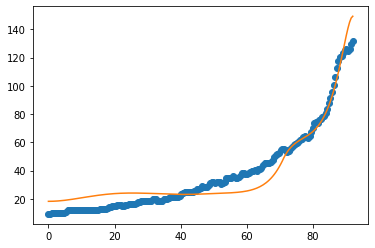

2
after perturb [9.724793253571857, 72.23006832984235, 25470.172516747185, 0.9593002005477717, 41.707177166221534]
parameters [9.724793253571857, 72.23006832984235, 25470.172516747185, 0.9593002005477717, 41.707177166221534]
oxigeno [1.88890660e-16 1.92568194e-16 2.03743204e-16 2.22848610e-16
 2.50625194e-16 2.88151316e-16 3.36886264e-16 3.98729052e-16
 4.76095153e-16 5.72014422e-16 6.90254351e-16 8.35473897e-16
 1.01341444e-15 1.23113601e-15 1.49730889e-15 1.82257311e-15
 2.21998122e-15 2.70554345e-15 3.29889872e-15 4.02414039e-15
 4.91083244e-15 5.99526007e-15 7.32196862e-15 8.94565749e-15
 1.09335109e-14 1.33680664e-14 1.63507447e-14 2.00061939e-14
 2.44876346e-14 2.99834371e-14 3.67252124e-14 4.49977658e-14
 5.51513382e-14 6.76166583e-14 8.29234488e-14 1.01723172e-13
 1.24816977e-13 1.53190040e-13 1.88053723e-13 2.30897346e-13
 2.83551717e-13 3.48267078e-13 4.27808704e-13 5.25574093e-13
 6.45736591e-13 7.93421327e-13 9.74920649e-13 1.19795782e-12
 1.47200964e-12 1.80870103e-12 2.22

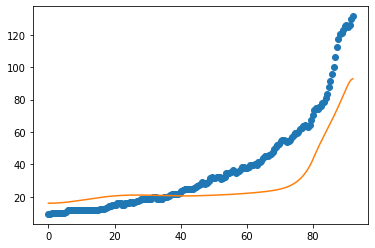

after perturb [13.74014227772708, 193.12422247565797, 28549.718225367324, 1.3123314605482121, 41.827420981656445]
parameters [13.74014227772708, 193.12422247565797, 28549.718225367324, 1.3123314605482121, 41.827420981656445]
after perturb [2.9528000433520916, 37.98712745510842, 27685.03571308092, -0.5164480034000755, -21.571404499226627]
parameters [2.9528000433520916, 37.98712745510842, 27685.03571308092, -0.5164480034000755, -21.571404499226627]
after perturb [10.921614882878877, 108.30211224597625, 26936.091121666108, 0.7847830984100135, 58.03485859415478]
parameters [10.921614882878877, 108.30211224597625, 26936.091121666108, 0.7847830984100135, 58.03485859415478]
after perturb [10.20646661680902, 33.48842678188272, 20453.65139863167, -0.1003131497209625, 23.252624112218793]
parameters [10.20646661680902, 33.48842678188272, 20453.65139863167, -0.1003131497209625, 23.252624112218793]
after perturb [7.649823303471772, -5.700801852585883, 22877.25296354167, 0.006083504875644102, 29.78

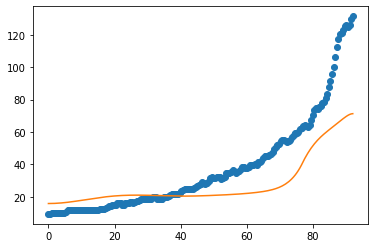

after perturb [5.666853665992564, 126.87329656494107, 21830.979192843304, 0.09248479009069126, -9.911885911879368]
parameters [5.666853665992564, 126.87329656494107, 21830.979192843304, 0.09248479009069126, -9.911885911879368]
after perturb [0.9262970985969974, 111.3025609442547, 22058.037032164666, 0.6532059347320818, 40.33816965372195]
parameters [0.9262970985969974, 111.3025609442547, 22058.037032164666, 0.6532059347320818, 40.33816965372195]
oxigeno [6.33054361e-11 6.37819780e-11 6.52202393e-11 6.76462166e-11
 7.11035466e-11 7.56540057e-11 8.13782876e-11 8.83771427e-11
 9.67729904e-11 1.06712121e-10 1.18367587e-10 1.31942849e-10
 1.47676158e-10 1.65845596e-10 1.86774650e-10 2.10838190e-10
 2.38468793e-10 2.70163515e-10 3.06491431e-10 3.48102489e-10
 3.95738437e-10 4.50246711e-10 5.12598120e-10 5.83908975e-10
 6.65467912e-10 7.58767179e-10 8.65537698e-10 9.87786955e-10
 1.12783887e-09 1.28837543e-09 1.47248095e-09 1.68369113e-09
 1.92605073e-09 2.20418438e-09 2.52338574e-09 2.889729

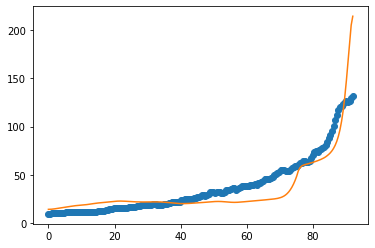

after perturb [6.222977030734692, 130.48011927273583, 21751.675961864054, -0.21605319286911195, -12.577937914965473]
parameters [6.222977030734692, 130.48011927273583, 21751.675961864054, -0.21605319286911195, -12.577937914965473]
after perturb [-0.3898170677871273, 112.38986551159353, 21220.26420417451, 1.3158270830172518, 60.98846122966418]
parameters [-0.3898170677871273, 112.38986551159353, 21220.26420417451, 1.3158270830172518, 60.98846122966418]
after perturb [-0.3078223216623024, 121.07564367313975, 22954.88325385918, 0.7431858997700199, 32.707579141224585]
parameters [-0.3078223216623024, 121.07564367313975, 22954.88325385918, 0.7431858997700199, 32.707579141224585]
after perturb [0.8339734733249666, 90.72753444186299, 20509.490459023975, 0.9740114747482608, 49.07242114458949]
parameters [0.8339734733249666, 90.72753444186299, 20509.490459023975, 0.9740114747482608, 49.07242114458949]
oxigeno [1.23551410e-14 1.25211591e-14 1.30242369e-14 1.38795966e-14
 1.51131115e-14 1.6762064

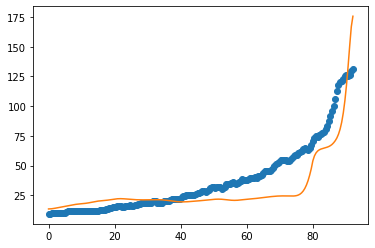

after perturb [3.5437686690263477, 112.61137161460567, 25757.237067561135, -0.187301512855373, -0.05804126293194756]
parameters [3.5437686690263477, 112.61137161460567, 25757.237067561135, -0.187301512855373, -0.05804126293194756]
after perturb [4.023897158353407, 71.97974387225932, 21384.560284600546, 1.8829453407592118, 106.65774477186862]
parameters [4.023897158353407, 71.97974387225932, 21384.560284600546, 1.8829453407592118, 106.65774477186862]
after perturb [11.466508903743794, 72.87799003225886, 29240.0146360807, 0.048155910779116184, 5.138156492788664]
parameters [11.466508903743794, 72.87799003225886, 29240.0146360807, 0.048155910779116184, 5.138156492788664]
after perturb [4.937990162617199, 147.0873828149124, 26652.573026527214, 1.1540629125752146, 38.27100691173931]
parameters [4.937990162617199, 147.0873828149124, 26652.573026527214, 1.1540629125752146, 38.27100691173931]
oxigeno [3.10701383e-12 3.13624817e-12 3.22451443e-12 3.37351498e-12
 3.58612959e-12 3.86648020e-12 4.

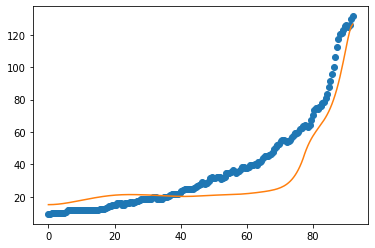

after perturb [10.221999546651814, 179.71815635394793, 30763.756174224538, 0.21399860263763065, -23.0434514880302]
parameters [10.221999546651814, 179.71815635394793, 30763.756174224538, 0.21399860263763065, -23.0434514880302]
after perturb [7.407363505793091, 219.90446433793187, 23188.741369467498, 1.618488878253034, 65.812685870333]
parameters [7.407363505793091, 219.90446433793187, 23188.741369467498, 1.618488878253034, 65.812685870333]
after perturb [1.8744222094833318, 47.04387957907232, 22483.651025117182, 0.6327602332235717, 86.89613002524119]
parameters [1.8744222094833318, 47.04387957907232, 22483.651025117182, 0.6327602332235717, 86.89613002524119]
after perturb [-3.5937812722375773, -12.929839198312148, 28748.954426145476, -0.6032625695115912, 19.246675727598664]
parameters [-3.5937812722375773, -12.929839198312148, 28748.954426145476, -0.6032625695115912, 19.246675727598664]
after perturb [5.162478853725596, 63.45275644112403, 23599.06832921769, 0.06168548832222348, 17.8556

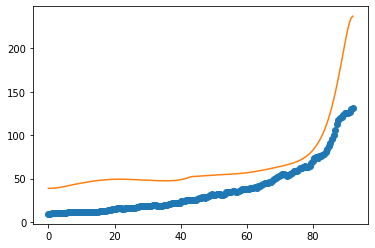

after perturb [10.313306233735256, 100.28373693946985, 26189.619460488517, 0.021045005148559476, -2.315245736600609]
parameters [10.313306233735256, 100.28373693946985, 26189.619460488517, 0.021045005148559476, -2.315245736600609]
after perturb [2.6180097701181575, 66.11972097639887, 24002.873426027414, -0.12641181537110813, 6.941072902421641]
parameters [2.6180097701181575, 66.11972097639887, 24002.873426027414, -0.12641181537110813, 6.941072902421641]
after perturb [3.252432127566525, 76.27032146348591, 17927.99939822203, 1.1120134419054628, 44.71954881380074]
parameters [3.252432127566525, 76.27032146348591, 17927.99939822203, 1.1120134419054628, 44.71954881380074]
after perturb [8.00194793911848, 102.68961447160481, 29720.279260592837, 0.8727190863807378, 46.67979511298512]
parameters [8.00194793911848, 102.68961447160481, 29720.279260592837, 0.8727190863807378, 46.67979511298512]
after perturb [6.791891873849589, 72.35602246964349, 25499.449794396845, -0.36883660282649433, -9.9468

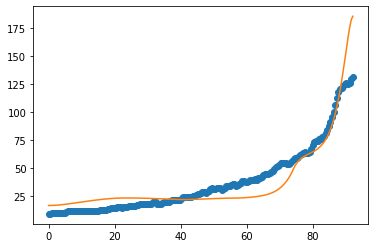

after perturb [11.980157766134536, 123.09085591080824, 25925.932065987363, 0.9485720204313509, 41.71775508291619]
parameters [11.980157766134536, 123.09085591080824, 25925.932065987363, 0.9485720204313509, 41.71775508291619]
after perturb [3.9532000830038228, 125.19980465848555, 27770.464463582604, 0.34360423743478286, 28.748886103579167]
parameters [3.9532000830038228, 125.19980465848555, 27770.464463582604, 0.34360423743478286, 28.748886103579167]
oxigeno [1.58036879e-07 1.58497608e-07 1.59884154e-07 1.62209646e-07
 1.65496098e-07 1.69774620e-07 1.75085706e-07 1.81479618e-07
 1.89016855e-07 1.97768715e-07 2.07817971e-07 2.19259639e-07
 2.32201873e-07 2.46766979e-07 2.63092568e-07 2.81332855e-07
 3.01660115e-07 3.24266326e-07 3.49364998e-07 3.77193213e-07
 4.08013908e-07 4.42118406e-07 4.79829232e-07 5.21503231e-07
 5.67535029e-07 6.18360853e-07 6.74462749e-07 7.36373237e-07
 8.04680421e-07 8.80033617e-07 9.63149520e-07 1.05481895e-06
 1.15591426e-06 1.26739735e-06 1.39032853e-06 1.52

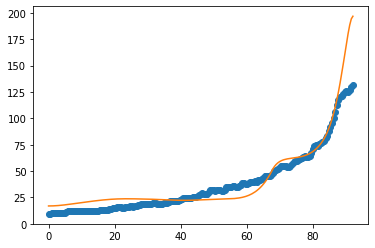

after perturb [13.983400147921088, 90.8019358715282, 21784.064004658554, 0.624916101020505, 24.988792591805563]
parameters [13.983400147921088, 90.8019358715282, 21784.064004658554, 0.624916101020505, 24.988792591805563]
after perturb [6.351910526337878, 136.90658544802773, 30813.157796261472, -0.012854134504174275, -21.608008248518168]
parameters [6.351910526337878, 136.90658544802773, 30813.157796261472, -0.012854134504174275, -21.608008248518168]
after perturb [9.23707176548368, 75.47561598825085, 26797.816851954023, 0.12324465420441649, 31.742270120021477]
parameters [9.23707176548368, 75.47561598825085, 26797.816851954023, 0.12324465420441649, 31.742270120021477]
oxigeno [8.83971141e-04 8.83580771e-04 8.82411705e-04 8.80470056e-04
 8.77765941e-04 8.74313385e-04 8.70130179e-04 8.65237705e-04
 8.59660735e-04 8.53427196e-04 8.46567913e-04 8.39116333e-04
 8.31108236e-04 8.22581438e-04 8.13575485e-04 8.04131349e-04
 7.94291130e-04 7.84097766e-04 7.73594751e-04 7.62825876e-04
 7.5183497

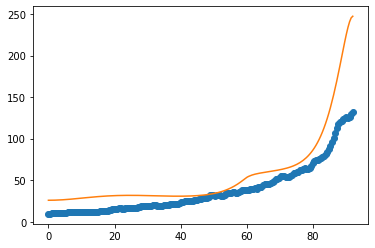

after perturb [16.39058280184408, 224.4002936255223, 21571.416767519586, 0.20499493584397138, -25.719165318797643]
parameters [16.39058280184408, 224.4002936255223, 21571.416767519586, 0.20499493584397138, -25.719165318797643]
after perturb [8.968990026735923, 34.584553951176, 26657.804499095222, 0.4797991569515866, 47.12333014583602]
parameters [8.968990026735923, 34.584553951176, 26657.804499095222, 0.4797991569515866, 47.12333014583602]
oxigeno [2.62470650e-10 2.62056726e-10 2.60819426e-10 2.58772083e-10
 2.55936616e-10 2.52343092e-10 2.48029126e-10 2.43039148e-10
 2.37423550e-10 2.31237745e-10 2.24541164e-10 2.17396213e-10
 2.09867230e-10 2.02019447e-10 1.93918011e-10 1.85627054e-10
 1.77208847e-10 1.68723057e-10 1.60226096e-10 1.51770586e-10
 1.43404940e-10 1.35173050e-10 1.27114082e-10 1.19262381e-10
 1.11647455e-10 1.04294057e-10 9.72223304e-11 9.04480147e-11
 8.39827072e-11 7.78341577e-11 7.20065924e-11 6.65010556e-11
 6.13157605e-11 5.64464406e-11 5.18866955e-11 4.76283261e-11

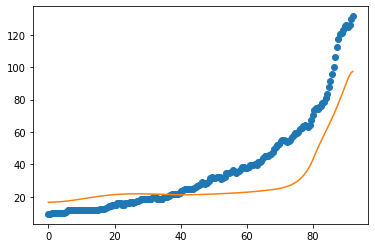

after perturb [-0.26772567621783505, 39.8375213131255, 24281.024471353103, 0.7655767004502607, 57.41247895726007]
parameters [-0.26772567621783505, 39.8375213131255, 24281.024471353103, 0.7655767004502607, 57.41247895726007]
after perturb [5.610706588400783, 144.05853081525856, 26197.321021106723, 0.7150469898849394, 29.658357740581433]
parameters [5.610706588400783, 144.05853081525856, 26197.321021106723, 0.7150469898849394, 29.658357740581433]
oxigeno [6.51228718e-10 6.55432463e-10 6.68099337e-10 6.89397132e-10
 7.19608446e-10 7.59135141e-10 8.08504684e-10 8.68378457e-10
 9.39562160e-10 1.02301848e-09 1.11988220e-09 1.23147801e-09
 1.35934121e-09 1.50524182e-09 1.67121222e-09 1.85957895e-09
 2.07299913e-09 2.31450201e-09 2.58753639e-09 2.89602460e-09
 3.24442399e-09 3.63779678e-09 4.08188947e-09 4.58322294e-09
 5.14919480e-09 5.78819542e-09 6.50973942e-09 7.32461471e-09
 8.24505119e-09 9.28491161e-09 1.04599075e-08 1.17878429e-08
 1.32888903e-08 1.49859009e-08 1.69047559e-08 1.907476

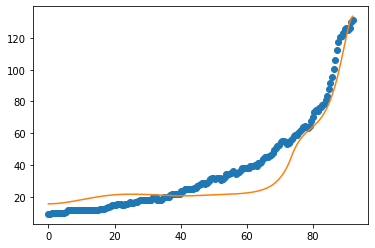

3
after perturb [5.928362797847179, 153.03727326845217, 22588.21883990487, 0.7105759767782392, 25.886232406999987]
parameters [5.928362797847179, 153.03727326845217, 22588.21883990487, 0.7105759767782392, 25.886232406999987]
after perturb [15.654314753931223, 156.51865934827623, 32491.22709477272, 0.3927576829750907, 22.677698187045415]
parameters [15.654314753931223, 156.51865934827623, 32491.22709477272, 0.3927576829750907, 22.677698187045415]
after perturb [9.038455628762986, 72.6283598611111, 25633.450844563566, 0.058468687554968174, -4.255642540371582]
parameters [9.038455628762986, 72.6283598611111, 25633.450844563566, 0.058468687554968174, -4.255642540371582]
after perturb [3.5595635327693382, 170.66568197523512, 23700.29835748941, 1.1080048903097046, 49.7921005939914]
parameters [3.5595635327693382, 170.66568197523512, 23700.29835748941, 1.1080048903097046, 49.7921005939914]
after perturb [0.20147126449008956, 122.24513591224283, 19131.258055197883, 1.0122886187782485, 40.83046

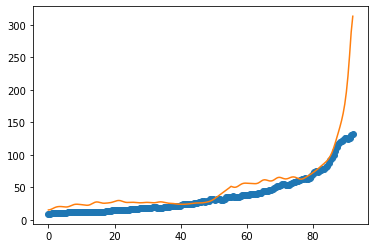

after perturb [3.9841678744580387, 103.52427476614324, 22041.020049979794, 0.1795545719181909, 14.547931604522876]
parameters [3.9841678744580387, 103.52427476614324, 22041.020049979794, 0.1795545719181909, 14.547931604522876]
oxigeno [4.40787412e-05 4.40644594e-05 4.40218080e-05 4.39513662e-05
 4.38540923e-05 4.37313135e-05 4.35847121e-05 4.34163091e-05
 4.32284458e-05 4.30237638e-05 4.28051853e-05 4.25758932e-05
 4.23393131e-05 4.20990968e-05 4.18591085e-05 4.16234147e-05
 4.13962765e-05 4.11821467e-05 4.09856699e-05 4.08116873e-05
 4.06652445e-05 4.05516040e-05 4.04762608e-05 4.04449613e-05
 4.04637268e-05 4.05388788e-05 4.06770685e-05 4.08853094e-05
 4.11710128e-05 4.15420267e-05 4.20066781e-05 4.25738183e-05
 4.32528723e-05 4.40538914e-05 4.49876100e-05 4.60655060e-05
 4.72998657e-05 4.87038538e-05 5.02915865e-05 5.20782118e-05
 5.40799933e-05 5.63144010e-05 5.88002077e-05 6.15575926e-05
 6.46082521e-05 6.79755188e-05 7.16844889e-05 7.57621601e-05
 8.02375794e-05 8.51420027e-05 9.

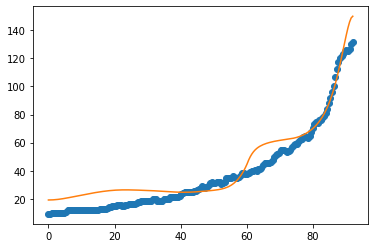

4
after perturb [11.513328752128345, 69.4673979376749, 27552.892367098237, 0.8525508184816524, 44.53945762939361]
parameters [11.513328752128345, 69.4673979376749, 27552.892367098237, 0.8525508184816524, 44.53945762939361]
after perturb [1.8996583569168424, 75.60756408221087, 21932.933148366123, -0.4996705470989695, -29.739437583334276]
parameters [1.8996583569168424, 75.60756408221087, 21932.933148366123, -0.4996705470989695, -29.739437583334276]
after perturb [1.1180457764334326, 80.88637132781892, 20711.640915074782, 0.24566486848351754, 33.70113989395321]
parameters [1.1180457764334326, 80.88637132781892, 20711.640915074782, 0.24566486848351754, 33.70113989395321]
oxigeno [3.83027325e-06 3.82671616e-06 3.81610388e-06 3.79860872e-06
 3.77450339e-06 3.74414216e-06 3.70793953e-06 3.66634992e-06
 3.61985082e-06 3.56893082e-06 3.51408233e-06 3.45579769e-06
 3.39456675e-06 3.33087427e-06 3.26519589e-06 3.19799286e-06
 3.12970599e-06 3.06075069e-06 2.99151433e-06 2.92235728e-06
 2.8536178

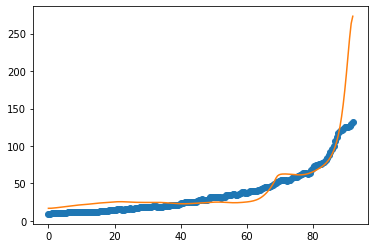

after perturb [2.502883645172669, 156.6743756174485, 18714.79958384866, 0.18441332763499776, -6.955681491272339]
parameters [2.502883645172669, 156.6743756174485, 18714.79958384866, 0.18441332763499776, -6.955681491272339]
after perturb [10.345054434004323, 53.983933312654585, 26753.343813051146, -0.07400180311449323, -8.086808505878409]
parameters [10.345054434004323, 53.983933312654585, 26753.343813051146, -0.07400180311449323, -8.086808505878409]
after perturb [6.448615058896705, 76.73172620721726, 30063.819526646326, 0.6425979873229455, 29.80985238683607]
parameters [6.448615058896705, 76.73172620721726, 30063.819526646326, 0.6425979873229455, 29.80985238683607]
after perturb [8.420181743827019, 204.07834727778894, 24182.194779231908, 0.7020665939578055, 19.063067164849716]
parameters [8.420181743827019, 204.07834727778894, 24182.194779231908, 0.7020665939578055, 19.063067164849716]
after perturb [9.293983470008934, 134.37435987803912, 26145.24565530794, 0.995932317966982, 55.80331

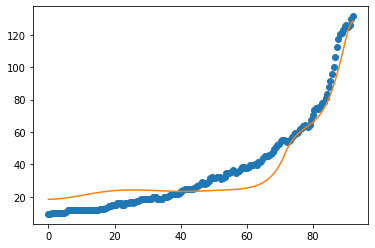

5
after perturb [4.229757724112425, 41.53553473868442, 23386.097849213947, 0.5974811264605984, 68.231346389969]
parameters [4.229757724112425, 41.53553473868442, 23386.097849213947, 0.5974811264605984, 68.231346389969]
after perturb [-4.282854415184831, 60.80109272851439, 21816.201291577137, 0.1040967353752954, 30.036378351490495]
parameters [-4.282854415184831, 60.80109272851439, 21816.201291577137, 0.1040967353752954, 30.036378351490495]
after perturb [3.445081191623934, 100.25823879552244, 20370.398282418122, 1.1811964408141427, 64.52895352381063]
parameters [3.445081191623934, 100.25823879552244, 20370.398282418122, 1.1811964408141427, 64.52895352381063]
after perturb [6.437732203482829, 150.00828635987853, 25874.077122656407, 0.28154053138777746, 19.385843207060542]
parameters [6.437732203482829, 150.00828635987853, 25874.077122656407, 0.28154053138777746, 19.385843207060542]
after perturb [3.738846772130217, 4.3780400298760895, 27246.923219049753, 0.32663070705503905, 31.18912118

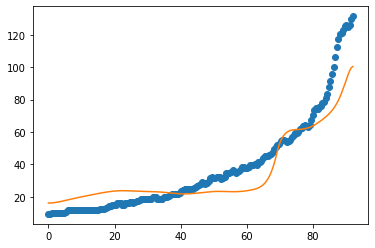

after perturb [8.009829892509021, 167.0473467975912, 22220.805596842874, 1.2341288223234193, 51.995100171892894]
parameters [8.009829892509021, 167.0473467975912, 22220.805596842874, 1.2341288223234193, 51.995100171892894]
after perturb [4.159811412049689, 91.289876771201, 22047.686149034264, 0.2592617917028178, 11.24793489660423]
parameters [4.159811412049689, 91.289876771201, 22047.686149034264, 0.2592617917028178, 11.24793489660423]
oxigeno [1.10594369e-06 1.10541007e-06 1.10381678e-06 1.10118655e-06
 1.09755701e-06 1.09298036e-06 1.08752290e-06 1.08126453e-06
 1.07429816e-06 1.06672908e-06 1.05867437e-06 1.05026244e-06
 1.04163246e-06 1.03293415e-06 1.02432754e-06 1.01598294e-06
 1.00808121e-06 1.00081408e-06 9.94384801e-07 9.89009029e-07
 9.84915919e-07 9.82349501e-07 9.81570329e-07 9.82857408e-07
 9.86510408e-07 9.92852207e-07 1.00223175e-06 1.01502725e-06
 1.03164984e-06 1.05254748e-06 1.07820951e-06 1.10917149e-06
 1.14602070e-06 1.18940212e-06 1.24002504e-06 1.29867041e-06
 1.

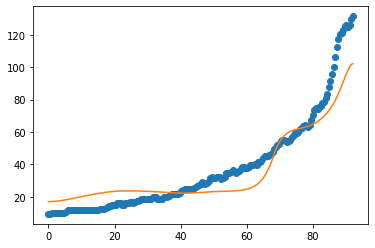

after perturb [-4.527889256735728, -25.48948422090172, 21612.87735239994, -0.5472216056946448, 5.182522750594082]
parameters [-4.527889256735728, -25.48948422090172, 21612.87735239994, -0.5472216056946448, 5.182522750594082]
after perturb [12.625405657460092, 177.72912411040815, 31348.579133248473, 0.2838520427596445, -1.9711140187797387]
parameters [12.625405657460092, 177.72912411040815, 31348.579133248473, 0.2838520427596445, -1.9711140187797387]
after perturb [-0.7191812609488935, 90.20594385815623, 26157.12704818792, -0.4445772046640927, -6.733006669765995]
parameters [-0.7191812609488935, 90.20594385815623, 26157.12704818792, -0.4445772046640927, -6.733006669765995]
after perturb [3.3642062792367824, 104.13508696480832, 21945.176098728538, 0.789911754097647, 44.36254739651746]
parameters [3.3642062792367824, 104.13508696480832, 21945.176098728538, 0.789911754097647, 44.36254739651746]
oxigeno [2.35583186e-12 2.37962499e-12 2.45149658e-12 2.57293518e-12
 2.74646166e-12 2.97569015e

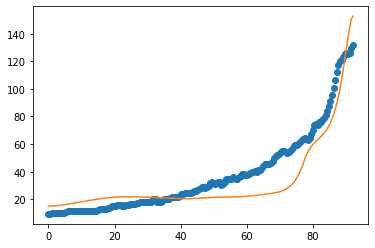

after perturb [2.7348249840767704, 149.57979266276647, 28643.037430569788, 0.7403231183192638, 20.38130970831968]
parameters [2.7348249840767704, 149.57979266276647, 28643.037430569788, 0.7403231183192638, 20.38130970831968]
oxigeno [7.23739410e-10 7.28206581e-10 7.41667242e-10 7.64299818e-10
 7.96404965e-10 8.38410520e-10 8.90878498e-10 9.54514202e-10
 1.03017756e-09 1.11889677e-09 1.22188456e-09 1.34055705e-09
 1.47655580e-09 1.63177306e-09 1.80838094e-09 2.00886474e-09
 2.23606112e-09 2.49320191e-09 2.78396405e-09 3.11252684e-09
 3.48363734e-09 3.90268508e-09 4.37578742e-09 4.90988690e-09
 5.51286212e-09 6.19365405e-09 6.96240950e-09 7.83064412e-09
 8.81142730e-09 9.91959165e-09 1.11719703e-08 1.25876652e-08
 1.41883507e-08 1.59986157e-08 1.80463502e-08 2.03631802e-08
 2.29849564e-08 2.59523029e-08 2.93112322e-08 3.31138320e-08
 3.74190330e-08 4.22934655e-08 4.78124142e-08 5.40608834e-08
 6.11347863e-08 6.91422737e-08 7.82052228e-08 8.84609075e-08
 1.00063877e-07 1.13188072e-07 1.28

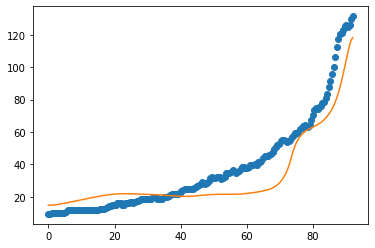

after perturb [9.435815063487047, 200.91385037614305, 24582.11588338008, 1.4886444810483384, 44.162854105583385]
parameters [9.435815063487047, 200.91385037614305, 24582.11588338008, 1.4886444810483384, 44.162854105583385]
after perturb [2.511252119945961, 86.35310664182624, 25153.17835766844, 0.5038586412500623, 49.59194416315746]
parameters [2.511252119945961, 86.35310664182624, 25153.17835766844, 0.5038586412500623, 49.59194416315746]
oxigeno [1.29122390e-10 1.29322597e-10 1.29930148e-10 1.30965909e-10
 1.32464918e-10 1.34476801e-10 1.37066379e-10 1.40314494e-10
 1.44319110e-10 1.49196696e-10 1.55083976e-10 1.62140065e-10
 1.70549079e-10 1.80523256e-10 1.92306692e-10 2.06179752e-10
 2.22464267e-10 2.41529631e-10 2.63799925e-10 2.89762230e-10
 3.19976296e-10 3.55085787e-10 3.95831336e-10 4.43065684e-10
 4.97771210e-10 5.61080234e-10 6.34298472e-10 7.18932156e-10
 8.16719326e-10 9.29665942e-10 1.06008753e-09 1.21065719e-09
 1.38446087e-09 1.58506106e-09 1.81656996e-09 2.08373359e-09
 

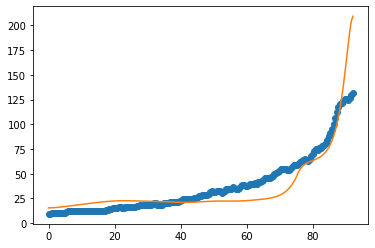

after perturb [3.6577292159522816, 82.39355579814483, 28372.22723242074, -0.5947629925398965, -10.159868452790054]
parameters [3.6577292159522816, 82.39355579814483, 28372.22723242074, -0.5947629925398965, -10.159868452790054]
after perturb [9.996435430160357, 154.04373609851584, 27419.48059153582, 1.3615115491845775, 64.1445698462446]
parameters [9.996435430160357, 154.04373609851584, 27419.48059153582, 1.3615115491845775, 64.1445698462446]
after perturb [1.4753270305255095, 112.28439105605831, 29044.244395133064, 0.08487495325515482, 10.646607448357692]
parameters [1.4753270305255095, 112.28439105605831, 29044.244395133064, 0.08487495325515482, 10.646607448357692]
after perturb [6.040235454834649, 95.42650667601134, 22737.361315419304, 1.281205700098847, 102.59298177999182]
parameters [6.040235454834649, 95.42650667601134, 22737.361315419304, 1.281205700098847, 102.59298177999182]
after perturb [-3.5490085210115385, 38.03856734452524, 20879.69914386697, 0.5363079785349188, 81.3794781

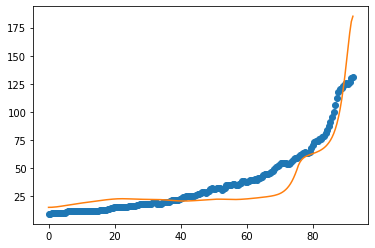

after perturb [1.8145062413524875, 90.48178196509888, 18874.49522265922, 0.34426560482806956, 26.260973962795806]
parameters [1.8145062413524875, 90.48178196509888, 18874.49522265922, 0.34426560482806956, 26.260973962795806]
after perturb [-1.2041103064874585, 78.82550505230553, 22153.98393026191, -0.14602886498736592, 5.299361853123028]
parameters [-1.2041103064874585, 78.82550505230553, 22153.98393026191, -0.14602886498736592, 5.299361853123028]
after perturb [4.819915342222956, 86.38020475196663, 26865.194914287888, 0.39999955322906783, 30.659890635031623]
parameters [4.819915342222956, 86.38020475196663, 26865.194914287888, 0.39999955322906783, 30.659890635031623]
oxigeno [4.85562208e-09 4.85509708e-09 4.85360826e-09 4.85141446e-09
 4.84894810e-09 4.84681698e-09 4.84580690e-09 4.84688553e-09
 4.85120775e-09 4.86012292e-09 4.87518430e-09 4.89816128e-09
 4.93105477e-09 4.97611637e-09 5.03587179e-09 5.11314925e-09
 5.21111346e-09 5.33330585e-09 5.48369201e-09 5.66671704e-09
 5.8873700

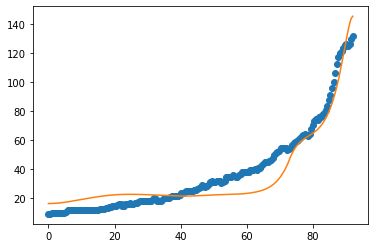

6
after perturb [4.159809204523896, 46.37925662388987, 19663.786990066357, 0.051098132624275594, 9.41288395219582]
parameters [4.159809204523896, 46.37925662388987, 19663.786990066357, 0.051098132624275594, 9.41288395219582]
after perturb [6.10372573973711, 57.76742730041888, 26178.852881812174, 1.3604183337373725, 81.43838766401478]
parameters [6.10372573973711, 57.76742730041888, 26178.852881812174, 1.3604183337373725, 81.43838766401478]
after perturb [1.1052120275333213, 83.24951594775948, 18385.20495093745, 0.5517624472797295, 42.69221289308634]
parameters [1.1052120275333213, 83.24951594775948, 18385.20495093745, 0.5517624472797295, 42.69221289308634]
after perturb [10.78128303816239, 204.0854487495347, 21183.587929851914, 0.9322916034714701, 25.85741183042159]
parameters [10.78128303816239, 204.0854487495347, 21183.587929851914, 0.9322916034714701, 25.85741183042159]
after perturb [10.202800387351552, 90.48474939875864, 28746.906095489096, -0.3285940215388843, -9.255290812192662]

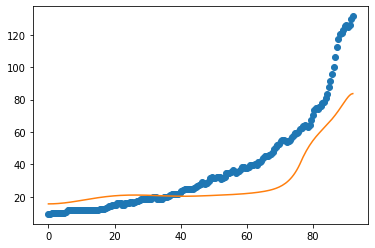

after perturb [8.942012943019279, 64.72636860695943, 26370.78590032481, 0.561508511615989, 38.23019789922326]
parameters [8.942012943019279, 64.72636860695943, 26370.78590032481, 0.561508511615989, 38.23019789922326]
oxigeno [6.02919023e-12 6.02369855e-12 6.00732111e-12 5.98035101e-12
 5.94327760e-12 5.89678800e-12 5.84176964e-12 5.77931429e-12
 5.71072417e-12 5.63752076e-12 5.56145726e-12 5.48453560e-12
 5.40902926e-12 5.33751310e-12 5.27290192e-12 5.21849941e-12
 5.17805964e-12 5.15586352e-12 5.15681307e-12 5.18654683e-12
 5.25158029e-12 5.35947613e-12 5.51904958e-12 5.74061553e-12
 6.03628517e-12 6.42032121e-12 6.90956286e-12 7.52393332e-12
 8.28704555e-12 9.22692451e-12 1.03768679e-11 1.17764710e-11
 1.34728476e-11 1.55220816e-11 1.79909545e-11 2.09589996e-11
 2.45209435e-11 2.87896064e-11 3.38993483e-11 4.00101593e-11
 4.73125151e-11 5.60331365e-11 6.64418202e-11 7.88595351e-11
 9.36680157e-11 1.11321124e-10 1.32358300e-10 1.57420479e-10
 1.87268914e-10 2.22807437e-10 2.65108758e-

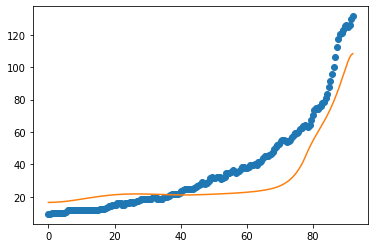

after perturb [12.597725364282464, 101.07765208070671, 24976.148609311535, 0.44050537904339715, 5.1476006406015955]
parameters [12.597725364282464, 101.07765208070671, 24976.148609311535, 0.44050537904339715, 5.1476006406015955]
after perturb [8.37776646257651, 127.9400908797695, 27636.62197297536, 0.23288499192843637, 36.40944539481546]
parameters [8.37776646257651, 127.9400908797695, 27636.62197297536, 0.23288499192843637, 36.40944539481546]
oxigeno [7.37137104e-06 7.37605804e-06 7.39017036e-06 7.41386219e-06
 7.44739110e-06 7.49111899e-06 7.54551343e-06 7.61114939e-06
 7.68871144e-06 7.77899644e-06 7.88291680e-06 8.00150417e-06
 8.13591398e-06 8.28743046e-06 8.45747248e-06 8.64760024e-06
 8.85952273e-06 9.09510622e-06 9.35638362e-06 9.64556507e-06
 9.96504959e-06 1.03174379e-05 1.07055468e-05 1.11324245e-05
 1.16013677e-05 1.21159405e-05 1.26799943e-05 1.32976900e-05
 1.39735215e-05 1.47123422e-05 1.55193922e-05 1.64003284e-05
 1.73612572e-05 1.84087688e-05 1.95499751e-05 2.07925490

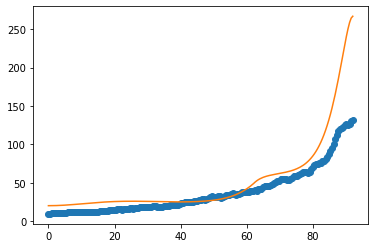

after perturb [5.901771555359902, 60.12421600754726, 22866.70995878499, 0.059858469210413906, -1.5254584090825345]
parameters [5.901771555359902, 60.12421600754726, 22866.70995878499, 0.059858469210413906, -1.5254584090825345]
after perturb [6.121165317065113, 94.84106048848189, 20331.45252287868, 0.5857524200683594, 36.39210861318912]
parameters [6.121165317065113, 94.84106048848189, 20331.45252287868, 0.5857524200683594, 36.39210861318912]
oxigeno [2.61242796e-11 2.63435368e-11 2.70053714e-11 2.81220543e-11
 2.97143129e-11 3.18117513e-11 3.44534504e-11 3.76887611e-11
 4.15783076e-11 4.61952214e-11 5.16266325e-11 5.79754483e-11
 6.53624605e-11 7.39288207e-11 8.38389405e-11 9.52838759e-11
 1.08485268e-10 1.23699922e-10 1.41225127e-10 1.61404816e-10
 1.84636714e-10 2.11380611e-10 2.42167932e-10 2.77612819e-10
 3.18424934e-10 3.65424270e-10 4.19558256e-10 4.81921516e-10
 5.53778679e-10 6.36590705e-10 7.32045248e-10 8.42091664e-10
 9.68981349e-10 1.11531420e-09 1.28409212e-09 1.47878052e-

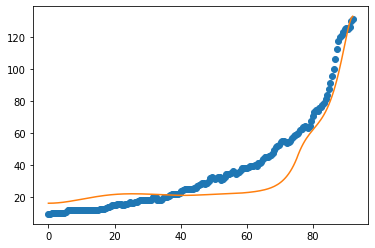

after perturb [3.807701930554428, 194.81602817799143, 16581.182077169855, 0.9305120070619499, 14.939986175990178]
parameters [3.807701930554428, 194.81602817799143, 16581.182077169855, 0.9305120070619499, 14.939986175990178]
after perturb [9.193229395511475, 110.48473743592665, 31861.291589036035, 0.5598555949923167, 20.76857603607762]
parameters [9.193229395511475, 110.48473743592665, 31861.291589036035, 0.5598555949923167, 20.76857603607762]
after perturb [-0.06319662140265958, 111.7898497869705, 21335.404923709317, 0.8597821221594616, 49.20697794975103]
parameters [-0.06319662140265958, 111.7898497869705, 21335.404923709317, 0.8597821221594616, 49.20697794975103]
after perturb [6.309123231237633, 155.80027551539257, 29388.20918631109, 0.49449589024567686, 7.233241767785077]
parameters [6.309123231237633, 155.80027551539257, 29388.20918631109, 0.49449589024567686, 7.233241767785077]
after perturb [11.937242884638897, 132.6060542190292, 24044.09537737133, 0.41225336356426606, 15.02211

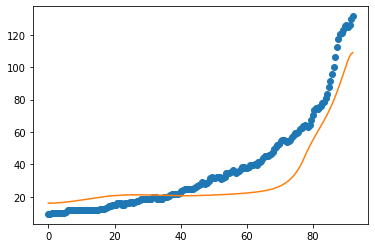

after perturb [5.729846160681065, 105.44305202010064, 22473.16750971993, 0.29643115942619724, 15.335281037641]
parameters [5.729846160681065, 105.44305202010064, 22473.16750971993, 0.29643115942619724, 15.335281037641]
oxigeno [2.90553286e-07 2.90735930e-07 2.91287843e-07 2.92220993e-07
 2.93555397e-07 2.95319236e-07 2.97549011e-07 3.00289765e-07
 3.03595350e-07 3.07528774e-07 3.12162614e-07 3.17579516e-07
 3.23872788e-07 3.31147098e-07 3.39519287e-07 3.49119308e-07
 3.60091309e-07 3.72594868e-07 3.86806406e-07 4.02920777e-07
 4.21153069e-07 4.41740630e-07 4.64945331e-07 4.91056107e-07
 5.20391779e-07 5.53304198e-07 5.90181743e-07 6.31453183e-07
 6.77591965e-07 7.29120942e-07 7.86617597e-07 8.50719795e-07
 9.22132117e-07 1.00163283e-06 1.09008153e-06 1.18842754e-06
 1.29771915e-06 1.41911367e-06 1.55388853e-06 1.70345336e-06
 1.86936327e-06 2.05333335e-06 2.25725452e-06 2.48321089e-06
 2.73349880e-06 3.01064749e-06 3.31744191e-06 3.65694751e-06
 4.03253746e-06 4.44792236e-06 4.90718279

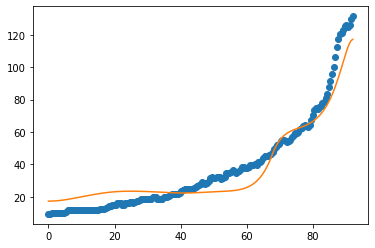

7
after perturb [10.464916994023987, 211.4322551764712, 23430.43581079576, 0.7461280207469526, 16.82334587438166]
parameters [10.464916994023987, 211.4322551764712, 23430.43581079576, 0.7461280207469526, 16.82334587438166]
after perturb [8.19193245510074, 81.51564921559485, 27482.469163541216, -0.04935822165897813, 19.772336212902296]
parameters [8.19193245510074, 81.51564921559485, 27482.469163541216, -0.04935822165897813, 19.772336212902296]
after perturb [3.3305246023582775, 68.73326527099297, 20158.900743007456, 0.6701446754341166, 42.75483306621941]
parameters [3.3305246023582775, 68.73326527099297, 20158.900743007456, 0.6701446754341166, 42.75483306621941]
oxigeno [1.59975657e-13 1.60093101e-13 1.60457997e-13 1.61108274e-13
 1.62107984e-13 1.63548595e-13 1.65550922e-13 1.68267784e-13
 1.71887528e-13 1.76638604e-13 1.82795369e-13 1.90685397e-13
 2.00698567e-13 2.13298277e-13 2.29035218e-13 2.48564171e-13
 2.72664454e-13 3.02264708e-13 3.38472903e-13 3.82612598e-13
 4.36266716e-13 

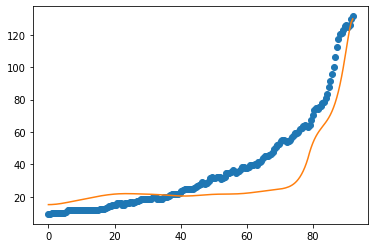

after perturb [3.587318678581517, 134.362535761825, 24045.94074075921, 0.2988778628614724, 20.780816099417663]
parameters [3.587318678581517, 134.362535761825, 24045.94074075921, 0.2988778628614724, 20.780816099417663]
oxigeno [9.02220249e-07 9.04342244e-07 9.10725440e-07 9.21421591e-07
 9.36517374e-07 9.56135015e-07 9.80433182e-07 1.00960814e-06
 1.04389518e-06 1.08357035e-06 1.12895248e-06 1.18040556e-06
 1.23834138e-06 1.30322271e-06 1.37556669e-06 1.45594879e-06
 1.54500725e-06 1.64344792e-06 1.75204984e-06 1.87167124e-06
 2.00325641e-06 2.14784312e-06 2.30657092e-06 2.48069023e-06
 2.67157237e-06 2.88072053e-06 3.10978180e-06 3.36056023e-06
 3.63503115e-06 3.93535671e-06 4.26390265e-06 4.62325660e-06
 5.01624772e-06 5.44596795e-06 5.91579482e-06 6.42941608e-06
 6.99085591e-06 7.60450322e-06 8.27514176e-06 9.00798245e-06
 9.80869786e-06 1.06834592e-05 1.16389757e-05 1.26825376e-05
 1.38220612e-05 1.50661385e-05 1.64240906e-05 1.79060254e-05
 1.95229001e-05 2.12865904e-05 2.32099648

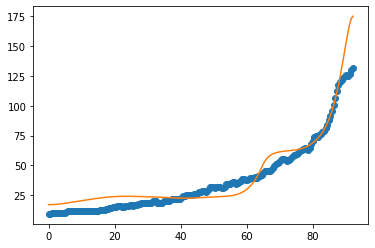

8
after perturb [5.03982171232293, 85.03487613338876, 20883.04328462381, 0.9601676236764644, 42.03072042841507]
parameters [5.03982171232293, 85.03487613338876, 20883.04328462381, 0.9601676236764644, 42.03072042841507]
oxigeno [4.69895190e-15 4.77185153e-15 4.99281841e-15 5.36873330e-15
 5.91132248e-15 6.63755496e-15 7.57021843e-15 8.73869433e-15
 1.01799601e-14 1.19398543e-14 1.40746507e-14 1.66529969e-14
 1.97582891e-14 2.34915680e-14 2.79750410e-14 3.33563598e-14
 3.98138086e-14 4.75625933e-14 5.68624627e-14 6.80269410e-14
 8.14345125e-14 9.75421698e-14 1.16901826e-13 1.40180195e-13
 1.68182876e-13 2.01883528e-13 2.42459207e-13 2.91333161e-13
 3.50226661e-13 4.21221752e-13 5.06837198e-13 6.10120396e-13
 7.34758549e-13 8.85213105e-13 1.06688224e-12 1.28629717e-12
 1.55135923e-12 1.87162597e-12 2.25865636e-12 2.72642698e-12
 3.29183358e-12 3.97529529e-12 4.80148201e-12 5.80018978e-12
 7.00739374e-12 8.46651419e-12 1.02299383e-11 1.23608481e-11
 1.49354168e-11 1.80454442e-11 2.18015214

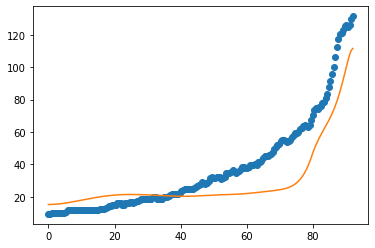

after perturb [0.6801823192690035, 178.00138103662314, 25532.17926625823, 0.7418566730416774, 5.351443370682922]
parameters [0.6801823192690035, 178.00138103662314, 25532.17926625823, 0.7418566730416774, 5.351443370682922]
after perturb [2.3891940058977634, -71.09772738289725, 26223.41746820453, -0.48116969513140373, 16.352303539261175]
parameters [2.3891940058977634, -71.09772738289725, 26223.41746820453, -0.48116969513140373, 16.352303539261175]
after perturb [5.136183657696723, 69.01175903824156, 25203.906844999216, 0.38191458249507626, 36.09716262757615]
parameters [5.136183657696723, 69.01175903824156, 25203.906844999216, 0.38191458249507626, 36.09716262757615]
oxigeno [1.12296733e-08 1.12184141e-08 1.11847412e-08 1.11289672e-08
 1.10516077e-08 1.09533722e-08 1.08351540e-08 1.06980157e-08
 1.05431743e-08 1.03719843e-08 1.01859202e-08 9.98655915e-09
 9.77556385e-09 9.55466695e-09 9.32565685e-09 9.09036561e-09
 8.85065950e-09 8.60843230e-09 8.36560170e-09 8.12410912e-09
 7.88592304e

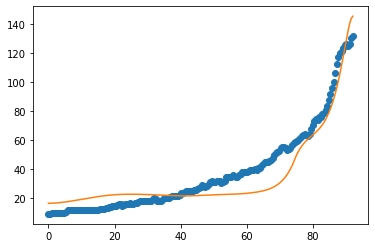

9
after perturb [2.7963100298116, 106.1084602037353, 24414.817991043445, 0.8911521322781969, 66.7488038806771]
parameters [2.7963100298116, 106.1084602037353, 24414.817991043445, 0.8911521322781969, 66.7488038806771]
after perturb [6.9744542319619205, 73.49053593335358, 28792.201805567678, -0.2576322687902809, -8.105273271720112]
parameters [6.9744542319619205, 73.49053593335358, 28792.201805567678, -0.2576322687902809, -8.105273271720112]
after perturb [10.587270920424803, 135.2901208120445, 22101.469100159902, 1.036387700064103, 44.92165459595581]
parameters [10.587270920424803, 135.2901208120445, 22101.469100159902, 1.036387700064103, 44.92165459595581]
after perturb [-1.9660594183695128, 54.60191656946786, 16089.396904729569, 0.270745606574763, 37.644294547416166]
parameters [-1.9660594183695128, 54.60191656946786, 16089.396904729569, 0.270745606574763, 37.644294547416166]
after perturb [5.099187054092181, 34.37120495199348, 27942.925991370783, 0.21597376435705085, 51.5110178903913

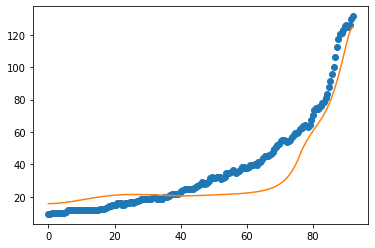

after perturb [-0.8796251477925681, 15.170061623808452, 26946.998122104902, 0.08919403976896177, 28.676583438215197]
parameters [-0.8796251477925681, 15.170061623808452, 26946.998122104902, 0.08919403976896177, 28.676583438215197]
after perturb [7.131168654555538, 127.03009669747796, 24082.19333979072, 0.4635268795090201, 17.120039158582436]
parameters [7.131168654555538, 127.03009669747796, 24082.19333979072, 0.4635268795090201, 17.120039158582436]
oxigeno [1.06631429e-08 1.07192890e-08 1.08883366e-08 1.11721213e-08
 1.15737280e-08 1.20975301e-08 1.27492448e-08 1.35360052e-08
 1.44664503e-08 1.55508338e-08 1.68011532e-08 1.82313007e-08
 1.98572370e-08 2.16971923e-08 2.37718935e-08 2.61048242e-08
 2.87225173e-08 3.16548861e-08 3.49355969e-08 3.86024875e-08
 4.26980371e-08 4.72698932e-08 5.23714614e-08 5.80625650e-08
 6.44101829e-08 7.14892737e-08 7.93836953e-08 8.81872307e-08
 9.80047323e-08 1.08953396e-07 1.21164178e-07 1.34783378e-07
 1.49974390e-07 1.66919656e-07 1.85822831e-07 2.06

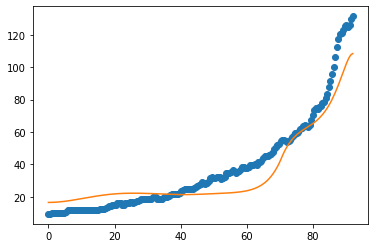

10
after perturb [3.9000824000696843, 66.04585973198992, 30473.390663720165, 0.4785822416872183, 29.504418932246338]
parameters [3.9000824000696843, 66.04585973198992, 30473.390663720165, 0.4785822416872183, 29.504418932246338]
after perturb [12.3135734371678, 140.69088298570534, 24867.269946693916, 1.3179459938045082, 43.058010525471204]
parameters [12.3135734371678, 140.69088298570534, 24867.269946693916, 1.3179459938045082, 43.058010525471204]
after perturb [-1.023625513124415, 56.60183733151974, 23927.554353673575, -0.1814435034474689, 8.74177183291733]
parameters [-1.023625513124415, 56.60183733151974, 23927.554353673575, -0.1814435034474689, 8.74177183291733]
after perturb [6.622168612911963, 66.8829371811369, 17825.219490587508, -0.1339999814722772, 32.61532619851894]
parameters [6.622168612911963, 66.8829371811369, 17825.219490587508, -0.1339999814722772, 32.61532619851894]
after perturb [-1.5296452131876972, 101.69248927439662, 26008.706520917876, 0.8362571548299434, 44.305954

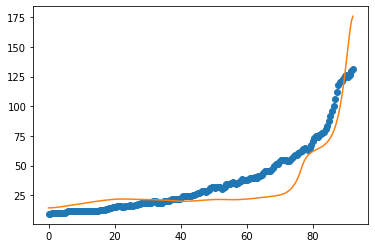

after perturb [8.544003293603723, 64.01615917805795, 25769.49712578117, -0.2538494566822873, -15.627253550290767]
parameters [8.544003293603723, 64.01615917805795, 25769.49712578117, -0.2538494566822873, -15.627253550290767]
after perturb [3.3709027765471733, 113.4807543322529, 24489.823893901386, 0.8847900212189675, 27.524051194955852]
parameters [3.3709027765471733, 113.4807543322529, 24489.823893901386, 0.8847900212189675, 27.524051194955852]
oxigeno [2.06307998e-12 2.08386883e-12 2.14666552e-12 2.25277092e-12
 2.40438825e-12 2.60467663e-12 2.85782756e-12 3.16916637e-12
 3.54528072e-12 3.99417921e-12 4.52548387e-12 5.15066114e-12
 5.88329674e-12 6.73942148e-12 7.73789577e-12 8.90086267e-12
 1.02542808e-11 1.18285511e-11 1.36592523e-11 1.57880061e-11
 1.82634923e-11 2.11426413e-11 2.44920337e-11 2.83895448e-11
 3.29262735e-11 3.82088068e-11 4.43618762e-11 5.15314731e-11
 5.98885006e-11 6.96330519e-11 8.09994216e-11 9.42619685e-11
 1.09741973e-10 1.27815652e-10 1.48923512e-10 1.735812

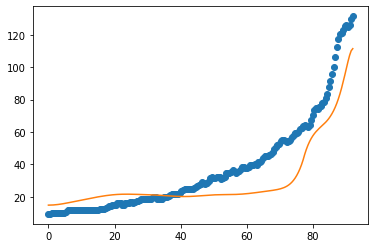

after perturb [-2.2557874281708514, 50.78750558757295, 18316.430260855042, 0.8735482990294919, 72.30071501813288]
parameters [-2.2557874281708514, 50.78750558757295, 18316.430260855042, 0.8735482990294919, 72.30071501813288]
after perturb [-5.101498048176977, 130.8225368493947, 24683.548972167948, 0.25998071043850013, 37.205087526645606]
parameters [-5.101498048176977, 130.8225368493947, 24683.548972167948, 0.25998071043850013, 37.205087526645606]
after perturb [3.537673569515279, 125.83287307865646, 26105.35812801958, 0.42454271787436404, 31.459747785560168]
parameters [3.537673569515279, 125.83287307865646, 26105.35812801958, 0.42454271787436404, 31.459747785560168]
oxigeno [2.23999047e-08 2.24998931e-08 2.28008886e-08 2.33059940e-08
 2.40204234e-08 2.49515655e-08 2.61090738e-08 2.75049829e-08
 2.91538535e-08 3.10729461e-08 3.32824249e-08 3.58055956e-08
 3.86691776e-08 4.19036151e-08 4.55434300e-08 4.96276216e-08
 5.42001169e-08 5.93102790e-08 6.50134775e-08 7.13717310e-08
 7.8454427

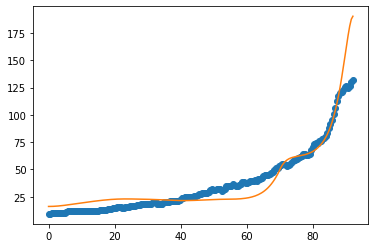

after perturb [2.048355769300712, 110.66567647358912, 26218.69879056868, 0.9616038134536113, 50.3360401554789]
parameters [2.048355769300712, 110.66567647358912, 26218.69879056868, 0.9616038134536113, 50.3360401554789]
after perturb [3.364983671901676, 192.39770507974217, 28556.003368206777, 1.2470150449874176, 47.048725229155195]
parameters [3.364983671901676, 192.39770507974217, 28556.003368206777, 1.2470150449874176, 47.048725229155195]
after perturb [7.788029672778488, 155.05647113125502, 18186.62332840012, 0.5830011869635404, 32.36913682524931]
parameters [7.788029672778488, 155.05647113125502, 18186.62332840012, 0.5830011869635404, 32.36913682524931]
after perturb [8.165750014473389, 118.9839615687518, 27592.736504849516, 0.5676542692871909, 34.139357749401356]
parameters [8.165750014473389, 118.9839615687518, 27592.736504849516, 0.5676542692871909, 34.139357749401356]
oxigeno [6.87429071e-10 6.92094628e-10 7.06155127e-10 7.29803039e-10
 7.63362454e-10 8.07294097e-10 8.62202457e-

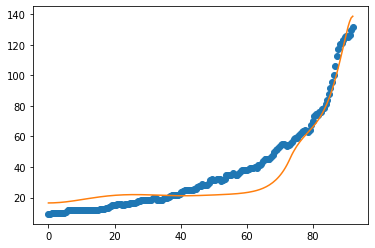

11
after perturb [8.740692804971877, 211.20200762805212, 27902.658387848776, 1.3317959723394732, 28.0729475798154]
parameters [8.740692804971877, 211.20200762805212, 27902.658387848776, 1.3317959723394732, 28.0729475798154]
after perturb [10.021458866133813, 189.09457215863426, 26478.22686681186, 0.42983388758471086, 4.184017607095102]
parameters [10.021458866133813, 189.09457215863426, 26478.22686681186, 0.42983388758471086, 4.184017607095102]
after perturb [12.931971186954243, 189.28219537546812, 27216.260249446863, 0.6228442044856677, 7.802482016276542]
parameters [12.931971186954243, 189.28219537546812, 27216.260249446863, 0.6228442044856677, 7.802482016276542]
after perturb [19.51314203652361, 182.66837320743616, 28641.87028828142, 1.9751313287143093, 59.98679009646338]
parameters [19.51314203652361, 182.66837320743616, 28641.87028828142, 1.9751313287143093, 59.98679009646338]
after perturb [11.50387876405231, 122.72472181592573, 23951.115385269866, 0.6740765220564693, 31.10013504

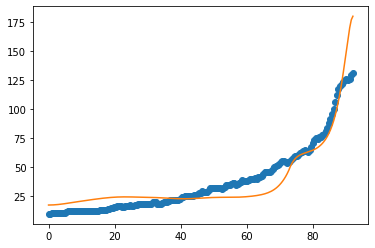

after perturb [11.74927349102631, 155.49473650732588, 25024.344604400114, 0.1373021746351264, 5.763191314475661]
parameters [11.74927349102631, 155.49473650732588, 25024.344604400114, 0.1373021746351264, 5.763191314475661]
after perturb [4.907868381521509, 51.71601402224698, 28689.59375690425, 0.3333382969077432, 29.007165613195326]
parameters [4.907868381521509, 51.71601402224698, 28689.59375690425, 0.3333382969077432, 29.007165613195326]
oxigeno [8.67053619e-08 8.66043505e-08 8.63022548e-08 8.58018717e-08
 8.51077985e-08 8.42263394e-08 8.31653805e-08 8.19342356e-08
 8.05434708e-08 7.90047126e-08 7.73304457e-08 7.55338071e-08
 7.36283823e-08 7.16280078e-08 6.95465856e-08 6.73979122e-08
 6.51955253e-08 6.29525694e-08 6.06816813e-08 5.83948961e-08
 5.61035720e-08 5.38183344e-08 5.15490362e-08 4.93047344e-08
 4.70936809e-08 4.49233246e-08 4.28003250e-08 4.07305755e-08
 3.87192334e-08 3.67707585e-08 3.48889565e-08 3.30770284e-08
 3.13376251e-08 2.96729054e-08 2.80845992e-08 2.65740743e-08

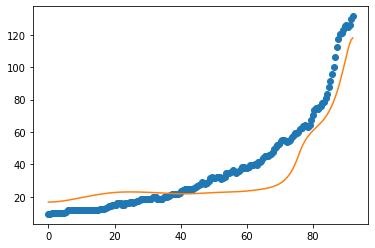

after perturb [0.560253381959825, 40.79031373513112, 25702.010809891803, -0.48102348710956344, -0.6360928849771605]
parameters [0.560253381959825, 40.79031373513112, 25702.010809891803, -0.48102348710956344, -0.6360928849771605]
after perturb [15.053203525146051, 220.23843751223785, 27652.41824605019, 0.8806965741296965, 12.551152329712956]
parameters [15.053203525146051, 220.23843751223785, 27652.41824605019, 0.8806965741296965, 12.551152329712956]
after perturb [-0.7549422730621478, 132.45742003012361, 27396.768012751283, 0.5039117535662054, 41.984312185097]
parameters [-0.7549422730621478, 132.45742003012361, 27396.768012751283, 0.5039117535662054, 41.984312185097]
after perturb [4.525076706965504, 81.9597044153343, 29223.809427054894, 1.4223977746442154, 93.78906731817747]
parameters [4.525076706965504, 81.9597044153343, 29223.809427054894, 1.4223977746442154, 93.78906731817747]
after perturb [11.027383667310538, 72.96266477717268, 25875.521079764167, 0.9367727824854609, 51.5728420

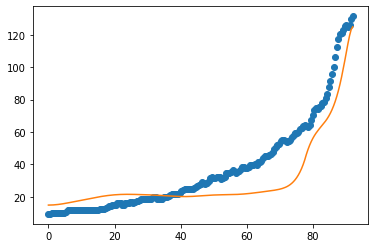

after perturb [10.273892155477835, 84.87376448530027, 26703.22289491538, 0.3370364340526099, 13.822861774540334]
parameters [10.273892155477835, 84.87376448530027, 26703.22289491538, 0.3370364340526099, 13.822861774540334]
after perturb [2.2898973336191824, 81.69969972642545, 28140.28561116002, 0.2686274493675052, -7.891145516536062]
parameters [2.2898973336191824, 81.69969972642545, 28140.28561116002, 0.2686274493675052, -7.891145516536062]
after perturb [6.472390344326852, 57.144313128164136, 27467.984738097053, 0.6974611392567882, 51.20559819577606]
parameters [6.472390344326852, 57.144313128164136, 27467.984738097053, 0.6974611392567882, 51.20559819577606]
after perturb [8.795691869427067, 59.68049246549448, 28331.696038116046, 0.4258827657561939, 32.662623930682216]
parameters [8.795691869427067, 59.68049246549448, 28331.696038116046, 0.4258827657561939, 32.662623930682216]
oxigeno [1.52252340e-09 1.52092327e-09 1.51613581e-09 1.50819965e-09
 1.49717856e-09 1.48316054e-09 1.466256

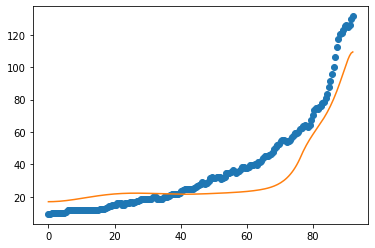

after perturb [9.935613942208171, 137.16792948043548, 23721.17459505827, 1.209540089480364, 27.971811784769606]
parameters [9.935613942208171, 137.16792948043548, 23721.17459505827, 1.209540089480364, 27.971811784769606]
oxigeno [5.61844537e-13 5.68081745e-13 5.86932323e-13 6.18816488e-13
 6.64445891e-13 7.24840860e-13 8.01355159e-13 8.95708920e-13
 1.01003059e-12 1.14690903e-12 1.30945700e-12 1.50138791e-12
 1.72710764e-12 1.99182384e-12 2.30167580e-12 2.66388794e-12
 3.08695131e-12 3.58083749e-12 4.15725087e-12 4.82992559e-12
 5.61497513e-12 6.53130368e-12 7.60108996e-12 8.85035619e-12
 1.03096372e-11 1.20147667e-11 1.40078018e-11 1.63381094e-11
 1.90636421e-11 2.22524376e-11 2.59843799e-11 3.03532665e-11
 3.54692359e-11 4.14616168e-11 4.84822706e-11 5.67095133e-11
 6.63527142e-11 7.76576877e-11 9.09130127e-11 1.06457438e-10
 1.24688553e-10 1.46072946e-10 1.71158093e-10 2.00586263e-10
 2.35110799e-10 2.75615140e-10 3.23135072e-10 3.78884722e-10
 4.44286929e-10 5.21008713e-10 6.110026

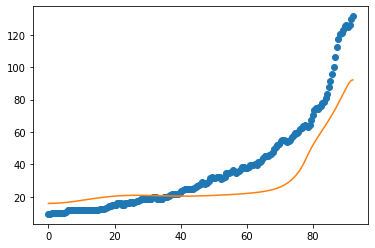

after perturb [4.166636582701435, 79.00211750890242, 28198.307346737794, 0.5448179211541236, 28.009530202365518]
parameters [4.166636582701435, 79.00211750890242, 28198.307346737794, 0.5448179211541236, 28.009530202365518]
oxigeno [1.68498220e-11 1.68759718e-11 1.69554762e-11 1.70915185e-11
 1.72894652e-11 1.75569600e-11 1.79040592e-11 1.83434158e-11
 1.88905146e-11 1.95639698e-11 2.03858913e-11 2.13823328e-11
 2.25838326e-11 2.40260641e-11 2.57506116e-11 2.78058932e-11
 3.02482541e-11 3.31432586e-11 3.65672131e-11 4.06089587e-11
 4.53719782e-11 5.09768703e-11 5.75642524e-11 6.52981635e-11
 7.43700526e-11 8.50034494e-11 9.74594318e-11 1.12043024e-10
 1.29110681e-10 1.49079032e-10 1.72435101e-10 1.99748241e-10
 2.31684049e-10 2.69020606e-10 3.12667390e-10 3.63687302e-10
 4.23322294e-10 4.93023166e-10 5.74484191e-10 6.69683309e-10
 7.80928781e-10 9.10913281e-10 1.06277661e-09 1.24017838e-09
 1.44738213e-09 1.68935285e-09 1.97186984e-09 2.30165732e-09
 2.68653570e-09 3.13559667e-09 3.6594

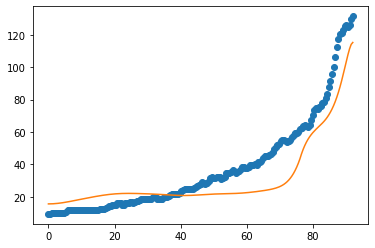

after perturb [2.800827485800088, 104.70186572994012, 29788.3882789508, 1.1481475158762937, 68.24777301673193]
parameters [2.800827485800088, 104.70186572994012, 29788.3882789508, 1.1481475158762937, 68.24777301673193]
after perturb [8.82328899306759, 72.88471903944487, 21866.78021069152, -0.10883203149945941, 31.911752989610385]
parameters [8.82328899306759, 72.88471903944487, 21866.78021069152, -0.10883203149945941, 31.911752989610385]
after perturb [2.706464721364863, 148.55124494595867, 21996.269607414797, 0.4298888203761962, 23.609855226480047]
parameters [2.706464721364863, 148.55124494595867, 21996.269607414797, 0.4298888203761962, 23.609855226480047]
oxigeno [1.03553030e-07 1.03954119e-07 1.05160889e-07 1.07183875e-07
 1.10040760e-07 1.13756558e-07 1.18363876e-07 1.23903240e-07
 1.30423513e-07 1.37982381e-07 1.46646923e-07 1.56494267e-07
 1.67612347e-07 1.80100742e-07 1.94071645e-07 2.09650940e-07
 2.26979418e-07 2.46214146e-07 2.67529997e-07 2.91121376e-07
 3.17204144e-07 3.46

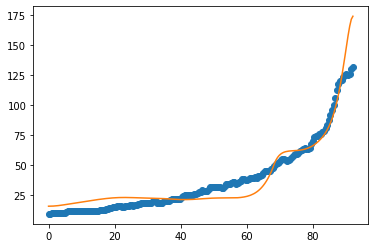

12
after perturb [3.2977058575188742, 116.20652629389878, 25123.056858902517, 0.7757309173027531, 54.243990818418]
parameters [3.2977058575188742, 116.20652629389878, 25123.056858902517, 0.7757309173027531, 54.243990818418]
after perturb [8.05863900784136, 85.67442523538557, 23905.860822326795, 0.7194646148484782, 48.535462796907346]
parameters [8.05863900784136, 85.67442523538557, 23905.860822326795, 0.7194646148484782, 48.535462796907346]
oxigeno [3.67611178e-13 3.72037587e-13 3.85425890e-13 4.08106176e-13
 4.40638201e-13 4.83826095e-13 5.38739507e-13 6.06741793e-13
 6.89526034e-13 7.89159883e-13 9.08140487e-13 1.04946104e-12
 1.21669078e-12 1.41407075e-12 1.64662789e-12 1.92031072e-12
 2.24215043e-12 2.62045180e-12 3.06501932e-12 3.58742487e-12
 4.20132440e-12 4.92283236e-12 5.77096440e-12 6.76816066e-12
 7.94090402e-12 9.32045053e-12 1.09436922e-11 1.28541755e-11
 1.51033044e-11 1.77517594e-11 2.08711727e-11 2.45461035e-11
 2.88763676e-11 3.39797839e-11 3.99954101e-11 4.70873549e-1

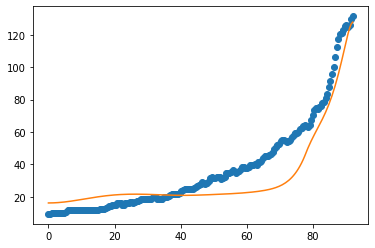

after perturb [4.708297189239454, 63.62029841615948, 20557.57631686105, 0.4369731415194892, 50.88984311105612]
parameters [4.708297189239454, 63.62029841615948, 20557.57631686105, 0.4369731415194892, 50.88984311105612]
after perturb [9.30628602890667, 141.67125940697304, 22348.16785466899, 0.5695429018553706, 13.517693436008779]
parameters [9.30628602890667, 141.67125940697304, 22348.16785466899, 0.5695429018553706, 13.517693436008779]
oxigeno [4.87288565e-09 4.90042700e-09 4.98336446e-09 5.12264226e-09
 5.31984784e-09 5.57723251e-09 5.89774084e-09 6.28504905e-09
 6.74361299e-09 7.27872629e-09 7.89658943e-09 8.60439065e-09
 9.41039980e-09 1.03240763e-08 1.13561925e-08 1.25189746e-08
 1.38262618e-08 1.52936871e-08 1.69388812e-08 1.87817023e-08
 2.08444950e-08 2.31523807e-08 2.57335851e-08 2.86198039e-08
 3.18466147e-08 3.54539373e-08 3.94865501e-08 4.39946669e-08
 4.90345840e-08 5.46694018e-08 6.09698330e-08 6.80151040e-08
 7.58939626e-08 8.47058020e-08 9.45619153e-08 1.05586894e-07
 1.

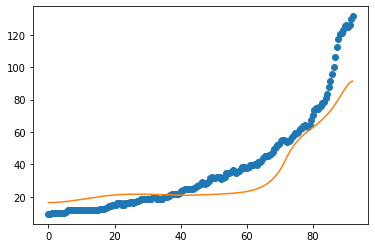

after perturb [9.661370266466562, 52.18150859153913, 29584.518591579847, 0.10834008430490036, 0.03466610493682509]
parameters [9.661370266466562, 52.18150859153913, 29584.518591579847, 0.10834008430490036, 0.03466610493682509]
after perturb [-0.08812449035771763, 108.71543973205547, 22151.067930387853, 0.21727241348219617, 38.35483640449835]
parameters [-0.08812449035771763, 108.71543973205547, 22151.067930387853, 0.21727241348219617, 38.35483640449835]
after perturb [-2.8650678960908644, 67.19318182730177, 21930.430300315074, 0.3365507102980442, 27.86646422122824]
parameters [-2.8650678960908644, 67.19318182730177, 21930.430300315074, 0.3365507102980442, 27.86646422122824]
after perturb [-0.6777298675231231, -48.14030277800005, 23920.923295595705, 0.08673241437201995, 42.73440096237633]
parameters [-0.6777298675231231, -48.14030277800005, 23920.923295595705, 0.08673241437201995, 42.73440096237633]
after perturb [5.278127465707822, 82.80225916360766, 24058.432533070263, 0.1179847519559

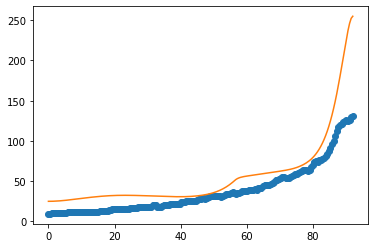

after perturb [6.413179629802963, 120.05931586712796, 23371.062317502452, 0.8326350376849037, 38.129255609781566]
parameters [6.413179629802963, 120.05931586712796, 23371.062317502452, 0.8326350376849037, 38.129255609781566]
oxigeno [1.00468870e-11 1.01391201e-11 1.04175287e-11 1.08872761e-11
 1.15570878e-11 1.24394346e-11 1.35507936e-11 1.49119945e-11
 1.65486574e-11 1.84917318e-11 2.07781500e-11 2.34516071e-11
 2.65634865e-11 3.01739506e-11 3.43532203e-11 3.91830729e-11
 4.47585892e-11 5.11901914e-11 5.86060136e-11 6.71546594e-11
 7.70084069e-11 8.83669306e-11 1.01461623e-10 1.16560610e-10
 1.33974570e-10 1.54063481e-10 1.77244446e-10 2.04000757e-10
 2.34892404e-10 2.70568235e-10 3.11780047e-10 3.59398876e-10
 4.14433852e-10 4.78053993e-10 5.51613389e-10 6.36680298e-10
 7.35070736e-10 8.48887239e-10 9.80563583e-10 1.13291635e-09
 1.30920432e-09 1.51319700e-09 1.74925338e-09 2.02241277e-09
 2.33849918e-09 2.70424153e-09 3.12741180e-09 3.61698391e-09
 4.18331628e-09 4.83836163e-09 5.59

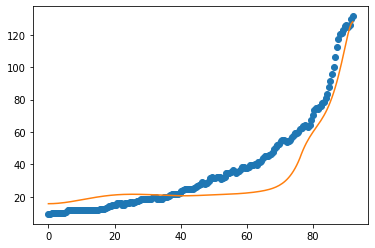

after perturb [9.762887964707359, 83.48419082120446, 18784.971445194336, 1.2184173265199407, 48.750380863517755]
parameters [9.762887964707359, 83.48419082120446, 18784.971445194336, 1.2184173265199407, 48.750380863517755]
after perturb [4.221591886051844, 123.06148809214292, 22584.841253574123, -0.2741431029420869, -12.524013393160864]
parameters [4.221591886051844, 123.06148809214292, 22584.841253574123, -0.2741431029420869, -12.524013393160864]
after perturb [4.029874381129538, 70.67942200623921, 27095.042113909705, -0.46032167593025164, -4.42054973682761]
parameters [4.029874381129538, 70.67942200623921, 27095.042113909705, -0.46032167593025164, -4.42054973682761]
after perturb [9.414332982329336, 50.10955769655253, 28135.117232001627, 0.6368901378141884, 27.85296648639889]
parameters [9.414332982329336, 50.10955769655253, 28135.117232001627, 0.6368901378141884, 27.85296648639889]
oxigeno [2.92757529e-13 2.92341520e-13 2.91097718e-13 2.89038718e-13
 2.86185272e-13 2.82565924e-13 2.

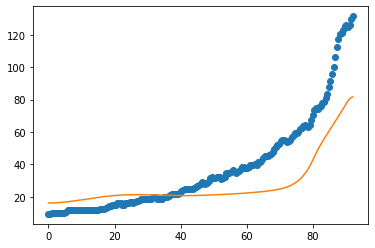

after perturb [0.572656276091509, 63.56348810588685, 16620.855939716166, 0.08266837442257127, 1.7371805555960451]
parameters [0.572656276091509, 63.56348810588685, 16620.855939716166, 0.08266837442257127, 1.7371805555960451]
after perturb [-3.1736265560210706, 129.84949465388914, 21419.67152155306, 1.0514600277248294, 75.64093115157421]
parameters [-3.1736265560210706, 129.84949465388914, 21419.67152155306, 1.0514600277248294, 75.64093115157421]
after perturb [4.505629991721014, 96.7297549733587, 21430.949157403207, 0.15338845657228364, 21.032572112152433]
parameters [4.505629991721014, 96.7297549733587, 21430.949157403207, 0.15338845657228364, 21.032572112152433]
oxigeno [1.76720959e-04 1.76646651e-04 1.76424342e-04 1.76055873e-04
 1.75544285e-04 1.74893777e-04 1.74109657e-04 1.73198275e-04
 1.72166947e-04 1.71023878e-04 1.69778071e-04 1.68439247e-04
 1.67017755e-04 1.65524490e-04 1.63970820e-04 1.62368516e-04
 1.60729692e-04 1.59066754e-04 1.57392358e-04 1.55719384e-04
 1.54060913e-0

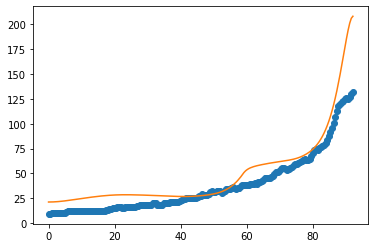

after perturb [8.185570750055849, 138.3565498261589, 18868.59206919518, 1.407487674288072, 68.7545066608935]
parameters [8.185570750055849, 138.3565498261589, 18868.59206919518, 1.407487674288072, 68.7545066608935]
after perturb [-1.9468713151332218, 5.150051544524967, 28884.98503617153, -0.06405988700776208, 40.0459740049142]
parameters [-1.9468713151332218, 5.150051544524967, 28884.98503617153, -0.06405988700776208, 40.0459740049142]
after perturb [3.925783404904637, 39.45270331008343, 23966.316078685944, 0.014753093075389911, -10.193472094175737]
parameters [3.925783404904637, 39.45270331008343, 23966.316078685944, 0.014753093075389911, -10.193472094175737]
after perturb [8.034275535233835, 142.849006081081, 18628.471717657343, 0.7968911919994452, 6.538253237122351]
parameters [8.034275535233835, 142.849006081081, 18628.471717657343, 0.7968911919994452, 6.538253237122351]
after perturb [9.124564139250655, 37.61140490509716, 31447.6455218298, 0.25117026908524975, 37.33152810162839]
p

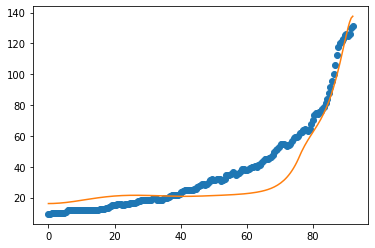

13
after perturb [12.33275719536998, 144.90133861048474, 29991.61410177052, 0.4617544527635771, 16.63355295805367]
parameters [12.33275719536998, 144.90133861048474, 29991.61410177052, 0.4617544527635771, 16.63355295805367]
after perturb [1.9558660909789296, 90.43625388612173, 25784.376956568187, 0.4302202491388345, 37.10311360633165]
parameters [1.9558660909789296, 90.43625388612173, 25784.376956568187, 0.4302202491388345, 37.10311360633165]
oxigeno [2.02832111e-09 2.02936516e-09 2.03256337e-09 2.03811382e-09
 2.04634656e-09 2.05772373e-09 2.07284025e-09 2.09242549e-09
 2.11734642e-09 2.14861268e-09 2.18738398e-09 2.23498029e-09
 2.29289519e-09 2.36281266e-09 2.44662780e-09 2.54647183e-09
 2.66474189e-09 2.80413627e-09 2.96769567e-09 3.15885132e-09
 3.38148092e-09 3.63997321e-09 3.93930248e-09 4.28511398e-09
 4.68382172e-09 5.14271986e-09 5.67010949e-09 6.27544248e-09
 6.96948468e-09 7.76450114e-09 8.67446638e-09 9.71530350e-09
 1.09051566e-08 1.22647014e-08 1.38174986e-08 1.55903973e

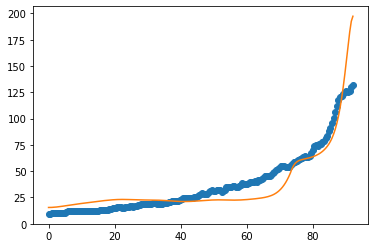

after perturb [-0.7991972767942395, -8.397231547106855, 19278.18967942516, -0.7717939894136612, -22.543316960488873]
parameters [-0.7991972767942395, -8.397231547106855, 19278.18967942516, -0.7717939894136612, -22.543316960488873]
after perturb [8.428454265302626, 55.640888777424976, 27671.309349934098, 0.6379008809349445, 15.153393381496162]
parameters [8.428454265302626, 55.640888777424976, 27671.309349934098, 0.6379008809349445, 15.153393381496162]
oxigeno [2.22270890e-13 2.21977040e-13 2.21098938e-13 2.19646887e-13
 2.17637937e-13 2.15095710e-13 2.12050175e-13 2.08537378e-13
 2.04599171e-13 2.00282939e-13 1.95641371e-13 1.90732305e-13
 1.85618677e-13 1.80368627e-13 1.75055799e-13 1.69759891e-13
 1.64567512e-13 1.59573418e-13 1.54882208e-13 1.50610564e-13
 1.46890162e-13 1.43871379e-13 1.41727967e-13 1.40662889e-13
 1.40915570e-13 1.42770853e-13 1.46570044e-13 1.52724484e-13
 1.61732207e-13 1.74198373e-13 1.90860299e-13 2.12618118e-13
 2.40572301e-13 2.76069593e-13 3.20759204e-13 3.

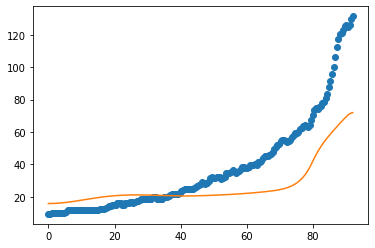

after perturb [10.32497826779736, 35.85015127656419, 26974.122975007114, 0.05889018005746299, 29.889324158849938]
parameters [10.32497826779736, 35.85015127656419, 26974.122975007114, 0.05889018005746299, 29.889324158849938]
after perturb [8.8979949436954, 84.13670300803578, 24812.771159876298, 0.2934053878960208, 24.082280439353408]
parameters [8.8979949436954, 84.13670300803578, 24812.771159876298, 0.2934053878960208, 24.082280439353408]
oxigeno [3.09273811e-07 3.09110617e-07 3.08622765e-07 3.07815446e-07
 3.06697286e-07 3.05280313e-07 3.03579913e-07 3.01614780e-07
 2.99406852e-07 2.96981260e-07 2.94366271e-07 2.91593241e-07
 2.88696586e-07 2.85713768e-07 2.82685313e-07 2.79654849e-07
 2.76669200e-07 2.73778503e-07 2.71036395e-07 2.68500246e-07
 2.66231459e-07 2.64295847e-07 2.62764081e-07 2.61712232e-07
 2.61222405e-07 2.61383478e-07 2.62291962e-07 2.64052973e-07
 2.66781356e-07 2.70602949e-07 2.75656014e-07 2.82092855e-07
 2.90081623e-07 2.99808346e-07 3.11479199e-07 3.25323037e-07

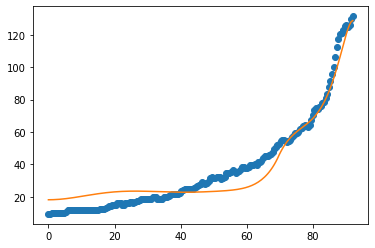

14
after perturb [7.528072985768624, 99.67983520055637, 31218.465773312448, 1.0251823274495708, 42.19459673862478]
parameters [7.528072985768624, 99.67983520055637, 31218.465773312448, 1.0251823274495708, 42.19459673862478]
after perturb [6.3005277568943905, 40.547309912558006, 26177.13082646491, -0.40601030289242224, 2.5901686995380278]
parameters [6.3005277568943905, 40.547309912558006, 26177.13082646491, -0.40601030289242224, 2.5901686995380278]
after perturb [1.6266893998187792, 135.7749477396713, 25563.33371386845, 1.199419881358514, 61.398057638867456]
parameters [1.6266893998187792, 135.7749477396713, 25563.33371386845, 1.199419881358514, 61.398057638867456]
after perturb [15.414113329860015, 227.62793502613408, 27247.922645561197, 1.2839640105523977, 13.131071841829687]
parameters [15.414113329860015, 227.62793502613408, 27247.922645561197, 1.2839640105523977, 13.131071841829687]
after perturb [3.7704162050367946, 173.72145708729448, 22138.262361681336, 0.501536452009172, 20.38

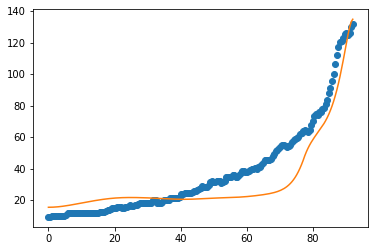

after perturb [1.1055661545591722, 105.43733808863911, 31558.68533934726, -0.10151973956634305, -22.15953776181207]
parameters [1.1055661545591722, 105.43733808863911, 31558.68533934726, -0.10151973956634305, -22.15953776181207]
after perturb [6.374958765786701, 84.50701305737083, 27902.837731873962, 0.791885221561358, 37.81308759651972]
parameters [6.374958765786701, 84.50701305737083, 27902.837731873962, 0.791885221561358, 37.81308759651972]
oxigeno [7.69764039e-14 7.80091995e-14 8.11354607e-14 8.64396196e-14
 9.40651207e-14 1.04218595e-13 1.17175883e-13 1.33290091e-13
 1.53001933e-13 1.76852670e-13 2.05500056e-13 2.39737777e-13
 2.80518989e-13 3.28984678e-13 3.86497740e-13 4.54683818e-13
 5.35480181e-13 6.31194170e-13 7.44573018e-13 8.78887241e-13
 1.03803018e-12 1.22663681e-12 1.45022551e-12 1.71536724e-12
 2.02988728e-12 2.40310594e-12 2.84612556e-12 3.37217268e-12
 3.99700596e-12 4.73940229e-12 5.62173593e-12 6.67066823e-12
 7.91796895e-12 9.40149365e-12 1.11663466e-11 1.32662636

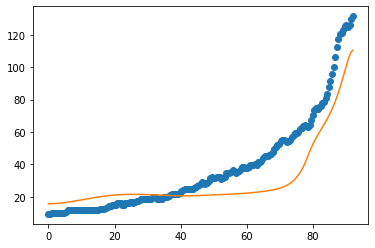

after perturb [0.667005436202899, 63.79037234310249, 20531.94617001477, 0.9459073944184684, 68.51223135126443]
parameters [0.667005436202899, 63.79037234310249, 20531.94617001477, 0.9459073944184684, 68.51223135126443]
after perturb [3.7625213036659475, 92.16340266749015, 26544.73340085963, -0.5811126259064946, -10.756487662652647]
parameters [3.7625213036659475, 92.16340266749015, 26544.73340085963, -0.5811126259064946, -10.756487662652647]
after perturb [1.9637917298982663, 81.81228070534043, 28180.312722395778, 0.12441260666412346, 24.084580965842484]
parameters [1.9637917298982663, 81.81228070534043, 28180.312722395778, 0.12441260666412346, 24.084580965842484]
oxigeno [8.13976091e-04 8.13499572e-04 8.12074808e-04 8.09716014e-04
 8.06446349e-04 8.02297156e-04 7.97306998e-04 7.91520534e-04
 7.84987330e-04 7.77760665e-04 7.69896377e-04 7.61451812e-04
 7.52484882e-04 7.43053264e-04 7.33213742e-04 7.23021712e-04
 7.12530820e-04 7.01792769e-04 6.90857254e-04 6.79772026e-04
 6.68583050e-0

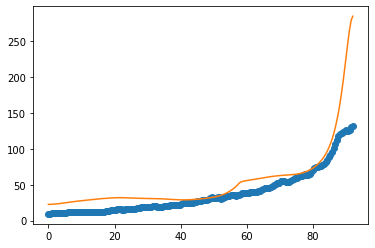

after perturb [9.911202226373375, 39.3303211917935, 25339.581705539484, -0.04324074853170112, 3.871572721657465]
parameters [9.911202226373375, 39.3303211917935, 25339.581705539484, -0.04324074853170112, 3.871572721657465]
after perturb [4.487468079927685, 67.77244893150379, 24974.18599806863, 0.6022114663618308, 49.49934434181835]
parameters [4.487468079927685, 67.77244893150379, 24974.18599806863, 0.6022114663618308, 49.49934434181835]
oxigeno [1.97206772e-12 1.97057509e-12 1.96615688e-12 1.95899245e-12
 1.94938172e-12 1.93774685e-12 1.92463501e-12 1.91072268e-12
 1.89682181e-12 1.88388874e-12 1.87303629e-12 1.86555006e-12
 1.86290969e-12 1.86681633e-12 1.87922727e-12 1.90239939e-12
 1.93894284e-12 1.99188692e-12 2.06476036e-12 2.16168869e-12
 2.28751174e-12 2.44792517e-12 2.64965043e-12 2.90063852e-12
 3.21031408e-12 3.58986745e-12 4.05260386e-12 4.61436079e-12
 5.29400654e-12 6.11403543e-12 7.10127834e-12 8.28775019e-12
 9.71166063e-12 1.14186185e-11 1.34630665e-11 1.59099893e-11
 

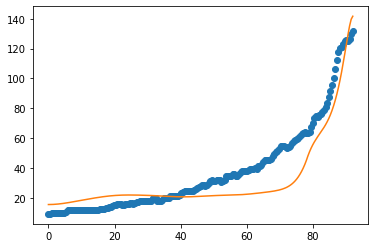

after perturb [-0.5772274802012822, -15.043482181220018, 32237.681286095365, 0.25426584200466174, 70.0520796270373]
parameters [-0.5772274802012822, -15.043482181220018, 32237.681286095365, 0.25426584200466174, 70.0520796270373]
after perturb [11.902481468241968, 72.23975702611042, 21957.75534372261, -0.12464315703605744, 2.579588448013098]
parameters [11.902481468241968, 72.23975702611042, 21957.75534372261, -0.12464315703605744, 2.579588448013098]
after perturb [4.595875668530095, 75.574296256855, 24188.597730155503, 0.03370995975557137, 7.001881837370648]
parameters [4.595875668530095, 75.574296256855, 24188.597730155503, 0.03370995975557137, 7.001881837370648]
oxigeno [ 0.12824995  0.12821779  0.12812148  0.12796157  0.12773897  0.12745492
  0.127111    0.12670908  0.12625134  0.12574018  0.12517824  0.12456838
  0.1239136   0.12321704  0.12248197  0.12171172  0.1209097   0.12007934
  0.11922411  0.11834746  0.11745282  0.11654361  0.1156232   0.1146949
  0.11376198  0.11282765  0.

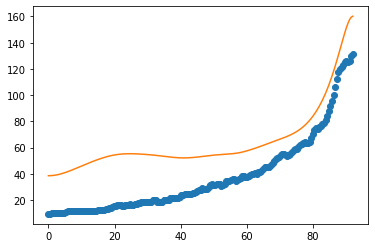

after perturb [1.4737944567385937, 154.74470941586813, 26281.797240775482, 0.5052485048637189, 21.5612228771503]
parameters [1.4737944567385937, 154.74470941586813, 26281.797240775482, 0.5052485048637189, 21.5612228771503]
after perturb [5.71136257474493, 150.0592034503491, 22743.059045296686, 0.813480068888434, 39.58711105167496]
parameters [5.71136257474493, 150.0592034503491, 22743.059045296686, 0.813480068888434, 39.58711105167496]
after perturb [5.2411573404250955, 58.863415046639226, 31327.414155329938, 0.1949539891536059, 22.40328076079802]
parameters [5.2411573404250955, 58.863415046639226, 31327.414155329938, 0.1949539891536059, 22.40328076079802]
after perturb [1.4918891170226225, 58.707114477530396, 23385.610769971943, 0.426281284684582, 31.479784212767022]
parameters [1.4918891170226225, 58.707114477530396, 23385.610769971943, 0.426281284684582, 31.479784212767022]
oxigeno [2.58329405e-09 2.57928217e-09 2.56731366e-09 2.54758618e-09
 2.52041720e-09 2.48622779e-09 2.44552286

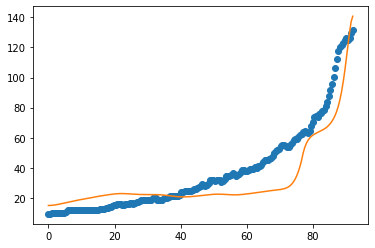

after perturb [-0.3686836777142881, 42.84882199671335, 22141.764895943663, 0.9820718843221783, 86.15152019851749]
parameters [-0.3686836777142881, 42.84882199671335, 22141.764895943663, 0.9820718843221783, 86.15152019851749]
after perturb [2.0695420283092703, 72.52560354274712, 24034.103381484292, 0.5039945957806996, 56.30690205300747]
parameters [2.0695420283092703, 72.52560354274712, 24034.103381484292, 0.5039945957806996, 56.30690205300747]
after perturb [1.3842647903200136, 163.61323260271683, 26707.768702784764, 0.5570672984763075, 20.216054163030535]
parameters [1.3842647903200136, 163.61323260271683, 26707.768702784764, 0.5570672984763075, 20.216054163030535]
after perturb [2.9566585220389445, 68.87752666597781, 22431.245717685673, -0.17845264623300444, -4.345533152245473]
parameters [2.9566585220389445, 68.87752666597781, 22431.245717685673, -0.17845264623300444, -4.345533152245473]
after perturb [3.3653071688733553, 136.47317450057085, 26398.569121345023, 0.7749768229780702, 5

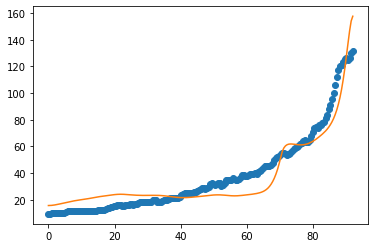

15
after perturb [6.730975729747402, 42.75110607747381, 17137.478039750713, -0.2754553134813792, 43.015906494612786]
parameters [6.730975729747402, 42.75110607747381, 17137.478039750713, -0.2754553134813792, 43.015906494612786]
after perturb [1.6892497583974513, 48.2311507222458, 23437.126674783387, 0.12323824660642899, 21.15611543238598]
parameters [1.6892497583974513, 48.2311507222458, 23437.126674783387, 0.12323824660642899, 21.15611543238598]
oxigeno [7.27002436e-04 7.26380908e-04 7.24524011e-04 7.21454464e-04
 7.17209014e-04 7.11836901e-04 7.05397918e-04 6.97960279e-04
 6.89598423e-04 6.80390927e-04 6.70418594e-04 6.59762766e-04
 6.48503900e-04 6.36720366e-04 6.24487488e-04 6.11876812e-04
 5.98955604e-04 5.85786589e-04 5.72427928e-04 5.58933421e-04
 5.45352894e-04 5.31732705e-04 5.18116302e-04 5.04544738e-04
 4.91057070e-04 4.77690604e-04 4.64480951e-04 4.51461931e-04
 4.38665357e-04 4.26120780e-04 4.13855249e-04 4.01893161e-04
 3.90256217e-04 3.78963508e-04 3.68031692e-04 3.57475

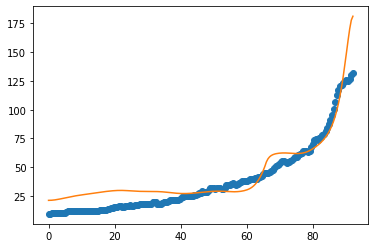

after perturb [5.51193228999726, 90.30579362321033, 27955.4373552848, 0.26003935039314663, 34.06690739097649]
parameters [5.51193228999726, 90.30579362321033, 27955.4373552848, 0.26003935039314663, 34.06690739097649]
oxigeno [1.71171708e-06 1.71079241e-06 1.70802807e-06 1.70345305e-06
 1.69711533e-06 1.68908149e-06 1.67943615e-06 1.66828125e-06
 1.65573526e-06 1.64193236e-06 1.62702157e-06 1.61116590e-06
 1.59454153e-06 1.57733713e-06 1.55975324e-06 1.54200185e-06
 1.52430611e-06 1.50690032e-06 1.49003004e-06 1.47395256e-06
 1.45893752e-06 1.44526790e-06 1.43324123e-06 1.42317115e-06
 1.41538926e-06 1.41024730e-06 1.40811968e-06 1.40940640e-06
 1.41453633e-06 1.42397092e-06 1.43820829e-06 1.45778790e-06
 1.48329563e-06 1.51536943e-06 1.55470555e-06 1.60206543e-06
 1.65828324e-06 1.72427417e-06 1.80104353e-06 1.88969670e-06
 1.99145008e-06 2.10764297e-06 2.23975073e-06 2.38939898e-06
 2.55837930e-06 2.74866629e-06 2.96243630e-06 3.20208786e-06
 3.47026406e-06 3.76987704e-06 4.10413474e-

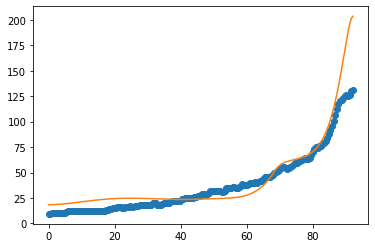

after perturb [4.256839773486879, 167.45054388789106, 24311.32824417833, 0.45843002771605845, 10.845441417087168]
parameters [4.256839773486879, 167.45054388789106, 24311.32824417833, 0.45843002771605845, 10.845441417087168]
after perturb [2.0640086850369603, 96.33315634794607, 20597.48712938215, 0.5273012233370254, 30.386908648067504]
parameters [2.0640086850369603, 96.33315634794607, 20597.48712938215, 0.5273012233370254, 30.386908648067504]
oxigeno [1.30059204e-10 1.30838004e-10 1.33188287e-10 1.37151967e-10
 1.42799752e-10 1.50232441e-10 1.59582771e-10 1.71017837e-10
 1.84742136e-10 2.01001285e-10 2.20086474e-10 2.42339744e-10
 2.68160167e-10 2.98011072e-10 3.32428421e-10 3.72030540e-10
 4.17529364e-10 4.69743479e-10 5.29613211e-10 5.98218127e-10
 6.76797311e-10 7.66772874e-10 8.69777182e-10 9.87684342e-10
 1.12264656e-09 1.27713599e-09 1.45399289e-09 1.65648082e-09
 1.88834996e-09 2.15390955e-09 2.45811099e-09 2.80664301e-09
 3.20604080e-09 3.66381120e-09 4.18857638e-09 4.79023821

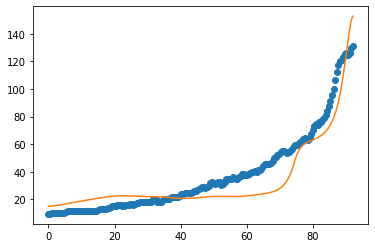

after perturb [13.158378088256423, 60.30253621756375, 24231.415162484056, 0.12048907987491289, 22.500661340432465]
parameters [13.158378088256423, 60.30253621756375, 24231.415162484056, 0.12048907987491289, 22.500661340432465]
after perturb [9.880376332474775, 50.22962640896371, 20424.486890725533, 0.12379402244437658, 19.5643670682419]
parameters [9.880376332474775, 50.22962640896371, 20424.486890725533, 0.12379402244437658, 19.5643670682419]
oxigeno [5.79053399e-04 5.78732353e-04 5.77770993e-04 5.76174626e-04
 5.73952033e-04 5.71115369e-04 5.67680035e-04 5.63664501e-04
 5.59090118e-04 5.53980888e-04 5.48363217e-04 5.42265649e-04
 5.35718589e-04 5.28754007e-04 5.21405153e-04 5.13706255e-04
 5.05692228e-04 4.97398397e-04 4.88860217e-04 4.80113017e-04
 4.71191758e-04 4.62130805e-04 4.52963728e-04 4.43723115e-04
 4.34440410e-04 4.25145775e-04 4.15867973e-04 4.06634272e-04
 3.97470369e-04 3.88400335e-04 3.79446583e-04 3.70629846e-04
 3.61969179e-04 3.53481972e-04 3.45183981e-04 3.37089364

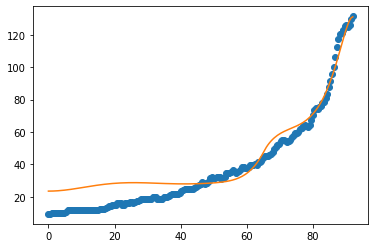

16
after perturb [10.868198291328362, 99.90526097789926, 26907.649956818543, 0.43736254373652506, 37.471423014470886]
parameters [10.868198291328362, 99.90526097789926, 26907.649956818543, 0.43736254373652506, 37.471423014470886]
after perturb [6.7260611085755695, 84.09771572090858, 23696.22845567332, 1.3171013190414549, 71.40895807682284]
parameters [6.7260611085755695, 84.09771572090858, 23696.22845567332, 1.3171013190414549, 71.40895807682284]
after perturb [6.623065153723088, 32.734714933787984, 22871.522459531592, 0.4125325375860661, 34.44027564998051]
parameters [6.623065153723088, 32.734714933787984, 22871.522459531592, 0.4125325375860661, 34.44027564998051]
oxigeno [4.13243089e-09 4.12571072e-09 4.10562718e-09 4.07240939e-09
 4.02643355e-09 3.96821467e-09 3.89839533e-09 3.81773209e-09
 3.72707971e-09 3.62737397e-09 3.51961357e-09 3.40484149e-09
 3.28412665e-09 3.15854605e-09 3.02916804e-09 2.89703693e-09
 2.76315928e-09 2.62849205e-09 2.49393279e-09 2.36031172e-09
 2.22838591e-

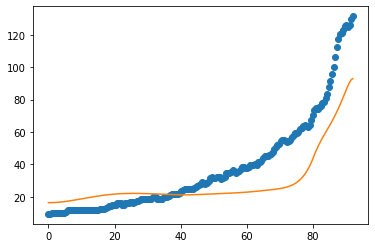

after perturb [10.500596217081725, 173.37047443770868, 25790.403963023076, 1.014088576771282, 24.18769308812737]
parameters [10.500596217081725, 173.37047443770868, 25790.403963023076, 1.014088576771282, 24.18769308812737]
after perturb [6.9711567431275085, 39.02163793963339, 27185.778835548077, 0.19130745045137687, 31.471830024723552]
parameters [6.9711567431275085, 39.02163793963339, 27185.778835548077, 0.19130745045137687, 31.471830024723552]
oxigeno [3.43530672e-05 3.43208543e-05 3.42244638e-05 3.40646363e-05
 3.38425931e-05 3.35600166e-05 3.32190241e-05 3.28221349e-05
 3.23722330e-05 3.18725237e-05 3.13264889e-05 3.07378387e-05
 3.01104624e-05 2.94483796e-05 2.87556919e-05 2.80365367e-05
 2.72950432e-05 2.65352916e-05 2.57612764e-05 2.49768730e-05
 2.41858089e-05 2.33916387e-05 2.25977244e-05 2.18072185e-05
 2.10230521e-05 2.02479260e-05 1.94843060e-05 1.87344204e-05
 1.80002614e-05 1.72835880e-05 1.65859317e-05 1.59086038e-05
 1.52527040e-05 1.46191313e-05 1.40085942e-05 1.342162

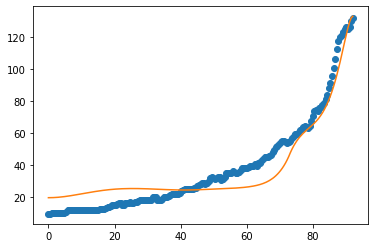

17
after perturb [3.8641048539474534, 43.1750739171856, 20240.1960991158, -0.4404673063167053, 3.9637076693481834]
parameters [3.8641048539474534, 43.1750739171856, 20240.1960991158, -0.4404673063167053, 3.9637076693481834]
after perturb [12.602007010933178, 84.06834274871565, 27645.367263088174, 1.2803465977679243, 47.10107430234381]
parameters [12.602007010933178, 84.06834274871565, 27645.367263088174, 1.2803465977679243, 47.10107430234381]
after perturb [3.641728760098847, 59.646959106466284, 21725.289248881352, -0.16961796139728336, 8.295456380609963]
parameters [3.641728760098847, 59.646959106466284, 21725.289248881352, -0.16961796139728336, 8.295456380609963]
after perturb [7.5711697544062835, 25.02225061147015, 21704.951971902596, 0.37965417173693977, 62.29703448833188]
parameters [7.5711697544062835, 25.02225061147015, 21704.951971902596, 0.37965417173693977, 62.29703448833188]
after perturb [6.997893551474139, 138.03804767278538, 22928.846333483074, 0.6372515650540838, 6.34039

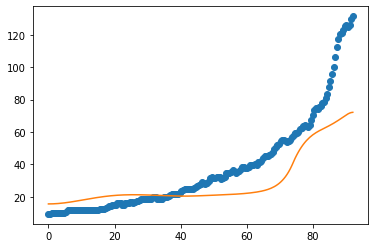

after perturb [7.275372551984681, 92.56643591353308, 28260.70502081437, 0.07186397819997375, 11.065473519596953]
parameters [7.275372551984681, 92.56643591353308, 28260.70502081437, 0.07186397819997375, 11.065473519596953]
oxigeno [9.48273592e-03 9.47990800e-03 9.47144049e-03 9.45738191e-03
 9.43781264e-03 9.41284417e-03 9.38261807e-03 9.34730472e-03
 9.30710181e-03 9.26223259e-03 9.21294405e-03 9.15950489e-03
 9.10220345e-03 9.04134555e-03 8.97725238e-03 8.91025834e-03
 8.84070905e-03 8.76895929e-03 8.69537121e-03 8.62031257e-03
 8.54415515e-03 8.46727335e-03 8.39004291e-03 8.31283985e-03
 8.23603956e-03 8.16001610e-03 8.08514159e-03 8.01178592e-03
 7.94031649e-03 7.87109815e-03 7.80449336e-03 7.74086239e-03
 7.68056371e-03 7.62395455e-03 7.57139152e-03 7.52323135e-03
 7.47983182e-03 7.44155270e-03 7.40875688e-03 7.38181157e-03
 7.36108960e-03 7.34697078e-03 7.33984347e-03 7.34010610e-03
 7.34816888e-03 7.36445554e-03 7.38940521e-03 7.42347429e-03
 7.46713853e-03 7.52089504e-03 7.5852

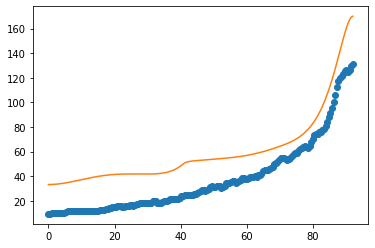

after perturb [10.066468276462977, -10.819943302386534, 25093.64276703554, 0.5972982027068805, 37.891781189024144]
parameters [10.066468276462977, -10.819943302386534, 25093.64276703554, 0.5972982027068805, 37.891781189024144]
after perturb [5.695063929705723, 210.24244086520508, 24064.566280614134, 1.2841574328924952, 46.07417821152077]
parameters [5.695063929705723, 210.24244086520508, 24064.566280614134, 1.2841574328924952, 46.07417821152077]
after perturb [3.9203992888966446, 101.07441600952824, 25456.420343846705, 0.5287097828341892, 52.634041587872005]
parameters [3.9203992888966446, 101.07441600952824, 25456.420343846705, 0.5287097828341892, 52.634041587872005]
after perturb [4.997273603737725, 29.668303540053778, 21179.3331610192, 0.7672939006661632, 61.55314049330324]
parameters [4.997273603737725, 29.668303540053778, 21179.3331610192, 0.7672939006661632, 61.55314049330324]
after perturb [6.088781890688045, 170.9037549411884, 22254.464642869167, 1.3978017350591352, 52.59217162

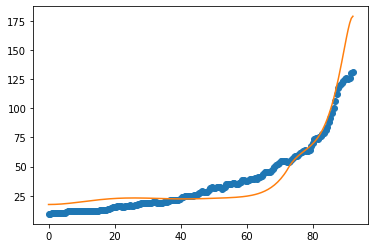

after perturb [4.287952262116023, 127.209186078172, 25479.63460119752, 0.4764901260608516, 39.833449093675256]
parameters [4.287952262116023, 127.209186078172, 25479.63460119752, 0.4764901260608516, 39.833449093675256]
oxigeno [8.11309619e-09 8.15445771e-09 8.27899319e-09 8.48806135e-09
 8.78394683e-09 9.16989038e-09 9.65013176e-09 1.02299654e-08
 1.09158099e-08 1.17152911e-08 1.26373414e-08 1.36923145e-08
 1.48921179e-08 1.62503653e-08 1.77825492e-08 1.95062376e-08
 2.14412964e-08 2.36101401e-08 2.60380147e-08 2.87533171e-08
 3.17879528e-08 3.51777397e-08 3.89628602e-08 4.31883699e-08
 4.79047663e-08 5.31686278e-08 5.90433273e-08 6.55998311e-08
 7.29175904e-08 8.10855368e-08 9.02031915e-08 1.00381900e-07
 1.11746203e-07 1.24435368e-07 1.38605071e-07 1.54429285e-07
 1.72102345e-07 1.91841257e-07 2.13888231e-07 2.38513498e-07
 2.66018407e-07 2.96738853e-07 3.31049067e-07 3.69365791e-07
 4.12152905e-07 4.59926527e-07 5.13260671e-07 5.72793494e-07
 6.39234218e-07 7.13370804e-07 7.96078443

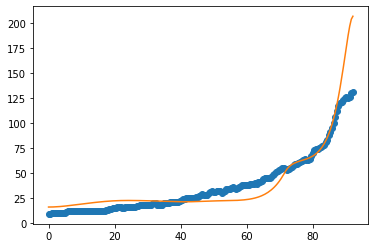

after perturb [7.797441495301396, 32.61700312292572, 24886.397147957858, 0.9210848640289436, 65.75350968572099]
parameters [7.797441495301396, 32.61700312292572, 24886.397147957858, 0.9210848640289436, 65.75350968572099]
after perturb [-2.2867692136331943, 153.987078984856, 26614.649730496047, 0.5993341444995504, 20.282022006674453]
parameters [-2.2867692136331943, 153.987078984856, 26614.649730496047, 0.5993341444995504, 20.282022006674453]
after perturb [2.740585165042832, 124.17806866898822, 24206.0789549166, 0.49928925104652155, 26.589482700798353]
parameters [2.740585165042832, 124.17806866898822, 24206.0789549166, 0.49928925104652155, 26.589482700798353]
oxigeno [4.27764362e-09 4.30100602e-09 4.37137096e-09 4.48957579e-09
 4.65702953e-09 4.87573331e-09 5.14830902e-09 5.47803658e-09
 5.86890007e-09 6.32564319e-09 6.85383463e-09 7.45994411e-09
 8.15143000e-09 8.93683975e-09 9.82592453e-09 1.08297698e-08
 1.19609437e-08 1.32336660e-08 1.46639994e-08 1.62700672e-08
 1.80723002e-08 2.

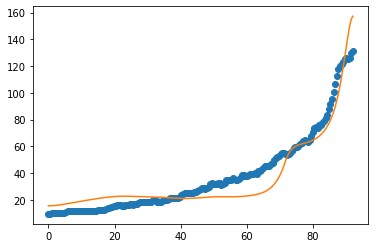

18
after perturb [0.4583487806487283, 56.72864911081758, 24184.869910425532, 0.15353900781169777, 23.948319369878245]
parameters [0.4583487806487283, 56.72864911081758, 24184.869910425532, 0.15353900781169777, 23.948319369878245]
oxigeno [2.00205385e-04 1.99984312e-04 1.99329800e-04 1.98266175e-04
 1.96828594e-04 1.95056738e-04 1.92988779e-04 1.90657130e-04
 1.88086764e-04 1.85296102e-04 1.82299839e-04 1.79112623e-04
 1.75752349e-04 1.72242007e-04 1.68609468e-04 1.64885315e-04
 1.61099483e-04 1.57277834e-04 1.53439694e-04 1.49596948e-04
 1.45754749e-04 1.41913476e-04 1.38071431e-04 1.34227762e-04
 1.30385100e-04 1.26551398e-04 1.22740485e-04 1.18971049e-04
 1.15264168e-04 1.11640029e-04 1.08114817e-04 1.04698733e-04
 1.01395682e-04 9.82045640e-05 9.51215512e-05 9.21425228e-05
 8.92649912e-05 8.64892051e-05 8.38184539e-05 8.12587588e-05
 7.88181236e-05 7.65054526e-05 7.43292419e-05 7.22962278e-05
 7.04102769e-05 6.86718250e-05 6.70780594e-05 6.56238152e-05
 6.43029169e-05 6.31095473e-05

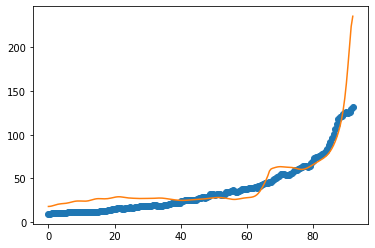

after perturb [11.148215260371675, 120.66130677072873, 20900.772845330248, 0.7652557475065391, 25.326313562703564]
parameters [11.148215260371675, 120.66130677072873, 20900.772845330248, 0.7652557475065391, 25.326313562703564]
after perturb [8.111654351422203, 98.19213844090028, 28676.76967950881, 0.19602477057684858, 19.063988716960633]
parameters [8.111654351422203, 98.19213844090028, 28676.76967950881, 0.19602477057684858, 19.063988716960633]
oxigeno [2.13883944e-05 2.13815292e-05 2.13610085e-05 2.13270575e-05
 2.12800498e-05 2.12205066e-05 2.11490936e-05 2.10666189e-05
 2.09740291e-05 2.08724067e-05 2.07629657e-05 2.06470486e-05
 2.05261226e-05 2.04017770e-05 2.02757198e-05 2.01497765e-05
 2.00258887e-05 1.99061137e-05 1.97926255e-05 1.96877170e-05
 1.95938032e-05 1.95134262e-05 1.94492616e-05 1.94041269e-05
 1.93809909e-05 1.93829859e-05 1.94134212e-05 1.94757989e-05
 1.95738319e-05 1.97114639e-05 1.98928922e-05 2.01225923e-05
 2.04053456e-05 2.07462697e-05 2.11508515e-05 2.162498

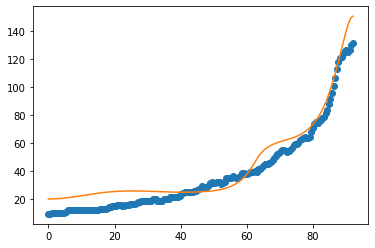

19
after perturb [3.136084701066748, 176.782305477454, 25079.614111925937, 1.2793379014748125, 79.74305342987613]
parameters [3.136084701066748, 176.782305477454, 25079.614111925937, 1.2793379014748125, 79.74305342987613]
after perturb [3.6113453145485095, 122.80787647226826, 23989.742697882626, 0.4345829185462172, 27.980841824503027]
parameters [3.6113453145485095, 122.80787647226826, 23989.742697882626, 0.4345829185462172, 27.980841824503027]
oxigeno [1.42472877e-08 1.43145702e-08 1.45171450e-08 1.48572025e-08
 1.53384247e-08 1.59660325e-08 1.67468516e-08 1.76893999e-08
 1.88039939e-08 2.01028780e-08 2.16003770e-08 2.33130727e-08
 2.52600076e-08 2.74629178e-08 2.99464984e-08 3.27387028e-08
 3.58710834e-08 3.93791742e-08 4.33029231e-08 4.76871786e-08
 5.25822368e-08 5.80444564e-08 6.41369497e-08 7.09303571e-08
 7.85037152e-08 8.69454287e-08 9.63543568e-08 1.06841027e-07
 1.18528986e-07 1.31556313e-07 1.46077289e-07 1.62264265e-07
 1.80309729e-07 2.00428593e-07 2.22860730e-07 2.4787377

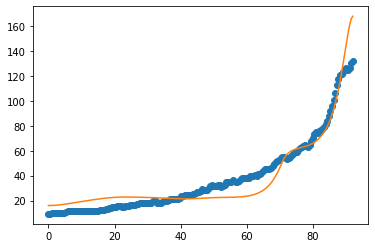

20
parameters [5.673782785911348, 86.39381052615116, 24618.80999250796, 0.3338242430754075, 19.169805029433373]
parameters [6.69735514807139, 68.52334608529321, 22454.02204824499, 0.2612432958793589, 30.013154185774273]
parameters [5.610706588400783, 144.05853081525856, 26197.321021106723, 0.7150469898849394, 29.658357740581433]
parameters [3.9841678744580387, 103.52427476614324, 22041.020049979794, 0.1795545719181909, 14.547931604522876]
parameters [6.924586741388051, 58.18998698764297, 25422.471557141667, 0.2392753168574384, 25.592259556433106]
parameters [4.819915342222956, 86.38020475196663, 26865.194914287888, 0.39999955322906783, 30.659890635031623]
parameters [5.729846160681065, 105.44305202010064, 22473.16750971993, 0.29643115942619724, 15.335281037641]
parameters [3.587318678581517, 134.362535761825, 24045.94074075921, 0.2988778628614724, 20.780816099417663]
parameters [5.136183657696723, 69.01175903824156, 25203.906844999216, 0.38191458249507626, 36.09716262757615]
parameters

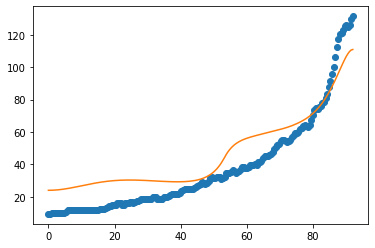

after perturb [5.674927019879561, 138.50649541811163, 25049.23738076129, 0.9944286326398484, 52.89918463798311]
parameters [5.674927019879561, 138.50649541811163, 25049.23738076129, 0.9944286326398484, 52.89918463798311]
after perturb [3.96341123028944, 116.04122795663571, 23728.06167572302, 0.613440439277366, 41.39929723287808]
parameters [3.96341123028944, 116.04122795663571, 23728.06167572302, 0.613440439277366, 41.39929723287808]
oxigeno [2.16300590e-10 2.17855632e-10 2.22543855e-10 2.30434959e-10
 2.41646482e-10 2.56345885e-10 2.74753512e-10 2.97146469e-10
 3.23863490e-10 3.55310862e-10 3.91969507e-10 4.34403339e-10
 4.83269035e-10 5.39327386e-10 6.03456432e-10 6.76666614e-10
 7.60118197e-10 8.55141303e-10 9.63258894e-10 1.08621314e-09
 1.22599563e-09 1.38488199e-09 1.56547153e-09 1.77073258e-09
 2.00405442e-09 2.26930658e-09 2.57090662e-09 2.91389760e-09
 3.30403630e-09 3.74789401e-09 4.25297117e-09 4.82782800e-09
 5.48223293e-09 6.22733132e-09 7.07583696e-09 8.04224914e-09
 9.14

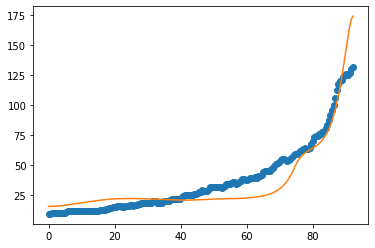

after perturb [6.300533661543657, 139.4366885506268, 31865.785082509843, 0.6499063007116839, 47.34320657813425]
parameters [6.300533661543657, 139.4366885506268, 31865.785082509843, 0.6499063007116839, 47.34320657813425]
after perturb [9.001503621661467, 21.025827003398575, 23705.55934153532, 0.05023266699371498, 19.200837607610467]
parameters [9.001503621661467, 21.025827003398575, 23705.55934153532, 0.05023266699371498, 19.200837607610467]
oxigeno [2.80704802e-02 2.80510927e-02 2.79930743e-02 2.78968556e-02
 2.77631476e-02 2.75929310e-02 2.73874430e-02 2.71481596e-02
 2.68767761e-02 2.65751848e-02 2.62454517e-02 2.58897926e-02
 2.55105504e-02 2.51101756e-02 2.46912129e-02 2.42562985e-02
 2.38081731e-02 2.33497148e-02 2.28839774e-02 2.24141345e-02
 2.19427825e-02 2.14719665e-02 2.10036339e-02 2.05396036e-02
 2.00815366e-02 1.96309461e-02 1.91892041e-02 1.87575443e-02
 1.83370637e-02 1.79287254e-02 1.75333629e-02 1.71516863e-02
 1.67842876e-02 1.64316479e-02 1.60941440e-02 1.57720553e-

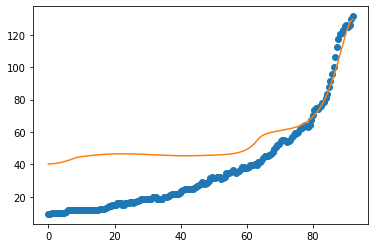

after perturb [6.630708362090205, 158.01774392325387, 28713.632906239258, 0.38654363220456917, 20.31190334478768]
parameters [6.630708362090205, 158.01774392325387, 28713.632906239258, 0.38654363220456917, 20.31190334478768]
after perturb [9.486437978871045, 82.74936547758115, 27331.536842201414, 0.2796303956778988, 20.26837726199775]
parameters [9.486437978871045, 82.74936547758115, 27331.536842201414, 0.2796303956778988, 20.26837726199775]
oxigeno [5.09480264e-07 5.09203883e-07 5.08377240e-07 5.07007824e-07
 5.05108079e-07 5.02695337e-07 4.99791741e-07 4.96424146e-07
 4.92624012e-07 4.88427282e-07 4.83874267e-07 4.79009534e-07
 4.73881809e-07 4.68543893e-07 4.63052619e-07 4.57468834e-07
 4.51857434e-07 4.46287448e-07 4.40832185e-07 4.35569452e-07
 4.30581852e-07 4.25957169e-07 4.21788853e-07 4.18176606e-07
 4.15227099e-07 4.13054800e-07 4.11782955e-07 4.11544719e-07
 4.12484445e-07 4.14759165e-07 4.18540264e-07 4.24015361e-07
 4.31390444e-07 4.40892244e-07 4.52770902e-07 4.67302947e-

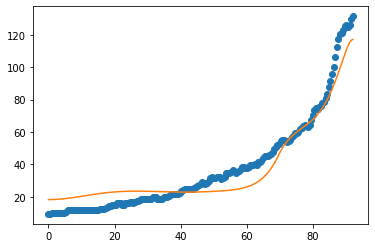

1
after perturb [8.28201972118023, 39.579995303986465, 21555.884116585035, 0.09375407909869606, 21.727268910868762]
parameters [8.28201972118023, 39.579995303986465, 21555.884116585035, 0.09375407909869606, 21.727268910868762]
oxigeno [2.74820126e-03 2.74656978e-03 2.74168557e-03 2.73357914e-03
 2.72230092e-03 2.70792059e-03 2.69052622e-03 2.67022313e-03
 2.64713264e-03 2.62139057e-03 2.59314568e-03 2.56255794e-03
 2.52979681e-03 2.49503941e-03 2.45846874e-03 2.42027190e-03
 2.38063836e-03 2.33975830e-03 2.29782111e-03 2.25501389e-03
 2.21152016e-03 2.16751866e-03 2.12318231e-03 2.07867729e-03
 2.03416228e-03 1.98978778e-03 1.94569564e-03 1.90201864e-03
 1.85888023e-03 1.81639434e-03 1.77466533e-03 1.73378795e-03
 1.69384750e-03 1.65491993e-03 1.61707207e-03 1.58036190e-03
 1.54483886e-03 1.51054418e-03 1.47751128e-03 1.44576614e-03
 1.41532773e-03 1.38620846e-03 1.35841455e-03 1.33194652e-03
 1.30679964e-03 1.28296432e-03 1.26042658e-03 1.23916845e-03
 1.21916839e-03 1.20040172e-03 1.

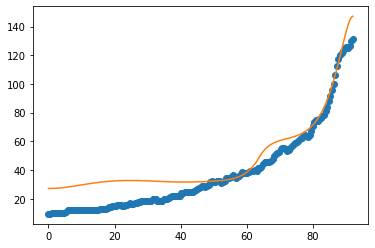

after perturb [10.313754330635572, 168.89525893762308, 32316.44494142375, 0.7418292606757162, 29.13325867115761]
parameters [10.313754330635572, 168.89525893762308, 32316.44494142375, 0.7418292606757162, 29.13325867115761]
after perturb [11.080646381876477, -1.8686405579836247, 17716.254970746853, -0.12679314847083123, 19.967221284539733]
parameters [11.080646381876477, -1.8686405579836247, 17716.254970746853, -0.12679314847083123, 19.967221284539733]
after perturb [8.079555248306011, 5.975446267799256, 19848.914201579504, 0.042654414036112934, 25.23751701981586]
parameters [8.079555248306011, 5.975446267799256, 19848.914201579504, 0.042654414036112934, 25.23751701981586]
after perturb [11.839857679429008, 123.74102421586777, 18225.774256704055, 0.537762728472675, 32.89801738161964]
parameters [11.839857679429008, 123.74102421586777, 18225.774256704055, 0.537762728472675, 32.89801738161964]
after perturb [8.20101383210477, 116.27087213919157, 29768.07559723252, 0.1468476721425679, 14.5

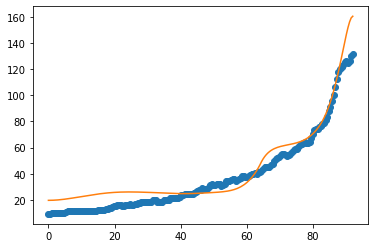

2
after perturb [11.81091152044752, 54.379658977997245, 28237.009569387454, 0.5125605385740187, 44.48552710226171]
parameters [11.81091152044752, 54.379658977997245, 28237.009569387454, 0.5125605385740187, 44.48552710226171]
after perturb [9.288524581307476, 75.73179594070223, 23376.624514723797, 0.4463469770214944, 36.88969462941759]
parameters [9.288524581307476, 75.73179594070223, 23376.624514723797, 0.4463469770214944, 36.88969462941759]
oxigeno [6.03338652e-10 6.03031103e-10 6.02116627e-10 6.00619773e-10
 5.98581596e-10 5.96059866e-10 5.93129393e-10 5.89882483e-10
 5.86429546e-10 5.82899911e-10 5.79442868e-10 5.76229003e-10
 5.73451871e-10 5.71330083e-10 5.70109868e-10 5.70068194e-10
 5.71516557e-10 5.74805512e-10 5.80330097e-10 5.88536265e-10
 5.99928480e-10 6.15078659e-10 6.34636653e-10 6.59342497e-10
 6.90040695e-10 7.27696832e-10 7.73416875e-10 8.28469536e-10
 8.94312182e-10 9.72620794e-10 1.06532459e-09 1.17464599e-09
 1.30314678e-09 1.45378122e-09 1.62995744e-09 1.83560795e-

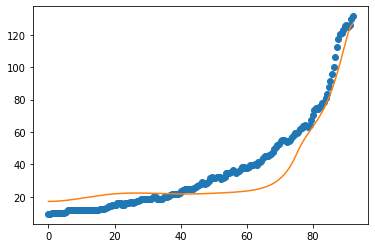

after perturb [4.574805052431503, 137.26503214220259, 20976.400911853194, 0.4776045030496735, 24.703029311919245]
parameters [4.574805052431503, 137.26503214220259, 20976.400911853194, 0.4776045030496735, 24.703029311919245]
oxigeno [1.89464320e-08 1.90373806e-08 1.93111430e-08 1.97704804e-08
 2.04200331e-08 2.12663777e-08 2.23181085e-08 2.35859433e-08
 2.50828545e-08 2.68242271e-08 2.88280450e-08 3.11151077e-08
 3.37092793e-08 3.66377734e-08 3.99314765e-08 4.36253132e-08
 4.77586592e-08 5.23758050e-08 5.75264772e-08 6.32664230e-08
 6.96580656e-08 7.67712371e-08 8.46839987e-08 9.34835566e-08
 1.03267285e-07 1.14143867e-07 1.26234565e-07 1.39674636e-07
 1.54614901e-07 1.71223500e-07 1.89687821e-07 2.10216655e-07
 2.33042569e-07 2.58424540e-07 2.86650859e-07 3.18042336e-07
 3.52955839e-07 3.91788189e-07 4.34980453e-07 4.83022666e-07
 5.36459033e-07 5.95893642e-07 6.61996767e-07 7.35511782e-07
 8.17262795e-07 9.08163033e-07 1.00922410e-06 1.12156615e-06
 1.24642917e-06 1.38518533e-06 1.53

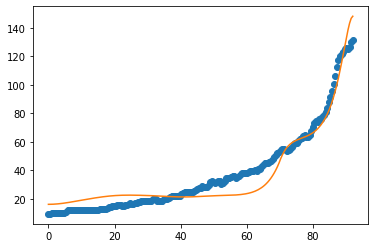

3
after perturb [9.933265870522382, 81.48197501848296, 23079.958549089195, 0.17690519353306816, 15.171465509720676]
parameters [9.933265870522382, 81.48197501848296, 23079.958549089195, 0.17690519353306816, 15.171465509720676]
oxigeno [4.32643621e-05 4.32444581e-05 4.31848611e-05 4.30859146e-05
 4.29481887e-05 4.27724745e-05 4.25597787e-05 4.23113152e-05
 4.20284963e-05 4.17129221e-05 4.13663690e-05 4.09907779e-05
 4.05882411e-05 4.01609896e-05 3.97113803e-05 3.92418831e-05
 3.87550686e-05 3.82535971e-05 3.77402075e-05 3.72177083e-05
 3.66889695e-05 3.61569159e-05 3.56245224e-05 3.50948110e-05
 3.45708493e-05 3.40557517e-05 3.35526824e-05 3.30648602e-05
 3.25955663e-05 3.21481538e-05 3.17260602e-05 3.13328214e-05
 3.09720893e-05 3.06476512e-05 3.03634524e-05 3.01236210e-05
 2.99324957e-05 2.97946569e-05 2.97149604e-05 2.96985744e-05
 2.97510199e-05 2.98782146e-05 3.00865203e-05 3.03827948e-05
 3.07744474e-05 3.12694990e-05 3.18766471e-05 3.26053358e-05
 3.34658314e-05 3.44693039e-05 3.

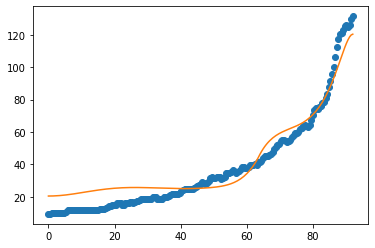

4
after perturb [4.1207808991281825, 69.88751189183061, 22024.889078873457, 0.35430490159867023, 33.928352569341975]
parameters [4.1207808991281825, 69.88751189183061, 22024.889078873457, 0.35430490159867023, 33.928352569341975]
oxigeno [3.59698829e-08 3.59337028e-08 3.58255091e-08 3.56463351e-08
 3.53978805e-08 3.50824781e-08 3.47030505e-08 3.42630568e-08
 3.37664326e-08 3.32175260e-08 3.26210307e-08 3.19819209e-08
 3.13053876e-08 3.05967809e-08 2.98615576e-08 2.91052376e-08
 2.83333681e-08 2.75514977e-08 2.67651599e-08 2.59798667e-08
 2.52011120e-08 2.44343843e-08 2.36851896e-08 2.29590838e-08
 2.22617146e-08 2.15988736e-08 2.09765587e-08 2.04010477e-08
 1.98789837e-08 1.94174739e-08 1.90242027e-08 1.87075617e-08
 1.84767971e-08 1.83421789e-08 1.83151925e-08 1.84087572e-08
 1.86374744e-08 1.90179094e-08 1.95689110e-08 2.03119752e-08
 2.12716559e-08 2.24760321e-08 2.39572364e-08 2.57520546e-08
 2.79026046e-08 3.04571066e-08 3.34707560e-08 3.70067130e-08
 4.11372256e-08 4.59449040e-08 

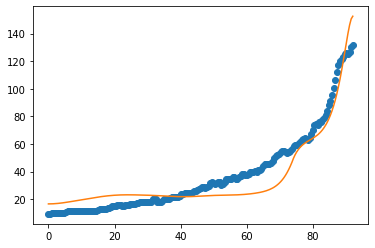

after perturb [6.132194657390796, 128.9757065065034, 23499.62367756936, 0.524743687374885, 24.232317266331336]
parameters [6.132194657390796, 128.9757065065034, 23499.62367756936, 0.524743687374885, 24.232317266331336]
oxigeno [4.00349806e-09 4.02637687e-09 4.09528064e-09 4.21101511e-09
 4.37493555e-09 4.58896550e-09 4.85562332e-09 5.17805691e-09
 5.56008706e-09 6.00625998e-09 6.52190967e-09 7.11323104e-09
 7.78736463e-09 8.55249414e-09 9.41795807e-09 1.03943770e-08
 1.14937979e-08 1.27298582e-08 1.41179710e-08 1.56755341e-08
 1.74221661e-08 1.93799721e-08 2.15738434e-08 2.40317938e-08
 2.67853382e-08 2.98699177e-08 3.33253766e-08 3.71964980e-08
 4.15336033e-08 4.63932248e-08 5.18388581e-08 5.79418039e-08
 6.47821095e-08 7.24496200e-08 8.10451531e-08 9.06818095e-08
 1.01486434e-07 1.13601246e-07 1.27185654e-07 1.42418275e-07
 1.59499191e-07 1.78652448e-07 2.00128845e-07 2.24209035e-07
 2.51206970e-07 2.81473733e-07 3.15401802e-07 3.53429785e-07
 3.96047682e-07 4.43802736e-07 4.97305932

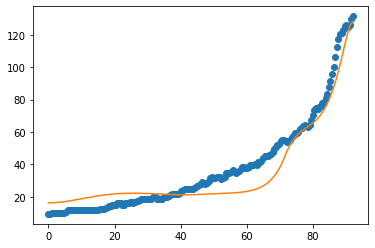

after perturb [15.238284827995972, 68.36792125578859, 17987.04493146175, 0.20701083626822037, 16.206092396611293]
parameters [15.238284827995972, 68.36792125578859, 17987.04493146175, 0.20701083626822037, 16.206092396611293]
after perturb [7.740043633454082, 26.554184147710735, 19790.054694380222, -0.5287293986453451, -11.428911026323686]
parameters [7.740043633454082, 26.554184147710735, 19790.054694380222, -0.5287293986453451, -11.428911026323686]
after perturb [8.350303029829664, 95.50663481074827, 27554.84474264414, 0.7118521828336062, 28.848191548201]
parameters [8.350303029829664, 95.50663481074827, 27554.84474264414, 0.7118521828336062, 28.848191548201]
oxigeno [2.41523435e-12 2.44133575e-12 2.52020395e-12 2.65354405e-12
 2.84424202e-12 3.09643198e-12 3.41559273e-12 3.80867590e-12
 4.28426895e-12 4.85279684e-12 5.52676765e-12 6.32106799e-12
 7.25331556e-12 8.34427763e-12 9.61836577e-12 1.11042189e-11
 1.28353894e-11 1.48511486e-11 1.71974327e-11 1.99279502e-11
 2.31054813e-11 2.

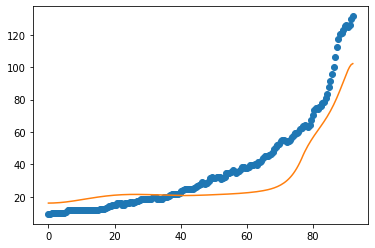

after perturb [12.322856555566396, 91.39383089600551, 22226.7660770391, 0.32392342895334786, 18.012798396748902]
parameters [12.322856555566396, 91.39383089600551, 22226.7660770391, 0.32392342895334786, 18.012798396748902]
after perturb [14.610392938237732, -18.759387177521987, 25052.980240202225, 0.10378797462032517, 32.869560844773716]
parameters [14.610392938237732, -18.759387177521987, 25052.980240202225, 0.10378797462032517, 32.869560844773716]
after perturb [7.558653114162994, 73.96130357893367, 23903.522171714194, 0.015252465391531467, 21.748811078745206]
parameters [7.558653114162994, 73.96130357893367, 23903.522171714194, 0.015252465391531467, 21.748811078745206]
oxigeno [ 2.52468051  2.52438509  2.52350016  2.52202966  2.51998014  2.51736067
  2.51418281  2.51046047  2.50620981  2.50144914  2.49619874  2.49048074
  2.48431893  2.47773862  2.47076644  2.46343018  2.45575865  2.44778145
  2.43952883  2.43103154  2.42232068  2.4134275   2.40438335  2.39521945
  2.38596683  2.376

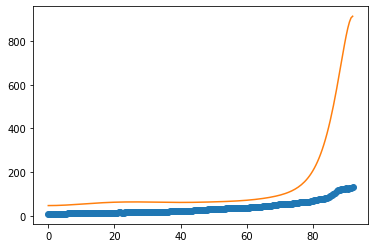

after perturb [9.175933239527563, 182.9100437729328, 24330.299037225428, 0.2939918049222866, 14.513982253511038]
parameters [9.175933239527563, 182.9100437729328, 24330.299037225428, 0.2939918049222866, 14.513982253511038]
after perturb [7.360552035979628, 28.016598534117747, 19648.96249828302, -0.12419633674755833, 7.727364011553616]
parameters [7.360552035979628, 28.016598534117747, 19648.96249828302, -0.12419633674755833, 7.727364011553616]
after perturb [8.68195372235611, 115.0103885098921, 31145.74037076813, 0.7025076410055241, 52.62704789887404]
parameters [8.68195372235611, 115.0103885098921, 31145.74037076813, 0.7025076410055241, 52.62704789887404]
after perturb [4.744022714439205, 128.30335192099457, 27659.177746872785, 0.5600553052745287, 22.38105821300941]
parameters [4.744022714439205, 128.30335192099457, 27659.177746872785, 0.5600553052745287, 22.38105821300941]
oxigeno [2.00345978e-09 2.01551998e-09 2.05185020e-09 2.11290148e-09
 2.19943303e-09 2.31252354e-09 2.45358726e-

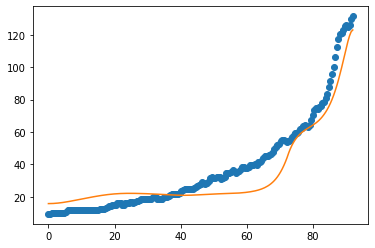

after perturb [6.409954485103522, 126.45447871775879, 27495.97501041432, 0.5168350108462118, 39.16772265443661]
parameters [6.409954485103522, 126.45447871775879, 27495.97501041432, 0.5168350108462118, 39.16772265443661]
oxigeno [3.49547200e-09 3.51537660e-09 3.57532295e-09 3.67601186e-09
 3.81862211e-09 4.00482666e-09 4.23681568e-09 4.51732665e-09
 4.84968199e-09 5.23783456e-09 5.68642187e-09 6.20082942e-09
 6.78726430e-09 7.45283982e-09 8.20567237e-09 9.05499191e-09
 1.00112673e-08 1.10863487e-08 1.22936280e-08 1.36482205e-08
 1.51671697e-08 1.68696777e-08 1.87773649e-08 2.09145619e-08
 2.33086372e-08 2.59903660e-08 2.89943429e-08 3.23594462e-08
 3.61293568e-08 4.03531404e-08 4.50858990e-08 5.03894990e-08
 5.63333863e-08 6.29954959e-08 7.04632683e-08 7.88347827e-08
 8.82200225e-08 9.87422840e-08 1.10539748e-07 1.23767227e-07
 1.38598116e-07 1.55226556e-07 1.73869849e-07 1.94771135e-07
 2.18202378e-07 2.44467682e-07 2.73906972e-07 3.06900094e-07
 3.43871363e-07 3.85294622e-07 4.316988

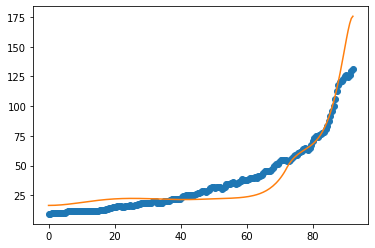

after perturb [8.453225053400232, 191.78916500868866, 27091.81638955723, 1.178329231286887, 50.69893592387063]
parameters [8.453225053400232, 191.78916500868866, 27091.81638955723, 1.178329231286887, 50.69893592387063]
after perturb [6.842416573659783, 87.8578613999486, 25311.66272647304, 0.5944059918328966, 48.81238800339551]
parameters [6.842416573659783, 87.8578613999486, 25311.66272647304, 0.5944059918328966, 48.81238800339551]
oxigeno [7.92620251e-12 7.98926726e-12 8.17978417e-12 8.50175006e-12
 8.96192271e-12 9.56996797e-12 1.03386704e-11 1.12842128e-11
 1.24265304e-11 1.37897487e-11 1.54027157e-11 1.72996389e-11
 1.95208446e-11 2.21136753e-11 2.51335470e-11 2.86451904e-11
 3.27241056e-11 3.74582634e-11 4.29500927e-11 4.93188002e-11
 5.67030758e-11 6.52642459e-11 7.51899465e-11 8.66984012e-11
 1.00043401e-10 1.15520096e-10 1.33471740e-10 1.54297522e-10
 1.78461678e-10 2.06504077e-10 2.39052510e-10 2.76836969e-10
 3.20706202e-10 3.71646936e-10 4.30806148e-10 4.99516889e-10
 5.7932

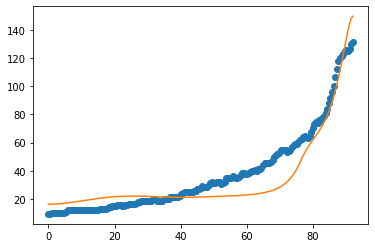

after perturb [4.964651059947039, 136.44051173743446, 23031.298791364836, 0.3612727684571514, 18.46593013005959]
parameters [4.964651059947039, 136.44051173743446, 23031.298791364836, 0.3612727684571514, 18.46593013005959]
oxigeno [1.96576130e-07 1.97282734e-07 1.99408407e-07 2.02970795e-07
 2.07999500e-07 2.14536373e-07 2.22635927e-07 2.32365870e-07
 2.43807769e-07 2.57057836e-07 2.72227864e-07 2.89446296e-07
 3.08859459e-07 3.30632951e-07 3.54953212e-07 3.82029286e-07
 4.12094782e-07 4.45410068e-07 4.82264707e-07 5.22980158e-07
 5.67912769e-07 6.17457094e-07 6.72049548e-07 7.32172457e-07
 7.98358503e-07 8.71195635e-07 9.51332461e-07 1.03948418e-06
 1.13643906e-06 1.24306559e-06 1.36032027e-06 1.48925609e-06
 1.63103190e-06 1.78692247e-06 1.95832962e-06 2.14679419e-06
 2.35400911e-06 2.58183367e-06 2.83230889e-06 3.10767432e-06
 3.41038624e-06 3.74313738e-06 4.10887841e-06 4.51084125e-06
 4.95256436e-06 5.43792029e-06 5.97114565e-06 6.55687369e-06
 7.20016979e-06 7.90657017e-06 8.6821

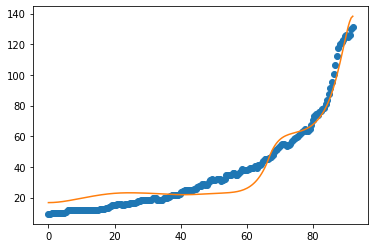

5
after perturb [10.029114009910291, 37.44982185661382, 25120.23855890522, 0.6063083889584296, 48.12055623339064]
parameters [10.029114009910291, 37.44982185661382, 25120.23855890522, 0.6063083889584296, 48.12055623339064]
after perturb [-1.1188412193272996, 164.64480717961283, 22964.788321361153, 0.5693910250979995, 19.575689244790755]
parameters [-1.1188412193272996, 164.64480717961283, 22964.788321361153, 0.5693910250979995, 19.575689244790755]
after perturb [4.291680542524521, 72.82503005894458, 25594.1600410733, 0.40457644090450773, 25.39096848976625]
parameters [4.291680542524521, 72.82503005894458, 25594.1600410733, 0.40457644090450773, 25.39096848976625]
oxigeno [3.89327949e-09 3.88952708e-09 3.87831426e-09 3.85977356e-09
 3.83412376e-09 3.80166680e-09 3.76278377e-09 3.71793010e-09
 3.66763024e-09 3.61247223e-09 3.55310229e-09 3.49021994e-09
 3.42457375e-09 3.35695820e-09 3.28821178e-09 3.21921660e-09
 3.15089982e-09 3.08423688e-09 3.02025702e-09 2.96005093e-09
 2.90478111e-09 

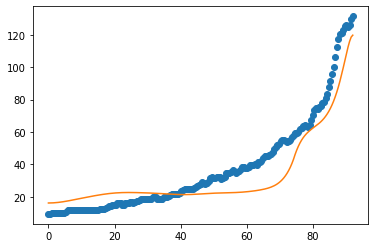

after perturb [6.731353443004931, 76.3785902416765, 19716.266150859992, 0.24214614284158548, 29.974715657590828]
parameters [6.731353443004931, 76.3785902416765, 19716.266150859992, 0.24214614284158548, 29.974715657590828]
after perturb [6.850053740526949, 107.21375695130328, 22151.118165142176, 0.2491109406040938, 25.93900289977693]
parameters [6.850053740526949, 107.21375695130328, 22151.118165142176, 0.2491109406040938, 25.93900289977693]
oxigeno [2.52238581e-06 2.52250872e-06 2.52289485e-06 2.52359647e-06
 2.52470074e-06 2.52632982e-06 2.52864098e-06 2.53182686e-06
 2.53611576e-06 2.54177210e-06 2.54909698e-06 2.55842901e-06
 2.57014526e-06 2.58466257e-06 2.60243908e-06 2.62397612e-06
 2.64982054e-06 2.68056731e-06 2.71686276e-06 2.75940816e-06
 2.80896396e-06 2.86635452e-06 2.93247356e-06 3.00829018e-06
 3.09485575e-06 3.19331142e-06 3.30489654e-06 3.43095802e-06
 3.57296051e-06 3.73249772e-06 3.91130474e-06 4.11127161e-06
 4.33445804e-06 4.58310957e-06 4.85967507e-06 5.16682585e-

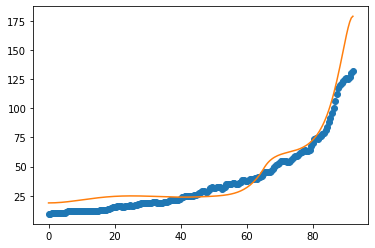

after perturb [9.861494644185898, 97.68073745715972, 24801.83626722578, 0.3869729236055053, 25.95577331800348]
parameters [9.861494644185898, 97.68073745715972, 24801.83626722578, 0.3869729236055053, 25.95577331800348]
oxigeno [8.02188389e-09 8.03747560e-09 8.08451638e-09 8.16380643e-09
 8.27669012e-09 8.42507222e-09 8.61144101e-09 8.83889866e-09
 9.11119936e-09 9.43279581e-09 9.80889492e-09 1.02455234e-08
 1.07496044e-08 1.13290467e-08 1.19928469e-08 1.27512071e-08
 1.36156695e-08 1.45992697e-08 1.57167107e-08 1.69845612e-08
 1.84214792e-08 2.00484659e-08 2.18891517e-08 2.39701198e-08
 2.63212700e-08 2.89762293e-08 3.19728137e-08 3.53535469e-08
 3.91662446e-08 4.34646689e-08 4.83092645e-08 5.37679829e-08
 5.99172081e-08 6.68427923e-08 7.46412172e-08 8.34208927e-08
 9.33036119e-08 1.04426176e-07 1.16942214e-07 1.31024211e-07
 1.46865784e-07 1.64684207e-07 1.84723246e-07 2.07256312e-07
 2.32589981e-07 2.61067916e-07 2.93075241e-07 3.29043414e-07
 3.69455653e-07 4.14852976e-07 4.65840929

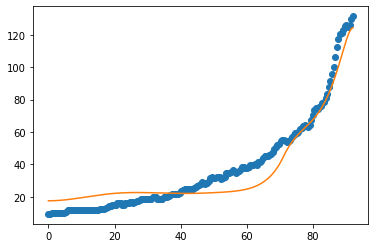

6
after perturb [9.284951878627465, 116.93105418839203, 21234.10073077918, 0.5602797720735495, 11.31392610605348]
parameters [9.284951878627465, 116.93105418839203, 21234.10073077918, 0.5602797720735495, 11.31392610605348]
oxigeno [5.60700840e-10 5.64648655e-10 5.76547818e-10 5.96566362e-10
 6.24987259e-10 6.62212851e-10 7.08771154e-10 7.65324130e-10
 8.32678075e-10 9.11796276e-10 1.00381416e-09 1.11005714e-09
 1.23206152e-09 1.37159873e-09 1.53070327e-09 1.71170488e-09
 1.91726541e-09 2.15042094e-09 2.41462995e-09 2.71382808e-09
 3.05249061e-09 3.43570344e-09 3.86924374e-09 4.35967159e-09
 4.91443396e-09 5.54198262e-09 6.25190787e-09 7.05509009e-09
 7.96387133e-09 8.99224966e-09 1.01560991e-08 1.14734185e-08
 1.29646129e-08 1.46528113e-08 1.65642265e-08 1.87285608e-08
 2.11794643e-08 2.39550522e-08 2.70984880e-08 3.06586420e-08
 3.46908331e-08 3.92576641e-08 4.44299643e-08 5.02878491e-08
 5.69219138e-08 6.44345771e-08 7.29415916e-08 8.25737433e-08
 9.34787614e-08 1.05823465e-07 1.1979

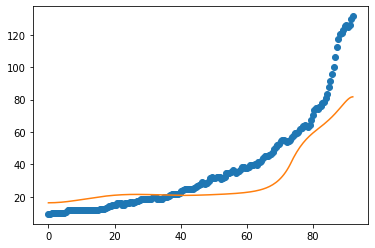

after perturb [-6.727535181455426, 111.41305805672619, 12571.340097863125, 0.32609858707534833, 19.634380948491543]
parameters [-6.727535181455426, 111.41305805672619, 12571.340097863125, 0.32609858707534833, 19.634380948491543]
after perturb [12.524992043693809, 3.2580055321959307, 19532.22452524257, 0.14873337766287748, 29.843410761130237]
parameters [12.524992043693809, 3.2580055321959307, 19532.22452524257, 0.14873337766287748, 29.843410761130237]
after perturb [8.489512080885358, 168.78442503060933, 30732.622431855656, 0.9410417104594805, 31.737860356992996]
parameters [8.489512080885358, 168.78442503060933, 30732.622431855656, 0.9410417104594805, 31.737860356992996]
after perturb [15.347281029344062, -20.199027707696416, 19322.754400707105, -0.4350199321580012, 10.601823816612225]
parameters [15.347281029344062, -20.199027707696416, 19322.754400707105, -0.4350199321580012, 10.601823816612225]
after perturb [5.948331128205528, 74.24415645403212, 19043.00943539175, 0.26444992928049

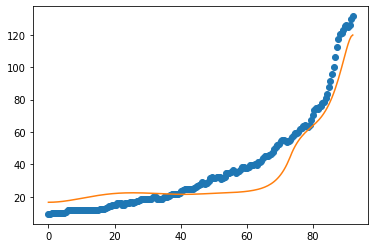

after perturb [8.290138233970403, 34.255129647181036, 30849.729552790886, 0.02021791637439127, 20.014716572003]
parameters [8.290138233970403, 34.255129647181036, 30849.729552790886, 0.02021791637439127, 20.014716572003]
after perturb [3.1275248701442524, 136.12144110588497, 23484.1089969574, 0.6307780024437446, 44.51694062157162]
parameters [3.1275248701442524, 136.12144110588497, 23484.1089969574, 0.6307780024437446, 44.51694062157162]
oxigeno [1.11784170e-09 1.12453358e-09 1.14469422e-09 1.17857999e-09
 1.22662266e-09 1.28943621e-09 1.36782644e-09 1.46280348e-09
 1.57559737e-09 1.70767684e-09 1.86077160e-09 2.03689830e-09
 2.23839075e-09 2.46793451e-09 2.72860678e-09 3.02392180e-09
 3.35788288e-09 3.73504158e-09 4.16056522e-09 4.64031384e-09
 5.18092766e-09 5.78992674e-09 6.47582418e-09 7.24825480e-09
 8.11812120e-09 9.09775932e-09 1.02011261e-08 1.14440119e-08
 1.28442804e-08 1.44221398e-08 1.62004486e-08 1.82050604e-08
 2.04652118e-08 2.30139581e-08 2.58886636e-08 2.91315499e-08
 

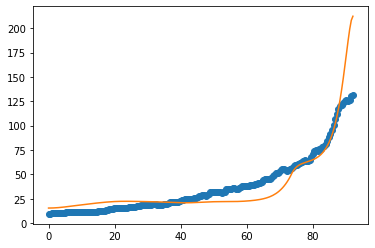

after perturb [10.7274786130934, 96.58743328181829, 18438.14707088081, 0.3181203889796968, 20.05389942599511]
parameters [10.7274786130934, 96.58743328181829, 18438.14707088081, 0.3181203889796968, 20.05389942599511]
after perturb [2.1464461331679114, 105.6135023945291, 23035.45312367187, 0.32516677037417036, 25.5820533016997]
parameters [2.1464461331679114, 105.6135023945291, 23035.45312367187, 0.32516677037417036, 25.5820533016997]
oxigeno [1.30414947e-07 1.30501031e-07 1.30761805e-07 1.31204831e-07
 1.31842699e-07 1.32693002e-07 1.33778331e-07 1.35126278e-07
 1.36769464e-07 1.38745618e-07 1.41097703e-07 1.43874101e-07
 1.47128879e-07 1.50922127e-07 1.55320393e-07 1.60397209e-07
 1.66233729e-07 1.72919480e-07 1.80553239e-07 1.89244050e-07
 1.99112388e-07 2.10291481e-07 2.22928807e-07 2.37187772e-07
 2.53249579e-07 2.71315310e-07 2.91608223e-07 3.14376291e-07
 3.39895007e-07 3.68470476e-07 4.00442827e-07 4.36190002e-07
 4.76131940e-07 5.20735224e-07 5.70518219e-07 6.26056754e-07
 6.87

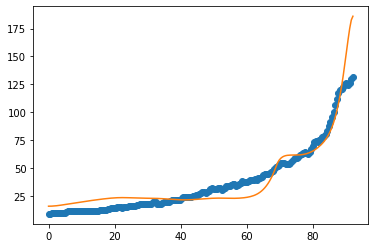

after perturb [6.9384984822562465, 96.50009056158143, 20156.66620449573, 0.35303759017769304, 15.782504738796066]
parameters [6.9384984822562465, 96.50009056158143, 20156.66620449573, 0.35303759017769304, 15.782504738796066]
oxigeno [2.53495060e-08 2.53700310e-08 2.54321212e-08 2.55373277e-08
 2.56882503e-08 2.58885617e-08 2.61430407e-08 2.64576163e-08
 2.68394244e-08 2.72968763e-08 2.78397433e-08 2.84792555e-08
 2.92282199e-08 3.01011583e-08 3.11144666e-08 3.22866003e-08
 3.36382874e-08 3.51927721e-08 3.69760937e-08 3.90174038e-08
 4.13493268e-08 4.40083685e-08 4.70353779e-08 5.04760683e-08
 5.43816053e-08 5.88092679e-08 6.38231917e-08 6.94952029e-08
 7.59057546e-08 8.31449743e-08 9.13138378e-08 1.00525481e-07
 1.10906667e-07 1.22599422e-07 1.35762868e-07 1.50575254e-07
 1.67236233e-07 1.85969393e-07 2.07025074e-07 2.30683503e-07
 2.57258288e-07 2.87100293e-07 3.20601955e-07 3.58202073e-07
 4.00391134e-07 4.47717229e-07 5.00792611e-07 5.60300988e-07
 6.27005607e-07 7.01758222e-07 7.85

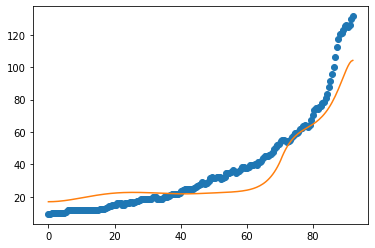

after perturb [10.923884628787935, 24.32323398045977, 13927.946051029343, 0.035560304118996786, 18.08593574106962]
parameters [10.923884628787935, 24.32323398045977, 13927.946051029343, 0.035560304118996786, 18.08593574106962]
after perturb [13.811693040734944, 67.97349390879326, 16445.849874060947, 0.008548385586278615, 1.7871213502417724]
parameters [13.811693040734944, 67.97349390879326, 16445.849874060947, 0.008548385586278615, 1.7871213502417724]
after perturb [11.704990045846813, 97.62934221152396, 21733.233039868974, 0.3829861461615494, 14.142353549271014]
parameters [11.704990045846813, 97.62934221152396, 21733.233039868974, 0.3829861461615494, 14.142353549271014]
after perturb [7.891826703712643, 90.66020109151123, 24278.940564168865, 0.25718193474287476, 12.837351958663508]
parameters [7.891826703712643, 90.66020109151123, 24278.940564168865, 0.25718193474287476, 12.837351958663508]
oxigeno [1.14886130e-06 1.14841312e-06 1.14707471e-06 1.14486447e-06
 1.14181304e-06 1.1379631

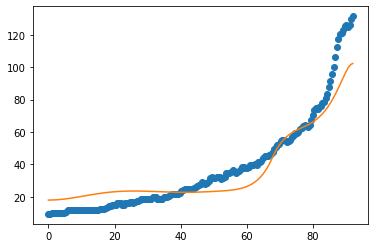

after perturb [-1.9255749042185029, 157.95761176565216, 17912.23226020027, 0.5759507576357357, 18.777254913020705]
parameters [-1.9255749042185029, 157.95761176565216, 17912.23226020027, 0.5759507576357357, 18.777254913020705]
after perturb [8.09972473061314, 9.604444522362485, 18791.109298893476, -0.18582837876445213, 7.378544367180417]
parameters [8.09972473061314, 9.604444522362485, 18791.109298893476, -0.18582837876445213, 7.378544367180417]
after perturb [12.409796536087425, -13.799537261262955, 22725.351132108564, -0.2247733730410883, 9.348969730114883]
parameters [12.409796536087425, -13.799537261262955, 22725.351132108564, -0.2247733730410883, 9.348969730114883]
after perturb [12.22793362773942, 2.4838476769271693, 15780.187716697914, -0.45236955047706523, 2.5463300668409516]
parameters [12.22793362773942, 2.4838476769271693, 15780.187716697914, -0.45236955047706523, 2.5463300668409516]
after perturb [8.379284561912662, 84.96083881934283, 23687.66233565974, 0.25676288159310845,

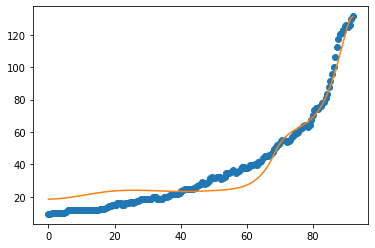

7
after perturb [4.658756724611682, 177.18872351058965, 21250.678486445882, 0.3318717495288209, 9.019551597274779]
parameters [4.658756724611682, 177.18872351058965, 21250.678486445882, 0.3318717495288209, 9.019551597274779]
after perturb [9.78972165210501, 25.009898525775593, 23326.172275661094, -0.008355974384841466, 13.607705807043642]
parameters [9.78972165210501, 25.009898525775593, 23326.172275661094, -0.008355974384841466, 13.607705807043642]
after perturb [1.763064877221574, 68.47094749112597, 26750.426519524248, 0.4503388895331705, 31.517385198356983]
parameters [1.763064877221574, 68.47094749112597, 26750.426519524248, 0.4503388895331705, 31.517385198356983]
oxigeno [8.64002268e-10 8.62839678e-10 8.59370552e-10 8.53650056e-10
 8.45767686e-10 8.35843863e-10 8.24025673e-10 8.10482128e-10
 7.95399346e-10 7.78975955e-10 7.61418986e-10 7.42940385e-10
 7.23754247e-10 7.04074793e-10 6.84115105e-10 6.64086643e-10
 6.44199526e-10 6.24663617e-10 6.05690383e-10 5.87495529e-10
 5.7030235

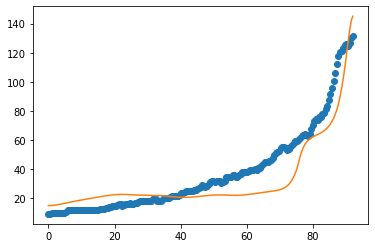

after perturb [13.85203238369213, 50.56707738899739, 23662.460186053922, 0.5860999260386377, 46.564306505909215]
parameters [13.85203238369213, 50.56707738899739, 23662.460186053922, 0.5860999260386377, 46.564306505909215]
after perturb [1.3024038192859733, 69.01502732771964, 24722.63748603678, 0.31260227550404895, 27.12810460838246]
parameters [1.3024038192859733, 69.01502732771964, 24722.63748603678, 0.31260227550404895, 27.12810460838246]
oxigeno [2.16490491e-07 2.16234334e-07 2.15469903e-07 2.14209053e-07
 2.12470724e-07 2.10279856e-07 2.07666101e-07 2.04662526e-07
 2.01304416e-07 1.97628286e-07 1.93671113e-07 1.89469751e-07
 1.85060481e-07 1.80478626e-07 1.75758201e-07 1.70931579e-07
 1.66029215e-07 1.61079466e-07 1.56108560e-07 1.51140738e-07
 1.46198569e-07 1.41303406e-07 1.36475902e-07 1.31736519e-07
 1.27105943e-07 1.22605377e-07 1.18256663e-07 1.14082287e-07
 1.10105307e-07 1.06349276e-07 1.02838240e-07 9.95968659e-08
 9.66507417e-08 9.40268392e-08 9.17541335e-08 8.98643320e-

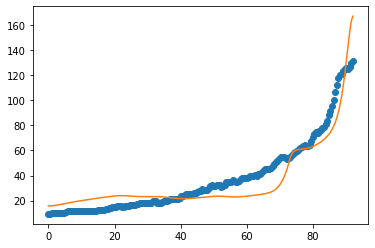

after perturb [8.41287031053697, 108.12419553346894, 17689.540644220746, 0.18045234258455956, 8.840525994777645]
parameters [8.41287031053697, 108.12419553346894, 17689.540644220746, 0.18045234258455956, 8.840525994777645]
after perturb [7.571690374701808, 92.94066193989059, 21866.184905211736, 0.2207769399852837, 6.672078298949394]
parameters [7.571690374701808, 92.94066193989059, 21866.184905211736, 0.2207769399852837, 6.672078298949394]
oxigeno [4.22847990e-06 4.22694208e-06 4.22234664e-06 4.21474760e-06
 4.20423472e-06 4.19093318e-06 4.17500312e-06 4.15663909e-06
 4.13606941e-06 4.11355556e-06 4.08939152e-06 4.06390322e-06
 4.03744801e-06 4.01041438e-06 3.98322173e-06 3.95632049e-06
 3.93019242e-06 3.90535133e-06 3.88234404e-06 3.86175185e-06
 3.84419240e-06 3.83032200e-06 3.82083854e-06 3.81648493e-06
 3.81805313e-06 3.82638882e-06 3.84239682e-06 3.86704720e-06
 3.90138213e-06 3.94652364e-06 4.00368227e-06 4.07416659e-06
 4.15939381e-06 4.26090148e-06 4.38036036e-06 4.51958846e-06

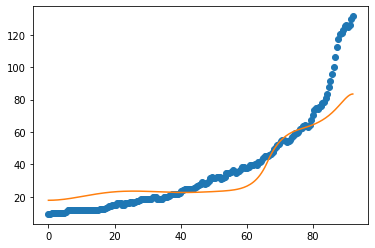

after perturb [5.454411252388356, 177.88473248997488, 23986.00601086951, 0.736929765133699, 32.04478113430008]
parameters [5.454411252388356, 177.88473248997488, 23986.00601086951, 0.736929765133699, 32.04478113430008]
after perturb [7.708231820576036, 101.48483070259158, 28752.688091855896, 0.6589723756716837, 41.76298685417764]
parameters [7.708231820576036, 101.48483070259158, 28752.688091855896, 0.6589723756716837, 41.76298685417764]
oxigeno [1.54061677e-11 1.55490682e-11 1.59804342e-11 1.67083144e-11
 1.77463065e-11 1.91138359e-11 2.08365542e-11 2.29468668e-11
 2.54845997e-11 2.84978207e-11 3.20438327e-11 3.61903602e-11
 4.10169545e-11 4.66166484e-11 5.30978956e-11 6.05868362e-11
 6.92299379e-11 7.91970688e-11 9.06850683e-11 1.03921892e-10
 1.19171419e-10 1.36739025e-10 1.56978041e-10 1.80297224e-10
 2.07169421e-10 2.38141577e-10 2.73846322e-10 3.15015368e-10
 3.62494993e-10 4.17263933e-10 4.80454050e-10 5.53374195e-10
 6.37537749e-10 7.34694406e-10 8.46866816e-10 9.76392836e-10
 

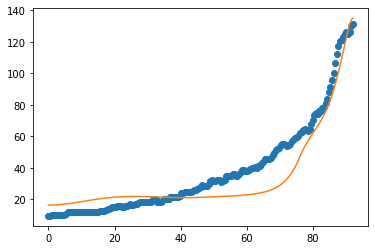

after perturb [5.267322731034722, 119.51831419695442, 22387.192382752823, 0.09098510042731689, 10.21902152266556]
parameters [5.267322731034722, 119.51831419695442, 22387.192382752823, 0.09098510042731689, 10.21902152266556]
oxigeno [3.23874142e-03 3.23821389e-03 3.23663796e-03 3.23403352e-03
 3.23043355e-03 3.22588381e-03 3.22044249e-03 3.21417976e-03
 3.20717718e-03 3.19952720e-03 3.19133244e-03 3.18270514e-03
 3.17376641e-03 3.16464570e-03 3.15548012e-03 3.14641389e-03
 3.13759786e-03 3.12918901e-03 3.12135011e-03 3.11424937e-03
 3.10806021e-03 3.10296111e-03 3.09913548e-03 3.09677168e-03
 3.09606299e-03 3.09720777e-03 3.10040957e-03 3.10587738e-03
 3.11382581e-03 3.12447547e-03 3.13805321e-03 3.15479256e-03
 3.17493408e-03 3.19872579e-03 3.22642366e-03 3.25829207e-03
 3.29460432e-03 3.33564321e-03 3.38170159e-03 3.43308299e-03
 3.49010228e-03 3.55308636e-03 3.62237489e-03 3.69832110e-03
 3.78129259e-03 3.87167226e-03 3.96985925e-03 4.07626993e-03
 4.19133899e-03 4.31552061e-03 4.44

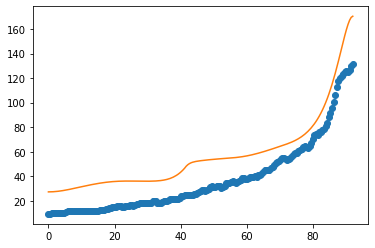

after perturb [6.431848588952317, 88.53142369847717, 28746.02642279178, 0.1488021143370495, 9.26106111270466]
parameters [6.431848588952317, 88.53142369847717, 28746.02642279178, 0.1488021143370495, 9.26106111270466]
oxigeno [1.33989756e-04 1.33934534e-04 1.33769240e-04 1.33494979e-04
 1.33113583e-04 1.32627591e-04 1.32040225e-04 1.31355364e-04
 1.30577504e-04 1.29711723e-04 1.28763640e-04 1.27739369e-04
 1.26645477e-04 1.25488939e-04 1.24277097e-04 1.23017616e-04
 1.21718449e-04 1.20387798e-04 1.19034093e-04 1.17665954e-04
 1.16292180e-04 1.14921731e-04 1.13563716e-04 1.12227391e-04
 1.10922158e-04 1.09657576e-04 1.08443370e-04 1.07289450e-04
 1.06205937e-04 1.05203191e-04 1.04291844e-04 1.03482845e-04
 1.02787504e-04 1.02217543e-04 1.01785156e-04 1.01503073e-04
 1.01384627e-04 1.01443834e-04 1.01695474e-04 1.02155181e-04
 1.02839539e-04 1.03766186e-04 1.04953929e-04 1.06422858e-04
 1.08194478e-04 1.10291846e-04 1.12739713e-04 1.15564687e-04
 1.18795392e-04 1.22462653e-04 1.26599675e-

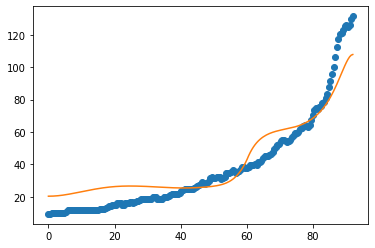

after perturb [10.276131299641488, 72.6305005332083, 25573.444695281738, 0.21301162475543964, 13.629940504419936]
parameters [10.276131299641488, 72.6305005332083, 25573.444695281738, 0.21301162475543964, 13.629940504419936]
after perturb [9.696349964193043, 145.12219753142736, 24997.995288673417, 0.45185324169320007, 17.613858946556423]
parameters [9.696349964193043, 145.12219753142736, 24997.995288673417, 0.45185324169320007, 17.613858946556423]
oxigeno [5.28815648e-08 5.31191486e-08 5.38340598e-08 5.50328016e-08
 5.67262889e-08 5.89299644e-08 6.16639618e-08 6.49533191e-08
 6.88282434e-08 7.33244300e-08 7.84834392e-08 8.43531341e-08
 9.09881844e-08 9.84506412e-08 1.06810588e-07 1.16146874e-07
 1.26547940e-07 1.38112739e-07 1.50951768e-07 1.65188218e-07
 1.80959244e-07 1.98417392e-07 2.17732163e-07 2.39091762e-07
 2.62705025e-07 2.88803550e-07 3.17644059e-07 3.49510998e-07
 3.84719416e-07 4.23618128e-07 4.66593218e-07 5.14071884e-07
 5.66526682e-07 6.24480191e-07 6.88510151e-07 7.5925

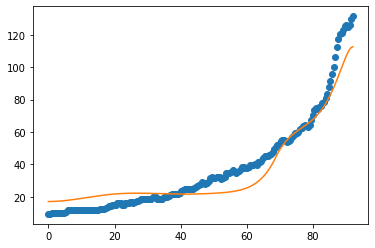

8
after perturb [5.399048808249052, 43.79815420532028, 26627.1900191117, -0.09213455349091337, 17.518997426504853]
parameters [5.399048808249052, 43.79815420532028, 26627.1900191117, -0.09213455349091337, 17.518997426504853]
after perturb [5.851398457344146, 169.18243190271127, 22797.32009565938, 0.576816713421353, 21.366502468599947]
parameters [5.851398457344146, 169.18243190271127, 22797.32009565938, 0.576816713421353, 21.366502468599947]
after perturb [9.70775944494447, 53.7344688640573, 24043.09960506865, -0.12541695716994977, 21.437258770221476]
parameters [9.70775944494447, 53.7344688640573, 24043.09960506865, -0.12541695716994977, 21.437258770221476]
after perturb [5.401714188263915, 104.00123357067028, 23245.06715546014, -0.05458292832117517, 10.208116263220703]
parameters [5.401714188263915, 104.00123357067028, 23245.06715546014, -0.05458292832117517, 10.208116263220703]
after perturb [7.530090161168685, 16.4621672334178, 21414.1960334352, -0.09715013334161536, 5.881714878377

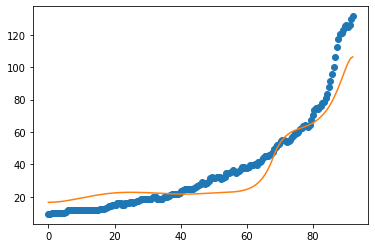

after perturb [9.360146374000628, 131.53868451875434, 27599.915457678224, 0.8568468235540473, 42.29798928615456]
parameters [9.360146374000628, 131.53868451875434, 27599.915457678224, 0.8568468235540473, 42.29798928615456]
oxigeno [2.48169201e-11 2.50299671e-11 2.56727785e-11 2.67564358e-11
 2.82996426e-11 3.03290824e-11 3.28799284e-11 3.59965175e-11
 3.97332005e-11 4.41553869e-11 4.93408053e-11 5.53810046e-11
 6.23831258e-11 7.04719823e-11 7.97924879e-11 9.05124845e-11
 1.02826024e-10 1.16957171e-10 1.33164408e-10 1.51745719e-10
 1.73044468e-10 1.97456182e-10 2.25436372e-10 2.57509556e-10
 2.94279649e-10 3.36441944e-10 3.84796898e-10 4.40266017e-10
 5.03910121e-10 5.76950378e-10 6.60792476e-10 7.57054437e-10
 8.67598568e-10 9.94568185e-10 1.14042979e-09 1.30802151e-09
 1.50060866e-09 1.72194758e-09 1.97635875e-09 2.26881068e-09
 2.60501610e-09 2.99154207e-09 3.43593621e-09 3.94687112e-09
 4.53430977e-09 5.20969463e-09 5.98616409e-09 6.87879984e-09
 7.90490966e-09 9.08435046e-09 1.0439

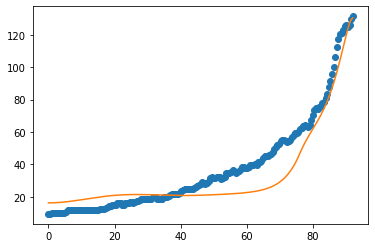

after perturb [12.28452970819277, -41.66395884795858, 16560.95677592257, -0.3998842171393288, 8.348013076730435]
parameters [12.28452970819277, -41.66395884795858, 16560.95677592257, -0.3998842171393288, 8.348013076730435]
after perturb [3.1533377727969416, 84.6556140805629, 28415.5127883631, -0.10227129684463232, 2.1447997881238727]
parameters [3.1533377727969416, 84.6556140805629, 28415.5127883631, -0.10227129684463232, 2.1447997881238727]
after perturb [11.694197323639909, 20.85755329294871, 17832.31466808235, -0.045375258792702086, 14.645556431993827]
parameters [11.694197323639909, 20.85755329294871, 17832.31466808235, -0.045375258792702086, 14.645556431993827]
after perturb [10.74315403844594, 63.87163464652487, 21925.802730726187, 0.30372678083104854, 21.022079791990336]
parameters [10.74315403844594, 63.87163464652487, 21925.802730726187, 0.30372678083104854, 21.022079791990336]
after perturb [8.159272242863079, 69.91667524890924, 15906.437250970619, 0.16142436228352852, 21.169

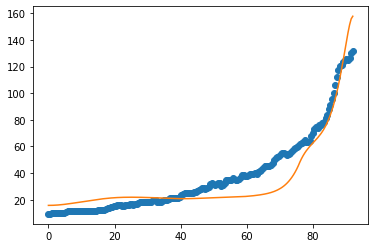

after perturb [7.030860239974857, 65.62155105312625, 29589.083694585475, 0.45826332590698354, 39.912316165607464]
parameters [7.030860239974857, 65.62155105312625, 29589.083694585475, 0.45826332590698354, 39.912316165607464]
after perturb [7.996777043702569, 83.66103104974633, 29180.7936974201, 0.4196933151857974, 35.66887215208649]
parameters [7.996777043702569, 83.66103104974633, 29180.7936974201, 0.4196933151857974, 35.66887215208649]
after perturb [7.229990899747633, 100.07745056944628, 28042.966570857516, 0.3539258677731214, 28.98487920785288]
parameters [7.229990899747633, 100.07745056944628, 28042.966570857516, 0.3539258677731214, 28.98487920785288]
oxigeno [3.32117096e-08 3.32464307e-08 3.33512948e-08 3.35284103e-08
 3.37813123e-08 3.41149950e-08 3.45359577e-08 3.50522651e-08
 3.56736247e-08 3.64114800e-08 3.72791240e-08 3.82918334e-08
 3.94670254e-08 4.08244414e-08 4.23863590e-08 4.41778355e-08
 4.62269875e-08 4.85653100e-08 5.12280383e-08 5.42545598e-08
 5.76888789e-08 6.1580

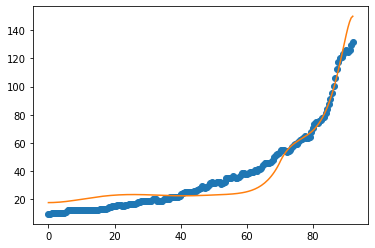

9
after perturb [5.228221063853592, 59.5826119395104, 26063.566282120642, 0.2489844366455289, 36.84992454878753]
parameters [5.228221063853592, 59.5826119395104, 26063.566282120642, 0.2489844366455289, 36.84992454878753]
oxigeno [3.13072686e-06 3.12792901e-06 3.11955724e-06 3.10567639e-06
 3.08639331e-06 3.06185493e-06 3.03224574e-06 2.99778473e-06
 2.95872176e-06 2.91533365e-06 2.86791999e-06 2.81679883e-06
 2.76230234e-06 2.70477253e-06 2.64455724e-06 2.58200622e-06
 2.51746769e-06 2.45128512e-06 2.38379445e-06 2.31532172e-06
 2.24618100e-06 2.17667283e-06 2.10708292e-06 2.03768122e-06
 1.96872135e-06 1.90044024e-06 1.83305807e-06 1.76677847e-06
 1.70178885e-06 1.63826099e-06 1.57635179e-06 1.51620411e-06
 1.45794787e-06 1.40170119e-06 1.34757171e-06 1.29565805e-06
 1.24605137e-06 1.19883710e-06 1.15409678e-06 1.11191003e-06
 1.07235676e-06 1.03551940e-06 1.00148540e-06 9.70349901e-07
 9.42218564e-07 9.17210650e-07 8.95462340e-07 8.77130316e-07
 8.62395656e-07 8.51468068e-07 8.445905

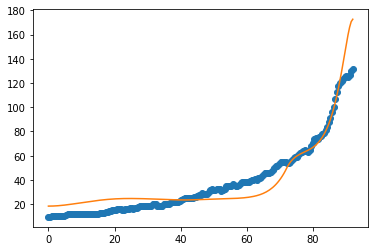

after perturb [14.265925464753174, 57.00487115040086, 23404.287544902945, 0.21794854915148054, 32.61174102660339]
parameters [14.265925464753174, 57.00487115040086, 23404.287544902945, 0.21794854915148054, 32.61174102660339]
after perturb [10.595946482022535, 4.427672043730361, 27701.873978221352, 0.5618019422031137, 58.42535122201166]
parameters [10.595946482022535, 4.427672043730361, 27701.873978221352, 0.5618019422031137, 58.42535122201166]
after perturb [0.3675239899661449, 44.93200779561443, 26051.221322013385, 0.10328032296895368, 15.810413250373156]
parameters [0.3675239899661449, 44.93200779561443, 26051.221322013385, 0.10328032296895368, 15.810413250373156]
oxigeno [1.65728656e-03 1.65548819e-03 1.65018244e-03 1.64161627e-03
 1.63013863e-03 1.61612972e-03 1.59993693e-03 1.58183313e-03
 1.56200329e-03 1.54055797e-03 1.51756645e-03 1.49309954e-03
 1.46726899e-03 1.44025085e-03 1.41228429e-03 1.38364615e-03
 1.35461064e-03 1.32540895e-03 1.29620191e-03 1.26707217e-03
 1.23803409e

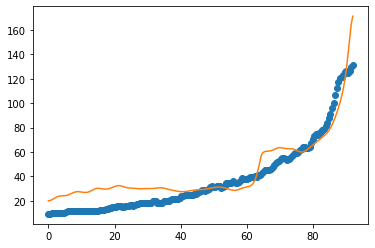

after perturb [12.298927956650344, 47.68302008769348, 22594.243887214332, 0.047500605181860944, 12.833872542909376]
parameters [12.298927956650344, 47.68302008769348, 22594.243887214332, 0.047500605181860944, 12.833872542909376]
after perturb [4.078250440070922, 96.00400261506667, 23702.268576904018, 0.380256474527347, 23.71512300902011]
parameters [4.078250440070922, 96.00400261506667, 23702.268576904018, 0.380256474527347, 23.71512300902011]
oxigeno [1.15257418e-08 1.15363280e-08 1.15683786e-08 1.16227728e-08
 1.17009835e-08 1.18050890e-08 1.19377904e-08 1.21024347e-08
 1.23030448e-08 1.25443566e-08 1.28318662e-08 1.31718849e-08
 1.35716077e-08 1.40391925e-08 1.45838547e-08 1.52159771e-08
 1.59472379e-08 1.67907585e-08 1.77612735e-08 1.88753258e-08
 2.01514884e-08 2.16106191e-08 2.32761474e-08 2.51744022e-08
 2.73349817e-08 2.97911716e-08 3.25804178e-08 3.57448596e-08
 3.93319298e-08 4.33950302e-08 4.79942913e-08 5.31974246e-08
 5.90806790e-08 6.57299123e-08 7.32417900e-08 8.17251262

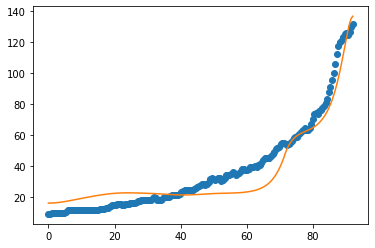

after perturb [13.414136864347801, 88.16731122233514, 26006.892511070822, 0.19592872575101578, 6.054197361441805]
parameters [13.414136864347801, 88.16731122233514, 26006.892511070822, 0.19592872575101578, 6.054197361441805]
after perturb [7.509965215792084, 63.643876063203464, 20509.518148922285, 0.10958781845316619, 15.745958136735071]
parameters [7.509965215792084, 63.643876063203464, 20509.518148922285, 0.10958781845316619, 15.745958136735071]
oxigeno [1.14864259e-03 1.14809254e-03 1.14644547e-03 1.14371050e-03
 1.13990274e-03 1.13504307e-03 1.12915794e-03 1.12227904e-03
 1.11444297e-03 1.10569079e-03 1.09606765e-03 1.08562228e-03
 1.07440652e-03 1.06247483e-03 1.04988378e-03 1.03669156e-03
 1.02295752e-03 1.00874168e-03 9.94104334e-04 9.79105591e-04
 9.63805053e-04 9.48261445e-04 9.32532324e-04 9.16673811e-04
 9.00740366e-04 8.84784593e-04 8.68857091e-04 8.53006332e-04
 8.37278579e-04 8.21717829e-04 8.06365793e-04 7.91261897e-04
 7.76443319e-04 7.61945042e-04 7.47799935e-04 7.3403

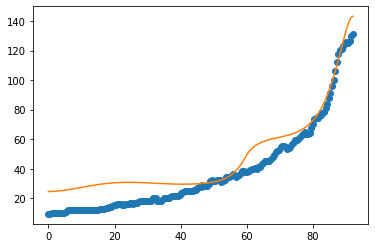

after perturb [10.98614170698767, 56.90028017851118, 25780.092347090438, 0.5414387688224569, 41.874674668499594]
parameters [10.98614170698767, 56.90028017851118, 25780.092347090438, 0.5414387688224569, 41.874674668499594]
after perturb [5.3583303487141976, 58.51161093960046, 23320.4495639829, 0.19546518718284928, 16.765102306132654]
parameters [5.3583303487141976, 58.51161093960046, 23320.4495639829, 0.19546518718284928, 16.765102306132654]
oxigeno [2.16976116e-05 2.16809523e-05 2.16310929e-05 2.15483872e-05
 2.14334183e-05 2.12869893e-05 2.11101103e-05 2.09039827e-05
 2.06699809e-05 2.04096322e-05 2.01245952e-05 1.98166374e-05
 1.94876125e-05 1.91394384e-05 1.87740751e-05 1.83935046e-05
 1.79997119e-05 1.75946672e-05 1.71803105e-05 1.67585379e-05
 1.63311901e-05 1.59000422e-05 1.54667957e-05 1.50330724e-05
 1.46004095e-05 1.41702566e-05 1.37439734e-05 1.33228293e-05
 1.29080037e-05 1.25005873e-05 1.21015844e-05 1.17119159e-05
 1.13324230e-05 1.09638720e-05 1.06069591e-05 1.02623164e-

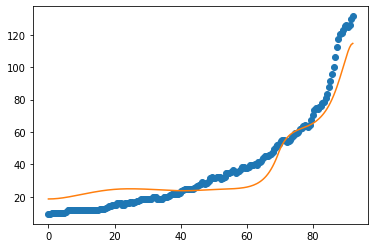

after perturb [5.513054596031931, 53.45342980441049, 26497.932409008277, 0.2505038422744327, 38.370691101663716]
parameters [5.513054596031931, 53.45342980441049, 26497.932409008277, 0.2505038422744327, 38.370691101663716]
oxigeno [3.02156927e-06 3.01869437e-06 3.01009259e-06 2.99583228e-06
 2.97602601e-06 2.95082859e-06 2.92043440e-06 2.88507408e-06
 2.84501075e-06 2.80053585e-06 2.75196460e-06 2.69963144e-06
 2.64388540e-06 2.58508547e-06 2.52359621e-06 2.45978365e-06
 2.39401136e-06 2.32663709e-06 2.25800959e-06 2.18846602e-06
 2.11832966e-06 2.04790808e-06 1.97749170e-06 1.90735268e-06
 1.83774419e-06 1.76889994e-06 1.70103405e-06 1.63434107e-06
 1.56899632e-06 1.50515636e-06 1.44295961e-06 1.38252719e-06
 1.32396380e-06 1.26735875e-06 1.21278713e-06 1.16031101e-06
 1.10998074e-06 1.06183633e-06 1.01590892e-06 9.72222239e-07
 9.30794253e-07 8.91638747e-07 8.54767052e-07 8.20189807e-07
 7.87918799e-07 7.57968879e-07 7.30359968e-07 7.05119165e-07
 6.82282976e-07 6.61899678e-07 6.4403

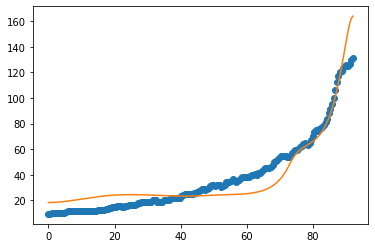

after perturb [4.707311424500478, 72.86067159823902, 28927.833267903694, 0.3572665501388107, 36.17922482730715]
parameters [4.707311424500478, 72.86067159823902, 28927.833267903694, 0.3572665501388107, 36.17922482730715]
oxigeno [3.11451186e-08 3.11160081e-08 3.10289546e-08 3.08847871e-08
 3.06848725e-08 3.04310935e-08 3.01258201e-08 2.97718737e-08
 2.93724877e-08 2.89312643e-08 2.84521302e-08 2.79392927e-08
 2.73971976e-08 2.68304909e-08 2.62439848e-08 2.56426303e-08
 2.50314964e-08 2.44157571e-08 2.38006871e-08 2.31916659e-08
 2.25941919e-08 2.20139054e-08 2.14566230e-08 2.09283810e-08
 2.04354915e-08 1.99846092e-08 1.95828118e-08 1.92376937e-08
 1.89574750e-08 1.87511272e-08 1.86285176e-08 1.86005743e-08
 1.86794747e-08 1.88788596e-08 1.92140779e-08 1.97024629e-08
 2.03636477e-08 2.12199211e-08 2.22966330e-08 2.36226516e-08
 2.52308823e-08 2.71588555e-08 2.94493901e-08 3.21513461e-08
 3.53204750e-08 3.90203822e-08 4.33236160e-08 4.83128998e-08
 5.40825262e-08 6.07399351e-08 6.840749

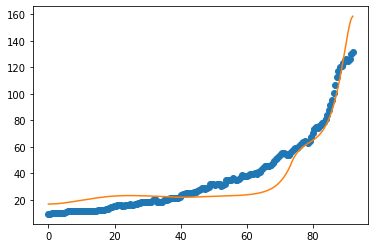

after perturb [4.912066460689248, 133.86159843846679, 17682.942257979226, 0.07790831104074848, 7.656466826878583]
parameters [4.912066460689248, 133.86159843846679, 17682.942257979226, 0.07790831104074848, 7.656466826878583]
after perturb [1.4684081509250362, 142.5106283158144, 21609.203219056868, 0.10853269201570294, 5.036947529226278]
parameters [1.4684081509250362, 142.5106283158144, 21609.203219056868, 0.10853269201570294, 5.036947529226278]
oxigeno [1.03420555e-03 1.03431285e-03 1.03463913e-03 1.03519737e-03
 1.03600872e-03 1.03710192e-03 1.03851246e-03 1.04028182e-03
 1.04245671e-03 1.04508839e-03 1.04823210e-03 1.05194670e-03
 1.05629424e-03 1.06133976e-03 1.06715101e-03 1.07379827e-03
 1.08135420e-03 1.08989378e-03 1.09949438e-03 1.11023598e-03
 1.12220159e-03 1.13547777e-03 1.15015534e-03 1.16633008e-03
 1.18410343e-03 1.20358305e-03 1.22488328e-03 1.24812530e-03
 1.27343725e-03 1.30095411e-03 1.33081768e-03 1.36317652e-03
 1.39818606e-03 1.43600899e-03 1.47681573e-03 1.520785

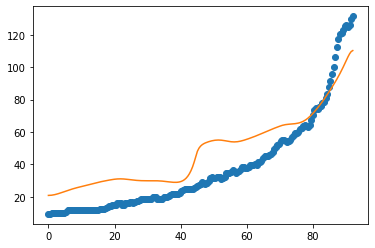

after perturb [8.78211997031271, 160.78938168407115, 23096.248361374768, 0.6855647135705698, 23.590321638675356]
parameters [8.78211997031271, 160.78938168407115, 23096.248361374768, 0.6855647135705698, 23.590321638675356]
after perturb [8.75316271958676, 125.9475093559422, 23341.563065439816, 0.6407375398650871, 32.331922081548754]
parameters [8.75316271958676, 125.9475093559422, 23341.563065439816, 0.6407375398650871, 32.331922081548754]
oxigeno [3.89789571e-10 3.92546664e-10 4.00857080e-10 4.14838861e-10
 4.34690834e-10 4.60695795e-10 4.93225026e-10 5.32744244e-10
 5.79821057e-10 6.35134069e-10 6.99483767e-10 7.73805393e-10
 8.59183986e-10 9.56871864e-10 1.06830882e-09 1.19514538e-09
 1.33926946e-09 1.50283695e-09 1.68830659e-09 1.89847985e-09
 2.13654634e-09 2.40613556e-09 2.71137577e-09 3.05696099e-09
 3.44822709e-09 3.89123827e-09 4.39288530e-09 4.96099696e-09
 5.60446645e-09 6.33339486e-09 7.15925366e-09 8.09506895e-09
 9.15562999e-09 1.03577254e-08 1.17204106e-08 1.32653099e-08

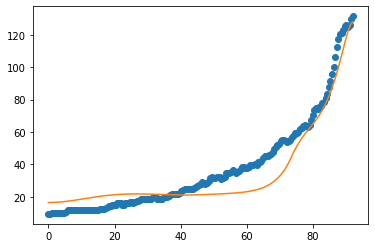

after perturb [3.980778122067318, -43.05979402625337, 26605.59842236574, -0.1459731719517327, 32.772702847184306]
parameters [3.980778122067318, -43.05979402625337, 26605.59842236574, -0.1459731719517327, 32.772702847184306]
after perturb [13.019680880726387, 6.231010798192962, 25291.497475768065, 0.04938692176723533, 22.857616003996895]
parameters [13.019680880726387, 6.231010798192962, 25291.497475768065, 0.04938692176723533, 22.857616003996895]
after perturb [10.77973031406949, 44.68792254437338, 31639.558424084087, -0.07631882326856199, 17.8669010850508]
parameters [10.77973031406949, 44.68792254437338, 31639.558424084087, -0.07631882326856199, 17.8669010850508]
after perturb [0.10803702968157403, 113.54282032530116, 22798.748091541293, 0.3939538701199351, 23.864028465702358]
parameters [0.10803702968157403, 113.54282032530116, 22798.748091541293, 0.3939538701199351, 23.864028465702358]
oxigeno [1.99441315e-08 1.99983531e-08 2.01645780e-08 2.04520906e-08
 2.08732670e-08 2.14414096e

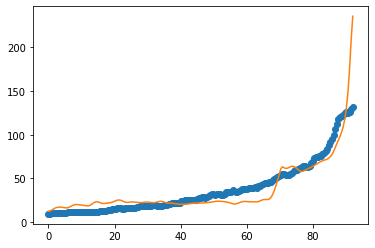

after perturb [8.66413019618625, 58.51269178465364, 22995.082299645775, 0.09745064346015458, 11.733928725934181]
parameters [8.66413019618625, 58.51269178465364, 22995.082299645775, 0.09745064346015458, 11.733928725934181]
oxigeno [1.73199401e-03 1.73121800e-03 1.72889407e-03 1.72503447e-03
 1.71965949e-03 1.71279720e-03 1.70448320e-03 1.69476019e-03
 1.68367758e-03 1.67129091e-03 1.65766140e-03 1.64285527e-03
 1.62694312e-03 1.60999936e-03 1.59210145e-03 1.57332935e-03
 1.55376478e-03 1.53349069e-03 1.51259056e-03 1.49114790e-03
 1.46924571e-03 1.44696594e-03 1.42438911e-03 1.40159383e-03
 1.37865652e-03 1.35565106e-03 1.33264853e-03 1.30971702e-03
 1.28692146e-03 1.26432347e-03 1.24198131e-03 1.21994984e-03
 1.19828049e-03 1.17702132e-03 1.15621705e-03 1.13590920e-03
 1.11613619e-03 1.09693348e-03 1.07833376e-03 1.06036713e-03
 1.04306134e-03 1.02644200e-03 1.01053284e-03 9.95355996e-04
 9.80932276e-04 9.67281467e-04 9.54422649e-04 9.42374521e-04
 9.31155745e-04 9.20785298e-04 9.1128

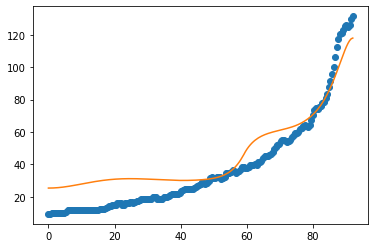

after perturb [1.950580800887669, 168.98534324344388, 25508.628696002917, 0.6016885744741194, 28.128747954877515]
parameters [1.950580800887669, 168.98534324344388, 25508.628696002917, 0.6016885744741194, 28.128747954877515]
after perturb [3.428779241055829, 9.08606428100535, 18377.57316372963, -0.09705306363532767, 19.899646503451002]
parameters [3.428779241055829, 9.08606428100535, 18377.57316372963, -0.09705306363532767, 19.899646503451002]
after perturb [4.029687779497288, 56.08580296124914, 23503.59511218314, -0.11711112845934973, 17.62877753446885]
parameters [4.029687779497288, 56.08580296124914, 23503.59511218314, -0.11711112845934973, 17.62877753446885]
after perturb [5.17946634563923, 54.914777084549314, 19676.749000136173, 0.033413041626970674, 14.310634859530055]
parameters [5.17946634563923, 54.914777084549314, 19676.749000136173, 0.033413041626970674, 14.310634859530055]
after perturb [8.850647210867072, 105.54295976352286, 30437.41331291246, 0.40138541512050874, 38.70712

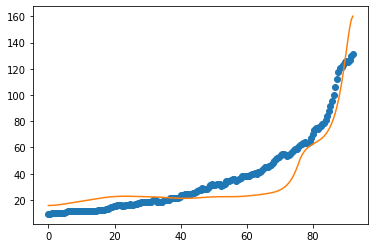

after perturb [7.944456161977586, 51.02333083499572, 15610.977065078667, -0.023124260489811296, 16.555732806087534]
parameters [7.944456161977586, 51.02333083499572, 15610.977065078667, -0.023124260489811296, 16.555732806087534]
after perturb [3.987860030050079, 135.93633614807518, 25301.100277354926, 0.8148215841520717, 36.51032657914855]
parameters [3.987860030050079, 135.93633614807518, 25301.100277354926, 0.8148215841520717, 36.51032657914855]
oxigeno [7.32110817e-11 7.37661432e-11 7.54400373e-11 7.82590583e-11
 8.22675816e-11 8.75289028e-11 9.41264294e-11 1.02165249e-10
 1.11774098e-10 1.23107769e-10 1.36349991e-10 1.51716849e-10
 1.69460790e-10 1.89875299e-10 2.13300335e-10 2.40128620e-10
 2.70812917e-10 3.05874432e-10 3.45912494e-10 3.91615723e-10
 4.43774893e-10 5.03297737e-10 5.71225995e-10 6.48755027e-10
 7.37256372e-10 8.38303676e-10 9.53702493e-10 1.08552450e-09
 1.23614676e-09 1.40829676e-09 1.60510402e-09 1.83015918e-09
 2.08758161e-09 2.38209671e-09 2.71912417e-09 3.1048

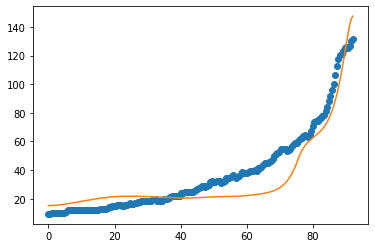

after perturb [7.826978591412749, 122.59065400535104, 25321.637810040967, 0.6099102514778895, 40.178149676809184]
parameters [7.826978591412749, 122.59065400535104, 25321.637810040967, 0.6099102514778895, 40.178149676809184]
oxigeno [4.53543094e-10 4.56684374e-10 4.66152034e-10 4.82078236e-10
 5.04685580e-10 5.34290636e-10 5.71308976e-10 6.16261777e-10
 6.69784108e-10 7.32635028e-10 8.05709678e-10 8.90053534e-10
 9.86879078e-10 1.09758514e-09 1.22377925e-09 1.36730330e-09
 1.53026303e-09 1.71506169e-09 1.92443859e-09 2.16151289e-09
 2.42983368e-09 2.73343678e-09 3.07690950e-09 3.46546408e-09
 3.90502119e-09 4.40230467e-09 4.96494899e-09 5.60162117e-09
 6.32215883e-09 7.13772675e-09 8.06099396e-09 9.10633434e-09
 1.02900534e-08 1.16306449e-08 1.31490807e-08 1.48691382e-08
 1.68177703e-08 1.90255232e-08 2.15270068e-08 2.43614267e-08
 2.75731822e-08 3.12125424e-08 3.53364056e-08 4.00091559e-08
 4.53036271e-08 5.13021873e-08 5.80979594e-08 6.57961933e-08
 7.45158089e-08 8.43911306e-08 9.55

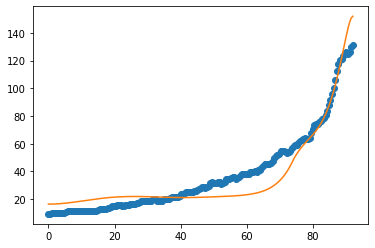

after perturb [-0.8264931570392107, 164.48530495106996, 21169.390454445656, 0.8689614347914548, 32.53035969681297]
parameters [-0.8264931570392107, 164.48530495106996, 21169.390454445656, 0.8689614347914548, 32.53035969681297]
after perturb [7.605880101712096, -1.3730495954651118, 23418.85608575965, -0.1680692324938321, 26.723611587033403]
parameters [7.605880101712096, -1.3730495954651118, 23418.85608575965, -0.1680692324938321, 26.723611587033403]
after perturb [5.828521021655542, 41.82679217904972, 27215.364414535514, 0.3228572056883787, 43.320827372780705]
parameters [5.828521021655542, 41.82679217904972, 27215.364414535514, 0.3228572056883787, 43.320827372780705]
oxigeno [1.63578229e-07 1.63371327e-07 1.62752602e-07 1.61727954e-07
 1.60307088e-07 1.58503321e-07 1.56333322e-07 1.53816798e-07
 1.50976129e-07 1.47835964e-07 1.44422799e-07 1.40764538e-07
 1.36890055e-07 1.32828769e-07 1.28610233e-07 1.24263759e-07
 1.19818067e-07 1.15300985e-07 1.10739179e-07 1.06157929e-07
 1.0158095

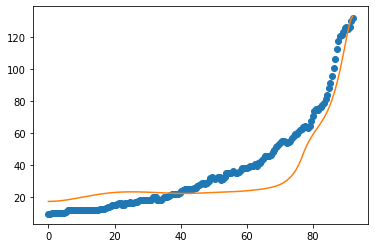

after perturb [10.951625836809376, 47.759590811002546, 23388.055650468024, -0.19131625727252105, 1.7349740807406455]
parameters [10.951625836809376, 47.759590811002546, 23388.055650468024, -0.19131625727252105, 1.7349740807406455]
after perturb [9.620609693659247, 7.529319726006953, 20916.143973365968, -0.0088960361076839, 25.411064909767976]
parameters [9.620609693659247, 7.529319726006953, 20916.143973365968, -0.0088960361076839, 25.411064909767976]
after perturb [-1.0150516743667142, 141.47356365873262, 30433.647931311083, 0.4180995769529939, 20.17454232743801]
parameters [-1.0150516743667142, 141.47356365873262, 30433.647931311083, 0.4180995769529939, 20.17454232743801]
after perturb [4.462765344911604, 67.1448882910108, 19108.737911655684, 0.08293766946105174, 14.403944334509438]
parameters [4.462765344911604, 67.1448882910108, 19108.737911655684, 0.08293766946105174, 14.403944334509438]
after perturb [6.669503174086119, 105.6109031163922, 23243.226116387807, 0.24128986156929924, 

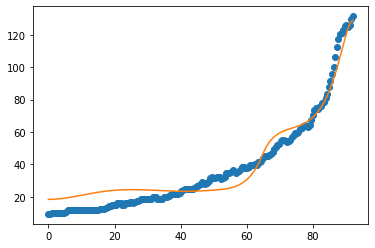

10
after perturb [6.16025144046792, 25.249874398044888, 23263.26107066923, -0.2046414321020134, -2.215324240659882]
parameters [6.16025144046792, 25.249874398044888, 23263.26107066923, -0.2046414321020134, -2.215324240659882]
after perturb [10.805876044020522, 56.72360669997813, 26507.090050585302, -0.10766372386572048, 8.233932821303753]
parameters [10.805876044020522, 56.72360669997813, 26507.090050585302, -0.10766372386572048, 8.233932821303753]
after perturb [8.730876926876817, 81.1680851980719, 27310.401759199627, 0.635850328539899, 49.81326290952952]
parameters [8.730876926876817, 81.1680851980719, 27310.401759199627, 0.635850328539899, 49.81326290952952]
oxigeno [1.04672141e-12 1.05580675e-12 1.08328763e-12 1.12984423e-12
 1.19662889e-12 1.28529478e-12 1.39803698e-12 1.53764731e-12
 1.70758417e-12 1.91205943e-12 2.15614460e-12 2.44589918e-12
 2.78852463e-12 3.19254805e-12 3.66804054e-12 4.22687606e-12
 4.88303765e-12 5.65297926e-12 6.55605275e-12 7.61501157e-12
 8.85660421e-12 1

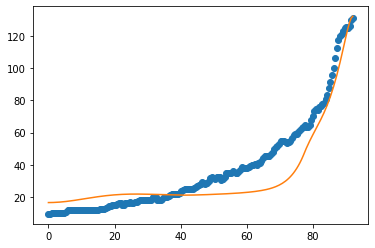

after perturb [8.037473577414616, 103.44635467072631, 19950.13232954912, 0.520362268624689, 27.809117804424275]
parameters [8.037473577414616, 103.44635467072631, 19950.13232954912, 0.520362268624689, 27.809117804424275]
after perturb [-1.788618039865458, 42.78878684102752, 23963.947308113384, 0.2449490497196682, 33.23048333535094]
parameters [-1.788618039865458, 42.78878684102752, 23963.947308113384, 0.2449490497196682, 33.23048333535094]
after perturb [12.54643855564167, -26.213675951782676, 26875.92909876444, 0.21426736849898864, 45.429104905919985]
parameters [12.54643855564167, -26.213675951782676, 26875.92909876444, 0.21426736849898864, 45.429104905919985]
after perturb [10.359955471046561, 33.44995576506717, 23503.914406070875, 0.2916698675748714, 38.723816337162084]
parameters [10.359955471046561, 33.44995576506717, 23503.914406070875, 0.2916698675748714, 38.723816337162084]
after perturb [2.256888923754895, 77.80895230041043, 22246.69290831879, 0.18745088127847268, 25.00409195

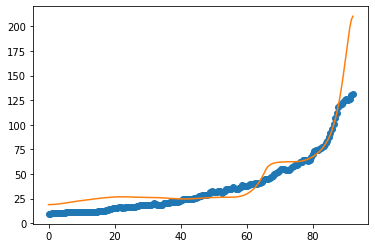

after perturb [4.572978829163267, 62.7326622498856, 24761.422745739066, 0.11792332587616222, 21.737275460868318]
parameters [4.572978829163267, 62.7326622498856, 24761.422745739066, 0.11792332587616222, 21.737275460868318]
oxigeno [9.52793976e-04 9.52239917e-04 9.50581570e-04 9.47830357e-04
 9.44005093e-04 9.39131667e-04 9.33242599e-04 9.26376514e-04
 9.18577527e-04 9.09894566e-04 9.00380669e-04 8.90092247e-04
 8.79088360e-04 8.67430007e-04 8.55179450e-04 8.42399587e-04
 8.29153380e-04 8.15503341e-04 8.01511092e-04 7.87236974e-04
 7.72739738e-04 7.58076282e-04 7.43301445e-04 7.28467853e-04
 7.13625806e-04 6.98823198e-04 6.84105469e-04 6.69515590e-04
 6.55094054e-04 6.40878899e-04 6.26905737e-04 6.13207797e-04
 5.99815986e-04 5.86758953e-04 5.74063168e-04 5.61753012e-04
 5.49850881e-04 5.38377300e-04 5.27351052e-04 5.16789326e-04
 5.06707875e-04 4.97121189e-04 4.88042697e-04 4.79484966e-04
 4.71459936e-04 4.63979155e-04 4.57054041e-04 4.50696146e-04
 4.44917444e-04 4.39730621e-04 4.3514

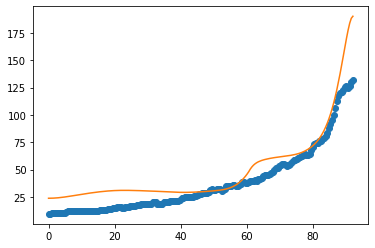

after perturb [8.264374635751164, 158.91830594338913, 22143.402852915453, 0.6699333286464713, 21.991618712470064]
parameters [8.264374635751164, 158.91830594338913, 22143.402852915453, 0.6699333286464713, 21.991618712470064]
after perturb [8.099889912102991, 29.118856984197585, 23916.082436934543, 0.27896003397154595, 31.017699710319626]
parameters [8.099889912102991, 29.118856984197585, 23916.082436934543, 0.27896003397154595, 31.017699710319626]
oxigeno [8.22055911e-07 8.20945833e-07 8.17626353e-07 8.12129532e-07
 8.04508140e-07 7.94834680e-07 7.83200063e-07 7.69711972e-07
 7.54492968e-07 7.37678374e-07 7.19414028e-07 6.99853920e-07
 6.79157812e-07 6.57488872e-07 6.35011384e-07 6.11888575e-07
 5.88280606e-07 5.64342749e-07 5.40223777e-07 5.16064595e-07
 4.91997094e-07 4.68143258e-07 4.44614500e-07 4.21511228e-07
 3.98922612e-07 3.76926558e-07 3.55589843e-07 3.34968407e-07
 3.15107770e-07 2.96043561e-07 2.77802120e-07 2.60401175e-07
 2.43850554e-07 2.28152930e-07 2.13304566e-07 1.9929

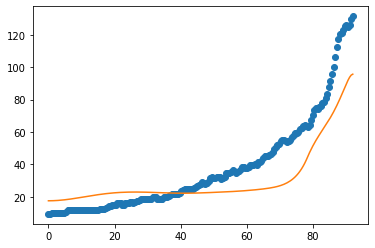

after perturb [9.596567613099703, 101.45764292249015, 24295.505378371523, 0.270590853438061, 30.655412179644983]
parameters [9.596567613099703, 101.45764292249015, 24295.505378371523, 0.270590853438061, 30.655412179644983]
oxigeno [9.56678533e-07 9.56675751e-07 9.56674139e-07 9.56693915e-07
 9.56768838e-07 9.56946293e-07 9.57287428e-07 9.57867335e-07
 9.58775287e-07 9.60115048e-07 9.62005250e-07 9.64579866e-07
 9.67988785e-07 9.72398500e-07 9.77992941e-07 9.84974443e-07
 9.93564895e-07 1.00400707e-06 1.01656618e-06 1.03153161e-06
 1.04921898e-06 1.06997242e-06 1.09416719e-06 1.12221256e-06
 1.15455516e-06 1.19168259e-06 1.23412755e-06 1.28247237e-06
 1.33735407e-06 1.39946990e-06 1.46958354e-06 1.54853189e-06
 1.63723249e-06 1.73669179e-06 1.84801414e-06 1.97241167e-06
 2.11121509e-06 2.26588562e-06 2.43802787e-06 2.62940405e-06
 2.84194944e-06 3.07778927e-06 3.33925722e-06 3.62891544e-06
 3.94957657e-06 4.30432762e-06 4.69655601e-06 5.12997798e-06
 5.60866951e-06 6.13709994e-06 6.7201

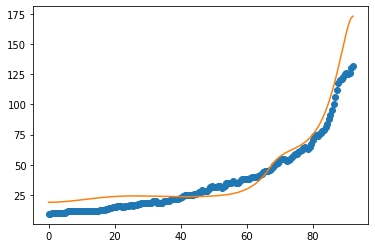

after perturb [11.243528428387611, 96.9742673002703, 25778.312035541217, 0.31288856825154676, 21.68697361816117]
parameters [11.243528428387611, 96.9742673002703, 25778.312035541217, 0.31288856825154676, 21.68697361816117]
after perturb [9.656564990443169, 38.50823249757386, 27420.71289407325, 0.20342170367689794, 22.37990210268712]
parameters [9.656564990443169, 38.50823249757386, 27420.71289407325, 0.20342170367689794, 22.37990210268712]
oxigeno [1.58436689e-05 1.58294599e-05 1.57869334e-05 1.57163894e-05
 1.56183231e-05 1.54934186e-05 1.53425389e-05 1.51667148e-05
 1.49671310e-05 1.47451108e-05 1.45020992e-05 1.42396450e-05
 1.39593823e-05 1.36630114e-05 1.33522796e-05 1.30289630e-05
 1.26948477e-05 1.23517133e-05 1.20013157e-05 1.16453734e-05
 1.12855528e-05 1.09234572e-05 1.05606161e-05 1.01984762e-05
 9.83839472e-06 9.48163386e-06 9.12935665e-06 8.78262463e-06
 8.44239665e-06 8.10952899e-06 7.78477659e-06 7.46879530e-06
 7.16214489e-06 6.86529294e-06 6.57861920e-06 6.30242052e-06

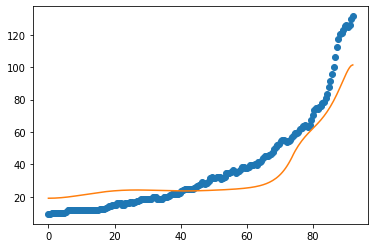

after perturb [6.847718118732029, 43.46945981210037, 24823.420348284486, -0.13534302957330185, 12.488349455205071]
parameters [6.847718118732029, 43.46945981210037, 24823.420348284486, -0.13534302957330185, 12.488349455205071]
after perturb [11.111936879611822, -7.221551131237291, 18964.441464709747, -0.677729401584748, -15.09011870295268]
parameters [11.111936879611822, -7.221551131237291, 18964.441464709747, -0.677729401584748, -15.09011870295268]
after perturb [0.18504399784646086, 87.24022049505484, 24844.748299718256, 0.4394299295706925, 34.3539771298471]
parameters [0.18504399784646086, 87.24022049505484, 24844.748299718256, 0.4394299295706925, 34.3539771298471]
oxigeno [1.52816939e-09 1.52712962e-09 1.52426141e-09 1.52024091e-09
 1.51598455e-09 1.51244909e-09 1.51048748e-09 1.51078971e-09
 1.51389394e-09 1.52023404e-09 1.53020774e-09 1.54427711e-09
 1.56310561e-09 1.58769076e-09 1.61942447e-09 1.66004394e-09
 1.71149805e-09 1.77579729e-09 1.85492400e-09 1.95084365e-09
 2.0655934

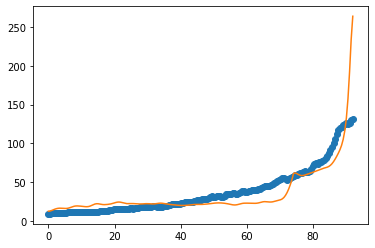

after perturb [1.6913183980712403, 95.65070938852509, 24343.39354711441, 0.6108740295801779, 33.41274977600766]
parameters [1.6913183980712403, 95.65070938852509, 24343.39354711441, 0.6108740295801779, 33.41274977600766]
oxigeno [1.80234364e-11 1.81727508e-11 1.86235635e-11 1.93845454e-11
 2.04703596e-11 2.19019815e-11 2.37071551e-11 2.59209914e-11
 2.85867218e-11 3.17566195e-11 3.54931089e-11 3.98700821e-11
 4.49744506e-11 5.09079603e-11 5.77893068e-11 6.57565942e-11
 7.49701927e-11 8.56160629e-11 9.79096337e-11 1.12100338e-10
 1.28476936e-10 1.47373762e-10 1.69178066e-10 1.94338623e-10
 2.23375793e-10 2.56893223e-10 2.95591430e-10 3.40283470e-10
 3.91913020e-10 4.51575201e-10 5.20540600e-10 6.00283057e-10
 6.92511898e-10 7.99209429e-10 9.22674615e-10 1.06557395e-09
 1.23100059e-09 1.42254275e-09 1.64436250e-09 1.90128593e-09
 2.19890573e-09 2.54369743e-09 2.94315061e-09 3.40591700e-09
 3.94197773e-09 4.56283294e-09 5.28171774e-09 6.11384950e-09
 7.07671260e-09 8.19038747e-09 9.477932

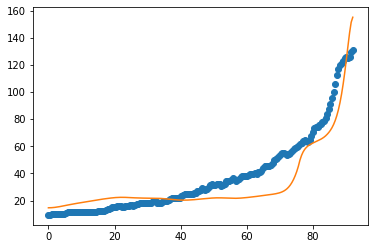

after perturb [16.575330761915737, 53.44840444206514, 23475.413797757254, 0.03796377148343545, 3.475828554055912]
parameters [16.575330761915737, 53.44840444206514, 23475.413797757254, 0.03796377148343545, 3.475828554055912]
after perturb [-0.7512600858776324, 97.73768426802931, 30423.237212879758, 0.6288386801738344, 43.851068095140626]
parameters [-0.7512600858776324, 97.73768426802931, 30423.237212879758, 0.6288386801738344, 43.851068095140626]
after perturb [6.972177945674008, 81.08336016016281, 25777.757563728166, 0.30250941372632595, 26.49027001705229]
parameters [6.972177945674008, 81.08336016016281, 25777.757563728166, 0.30250941372632595, 26.49027001705229]
oxigeno [2.35029725e-07 2.34876101e-07 2.34416667e-07 2.33655723e-07
 2.32600399e-07 2.31260598e-07 2.29648919e-07 2.27780569e-07
 2.25673257e-07 2.23347086e-07 2.20824435e-07 2.18129850e-07
 2.15289941e-07 2.12333288e-07 2.09290371e-07 2.06193525e-07
 2.03076917e-07 1.99976564e-07 1.96930390e-07 1.93978325e-07
 1.91162452e

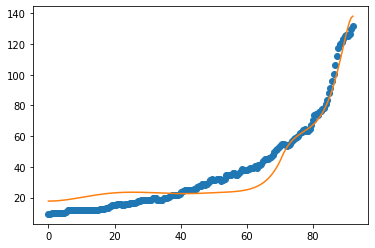

11
after perturb [14.436480519182112, 81.56337146415636, 23266.57411665222, -0.09645249452430164, 14.923179630278302]
parameters [14.436480519182112, 81.56337146415636, 23266.57411665222, -0.09645249452430164, 14.923179630278302]
after perturb [6.435255007546449, 150.95121769910406, 26601.220911799348, 0.6571618937405991, 37.43776687445212]
parameters [6.435255007546449, 150.95121769910406, 26601.220911799348, 0.6571618937405991, 37.43776687445212]
after perturb [10.454875944820369, 37.980446912483785, 26627.670507095725, 0.20418872289683848, 23.43790770074777]
parameters [10.454875944820369, 37.980446912483785, 26627.670507095725, 0.20418872289683848, 23.43790770074777]
after perturb [12.001634197393281, 1.2052308232286322, 20788.711723794986, -0.12818606394237414, 12.624886919288222]
parameters [12.001634197393281, 1.2052308232286322, 20788.711723794986, -0.12818606394237414, 12.624886919288222]
after perturb [1.6009070908472491, 158.4492061680564, 24583.201253443112, 0.7681913985904

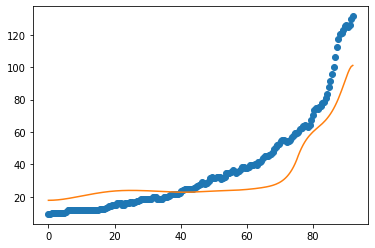

after perturb [10.387264671988023, 59.97043833358845, 29069.119909347348, 0.16305259047161347, 32.72689094776143]
parameters [10.387264671988023, 59.97043833358845, 29069.119909347348, 0.16305259047161347, 32.72689094776143]
after perturb [13.1012815746165, -44.09260212277209, 20244.736549261608, -0.006913816725631947, 33.44042999137081]
parameters [13.1012815746165, -44.09260212277209, 20244.736549261608, -0.006913816725631947, 33.44042999137081]
after perturb [8.74345732574709, 65.33076774609724, 20226.549683572426, -0.09306973292194946, 4.57517280157294]
parameters [8.74345732574709, 65.33076774609724, 20226.549683572426, -0.09306973292194946, 4.57517280157294]
after perturb [0.48643377089000595, 27.954562368365963, 18539.895752820812, -0.4390085734351687, 1.7475663170878732]
parameters [0.48643377089000595, 27.954562368365963, 18539.895752820812, -0.4390085734351687, 1.7475663170878732]
after perturb [1.583123972896896, 116.70775244220133, 21909.21158060626, 0.47864496073020757, 25

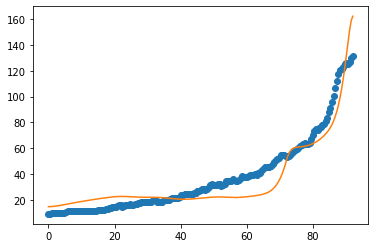

after perturb [9.007358277946519, 247.31480103534886, 29625.301662556543, 1.3382415804420122, 51.27152814846081]
parameters [9.007358277946519, 247.31480103534886, 29625.301662556543, 1.3382415804420122, 51.27152814846081]
after perturb [6.796729320555267, 127.52838348540563, 24948.94432569702, 0.24627324796787756, 19.91446542317879]
parameters [6.796729320555267, 127.52838348540563, 24948.94432569702, 0.24627324796787756, 19.91446542317879]
oxigeno [3.80315444e-06 3.80748132e-06 3.82050150e-06 3.84233393e-06
 3.87317747e-06 3.91331207e-06 3.96310015e-06 4.02298867e-06
 4.09351146e-06 4.17529228e-06 4.26904823e-06 4.37559390e-06
 4.49584608e-06 4.63082910e-06 4.78168103e-06 4.94966049e-06
 5.13615445e-06 5.34268680e-06 5.57092802e-06 5.82270572e-06
 6.10001646e-06 6.40503861e-06 6.74014655e-06 7.10792620e-06
 7.51119201e-06 7.95300542e-06 8.43669503e-06 8.96587848e-06
 9.54448616e-06 1.01767869e-05 1.08674157e-05 1.16214039e-05
 1.24442112e-05 1.33417609e-05 1.43204772e-05 1.53873253e-

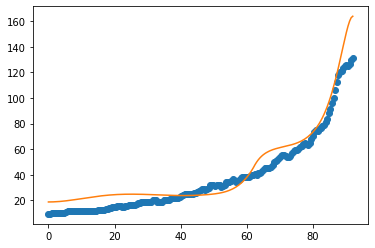

after perturb [8.658379275764123, 138.64237159905278, 25011.860810371298, 0.7640401730656476, 37.11943341012512]
parameters [8.658379275764123, 138.64237159905278, 25011.860810371298, 0.7640401730656476, 37.11943341012512]
oxigeno [1.90642446e-10 1.92032414e-10 1.96222739e-10 2.03275023e-10
 2.13293074e-10 2.26424635e-10 2.42863844e-10 2.62854469e-10
 2.86693982e-10 3.14738524e-10 3.47408868e-10 3.85197471e-10
 4.28676740e-10 4.78508655e-10 5.35455916e-10 6.00394805e-10
 6.74329990e-10 7.58411520e-10 8.53954299e-10 9.62460387e-10
 1.08564449e-09 1.22546311e-09 1.38414776e-09 1.56424294e-09
 1.76864940e-09 2.00067345e-09 2.26408314e-09 2.56317229e-09
 2.90283327e-09 3.28863994e-09 3.72694192e-09 4.22497177e-09
 4.79096685e-09 5.43430773e-09 6.16567540e-09 6.99722974e-09
 7.94281201e-09 9.01817458e-09 1.02412414e-08 1.16324033e-08
 1.32148524e-08 1.50149611e-08 1.70627109e-08 1.93921782e-08
 2.20420834e-08 2.50564122e-08 2.84851183e-08 3.23849176e-08
 3.68201849e-08 4.18639682e-08 4.7599

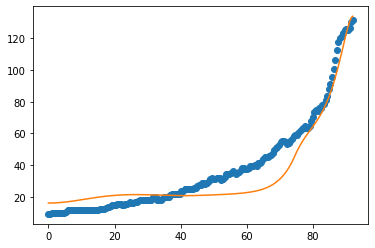

after perturb [4.925818015960455, 146.53195640966794, 23190.39308324313, 0.3820765754403721, 14.457270326550756]
parameters [4.925818015960455, 146.53195640966794, 23190.39308324313, 0.3820765754403721, 14.457270326550756]
oxigeno [2.28585797e-07 2.29424279e-07 2.31946368e-07 2.36172065e-07
 2.42134917e-07 2.49882353e-07 2.59476143e-07 2.70992995e-07
 2.84525302e-07 3.00182022e-07 3.18089720e-07 3.38393763e-07
 3.61259696e-07 3.86874781e-07 4.15449747e-07 4.47220735e-07
 4.82451479e-07 5.21435726e-07 5.64499921e-07 6.12006191e-07
 6.64355638e-07 7.21991982e-07 7.85405582e-07 8.55137865e-07
 9.31786206e-07 1.01600929e-06 1.10853303e-06 1.21015697e-06
 1.32176144e-06 1.44431527e-06 1.57888426e-06 1.72664045e-06
 1.88887214e-06 2.06699494e-06 2.26256366e-06 2.47728531e-06
 2.71303314e-06 2.97186200e-06 3.25602487e-06 3.56799085e-06
 3.91046466e-06 4.28640776e-06 4.69906131e-06 5.15197098e-06
 5.64901398e-06 6.19442836e-06 6.79284487e-06 7.44932161e-06
 8.16938169e-06 8.95905427e-06 9.8249

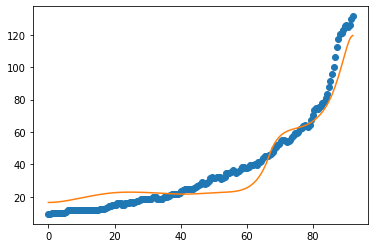

12
after perturb [11.780595990240766, -18.26241586688677, 23974.462306917863, -0.27262086358553245, 23.717099657350637]
parameters [11.780595990240766, -18.26241586688677, 23974.462306917863, -0.27262086358553245, 23.717099657350637]
after perturb [15.030440092209794, 77.07070011926811, 21830.941598942107, 0.4675795487407729, 29.113003159712825]
parameters [15.030440092209794, 77.07070011926811, 21830.941598942107, 0.4675795487407729, 29.113003159712825]
after perturb [0.8131272058461256, 88.530085584186, 19053.000357799403, -0.024384625498572843, 3.7278287592938195]
parameters [0.8131272058461256, 88.530085584186, 19053.000357799403, -0.024384625498572843, 3.7278287592938195]
after perturb [0.7868889924135185, 36.151598105597415, 16260.058469760701, 0.17563111251749294, 22.68785940539269]
parameters [0.7868889924135185, 36.151598105597415, 16260.058469760701, 0.17563111251749294, 22.68785940539269]
after perturb [10.95384556502449, 150.45002679628425, 21387.727136547128, 0.44516523657

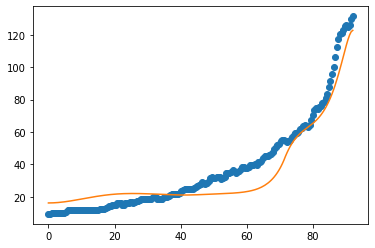

after perturb [5.903244848053697, 14.835680192196655, 25939.55460404153, -0.2364027616715797, 7.232137534446451]
parameters [5.903244848053697, 14.835680192196655, 25939.55460404153, -0.2364027616715797, 7.232137534446451]
after perturb [5.085228871280061, 98.63262510792225, 25763.370091598743, 0.015081044077633277, 15.435933568467025]
parameters [5.085228871280061, 98.63262510792225, 25763.370091598743, 0.015081044077633277, 15.435933568467025]
oxigeno [ 2.43001569  2.4297853   2.42909543  2.42794994  2.42635522  2.42432013
  2.42185588  2.41897594  2.41569592  2.41203339  2.40800773  2.40363999
  2.39895269  2.39396967  2.3887159   2.38321737  2.37750088  2.37159395
  2.36552465  2.35932154  2.35301349  2.34662965  2.34019934  2.33375197
  2.32731703  2.32092396  2.31460215  2.30838088  2.3022893   2.29635635
  2.29061077  2.28508104  2.27979538  2.27478167  2.27006749  2.26568001
  2.26164608  2.2579921   2.25474411  2.25192771  2.24956811  2.24769013
  2.24631822  2.24547649  2.245

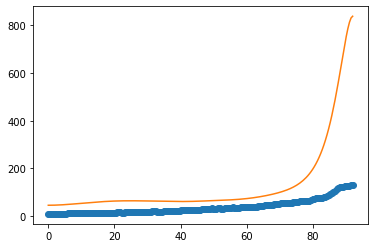

after perturb [5.079916760594804, 159.66738006218986, 22500.874235603602, 0.6132202442043537, 28.781653065967937]
parameters [5.079916760594804, 159.66738006218986, 22500.874235603602, 0.6132202442043537, 28.781653065967937]
after perturb [8.663514471413558, 28.303450307595828, 19103.76032899862, 0.08367657490712999, 22.346883770201707]
parameters [8.663514471413558, 28.303450307595828, 19103.76032899862, 0.08367657490712999, 22.346883770201707]
after perturb [15.788988014435716, -35.99810783238047, 23052.4783870989, -0.19956822523531054, 22.06723844029054]
parameters [15.788988014435716, -35.99810783238047, 23052.4783870989, -0.19956822523531054, 22.06723844029054]
after perturb [1.8499921790795093, 101.09174865696997, 16601.130893973026, 0.41247314507705135, 19.21602878522537]
parameters [1.8499921790795093, 101.09174865696997, 16601.130893973026, 0.41247314507705135, 19.21602878522537]
after perturb [6.461873529583359, 153.27741799577984, 21904.953637019113, 0.6401975316603097, 26.2

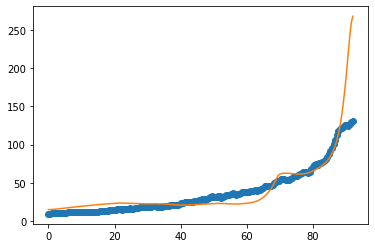

after perturb [3.981362611147958, 39.5312588485242, 25079.221557252917, -0.09355831411056509, 14.475346995475912]
parameters [3.981362611147958, 39.5312588485242, 25079.221557252917, -0.09355831411056509, 14.475346995475912]
after perturb [12.240942869872251, 62.22563918942711, 27766.142800820122, 0.7603582789856673, 45.244258972283774]
parameters [12.240942869872251, 62.22563918942711, 27766.142800820122, 0.7603582789856673, 45.244258972283774]
after perturb [0.6695493238440209, 125.76420174025861, 26276.805087946464, 0.4240722675268217, 29.660603984127626]
parameters [0.6695493238440209, 125.76420174025861, 26276.805087946464, 0.4240722675268217, 29.660603984127626]
oxigeno [2.31440406e-08 2.32388727e-08 2.35247609e-08 2.40058304e-08
 2.46888034e-08 2.55828118e-08 2.66992151e-08 2.80514799e-08
 2.96551768e-08 3.15281306e-08 3.36907344e-08 3.61664074e-08
 3.89821426e-08 4.21690689e-08 4.57629447e-08 4.98045177e-08
 5.43397280e-08 5.94197846e-08 6.51012066e-08 7.14459609e-08
 7.8521849

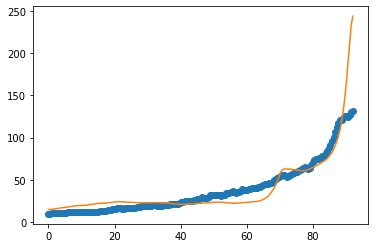

after perturb [10.20022010404853, 9.64409250686866, 23351.531223801823, 0.09880427518067936, 22.410194235105585]
parameters [10.20022010404853, 9.64409250686866, 23351.531223801823, 0.09880427518067936, 22.410194235105585]
after perturb [-1.7878039154616725, 111.45224686909341, 17600.2848647947, 0.2974498807278372, 10.876215149044231]
parameters [-1.7878039154616725, 111.45224686909341, 17600.2848647947, 0.2974498807278372, 10.876215149044231]
after perturb [4.8016453458263575, 38.078678548633164, 24314.90984717958, 0.12894841509126276, 29.16236598540965]
parameters [4.8016453458263575, 38.078678548633164, 24314.90984717958, 0.12894841509126276, 29.16236598540965]
oxigeno [5.88345609e-04 5.87857029e-04 5.86395286e-04 5.83972287e-04
 5.80607625e-04 5.76328203e-04 5.71167734e-04 5.65166127e-04
 5.58368785e-04 5.50825835e-04 5.42591316e-04 5.33722353e-04
 5.24278331e-04 5.14320098e-04 5.03909211e-04 4.93107236e-04
 4.81975118e-04 4.70572623e-04 4.58957853e-04 4.47186849e-04
 4.35313249e-0

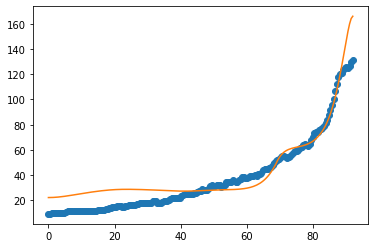

after perturb [5.425596751643076, 45.21306874432862, 19051.454307485743, 0.047087123123646366, 27.47519111683213]
parameters [5.425596751643076, 45.21306874432862, 19051.454307485743, 0.047087123123646366, 27.47519111683213]
after perturb [9.67133436774965, 37.72034694265817, 18933.831029017743, 0.20648925691699405, 26.93428030092928]
parameters [9.67133436774965, 37.72034694265817, 18933.831029017743, 0.20648925691699405, 26.93428030092928]
after perturb [-2.645709119095803, 214.67049657161422, 19149.91072546009, 0.37524319879659196, 11.793326436655422]
parameters [-2.645709119095803, 214.67049657161422, 19149.91072546009, 0.37524319879659196, 11.793326436655422]
after perturb [11.839743940520435, 8.120015387726127, 30346.373904722634, -0.19235122949194827, 21.18445568244211]
parameters [11.839743940520435, 8.120015387726127, 30346.373904722634, -0.19235122949194827, 21.18445568244211]
after perturb [9.017388216588467, 36.84663280424427, 15497.940255808111, -0.25189932428222983, 14.31

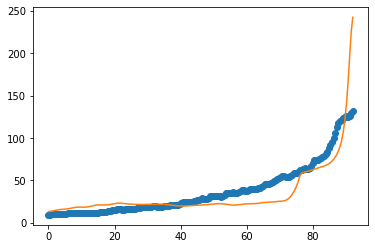

after perturb [5.681943642894823, 88.29916631381965, 18510.299892237115, 0.4993727259320678, 36.882630132802]
parameters [5.681943642894823, 88.29916631381965, 18510.299892237115, 0.4993727259320678, 36.882630132802]
after perturb [10.737336465540851, 2.5121799377260317, 26707.447723334713, 0.4077065746315028, 48.40310163182053]
parameters [10.737336465540851, 2.5121799377260317, 26707.447723334713, 0.4077065746315028, 48.40310163182053]
after perturb [7.470072191004607, 0.9282351540641116, 17042.177213794737, -0.406630892020371, 4.410055978337612]
parameters [7.470072191004607, 0.9282351540641116, 17042.177213794737, -0.406630892020371, 4.410055978337612]
after perturb [8.376215086956522, 142.46778773674248, 26184.321027265578, 0.4935501393373304, 19.4345018190982]
parameters [8.376215086956522, 142.46778773674248, 26184.321027265578, 0.4935501393373304, 19.4345018190982]
oxigeno [2.05564472e-08 2.06573900e-08 2.09612231e-08 2.14709726e-08
 2.21917215e-08 2.31306688e-08 2.42972139e-08

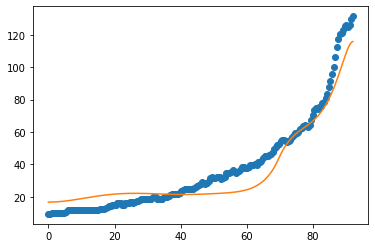

13
after perturb [6.616368412807879, 22.674444008992076, 29048.22366888146, -0.008868549435043033, 26.783536260766176]
parameters [6.616368412807879, 22.674444008992076, 29048.22366888146, -0.008868549435043033, 26.783536260766176]
after perturb [3.571687678296615, 38.24402939471321, 20105.257856935023, 0.29111823586314106, 36.01914236994857]
parameters [3.571687678296615, 38.24402939471321, 20105.257856935023, 0.29111823586314106, 36.01914236994857]
oxigeno [6.40707824e-07 6.39810228e-07 6.37127807e-07 6.32691378e-07
 6.26551381e-07 6.18776538e-07 6.09452083e-07 5.98677627e-07
 5.86564775e-07 5.73234583e-07 5.58814983e-07 5.43438233e-07
 5.27238518e-07 5.10349736e-07 4.92903534e-07 4.75027626e-07
 4.56844390e-07 4.38469769e-07 4.20012429e-07 4.01573179e-07
 3.83244605e-07 3.65110895e-07 3.47247817e-07 3.29722819e-07
 3.12595228e-07 2.95916522e-07 2.79730653e-07 2.64074406e-07
 2.48977793e-07 2.34464453e-07 2.20552073e-07 2.07252816e-07
 1.94573744e-07 1.82517255e-07 1.71081507e-07 1.6

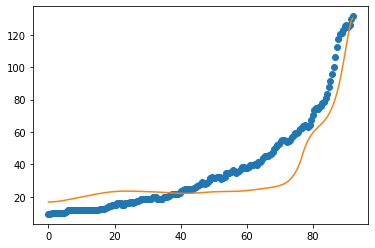

after perturb [1.1176285379554614, 156.76003874012463, 19713.27972966548, 0.506931667491594, 22.321833484059677]
parameters [1.1176285379554614, 156.76003874012463, 19713.27972966548, 0.506931667491594, 22.321833484059677]
after perturb [7.655046428825962, 101.8009036493008, 17846.64538150403, 0.27120895510364246, 19.761790159353218]
parameters [7.655046428825962, 101.8009036493008, 17846.64538150403, 0.27120895510364246, 19.761790159353218]
after perturb [5.8629018421999035, 148.6958568599842, 28686.060670601262, 0.47916206173842124, 20.921173797569004]
parameters [5.8629018421999035, 148.6958568599842, 28686.060670601262, 0.47916206173842124, 20.921173797569004]
oxigeno [4.16653884e-08 4.18507682e-08 4.24086163e-08 4.33440786e-08
 4.46657966e-08 4.63860048e-08 4.85206700e-08 5.10896707e-08
 5.41170208e-08 5.76311385e-08 6.16651635e-08 6.62573254e-08
 7.14513665e-08 7.72970246e-08 8.38505790e-08 9.11754668e-08
 9.93429751e-08 1.08433017e-07 1.18534998e-07 1.29748784e-07
 1.42185781e-0

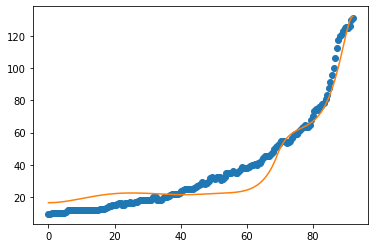

14
after perturb [2.4563897716873813, 31.465007098000825, 24937.232204231856, 0.07920590931874771, 17.922433619711086]
parameters [2.4563897716873813, 31.465007098000825, 24937.232204231856, 0.07920590931874771, 17.922433619711086]
oxigeno [5.39838307e-03 5.39384838e-03 5.38029591e-03 5.35787878e-03
 5.32684667e-03 5.28753784e-03 5.24036878e-03 5.18582200e-03
 5.12443272e-03 5.05677513e-03 4.98344886e-03 4.90506631e-03
 4.82224113e-03 4.73557836e-03 4.64566628e-03 4.55307015e-03
 4.45832769e-03 4.36194631e-03 4.26440175e-03 4.16613788e-03
 4.06756750e-03 3.96907369e-03 3.87101152e-03 3.77370990e-03
 3.67747326e-03 3.58258314e-03 3.48929938e-03 3.39786115e-03
 3.30848761e-03 3.22137844e-03 3.13671419e-03 3.05465666e-03
 2.97534915e-03 2.89891684e-03 2.82546710e-03 2.75508987e-03
 2.68785795e-03 2.62382727e-03 2.56303705e-03 2.50550989e-03
 2.45125181e-03 2.40025235e-03 2.35248463e-03 2.30790566e-03
 2.26645688e-03 2.22806488e-03 2.19264259e-03 2.16009069e-03
 2.13029940e-03 2.10315048e-

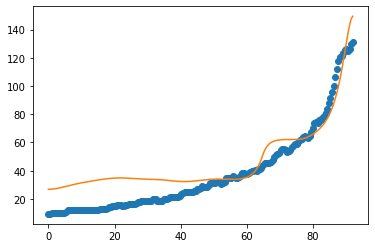

after perturb [-1.5428481888007544, 131.31994512288782, 18788.091135325616, 0.18679373936120175, 20.015847303486797]
parameters [-1.5428481888007544, 131.31994512288782, 18788.091135325616, 0.18679373936120175, 20.015847303486797]
after perturb [13.147560627707861, 36.888846531539386, 26029.02396368063, 0.16476950810308155, 22.318864133098426]
parameters [13.147560627707861, 36.888846531539386, 26029.02396368063, 0.16476950810308155, 22.318864133098426]
after perturb [9.314747920300091, 75.84091545828738, 27494.046499865544, 0.28005156330634323, 21.932130345884282]
parameters [9.314747920300091, 75.84091545828738, 27494.046499865544, 0.28005156330634323, 21.932130345884282]
oxigeno [5.28369084e-07 5.28020609e-07 5.26977634e-07 5.25247492e-07
 5.22842330e-07 5.19779004e-07 5.16078937e-07 5.11767938e-07
 5.06875996e-07 5.01437049e-07 4.95488733e-07 4.89072129e-07
 4.82231497e-07 4.75014025e-07 4.67469585e-07 4.59650509e-07
 4.51611399e-07 4.43408967e-07 4.35101922e-07 4.26750903e-07
 4.1

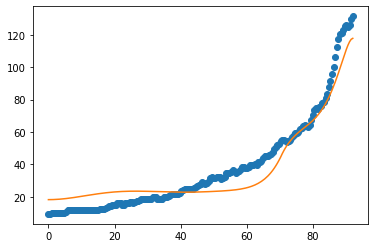

15
after perturb [3.2241676771289343, 176.17736277062488, 29708.66313938913, 0.8883690093628339, 38.713507856202604]
parameters [3.2241676771289343, 176.17736277062488, 29708.66313938913, 0.8883690093628339, 38.713507856202604]
after perturb [10.079042272665028, 99.74356852682095, 24138.49096476346, 0.04563339554651619, -5.937722146535055]
parameters [10.079042272665028, 99.74356852682095, 24138.49096476346, 0.04563339554651619, -5.937722146535055]
after perturb [5.98194923630866, 120.7366621835781, 27305.805906778543, 0.477956930456192, 22.286032823400504]
parameters [5.98194923630866, 120.7366621835781, 27305.805906778543, 0.477956930456192, 22.286032823400504]
oxigeno [4.69370227e-09 4.72008165e-09 4.79952999e-09 4.93298213e-09
 5.12201040e-09 5.36884622e-09 5.67641074e-09 6.04835482e-09
 6.48910907e-09 7.00394431e-09 7.59904353e-09 8.28158608e-09
 9.05984528e-09 9.94330077e-09 1.09427671e-08 1.20705400e-08
 1.33405630e-08 1.47686159e-08 1.63725276e-08 1.81724170e-08
 2.01909640e-08

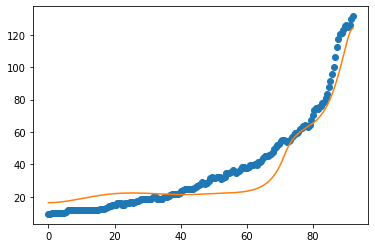

after perturb [12.033061275574871, 172.26148457604705, 25339.024709556972, 1.0154741480857536, 41.32258176628841]
parameters [12.033061275574871, 172.26148457604705, 25339.024709556972, 1.0154741480857536, 41.32258176628841]
after perturb [7.030972169068255, 103.81521101760356, 20890.448946174976, 0.34192574981257184, 27.398488177182934]
parameters [7.030972169068255, 103.81521101760356, 20890.448946174976, 0.34192574981257184, 27.398488177182934]
oxigeno [5.74565241e-08 5.75280685e-08 5.77439102e-08 5.81076846e-08
 5.86254867e-08 5.93059252e-08 6.01601998e-08 6.12022034e-08
 6.24486501e-08 6.39192317e-08 6.56368058e-08 6.76276174e-08
 6.99215582e-08 7.25524669e-08 7.55584758e-08 7.89824075e-08
 8.28722268e-08 8.72815551e-08 9.22702526e-08 9.79050755e-08
 1.04260417e-07 1.11419139e-07 1.19473508e-07 1.28526239e-07
 1.38691668e-07 1.50097056e-07 1.62884048e-07 1.77210298e-07
 1.93251271e-07 2.11202256e-07 2.31280594e-07 2.53728157e-07
 2.78814091e-07 3.06837859e-07 3.38132613e-07 3.7306

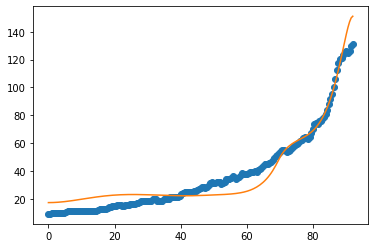

16
after perturb [8.451565773632538, 72.5250231066859, 27468.212374757386, 0.3455329364995531, 22.229082531347352]
parameters [8.451565773632538, 72.5250231066859, 27468.212374757386, 0.3455329364995531, 22.229082531347352]
oxigeno [3.39318077e-08 3.39052488e-08 3.38257911e-08 3.36940887e-08
 3.35112252e-08 3.32787044e-08 3.29984363e-08 3.26727218e-08
 3.23042340e-08 3.18959982e-08 3.14513710e-08 3.09740188e-08
 3.04678982e-08 2.99372367e-08 2.93865169e-08 2.88204640e-08
 2.82440376e-08 2.76624291e-08 2.70810651e-08 2.65056183e-08
 2.59420264e-08 2.53965203e-08 2.48756624e-08 2.43863961e-08
 2.39361075e-08 2.35327014e-08 2.31846918e-08 2.29013088e-08
 2.26926251e-08 2.25697016e-08 2.25447568e-08 2.26313610e-08
 2.28446593e-08 2.32016260e-08 2.37213556e-08 2.44253931e-08
 2.53381103e-08 2.64871330e-08 2.79038257e-08 2.96238422e-08
 3.16877488e-08 3.41417315e-08 3.70383965e-08 4.04376782e-08
 4.44078657e-08 4.90267658e-08 5.43830196e-08 6.05775917e-08
 6.77254546e-08 7.59574943e-08 8.542

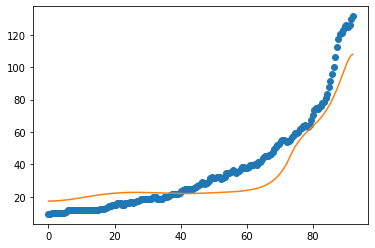

after perturb [2.2449288475881017, 83.93034006401442, 23621.205069687607, 0.35671184401942047, 29.28088271630306]
parameters [2.2449288475881017, 83.93034006401442, 23621.205069687607, 0.35671184401942047, 29.28088271630306]
oxigeno [3.18383478e-08 3.18139326e-08 3.17411405e-08 3.16213219e-08
 3.14566963e-08 3.12503079e-08 3.10059689e-08 3.07281954e-08
 3.04221399e-08 3.00935262e-08 2.97485913e-08 2.93940373e-08
 2.90369979e-08 2.86850201e-08 2.83460654e-08 2.80285294e-08
 2.77412818e-08 2.74937274e-08 2.72958880e-08 2.71585052e-08
 2.70931649e-08 2.71124429e-08 2.72300727e-08 2.74611361e-08
 2.78222784e-08 2.83319510e-08 2.90106833e-08 2.98813887e-08
 3.09697109e-08 3.23044131e-08 3.39178207e-08 3.58463209e-08
 3.81309301e-08 4.08179358e-08 4.39596225e-08 4.76150912e-08
 5.18511805e-08 5.67435011e-08 6.23775921e-08 6.88502105e-08
 7.62707654e-08 8.47629100e-08 9.44663079e-08 1.05538591e-07
 1.18157535e-07 1.32523481e-07 1.48862043e-07 1.67427131e-07
 1.88504365e-07 2.12414920e-07 2.39

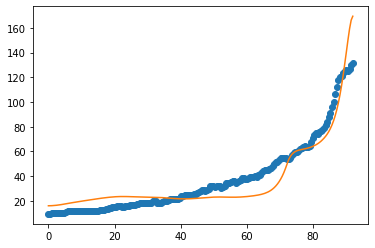

after perturb [9.905293939159035, 141.417454079355, 28129.00206554244, 0.39496895901558327, 13.317896541009167]
parameters [9.905293939159035, 141.417454079355, 28129.00206554244, 0.39496895901558327, 13.317896541009167]
oxigeno [1.21840858e-07 1.22341755e-07 1.23848680e-07 1.26374372e-07
 1.29940203e-07 1.34576386e-07 1.40322271e-07 1.47226732e-07
 1.55348639e-07 1.64757442e-07 1.75533840e-07 1.87770568e-07
 2.01573303e-07 2.17061681e-07 2.34370461e-07 2.53650824e-07
 2.75071830e-07 2.98822039e-07 3.25111325e-07 3.54172875e-07
 3.86265416e-07 4.21675671e-07 4.60721074e-07 5.03752768e-07
 5.51158903e-07 6.03368276e-07 6.60854328e-07 7.24139547e-07
 7.93800296e-07 8.70472124e-07 9.54855587e-07 1.04772264e-06
 1.14992362e-06 1.26239494e-06 1.38616749e-06 1.52237579e-06
 1.67226811e-06 1.83721743e-06 2.01873345e-06 2.21847578e-06
 2.43826828e-06 2.68011470e-06 2.94621584e-06 3.23898818e-06
 3.56108428e-06 3.91541502e-06 4.30517378e-06 4.73386288e-06
 5.20532239e-06 5.72376147e-06 6.293792

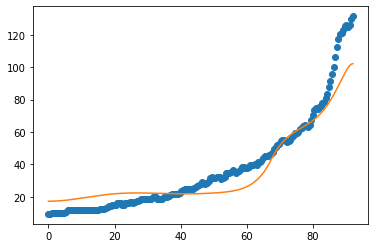

after perturb [8.461056562364483, 74.92933334188356, 20410.515268217903, 0.09206029128757434, 15.9263579125798]
parameters [8.461056562364483, 74.92933334188356, 20410.515268217903, 0.09206029128757434, 15.9263579125798]
oxigeno [3.14101929e-03 3.13981551e-03 3.13621041e-03 3.13022273e-03
 3.12188347e-03 3.11123560e-03 3.09833364e-03 3.08324308e-03
 3.06603983e-03 3.04680944e-03 3.02564632e-03 3.00265296e-03
 2.97793896e-03 2.95162019e-03 2.92381783e-03 2.89465746e-03
 2.86426815e-03 2.83278160e-03 2.80033126e-03 2.76705160e-03
 2.73307728e-03 2.69854258e-03 2.66358068e-03 2.62832323e-03
 2.59289977e-03 2.55743743e-03 2.52206053e-03 2.48689040e-03
 2.45204514e-03 2.41763954e-03 2.38378503e-03 2.35058970e-03
 2.31815839e-03 2.28659281e-03 2.25599174e-03 2.22645129e-03
 2.19806518e-03 2.17092509e-03 2.14512103e-03 2.12074180e-03
 2.09787543e-03 2.07660968e-03 2.05703262e-03 2.03923316e-03
 2.02330167e-03 2.00933062e-03 1.99741525e-03 1.98765424e-03
 1.98015047e-03 1.97501173e-03 1.972351

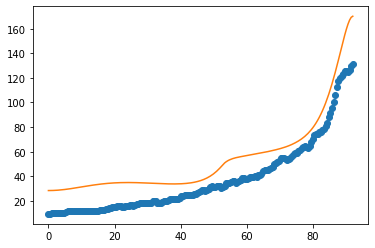

after perturb [1.2660720550893196, 122.91131028803885, 27470.648000604942, 0.8287037867060345, 42.8566007907032]
parameters [1.2660720550893196, 122.91131028803885, 27470.648000604942, 0.8287037867060345, 42.8566007907032]
oxigeno [1.48595298e-11 1.49821693e-11 1.53523625e-11 1.59769802e-11
 1.68676259e-11 1.80408685e-11 1.95185742e-11 2.13283475e-11
 2.35040939e-11 2.60867207e-11 2.91249916e-11 3.26765553e-11
 3.68091606e-11 4.16020719e-11 4.71476976e-11 5.35534480e-11
 6.09438508e-11 6.94629720e-11 7.92772177e-11 9.05786225e-11
 1.03588759e-10 1.18563428e-10 1.35798293e-10 1.55635613e-10
 1.78472208e-10 2.04768750e-10 2.35060446e-10 2.69969178e-10
 3.10217190e-10 3.56642505e-10 4.10216404e-10 4.72063459e-10
 5.43484855e-10 6.25985878e-10 7.21308609e-10 8.31470844e-10
 9.58812226e-10 1.10604831e-09 1.27633308e-09 1.47333012e-09
 1.70129245e-09 1.96515114e-09 2.27061296e-09 2.62426793e-09
 3.03370852e-09 3.50766334e-09 4.05614924e-09 4.69064676e-09
 5.42430507e-09 6.27218259e-09 7.2515

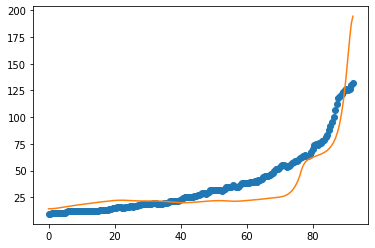

after perturb [12.365670181333071, 106.51184004629448, 25168.011021287726, 0.5822781913104167, 37.06030648322353]
parameters [12.365670181333071, 106.51184004629448, 25168.011021287726, 0.5822781913104167, 37.06030648322353]
after perturb [7.787483231089068, 72.97946399925779, 30105.611498245085, 0.3167182705393618, 23.2167845694293]
parameters [7.787483231089068, 72.97946399925779, 30105.611498245085, 0.3167182705393618, 23.2167845694293]
after perturb [9.869892932459678, 68.85556243129349, 20774.165227764548, -0.11611936008671425, 3.5733679602988566]
parameters [9.869892932459678, 68.85556243129349, 20774.165227764548, -0.11611936008671425, 3.5733679602988566]
after perturb [11.656687057995905, 60.77296533962095, 18682.26600873341, 0.16368492793050882, 15.804041824984035]
parameters [11.656687057995905, 60.77296533962095, 18682.26600873341, 0.16368492793050882, 15.804041824984035]
after perturb [9.160911557119809, 68.22814164713455, 21127.5202638947, 0.23120894673197123, 20.970009470

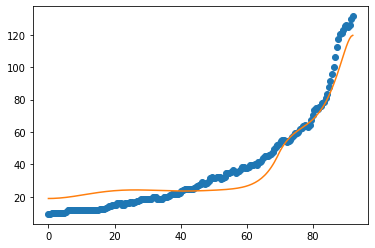

17
after perturb [4.491905590177145, 62.47982054709427, 27298.44968793904, 0.2740392077923001, 23.980560225584945]
parameters [4.491905590177145, 62.47982054709427, 27298.44968793904, 0.2740392077923001, 23.980560225584945]
oxigeno [8.93159640e-07 8.92322852e-07 8.89819442e-07 8.85670135e-07
 8.79909025e-07 8.72582916e-07 8.63750448e-07 8.53481015e-07
 8.41853545e-07 8.28955152e-07 8.14879741e-07 7.99726566e-07
 7.83598830e-07 7.66602317e-07 7.48844117e-07 7.30431460e-07
 7.11470672e-07 6.92066262e-07 6.72320157e-07 6.52331071e-07
 6.32194015e-07 6.11999930e-07 5.91835442e-07 5.71782727e-07
 5.51919470e-07 5.32318916e-07 5.13050002e-07 4.94177559e-07
 4.75762582e-07 4.57862566e-07 4.40531901e-07 4.23822332e-07
 4.07783479e-07 3.92463425e-07 3.77909376e-07 3.64168388e-07
 3.51288184e-07 3.39318054e-07 3.28309856e-07 3.18319114e-07
 3.09406241e-07 3.01637889e-07 2.95088429e-07 2.89841609e-07
 2.85992361e-07 2.83648825e-07 2.82934576e-07 2.83991105e-07
 2.86980569e-07 2.92088854e-07 2.995

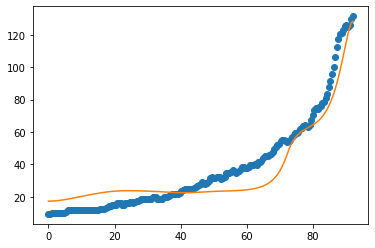

after perturb [6.9763206465329946, 32.83309006255994, 24725.448515003118, 0.04174981007118511, 21.99689380071326]
parameters [6.9763206465329946, 32.83309006255994, 24725.448515003118, 0.04174981007118511, 21.99689380071326]
oxigeno [9.46246423e-02 9.45780697e-02 9.44386534e-02 9.42072938e-02
 9.38854784e-02 9.34752618e-02 9.29792386e-02 9.24005104e-02
 9.17426460e-02 9.10096376e-02 9.02058528e-02 8.93359843e-02
 8.84049966e-02 8.74180736e-02 8.63805653e-02 8.52979359e-02
 8.41757136e-02 8.30194435e-02 8.18346426e-02 8.06267590e-02
 7.94011347e-02 7.81629719e-02 7.69173038e-02 7.56689691e-02
 7.44225901e-02 7.31825555e-02 7.19530050e-02 7.07378189e-02
 6.95406097e-02 6.83647165e-02 6.72132023e-02 6.60888530e-02
 6.49941789e-02 6.39314175e-02 6.29025384e-02 6.19092485e-02
 6.09529999e-02 6.00349975e-02 5.91562081e-02 5.83173705e-02
 5.75190051e-02 5.67614260e-02 5.60447513e-02 5.53689154e-02
 5.47336805e-02 5.41386491e-02 5.35832754e-02 5.30668780e-02
 5.25886507e-02 5.21476752e-02 5.17

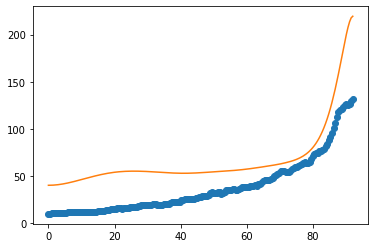

after perturb [-0.5831902879599831, 103.36818927430659, 29112.11228601638, 0.5302013406159614, 34.65762897651588]
parameters [-0.5831902879599831, 103.36818927430659, 29112.11228601638, 0.5302013406159614, 34.65762897651588]
after perturb [4.846061733547129, 61.91898622829028, 28051.447581246866, 0.2913734254555814, 37.467234213622454]
parameters [4.846061733547129, 61.91898622829028, 28051.447581246866, 0.2913734254555814, 37.467234213622454]
oxigeno [5.24742186e-07 5.24234841e-07 5.22717024e-07 5.20201304e-07
 5.16708368e-07 5.12266629e-07 5.06911712e-07 5.00685808e-07
 4.93636951e-07 4.85818215e-07 4.77286869e-07 4.68103518e-07
 4.58331239e-07 4.48034757e-07 4.37279651e-07 4.26131634e-07
 4.14655890e-07 4.02916501e-07 3.90975952e-07 3.78894718e-07
 3.66730940e-07 3.54540173e-07 3.42375216e-07 3.30286007e-07
 3.18319585e-07 3.06520107e-07 2.94928924e-07 2.83584702e-07
 2.72523586e-07 2.61779413e-07 2.51383962e-07 2.41367246e-07
 2.31757842e-07 2.22583269e-07 2.13870401e-07 2.05645935

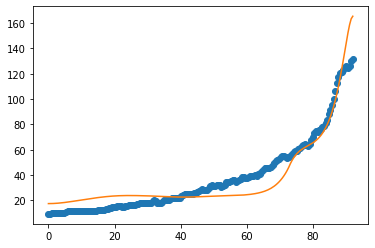

after perturb [4.208961861178626, -55.18648193547989, 15281.152067123805, -0.5206771983617409, 6.430760184506088]
parameters [4.208961861178626, -55.18648193547989, 15281.152067123805, -0.5206771983617409, 6.430760184506088]
after perturb [9.788873518428865, 71.90831995390194, 26610.839099858687, 0.40181730746290767, 36.65871884117203]
parameters [9.788873518428865, 71.90831995390194, 26610.839099858687, 0.40181730746290767, 36.65871884117203]
oxigeno [3.76881157e-09 3.76585955e-09 3.75703264e-09 3.74241810e-09
 3.72216087e-09 3.69646276e-09 3.66558146e-09 3.62982933e-09
 3.58957221e-09 3.54522803e-09 3.49726579e-09 3.44620454e-09
 3.39261293e-09 3.33710920e-09 3.28036184e-09 3.22309122e-09
 3.16607212e-09 3.11013759e-09 3.05618429e-09 3.00517935e-09
 2.95816934e-09 2.91629124e-09 2.88078605e-09 2.85301510e-09
 2.83447959e-09 2.82684370e-09 2.83196189e-09 2.85191064e-09
 2.88902562e-09 2.94594474e-09 3.02565796e-09 3.13156491e-09
 3.26754124e-09 3.43801503e-09 3.64805469e-09 3.90346992

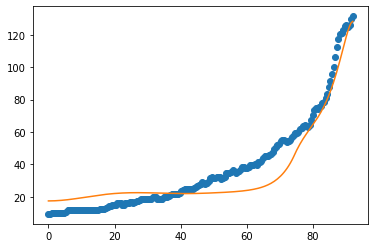

after perturb [6.404427559790035, 69.72200002448349, 19850.35674522601, 0.2014821837089641, 26.607510383732354]
parameters [6.404427559790035, 69.72200002448349, 19850.35674522601, 0.2014821837089641, 26.607510383732354]
after perturb [12.60545914313318, -3.706785145847263, 31129.964470675506, 0.26623321390212246, 38.12998938291092]
parameters [12.60545914313318, -3.706785145847263, 31129.964470675506, 0.26623321390212246, 38.12998938291092]
after perturb [9.491006839308033, 27.593355961775465, 24590.235806793564, 0.054217647511601075, 20.692256004681237]
parameters [9.491006839308033, 27.593355961775465, 24590.235806793564, 0.054217647511601075, 20.692256004681237]
oxigeno [2.69554694e-02 2.69386460e-02 2.68882895e-02 2.68047389e-02
 2.66885545e-02 2.65405109e-02 2.63615869e-02 2.61529542e-02
 2.59159630e-02 2.56521275e-02 2.53631097e-02 2.50507047e-02
 2.47168268e-02 2.43635002e-02 2.39928565e-02 2.36071430e-02
 2.32087442e-02 2.28002084e-02 2.23841949e-02 2.19629148e-02
 2.15382699e

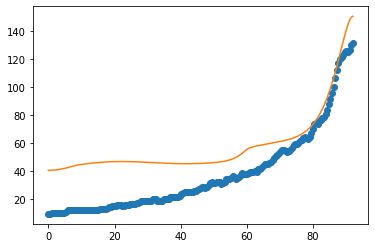

after perturb [10.945221448434667, 29.82084766589227, 17912.96780496712, -0.19058266207309565, 9.481174254059797]
parameters [10.945221448434667, 29.82084766589227, 17912.96780496712, -0.19058266207309565, 9.481174254059797]
after perturb [12.995764743493826, 115.82096728359525, 21052.16240815535, 0.3717589293270212, 21.016338137057286]
parameters [12.995764743493826, 115.82096728359525, 21052.16240815535, 0.3717589293270212, 21.016338137057286]
after perturb [9.741490800025996, 71.44170105194462, 26597.102265420697, 0.4254294165836428, 28.697008178329735]
parameters [9.741490800025996, 71.44170105194462, 26597.102265420697, 0.4254294165836428, 28.697008178329735]
oxigeno [1.27273641e-09 1.27175781e-09 1.26883355e-09 1.26399827e-09
 1.25730956e-09 1.24884786e-09 1.23871625e-09 1.22704030e-09
 1.21396792e-09 1.19966928e-09 1.18433691e-09 1.16818598e-09
 1.15145475e-09 1.13440550e-09 1.11732571e-09 1.10052986e-09
 1.08436174e-09 1.06919746e-09 1.05544934e-09 1.04357063e-09
 1.03406139e-0

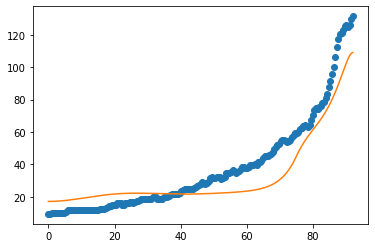

after perturb [-0.3213254191927155, 165.51238706284306, 28562.032307772366, 0.6120652054034033, 28.719980202161977]
parameters [-0.3213254191927155, 165.51238706284306, 28562.032307772366, 0.6120652054034033, 28.719980202161977]
after perturb [8.672972660012855, 113.46616422493035, 15937.642022107324, 0.38271129370317514, 19.46918843469555]
parameters [8.672972660012855, 113.46616422493035, 15937.642022107324, 0.38271129370317514, 19.46918843469555]
after perturb [11.796139121018744, 39.61353414054667, 16333.684968183847, -0.032772901430025994, 4.609801412311814]
parameters [11.796139121018744, 39.61353414054667, 16333.684968183847, -0.032772901430025994, 4.609801412311814]
after perturb [11.670038288283536, 164.7090507794677, 31075.619678801482, 0.9307580125400055, 32.15321809039247]
parameters [11.670038288283536, 164.7090507794677, 31075.619678801482, 0.9307580125400055, 32.15321809039247]
after perturb [-1.917166056303571, 203.08658066065618, 25073.58714848049, 0.4917644113145763, 

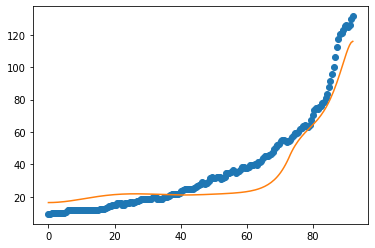

after perturb [5.631648177275368, 114.56791069456858, 26865.786720131768, 0.6614276340191747, 44.49253004623776]
parameters [5.631648177275368, 114.56791069456858, 26865.786720131768, 0.6614276340191747, 44.49253004623776]
oxigeno [7.76157307e-11 7.82298359e-11 8.00820040e-11 8.32019746e-11
 8.76399245e-11 9.34673956e-11 1.00778618e-10 1.09692252e-10
 1.20353583e-10 1.32937206e-10 1.47650255e-10 1.64736234e-10
 1.84479524e-10 2.07210644e-10 2.33312381e-10 2.63226881e-10
 2.97463865e-10 3.36610096e-10 3.81340300e-10 4.32429740e-10
 4.90768674e-10 5.57378987e-10 6.33433295e-10 7.20276883e-10
 8.19452903e-10 9.32731265e-10 1.06214179e-09 1.21001221e-09
 1.37901171e-09 1.57220077e-09 1.79308827e-09 2.04569672e-09
 2.33463696e-09 2.66519341e-09 3.04342147e-09 3.47625865e-09
 3.97165142e-09 4.53869966e-09 5.18782143e-09 5.93094047e-09
 6.78169977e-09 7.75570445e-09 8.87079821e-09 1.01473775e-08
 1.16087486e-08 1.32815341e-08 1.51961334e-08 1.73872475e-08
 1.98944733e-08 2.27629803e-08 2.6044

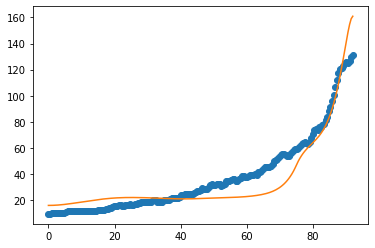

after perturb [10.008533438966369, 65.993383584391, 19978.6705953616, -0.14705047834898893, -3.9925842074158133]
parameters [10.008533438966369, 65.993383584391, 19978.6705953616, -0.14705047834898893, -3.9925842074158133]
after perturb [6.526201846819081, -16.73933504182736, 25216.358227215787, -0.18986345117517178, 26.789131592295178]
parameters [6.526201846819081, -16.73933504182736, 25216.358227215787, -0.18986345117517178, 26.789131592295178]
after perturb [4.606728170651433, 75.8393107598586, 19232.1736353699, -0.06384767192243501, -1.7741726438104664]
parameters [4.606728170651433, 75.8393107598586, 19232.1736353699, -0.06384767192243501, -1.7741726438104664]
after perturb [2.3130773138152074, 91.60917937323916, 28318.831258736802, 0.6930452690998038, 45.41841789515089]
parameters [2.3130773138152074, 91.60917937323916, 28318.831258736802, 0.6930452690998038, 45.41841789515089]
oxigeno [1.82760856e-12 1.84618851e-12 1.90233271e-12 1.99726447e-12
 2.13305731e-12 2.31268771e-12 2.

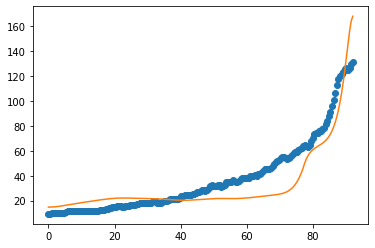

after perturb [14.500668589823333, -5.103405416203962, 17364.24353038325, -0.14765292704075833, 10.41775668942864]
parameters [14.500668589823333, -5.103405416203962, 17364.24353038325, -0.14765292704075833, 10.41775668942864]
after perturb [2.8174227159081715, 173.61597765466965, 25529.289910432402, 0.6499028104427617, 28.141347688764114]
parameters [2.8174227159081715, 173.61597765466965, 25529.289910432402, 0.6499028104427617, 28.141347688764114]
after perturb [-0.9879786268765409, 187.54473535466292, 19196.937586555872, 0.6532625072155032, 17.889632507123007]
parameters [-0.9879786268765409, 187.54473535466292, 19196.937586555872, 0.6532625072155032, 17.889632507123007]
after perturb [2.991536573766057, 134.31599553435382, 23949.95112262165, 0.0995171149208198, 2.010017899683106]
parameters [2.991536573766057, 134.31599553435382, 23949.95112262165, 0.0995171149208198, 2.010017899683106]
oxigeno [8.65100262e-04 8.65143427e-04 8.65275157e-04 8.65502140e-04
 8.65835439e-04 8.66290383e

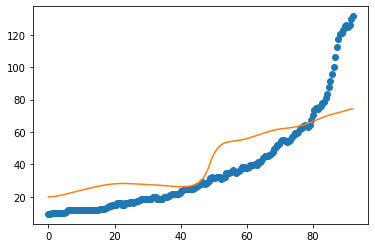

after perturb [6.207096940743809, 112.4802300732291, 24087.875000521974, 0.393736745043214, 24.82788148905433]
parameters [6.207096940743809, 112.4802300732291, 24087.875000521974, 0.393736745043214, 24.82788148905433]
oxigeno [1.66194272e-08 1.66840354e-08 1.68786113e-08 1.72054173e-08
 1.76682545e-08 1.82725085e-08 1.90252145e-08 1.99351422e-08
 2.10129019e-08 2.22710729e-08 2.37243558e-08 2.53897511e-08
 2.72867648e-08 2.94376462e-08 3.18676583e-08 3.46053849e-08
 3.76830798e-08 4.11370597e-08 4.50081475e-08 4.93421711e-08
 5.41905232e-08 5.96107889e-08 6.56674491e-08 7.24326676e-08
 7.99871706e-08 8.84212296e-08 9.78357579e-08 1.08343534e-07
 1.20070563e-07 1.33157597e-07 1.47761820e-07 1.64058724e-07
 1.82244199e-07 2.02536841e-07 2.25180524e-07 2.50447246e-07
 2.78640283e-07 3.10097683e-07 3.45196131e-07 3.84355228e-07
 4.28042226e-07 4.76777253e-07 5.31139101e-07 5.91771612e-07
 6.59390740e-07 7.34792347e-07 8.18860820e-07 9.12578580e-07
 1.01703659e-06 1.13344594e-06 1.26315068

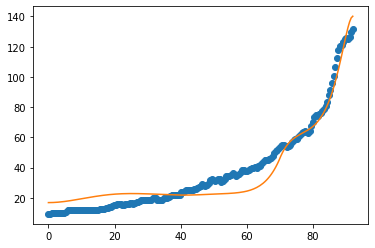

18
after perturb [12.504942489136644, -2.0271146906447655, 19090.671511720448, -0.18512865825290054, 15.631408802845762]
parameters [12.504942489136644, -2.0271146906447655, 19090.671511720448, -0.18512865825290054, 15.631408802845762]
after perturb [11.203511543495564, 102.42301539852966, 18949.137615370866, 0.3379791246227441, 22.64334490925805]
parameters [11.203511543495564, 102.42301539852966, 18949.137615370866, 0.3379791246227441, 22.64334490925805]
after perturb [4.707157389425434, 188.24208849445412, 28146.86787838701, 0.7443477061855115, 30.923643043335453]
parameters [4.707157389425434, 188.24208849445412, 28146.86787838701, 0.7443477061855115, 30.923643043335453]
after perturb [8.798838430311303, 109.48762369506719, 23048.765440483483, 0.5887140235880918, 31.240311619026485]
parameters [8.798838430311303, 109.48762369506719, 23048.765440483483, 0.5887140235880918, 31.240311619026485]
oxigeno [1.64073665e-10 1.65350267e-10 1.69200056e-10 1.75683330e-10
 1.84901743e-10 1.9700

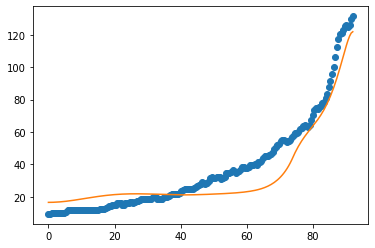

after perturb [5.757758868132383, -11.671453939941301, 24146.03025549497, -0.16792900371539976, 21.56980425076518]
parameters [5.757758868132383, -11.671453939941301, 24146.03025549497, -0.16792900371539976, 21.56980425076518]
after perturb [11.483782558974907, 31.296211641388883, 21441.59258168473, -0.14016618891954918, 10.885284546697866]
parameters [11.483782558974907, 31.296211641388883, 21441.59258168473, -0.14016618891954918, 10.885284546697866]
after perturb [6.192530577383188, 162.18843617326505, 27984.549436317364, 0.5757685822348637, 21.4617518654967]
parameters [6.192530577383188, 162.18843617326505, 27984.549436317364, 0.5757685822348637, 21.4617518654967]
after perturb [7.491309110893239, 158.3294744572637, 24618.01070507918, 0.5565737488493969, 32.22283086777733]
parameters [7.491309110893239, 158.3294744572637, 24618.01070507918, 0.5565737488493969, 32.22283086777733]
after perturb [10.595985205802254, 91.35484130679937, 23343.88001186533, 0.42702453941847635, 19.1253700

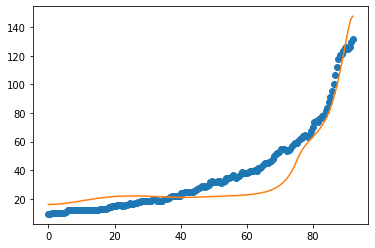

after perturb [2.6217944756696525, 159.0644355636989, 30102.173661787383, 0.847732210803072, 47.48546029440674]
parameters [2.6217944756696525, 159.0644355636989, 30102.173661787383, 0.847732210803072, 47.48546029440674]
after perturb [5.810438929228908, -4.782549618075279, 18677.214788527945, -0.2888410741835903, 18.32854782965757]
parameters [5.810438929228908, -4.782549618075279, 18677.214788527945, -0.2888410741835903, 18.32854782965757]
after perturb [6.299816579967452, 50.691671173724025, 25537.285579658605, 0.4205683947624487, 38.479972772580794]
parameters [6.299816579967452, 50.691671173724025, 25537.285579658605, 0.4205683947624487, 38.479972772580794]
oxigeno [2.60774733e-09 2.60444302e-09 2.59456124e-09 2.57819492e-09
 2.55549692e-09 2.52667716e-09 2.49199867e-09 2.45177274e-09
 2.40635336e-09 2.35613105e-09 2.30152628e-09 2.24298272e-09
 2.18096043e-09 2.11592919e-09 2.04836207e-09 1.97872945e-09
 1.90749355e-09 1.83510351e-09 1.76199118e-09 1.68856749e-09
 1.61521962e-09 

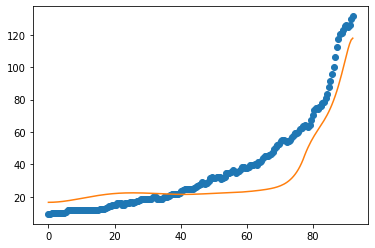

after perturb [7.674956200266037, 20.2406868943194, 21600.25275932127, 0.29471794137293517, 34.400609662831364]
parameters [7.674956200266037, 20.2406868943194, 21600.25275932127, 0.29471794137293517, 34.400609662831364]
oxigeno [4.85870241e-07 4.85014752e-07 4.82458710e-07 4.78233154e-07
 4.72389022e-07 4.64995998e-07 4.56140952e-07 4.45926030e-07
 4.34466460e-07 4.21888158e-07 4.08325185e-07 3.93917166e-07
 3.78806718e-07 3.63136973e-07 3.47049247e-07 3.30680920e-07
 3.14163547e-07 2.97621247e-07 2.81169379e-07 2.64913513e-07
 2.48948684e-07 2.33358940e-07 2.18217134e-07 2.03584957e-07
 1.89513182e-07 1.76042080e-07 1.63201979e-07 1.51013942e-07
 1.39490522e-07 1.28636585e-07 1.18450147e-07 1.08923236e-07
 1.00042732e-07 9.17911826e-08 8.41475858e-08 7.70881126e-08
 7.05867801e-08 6.46160605e-08 5.91474260e-08 5.41518299e-08
 4.96001228e-08 4.54634076e-08 4.17133356e-08 3.83223488e-08
 3.52638709e-08 3.25124535e-08 3.00438819e-08 2.78352446e-08
 2.58649725e-08 2.41128510e-08 2.256001

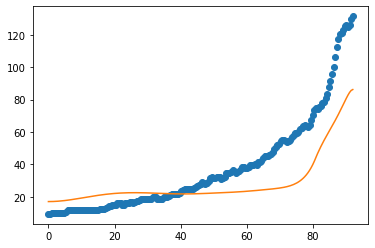

after perturb [9.043593510678903, 75.62551011371635, 27938.02062332408, 0.0451437389010137, 15.840643580380794]
parameters [9.043593510678903, 75.62551011371635, 27938.02062332408, 0.0451437389010137, 15.840643580380794]
oxigeno [ 0.09667562  0.09664912  0.09656975  0.09643787  0.09625412  0.09601933
  0.09573461  0.09540125  0.0950208   0.09459497  0.09412567  0.09361497
  0.09306511  0.09247846  0.09185752  0.09120487  0.0905232   0.08981525
  0.08908383  0.08833178  0.08756195  0.08677721  0.0859804   0.08517438
  0.08436194  0.08354584  0.0827288   0.08191346  0.0811024   0.08029815
  0.07950314  0.07871971  0.07795016  0.07719667  0.07646136  0.07574625
  0.07505329  0.07438437  0.07374127  0.07312575  0.07253948  0.07198407
  0.0714611   0.07097209  0.07051854  0.07010194  0.06972372  0.06938536
  0.06908831  0.06883405  0.06862408  0.06845993  0.06834321  0.06827555
  0.06825868  0.06829442  0.06838467  0.06853144  0.06873687  0.06900325
  0.06933299  0.0697287   0.07019312  0.0

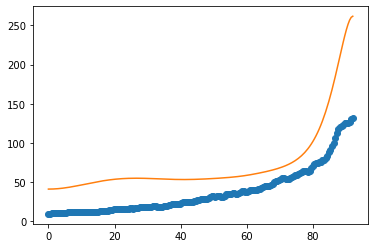

after perturb [8.358095178327096, 111.70197589874627, 23009.39601713329, 0.47186096824942003, 25.232069128684742]
parameters [8.358095178327096, 111.70197589874627, 23009.39601713329, 0.47186096824942003, 25.232069128684742]
oxigeno [2.23356807e-09 2.24685798e-09 2.28689891e-09 2.35420692e-09
 2.44965025e-09 2.57446174e-09 2.73025641e-09 2.91905451e-09
 3.14331035e-09 3.40594740e-09 3.71040006e-09 4.06066278e-09
 4.46134726e-09 4.91774847e-09 5.43592051e-09 6.02276344e-09
 6.68612216e-09 7.43489901e-09 8.27918142e-09 9.23038663e-09
 1.03014254e-08 1.15068872e-08 1.28632489e-08 1.43891109e-08
 1.61054629e-08 1.80359835e-08 2.02073775e-08 2.26497558e-08
 2.53970624e-08 2.84875550e-08 3.19643444e-08 3.58760010e-08
 4.02772356e-08 4.52296627e-08 5.08026580e-08 5.70743181e-08
 6.41325377e-08 7.20762147e-08 8.10166005e-08 9.10788108e-08
 1.02403516e-07 1.15148833e-07 1.29492435e-07 1.45633916e-07
 1.63797429e-07 1.84234632e-07 2.07227974e-07 2.33094372e-07
 2.62189298e-07 2.94911356e-07 3.31

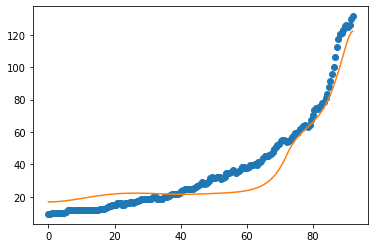

after perturb [13.213424097273553, 22.83176163760672, 24792.069498838715, 0.05380936770731132, 24.90770350649318]
parameters [13.213424097273553, 22.83176163760672, 24792.069498838715, 0.05380936770731132, 24.90770350649318]
after perturb [14.400735290147532, 58.16241944023873, 21605.17800026926, -0.008179411736613254, 15.190515674753852]
parameters [14.400735290147532, 58.16241944023873, 21605.17800026926, -0.008179411736613254, 15.190515674753852]
after perturb [9.738090838753442, 76.01756883901494, 22225.06308636404, 0.2344691377281305, 31.262365762590647]
parameters [9.738090838753442, 76.01756883901494, 22225.06308636404, 0.2344691377281305, 31.262365762590647]
oxigeno [4.54861170e-06 4.54586665e-06 4.53764820e-06 4.52400641e-06
 4.50502411e-06 4.48081618e-06 4.45152843e-06 4.41733626e-06
 4.37844307e-06 4.33507846e-06 4.28749629e-06 4.23597257e-06
 4.18080333e-06 4.12230241e-06 4.06079930e-06 3.99663697e-06
 3.93016991e-06 3.86176218e-06 3.79178574e-06 3.72061891e-06
 3.64864517e

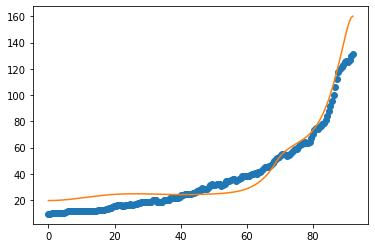

19
after perturb [3.3684340662667176, 129.6761348569705, 21597.948170328244, 0.2315765912748734, 6.9212904097240955]
parameters [3.3684340662667176, 129.6761348569705, 21597.948170328244, 0.2315765912748734, 6.9212904097240955]
oxigeno [5.00477323e-06 5.01033915e-06 5.02709056e-06 5.05518859e-06
 5.09490230e-06 5.14660935e-06 5.21079718e-06 5.28806451e-06
 5.37912327e-06 5.48480126e-06 5.60604521e-06 5.74392477e-06
 5.89963724e-06 6.07451313e-06 6.27002288e-06 6.48778456e-06
 6.72957279e-06 6.99732895e-06 7.29317272e-06 7.61941509e-06
 7.97857292e-06 8.37338511e-06 8.80683041e-06 9.28214711e-06
 9.80285454e-06 1.03727765e-05 1.09960670e-05 1.16772374e-05
 1.24211869e-05 1.32332344e-05 1.41191531e-05 1.50852080e-05
 1.61381951e-05 1.72854846e-05 1.85350654e-05 1.98955939e-05
 2.13764447e-05 2.29877652e-05 2.47405323e-05 2.66466136e-05
 2.87188317e-05 3.09710316e-05 3.34181535e-05 3.60763090e-05
 3.89628637e-05 4.20965245e-05 4.54974344e-05 4.91872750e-05
 5.31893770e-05 5.75288410e-05 6

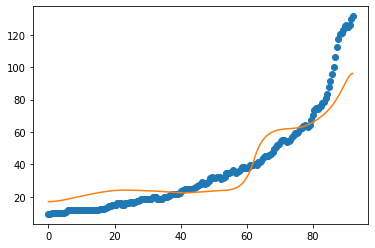

after perturb [-1.4384827785038805, 252.80716959628882, 20445.14963371734, 0.8038176125165182, 13.581959064811741]
parameters [-1.4384827785038805, 252.80716959628882, 20445.14963371734, 0.8038176125165182, 13.581959064811741]
after perturb [7.044830998359447, 92.63766650577168, 19042.720506581343, 0.4664160004875865, 31.345839753806644]
parameters [7.044830998359447, 92.63766650577168, 19042.720506581343, 0.4664160004875865, 31.345839753806644]
after perturb [1.1475174802779942, 124.21579235230983, 29241.116424149615, 0.7256224687994559, 26.690098975682147]
parameters [1.1475174802779942, 124.21579235230983, 29241.116424149615, 0.7256224687994559, 26.690098975682147]
after perturb [12.54531071274647, 51.990365321464594, 27632.73802347659, -0.23684516532586292, 10.01487925217751]
parameters [12.54531071274647, 51.990365321464594, 27632.73802347659, -0.23684516532586292, 10.01487925217751]
after perturb [4.572280389909314, 180.2819368121078, 26709.199276487212, 0.7631232721538851, 21.16

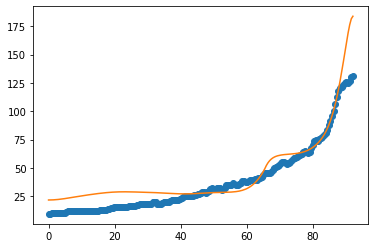

after perturb [5.180622532202164, 98.25705392277698, 27546.0944723138, 0.49790345503861233, 26.241898676381933]
parameters [5.180622532202164, 98.25705392277698, 27546.0944723138, 0.49790345503861233, 26.241898676381933]
oxigeno [3.10460756e-10 3.12293249e-10 3.17820387e-10 3.27131647e-10
 3.40377861e-10 3.57773787e-10 3.79601789e-10 4.06216668e-10
 4.38051746e-10 4.75626302e-10 5.19554494e-10 5.70555939e-10
 6.29468112e-10 6.97260816e-10 7.75052967e-10 8.64131989e-10
 9.65976186e-10 1.08228047e-09 1.21498591e-09 1.36631365e-09
 1.53880380e-09 1.73535990e-09 1.95929991e-09 2.21441447e-09
 2.50503351e-09 2.83610238e-09 3.21326873e-09 3.64298173e-09
 4.13260518e-09 4.69054642e-09 5.32640328e-09 6.05113123e-09
 6.87723362e-09 7.81897792e-09 8.89264139e-09 1.01167900e-08
 1.15125948e-08 1.31041909e-08 1.49190839e-08 1.69886106e-08
 1.93484605e-08 2.20392655e-08 2.51072678e-08 2.86050746e-08
 3.25925118e-08 3.71375888e-08 4.23175890e-08 4.82203024e-08
 5.49454185e-08 6.26060992e-08 7.133075

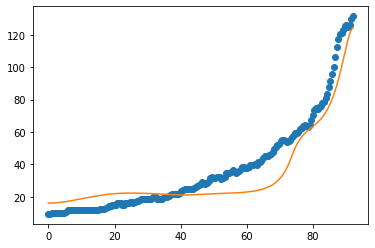

after perturb [6.031119588680143, 181.50705165641597, 24764.48603307511, 0.6597662077193158, 31.215879387615047]
parameters [6.031119588680143, 181.50705165641597, 24764.48603307511, 0.6597662077193158, 31.215879387615047]
after perturb [2.746706918261099, 85.54506706964978, 16953.694242849917, 0.30896484405953617, 32.607775581480325]
parameters [2.746706918261099, 85.54506706964978, 16953.694242849917, 0.30896484405953617, 32.607775581480325]
after perturb [1.016472715959298, 171.24554338904653, 22540.678971852256, 0.7554076437145416, 31.500611182748983]
parameters [1.016472715959298, 171.24554338904653, 22540.678971852256, 0.7554076437145416, 31.500611182748983]
after perturb [3.711331959782574, 45.26506580176037, 16202.99756247559, -0.09981921468486017, 17.521167857336877]
parameters [3.711331959782574, 45.26506580176037, 16202.99756247559, -0.09981921468486017, 17.521167857336877]
after perturb [9.139302966686023, 95.14570452852092, 23706.773031964392, 0.25177465521823283, 15.95267

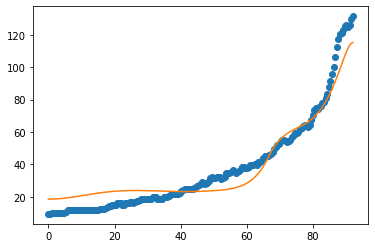

20
parameters [9.486437978871045, 82.74936547758115, 27331.536842201414, 0.2796303956778988, 20.26837726199775]
parameters [5.75546476407478, 84.1777157161946, 22068.283862044947, 0.18796402154252367, 20.876024455594845]
parameters [4.574805052431503, 137.26503214220259, 20976.400911853194, 0.4776045030496735, 24.703029311919245]
parameters [9.933265870522382, 81.48197501848296, 23079.958549089195, 0.17690519353306816, 15.171465509720676]
parameters [4.964651059947039, 136.44051173743446, 23031.298791364836, 0.3612727684571514, 18.46593013005959]
parameters [9.861494644185898, 97.68073745715972, 24801.83626722578, 0.3869729236055053, 25.95577331800348]
parameters [8.379284561912662, 84.96083881934283, 23687.66233565974, 0.25676288159310845, 21.72545576291121]
parameters [9.696349964193043, 145.12219753142736, 24997.995288673417, 0.45185324169320007, 17.613858946556423]
parameters [7.229990899747633, 100.07745056944628, 28042.966570857516, 0.3539258677731214, 28.98487920785288]
paramete

LinAlgError: ignored

In [101]:
sample,weight,dist,data2=principal(epsilons,params_tumor,20,datosdia6)

In [ ]:

print("min accepted distance: ",np.min(dist[-1,:]))
print("median accepted distance: ",np.median(dist[-1,:]))
#print("median evaluated distance: ",np.median(evaluated_distances))


min accepted distance:  52762.668459640554
median accepted distance:  78453.5731954234


In [ ]:
sample[-1,:][0]

[4.863335282515884, 76.61710943048116, 23135.783574618297, 4.356839580423227]

In [ ]:

parameters1= [4.76495877028727, 60.26189054205727, 21996.413967220353, 0.4375711944973535]
parameters2= [5.33584494610712, 73.43027191926723, 24865.310802173808, 0.4067019878331559]
parameters3= [4.649337183907758, 86.27453651399162, 25413.68990399871, 0.5690724364331393]
parameters4= [5.484697901262502, 52.82237178774688, 24042.75079371846, 0.37276522120751276]
parameters5= [4.829888155940412, 80.50026876348845, 28285.7324806885, 0.5259556488822889]

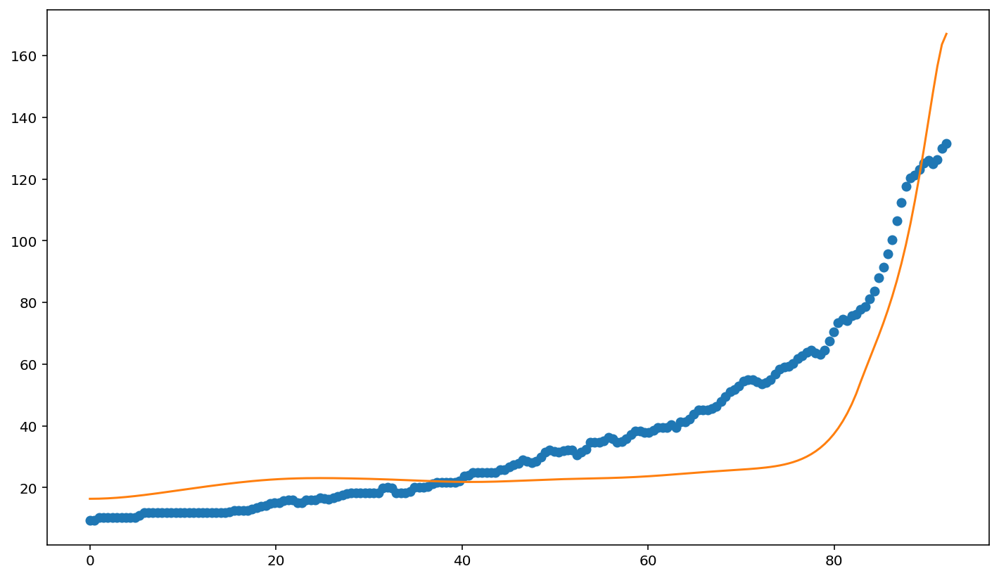

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters1[0],parameters1[1],parameters1[2],U,L,parameters1[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

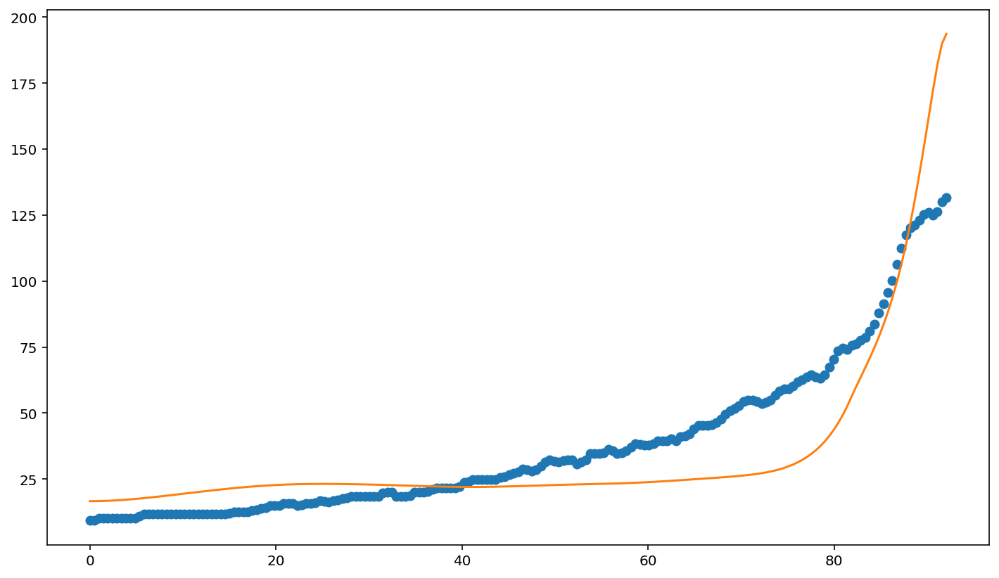

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters2[0],parameters2[1],parameters2[2],U,L,parameters2[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

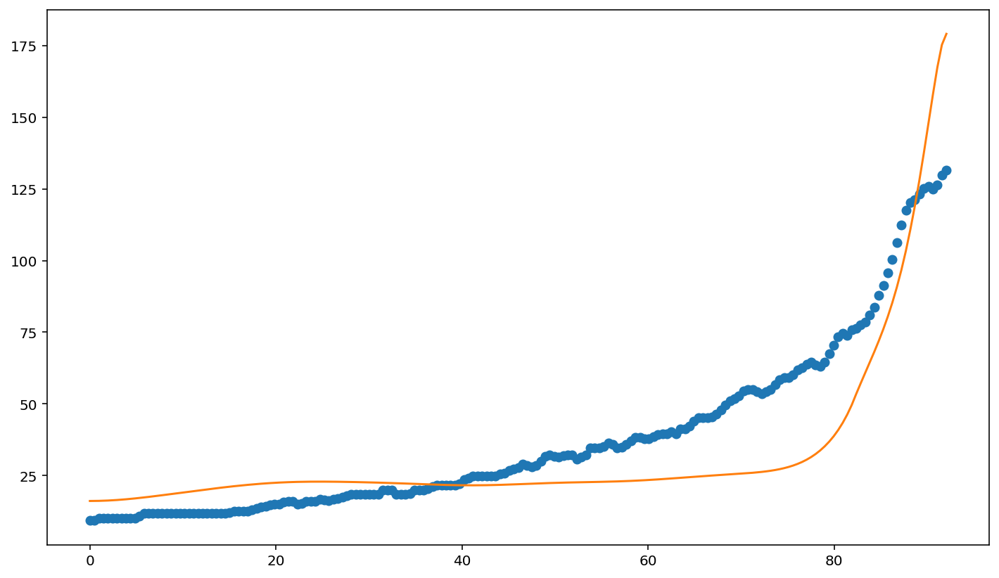

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters3[0],parameters3[1],parameters3[2],U,L,parameters3[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

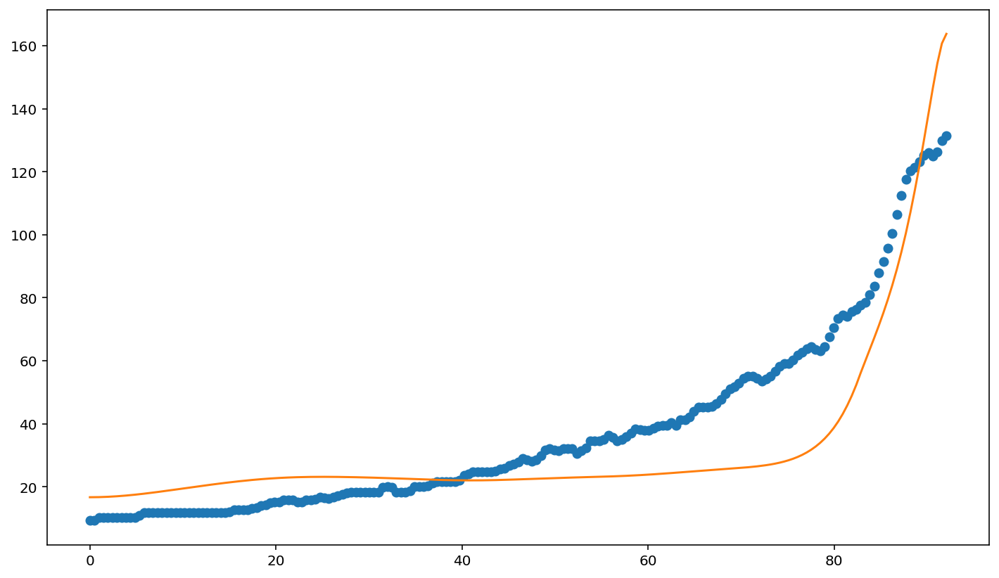

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,parameters4[0],parameters4[1],parameters4[2],U,L,parameters4[3])).T
plt.plot(x_grid,data2[:,0])
plt.show()

In [90]:

par1=[9.542115041431442, 138.12769149357993, 20374.91871033417, 0.3529896285883195, 20.627110075559848]
par2= [8.977198121778752, 124.34165241109605, 20926.58463434697, 0.3305063600502939, 21.224913287022822]
par3= [9.937055517726058, 146.1198643886011, 24672.41030598811, 0.3707739270618551, 20.565197804458247]
par4= [9.672139624093901, 140.98449800335067, 21274.20787613278, 0.3798661916938315, 20.218438649322177]
par5= [9.6544176104716, 149.99488182164566, 26315.829609330478, 0.39574501019744424, 21.407054852869276]
par6= [8.85512822812634, 147.0164538638214, 24847.972695971286, 0.3262684571188478, 17.474140500239752]
par7= [9.424891788943592, 123.52419347497441, 24551.449505433215, 0.30441856727513794, 19.304792427624754]
par8= [7.169050737146994, 135.4964100095985, 22672.85901271742, 0.31560832552030593, 17.369097754944335]
par9= [7.5735153056475, 127.99292914013344, 25027.049968416755, 0.32948057803795194, 20.03638395982498]
par10= [9.836782337165578, 147.0445204077636, 23976.491896002433, 0.34893437180734843, 17.600854984490653]
par11= [8.619221168987565, 116.65737075618758, 23320.488888419903, 0.272220131083114, 18.010989260562262]
par12= [9.860236598961002, 142.91642917513707, 21493.205421622548, 0.3258169821542492, 20.38220463141539]
par13= [8.245915665746406, 148.75208004617403, 23963.294817646107, 0.30302627939732973, 15.70796778230624]
par14= [8.957062078342158, 133.0402607500506, 20173.804540671863, 0.36402378548979414, 20.989631475180467]
par15= [9.342654002288441, 138.96400374800973, 23141.82406515041, 0.298901504531119, 17.753125456818985]
par16= [8.932273718927215, 141.21396045851245, 25201.738604667225, 0.34382126709570937, 20.989583729352965]
par17= [9.040868048757805, 146.37577558039808, 20785.5079169435, 0.4048133924166488, 20.940674882289752]
par18= [7.868015071384048, 132.27649769146413, 20333.012779031178, 0.32894770057717004, 19.011936427243754]
par19= [9.104386520353337, 147.5032342442898, 20263.066289908267, 0.41818189026022323, 22.355672631997578]
par20= [9.865718175738118, 131.09556411135665, 20096.490783504745, 0.34696581403814725, 22.09563711712623]




AttributeError: ignored

In [ ]:
plt.figure()
plt.plot(x_grid,datosdia6,'o')
data2=np.array(euler_expl(fu,g,beta_f,6.457921078526728,63.48150698619373,20184.084434494922,U,L, 0.32259112576927973,36.75737147800398)).T
plt.plot(x_grid,data2[:,0])
plt.show()

NameError: ignored

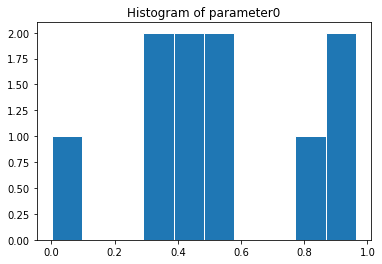

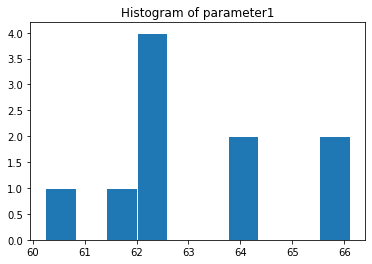

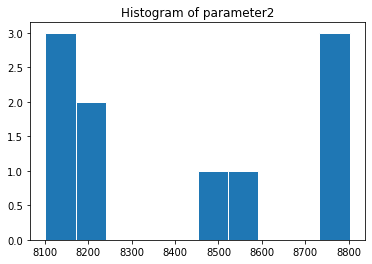

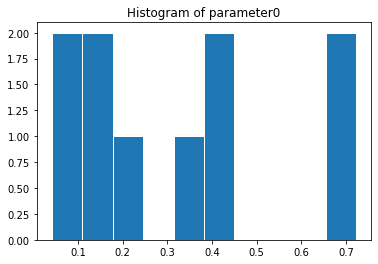

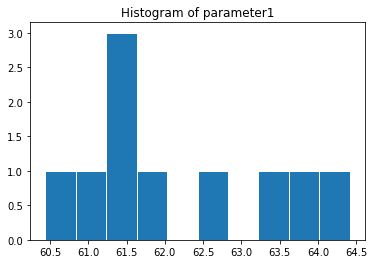

...

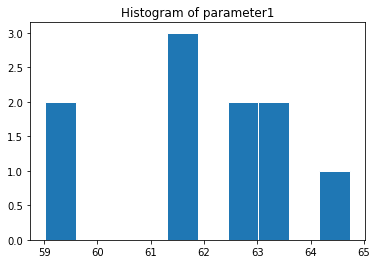

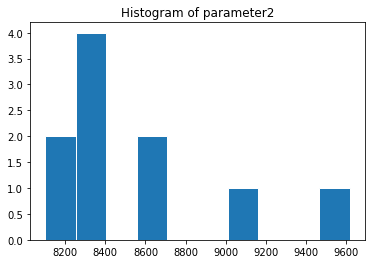

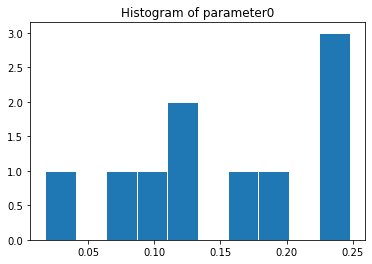

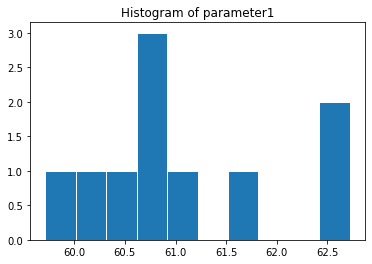

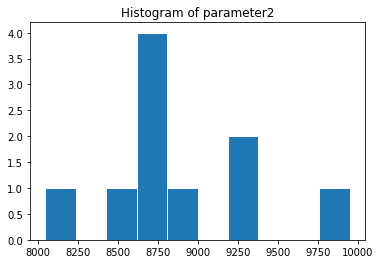

In [ ]:
for k in range(len(epsilons)):
    for j in range(len(params_tumor)):
        plt.figure()
        b=[]
        for i in sample[k,:]:
            b.append(i[j])
        al=np.histogram(b)
        n,bins,patches=plt.hist(b,edgecolor='white')
        plt.title('Histogram of parameter'+str(j))
    plt.show()
plt.show()


In [ ]:
mindis=np.min(dist[-1,:])
mindis

82.15938923923463

In [ ]:
maxdis=np.max(dist)
np.where(dist==mindis)

(array([3]), array([3]))

In [ ]:
maxdis

4281.408060591355

In [ ]:
dist[-1,:]

array([916.92878413, 856.83028974, 657.76463212,  82.15938924,
       195.01326563, 689.78866771, 917.79277168, 706.69752922,
       462.56973763, 720.16895596])